In [1]:
package_path = 'unetmodelscript/'
import sys
sys.path.append(package_path)

In [2]:
import pdb
import os
import cv2
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch.backends.cudnn as cudnn
from torch.utils.data import DataLoader, Dataset
from albumentations import (Normalize, Compose)
from albumentations.pytorch import ToTensor
import torch.utils.data as data
from model import Unet

In [3]:
def make_mask(row_id, df):
    '''Given a row index, return image_id and mask (256, 1600, 4) from the dataframe `df`'''
    fname = df.iloc[row_id].name
    labels = df.iloc[row_id][:4]
    masks = np.zeros((256, 1600, 4), dtype=np.float32)

    for idx, label in enumerate(labels.values):
        if label is not np.nan:
            label = label.split(" ")
            positions = map(int, label[0::2])
            length = map(int, label[1::2])
            mask = np.zeros(256 * 1600, dtype=np.uint8)
            for pos, le in zip(positions, length):
                mask[pos:(pos + le)] = 1
            masks[:, :, idx] = mask.reshape(256, 1600, order='F')
    return fname, masks

In [4]:
class Dataset(Dataset):
    '''Dataset for test prediction'''
    def __init__(self, root, df, mean, std):
        self.root = root
        #df['ImageId'] = df['ImageId_ClassID'].apply(lambda x: x.split('_')[0])
        self.fnames = df['ImageId'].unique().tolist()
        self.num_samples = len(self.fnames)
        self.transform = Compose(
            [
                Normalize(mean=mean, std=std, p=1),
                ToTensor(),
            ]
        )

    def __getitem__(self, idx):
        fname = self.fnames[idx]
        path = os.path.join(self.root, fname)
        image = cv2.imread(path)
        images = self.transform(image=image)["image"]
        return fname, images

    def __len__(self):
        return self.num_samples

In [5]:
def post_process(probability, threshold, min_size):
    '''Post processing of each predicted mask, components with lesser number of pixels
    than `min_size` are ignored'''
    mask = cv2.threshold(probability, threshold, 1, cv2.THRESH_BINARY)[1]
    num_component, component = cv2.connectedComponents(mask.astype(np.uint8))
    predictions = np.zeros((256, 1600), np.float32)
    num = 0
    for c in range(1, num_component):
        p = (component == c)
        if p.sum() > min_size:
            predictions[p] = 1
            num += 1
    return predictions, num

In [6]:
ground_truth_path = 'sample_submission.csv' #"severstal-steel-defect-detection/sample_submission.csv"
dataset_folder = 'test_images'  #"severstal-steel-defect-detection/test_images"

In [7]:
# initialize test dataloader
best_threshold = 0.5
num_workers = 0
batch_size = 1
print('best_threshold', best_threshold)
min_size = 3500
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)
df = pd.read_csv(ground_truth_path)
Dataset = DataLoader(
    Dataset(dataset_folder, df, mean, std),
    batch_size=batch_size,
    shuffle=False,
    num_workers=num_workers,
    #pin_memory=True
)

best_threshold 0.5


In [8]:
# Initialize mode and load trained weights
ckpt_path = "model.pth"
device = torch.device("cuda")
model = Unet("resnet18", encoder_weights=None, classes=4, activation=None)
model.to(device)
model.eval()
state = torch.load(ckpt_path, map_location=lambda storage, loc: storage)
model.load_state_dict(state["state_dict"])

<All keys matched successfully>

  0%|          | 0/5506 [00:00<?, ?it/s]

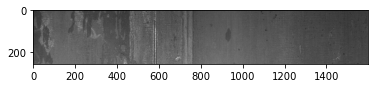

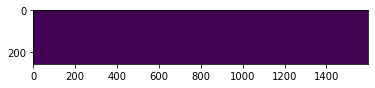

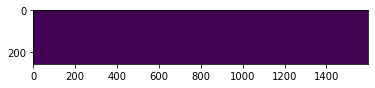

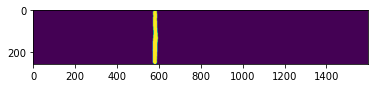

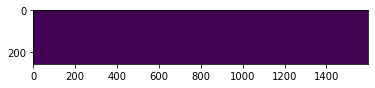

  0%|          | 1/5506 [00:00<1:17:21,  1.19it/s]

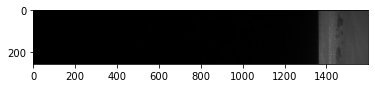

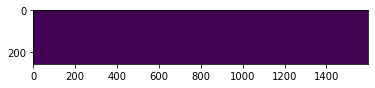

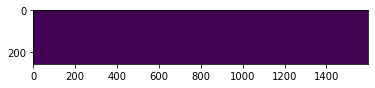

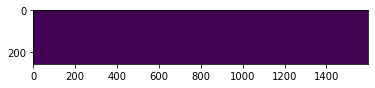

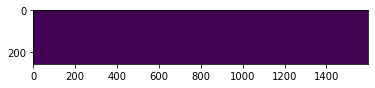

  0%|          | 2/5506 [00:01<1:01:35,  1.49it/s]

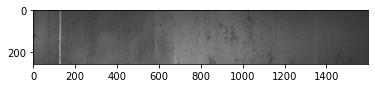

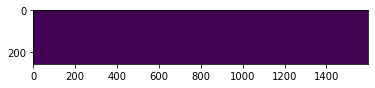

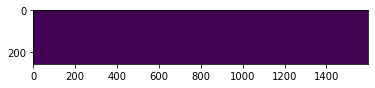

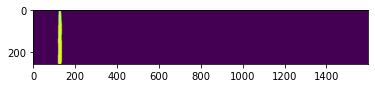

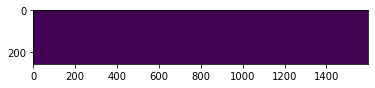

  0%|          | 3/5506 [00:01<55:50,  1.64it/s]  

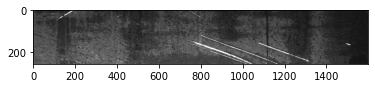

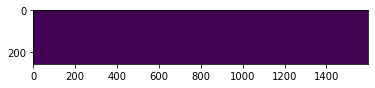

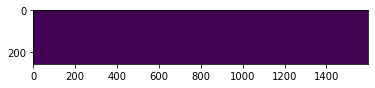

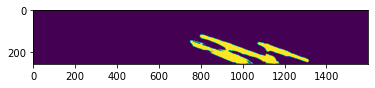

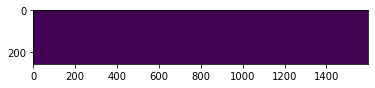

  0%|          | 4/5506 [00:02<56:59,  1.61it/s]

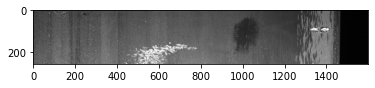

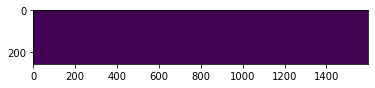

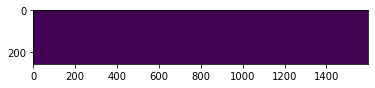

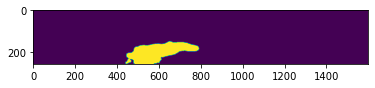

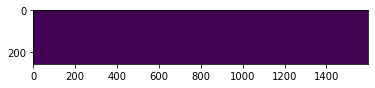

  0%|          | 5/5506 [00:03<54:29,  1.68it/s]

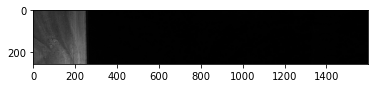

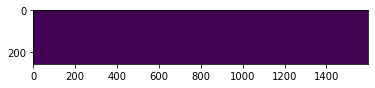

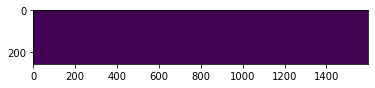

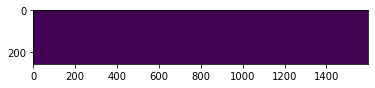

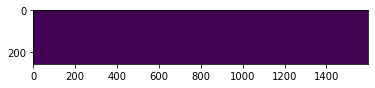

  0%|          | 6/5506 [00:03<52:48,  1.74it/s]

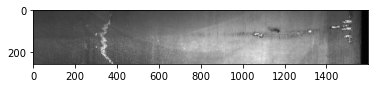

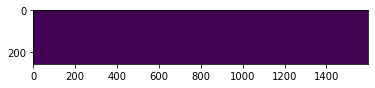

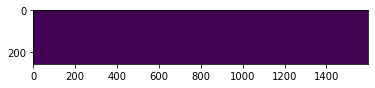

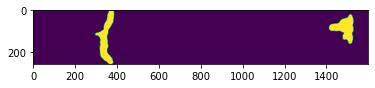

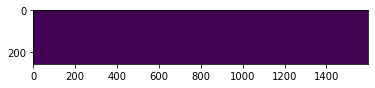

  0%|          | 7/5506 [00:04<51:25,  1.78it/s]

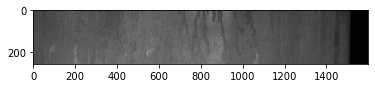

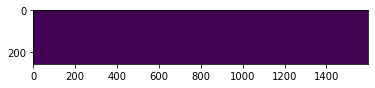

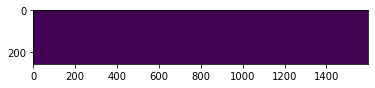

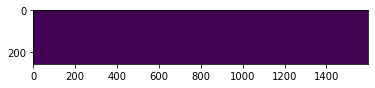

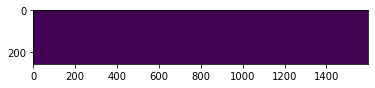

  0%|          | 8/5506 [00:04<53:10,  1.72it/s]

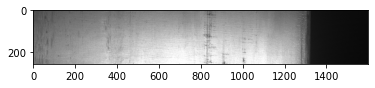

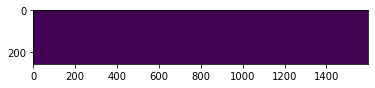

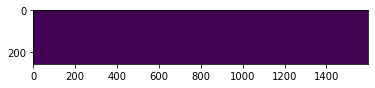

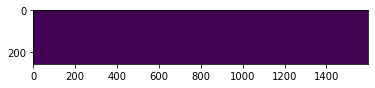

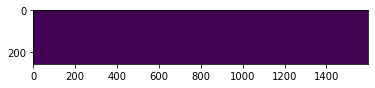

  0%|          | 9/5506 [00:05<51:31,  1.78it/s]

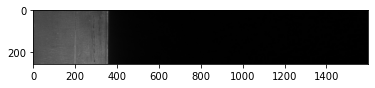

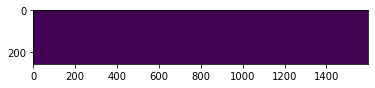

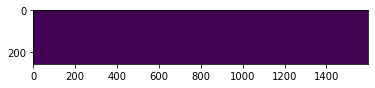

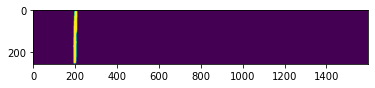

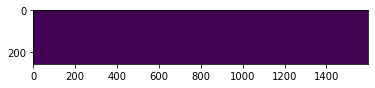

  0%|          | 10/5506 [00:05<50:13,  1.82it/s]

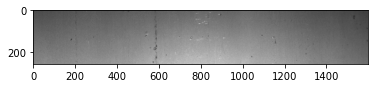

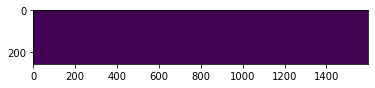

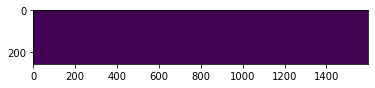

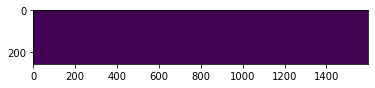

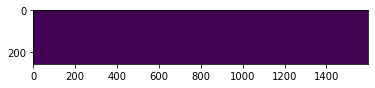

  0%|          | 11/5506 [00:06<51:49,  1.77it/s]

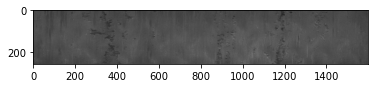

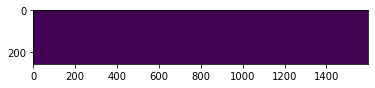

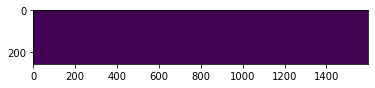

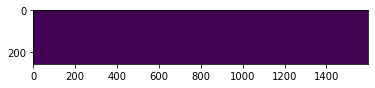

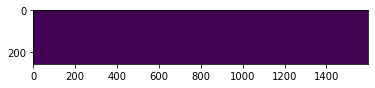

  0%|          | 12/5506 [00:07<51:27,  1.78it/s]

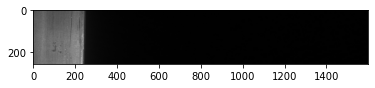

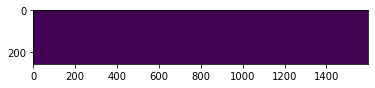

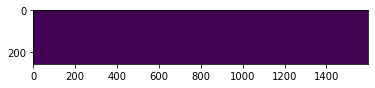

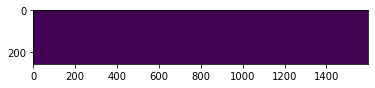

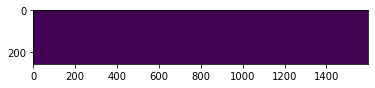

  0%|          | 13/5506 [00:07<50:27,  1.81it/s]

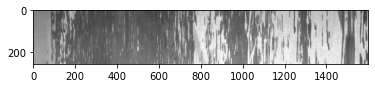

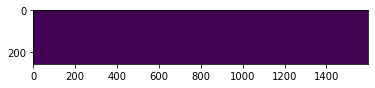

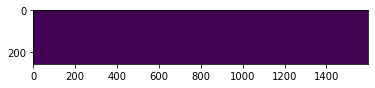

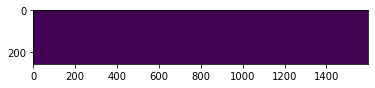

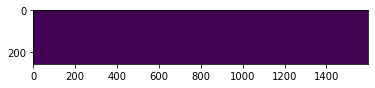

  0%|          | 14/5506 [00:08<49:46,  1.84it/s]

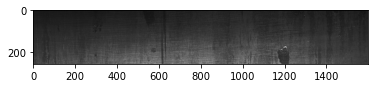

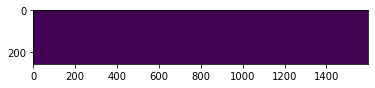

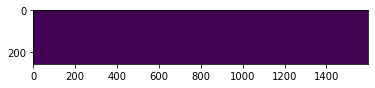

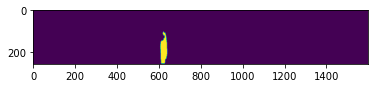

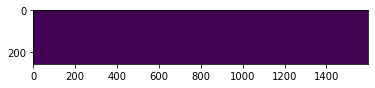

  0%|          | 15/5506 [00:08<51:54,  1.76it/s]

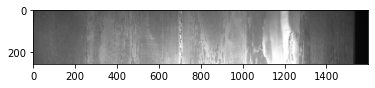

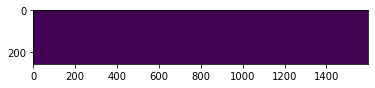

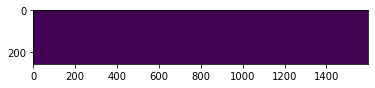

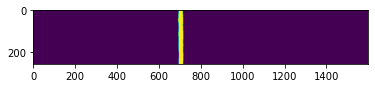

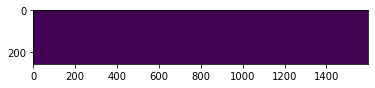

  0%|          | 16/5506 [00:09<51:35,  1.77it/s]

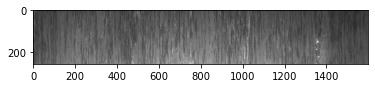

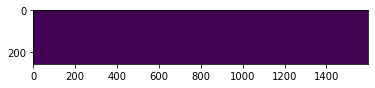

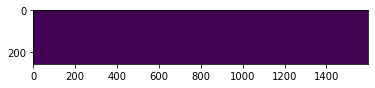

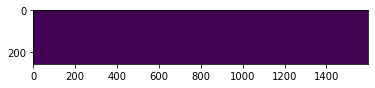

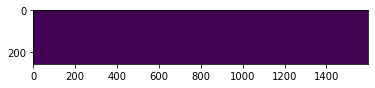

  0%|          | 17/5506 [00:09<50:37,  1.81it/s]

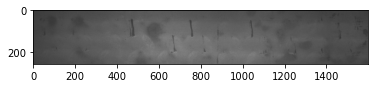

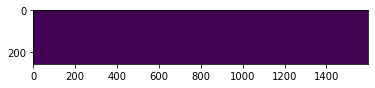

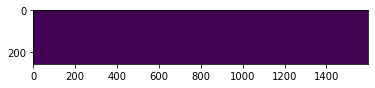

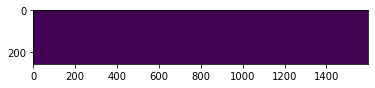

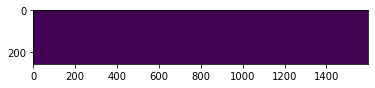

  0%|          | 18/5506 [00:10<52:30,  1.74it/s]

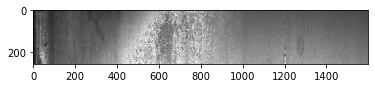

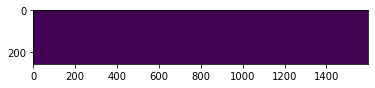

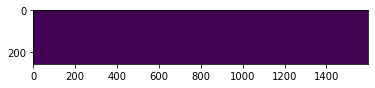

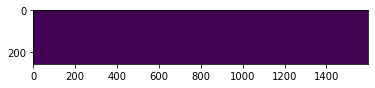

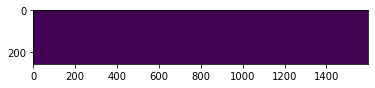

  0%|          | 19/5506 [00:10<51:31,  1.77it/s]

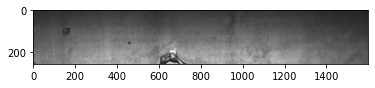

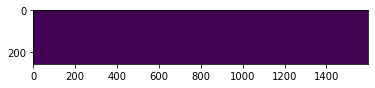

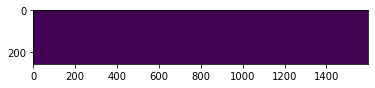

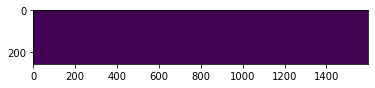

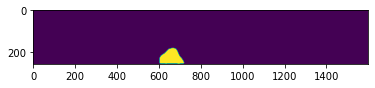

  0%|          | 20/5506 [00:11<50:33,  1.81it/s]

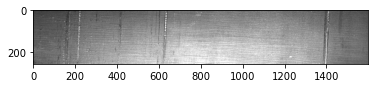

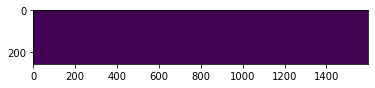

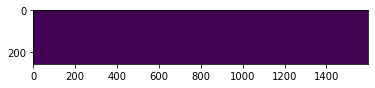

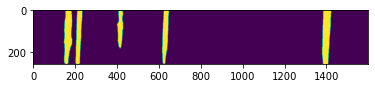

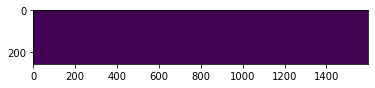

  0%|          | 21/5506 [00:11<49:58,  1.83it/s]

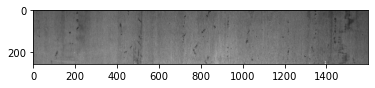

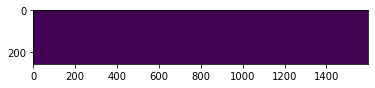

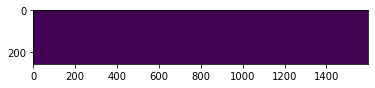

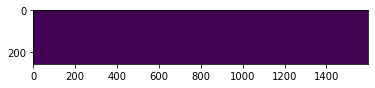

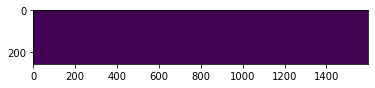

  0%|          | 22/5506 [00:12<51:33,  1.77it/s]

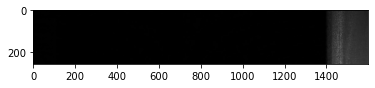

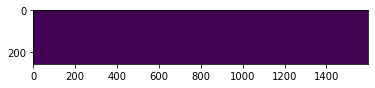

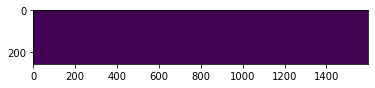

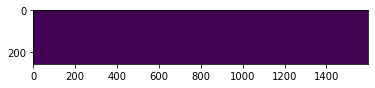

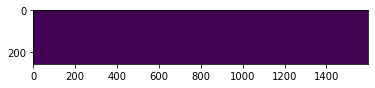

  0%|          | 23/5506 [00:13<51:15,  1.78it/s]

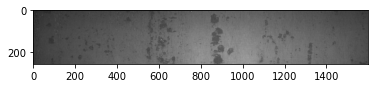

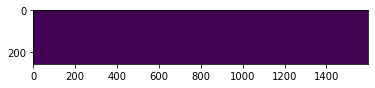

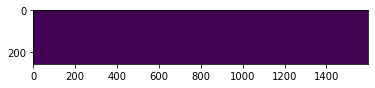

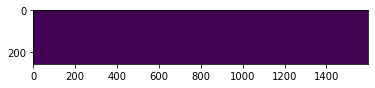

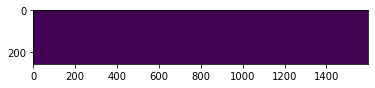

  0%|          | 24/5506 [00:13<50:13,  1.82it/s]

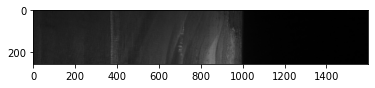

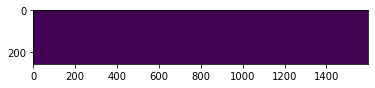

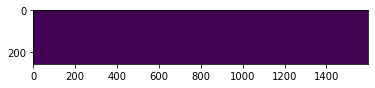

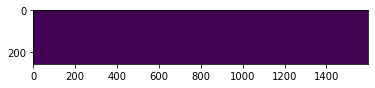

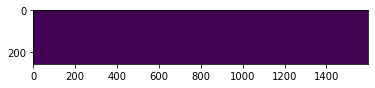

  0%|          | 25/5506 [00:14<49:43,  1.84it/s]

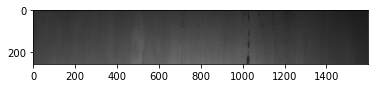

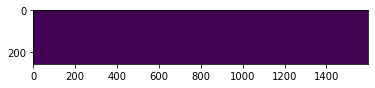

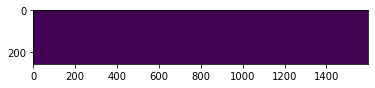

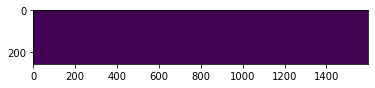

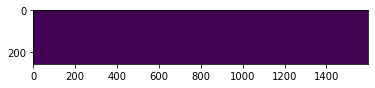

  0%|          | 26/5506 [00:14<51:27,  1.77it/s]

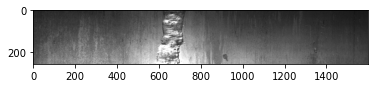

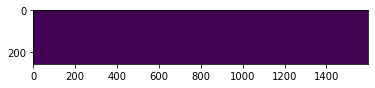

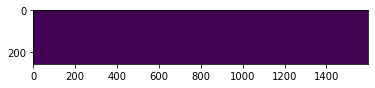

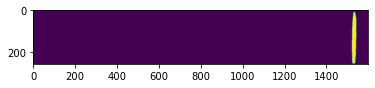

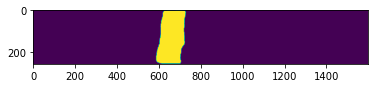

  0%|          | 27/5506 [00:15<50:04,  1.82it/s]

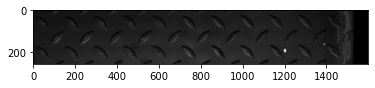

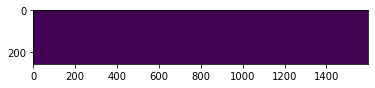

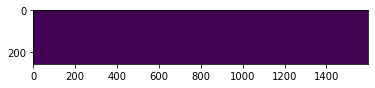

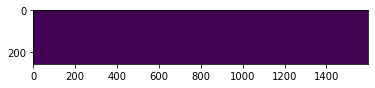

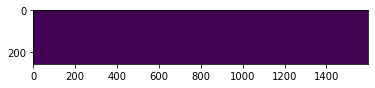

  1%|          | 28/5506 [00:15<49:32,  1.84it/s]

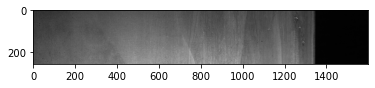

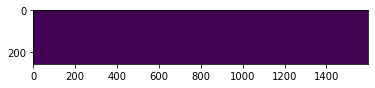

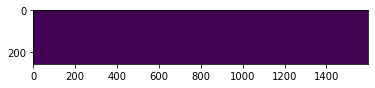

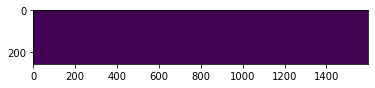

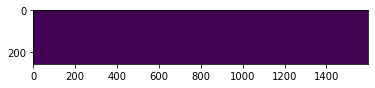

  1%|          | 29/5506 [00:16<51:54,  1.76it/s]

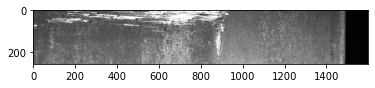

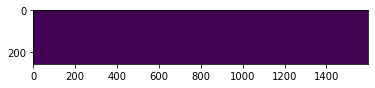

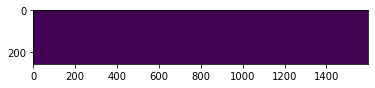

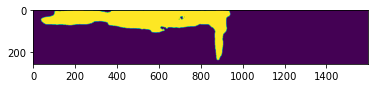

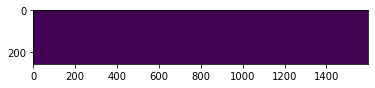

  1%|          | 30/5506 [00:17<51:20,  1.78it/s]

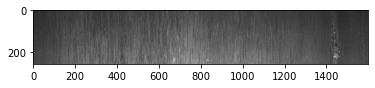

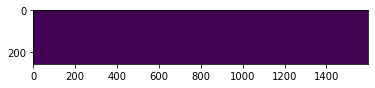

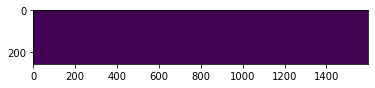

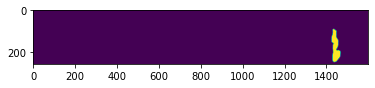

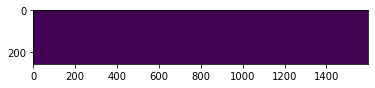

  1%|          | 31/5506 [00:17<51:11,  1.78it/s]

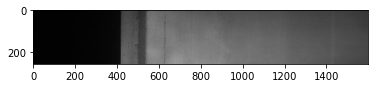

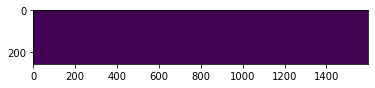

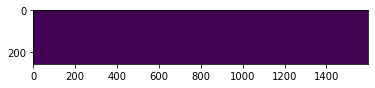

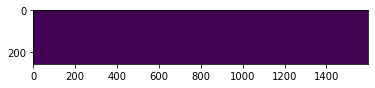

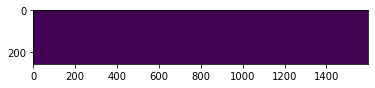

  1%|          | 32/5506 [00:18<50:08,  1.82it/s]

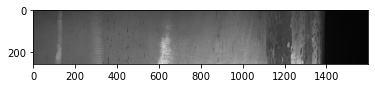

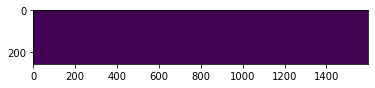

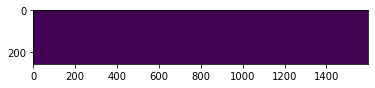

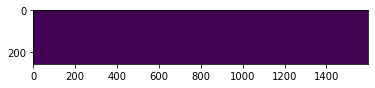

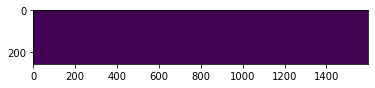

  1%|          | 33/5506 [00:18<51:54,  1.76it/s]

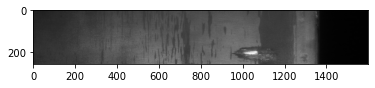

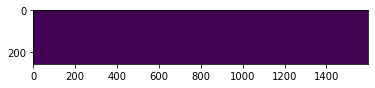

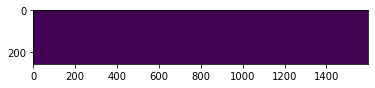

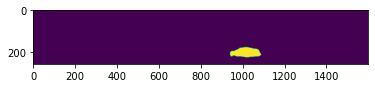

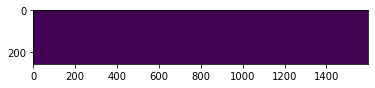

  1%|          | 34/5506 [00:19<50:48,  1.79it/s]

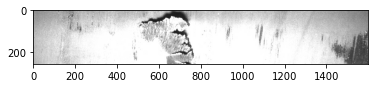

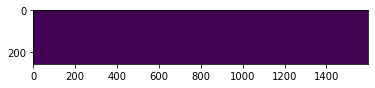

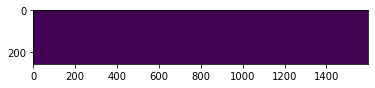

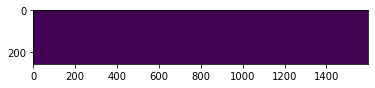

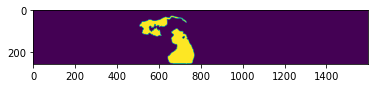

  1%|          | 35/5506 [00:19<50:04,  1.82it/s]

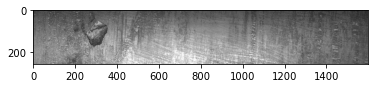

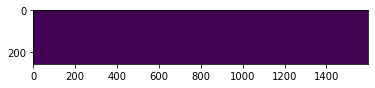

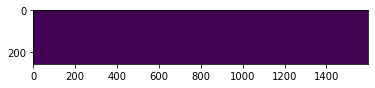

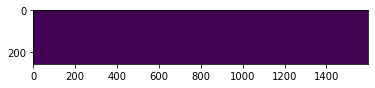

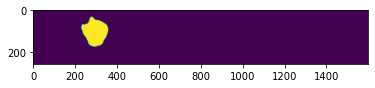

  1%|          | 36/5506 [00:20<51:57,  1.75it/s]

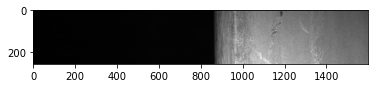

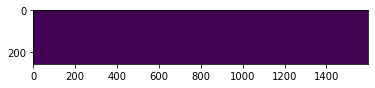

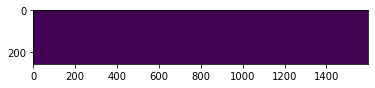

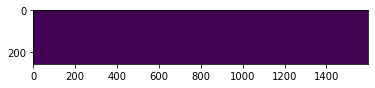

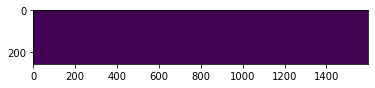

  1%|          | 37/5506 [00:20<51:13,  1.78it/s]

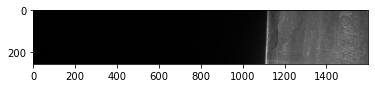

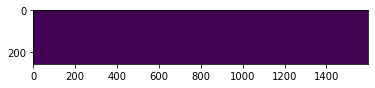

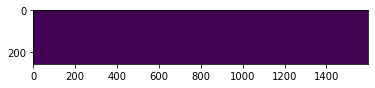

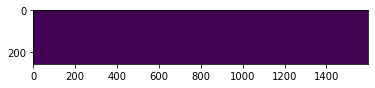

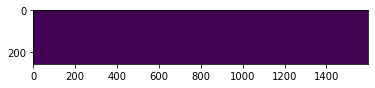

  1%|          | 38/5506 [00:21<50:04,  1.82it/s]

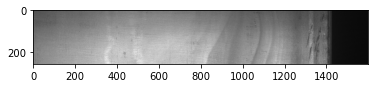

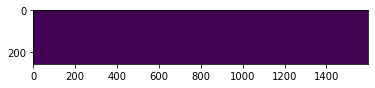

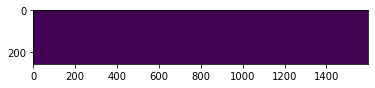

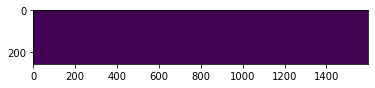

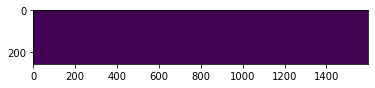

  1%|          | 39/5506 [00:21<49:23,  1.84it/s]

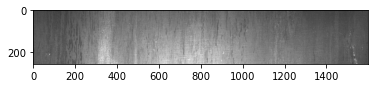

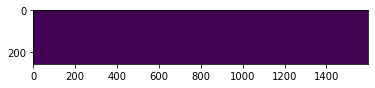

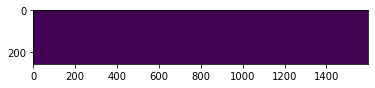

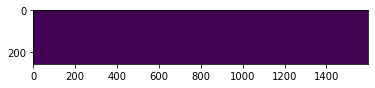

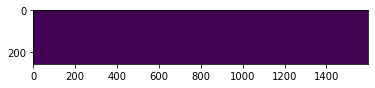

  1%|          | 40/5506 [00:22<51:29,  1.77it/s]

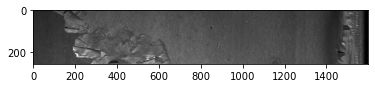

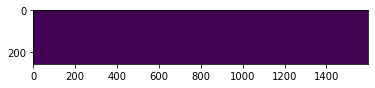

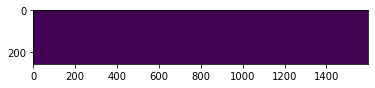

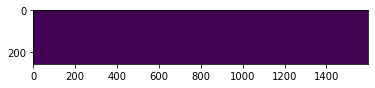

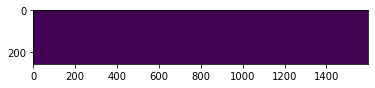

  1%|          | 41/5506 [00:23<50:57,  1.79it/s]

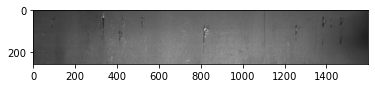

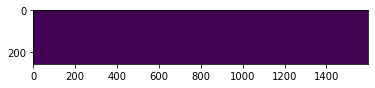

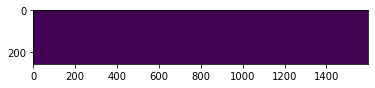

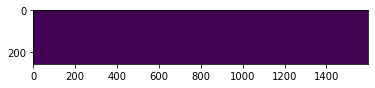

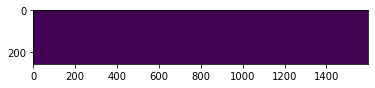

  1%|          | 42/5506 [00:23<50:43,  1.80it/s]

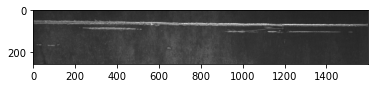

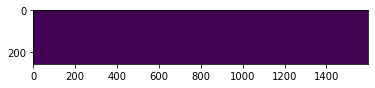

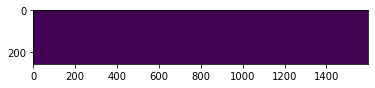

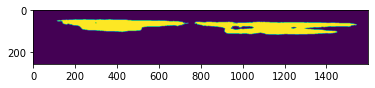

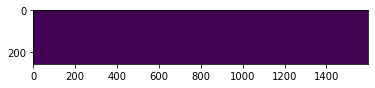

  1%|          | 43/5506 [00:24<50:18,  1.81it/s]

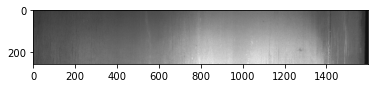

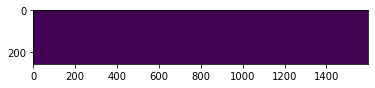

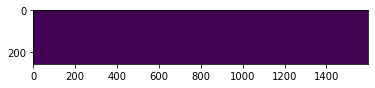

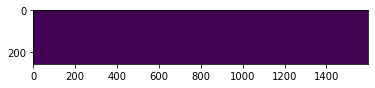

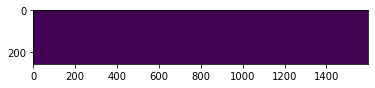

  1%|          | 44/5506 [00:24<51:53,  1.75it/s]

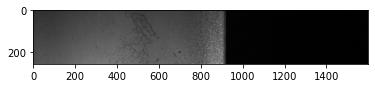

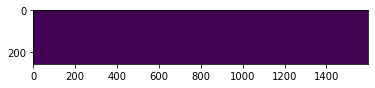

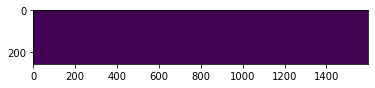

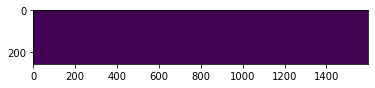

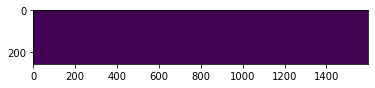

  1%|          | 45/5506 [00:25<50:29,  1.80it/s]

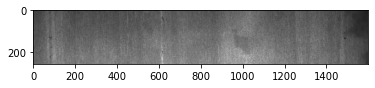

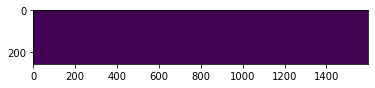

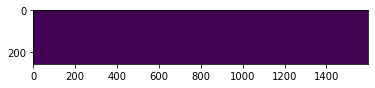

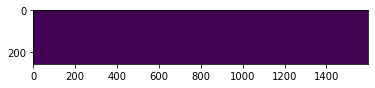

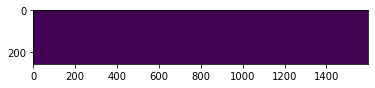

  1%|          | 46/5506 [00:25<49:40,  1.83it/s]

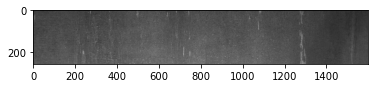

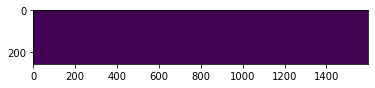

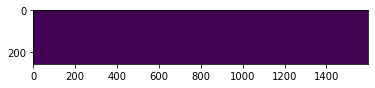

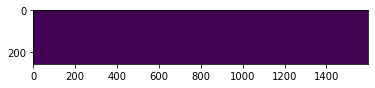

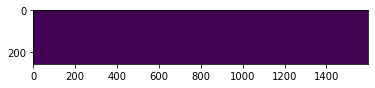

  1%|          | 47/5506 [00:26<52:16,  1.74it/s]

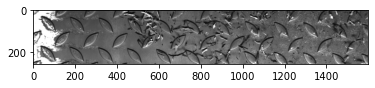

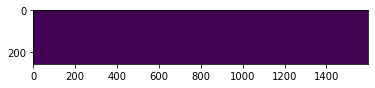

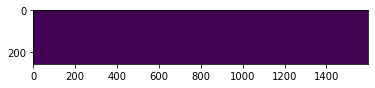

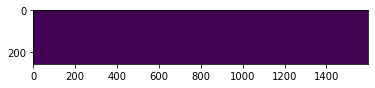

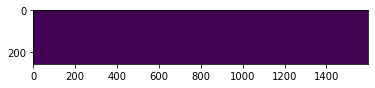

  1%|          | 48/5506 [00:27<50:57,  1.78it/s]

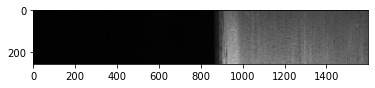

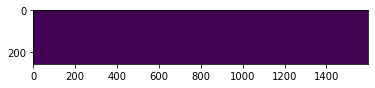

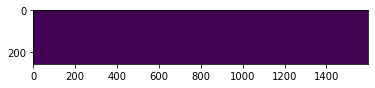

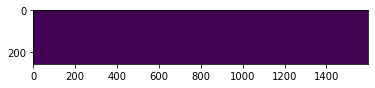

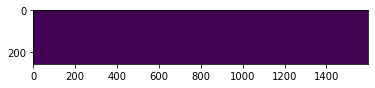

  1%|          | 49/5506 [00:27<49:53,  1.82it/s]

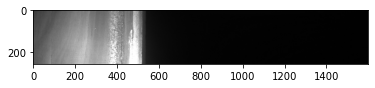

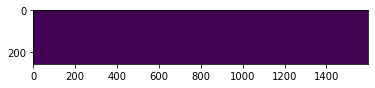

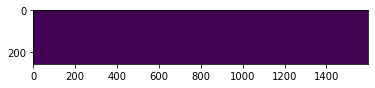

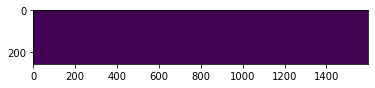

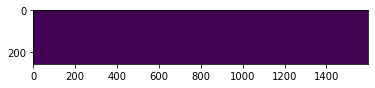

  1%|          | 50/5506 [00:28<49:09,  1.85it/s]

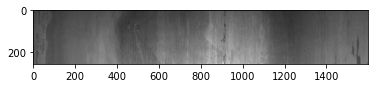

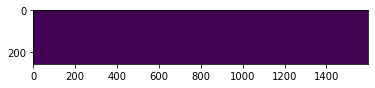

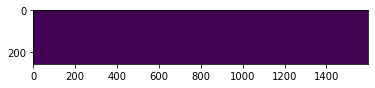

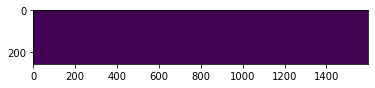

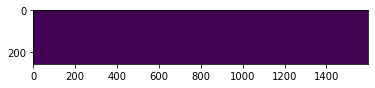

  1%|          | 51/5506 [00:28<51:07,  1.78it/s]

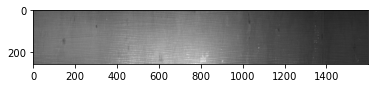

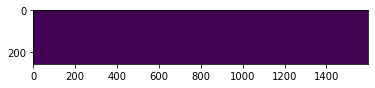

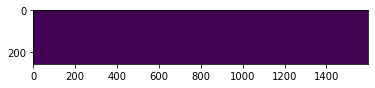

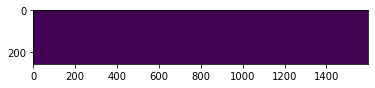

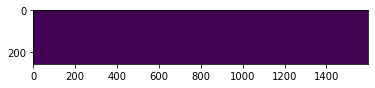

  1%|          | 52/5506 [00:29<50:57,  1.78it/s]

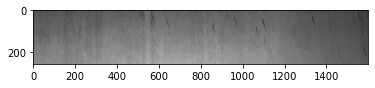

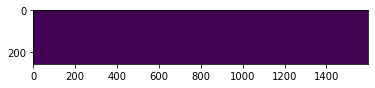

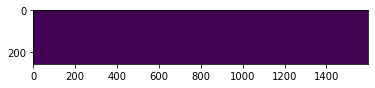

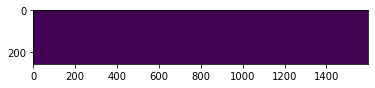

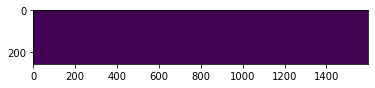

  1%|          | 53/5506 [00:29<49:54,  1.82it/s]

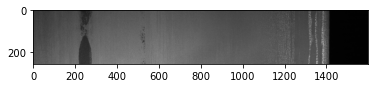

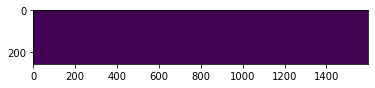

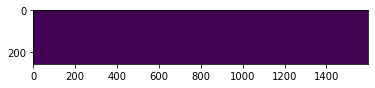

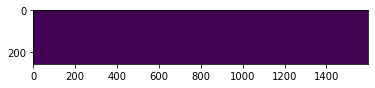

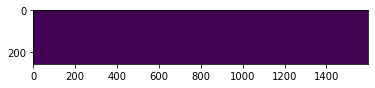

  1%|          | 54/5506 [00:30<51:26,  1.77it/s]

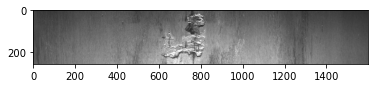

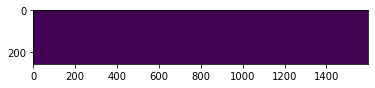

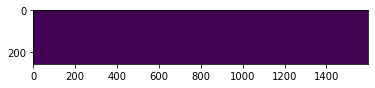

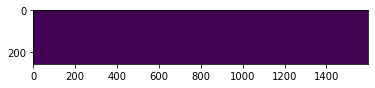

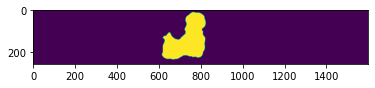

  1%|          | 55/5506 [00:30<50:08,  1.81it/s]

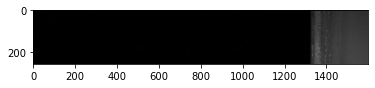

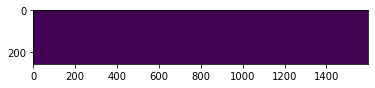

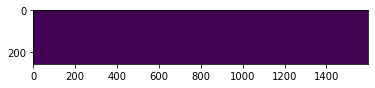

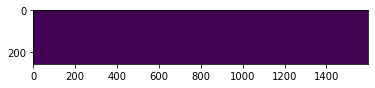

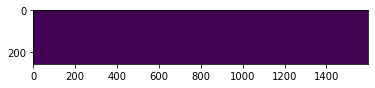

  1%|          | 56/5506 [00:31<49:27,  1.84it/s]

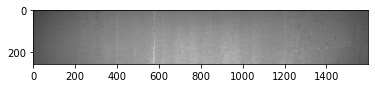

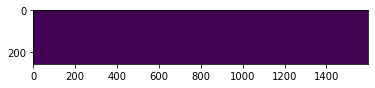

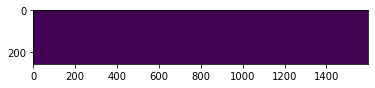

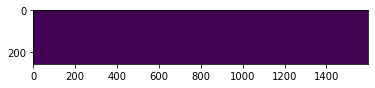

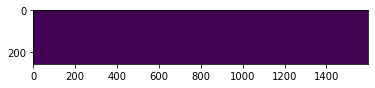

  1%|          | 57/5506 [00:31<48:57,  1.86it/s]

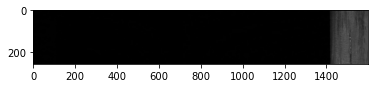

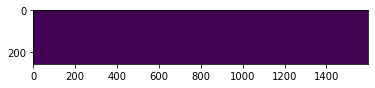

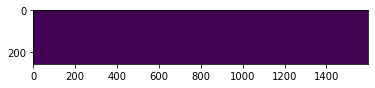

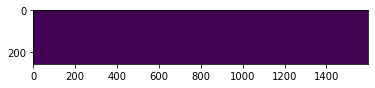

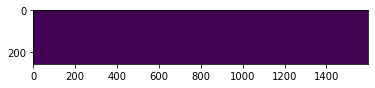

  1%|          | 58/5506 [00:32<50:55,  1.78it/s]

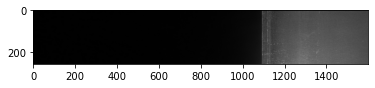

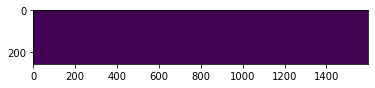

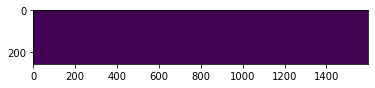

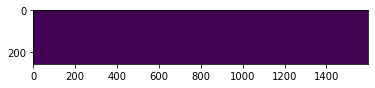

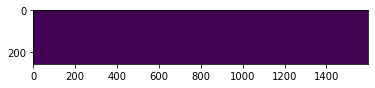

  1%|          | 59/5506 [00:33<49:48,  1.82it/s]

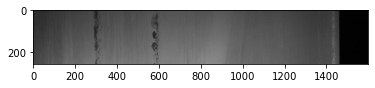

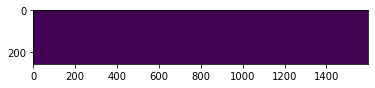

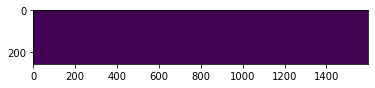

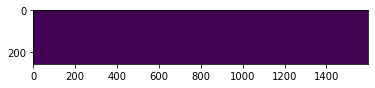

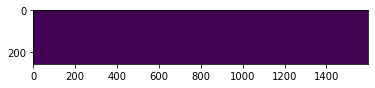

  1%|          | 60/5506 [00:33<49:05,  1.85it/s]

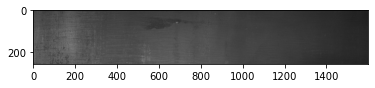

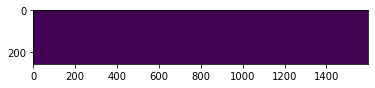

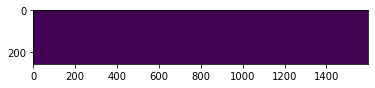

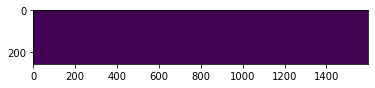

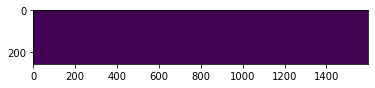

  1%|          | 61/5506 [00:34<48:31,  1.87it/s]

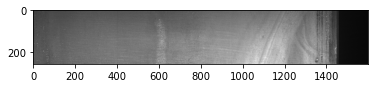

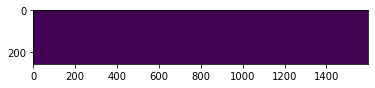

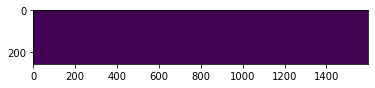

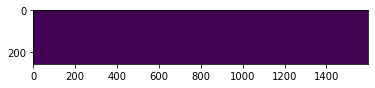

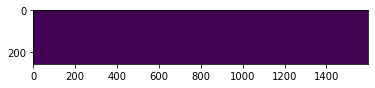

  1%|          | 62/5506 [00:34<50:54,  1.78it/s]

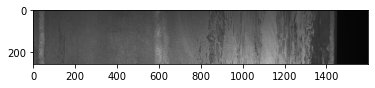

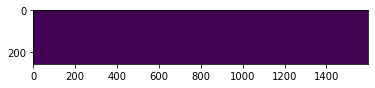

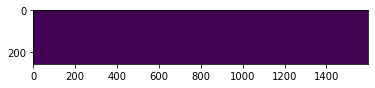

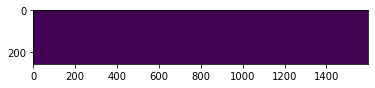

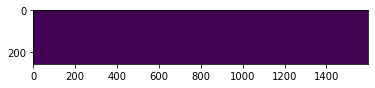

  1%|          | 63/5506 [00:35<49:49,  1.82it/s]

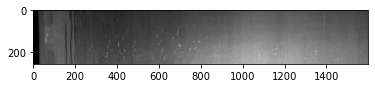

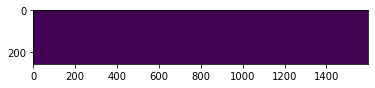

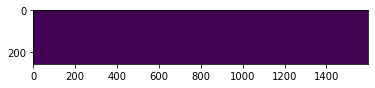

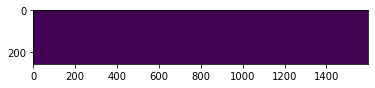

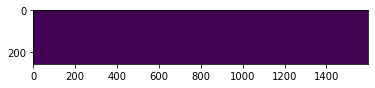

  1%|          | 64/5506 [00:35<49:13,  1.84it/s]

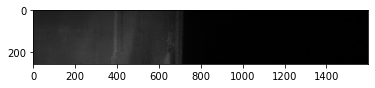

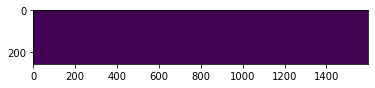

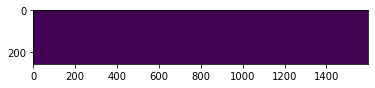

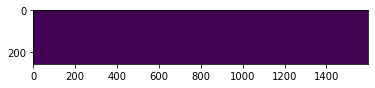

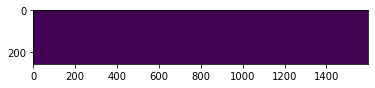

  1%|          | 65/5506 [00:36<50:51,  1.78it/s]

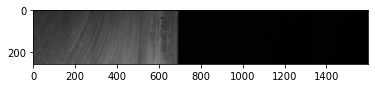

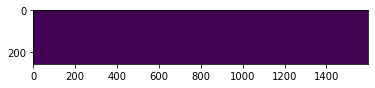

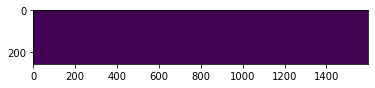

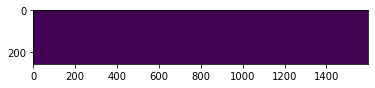

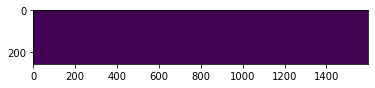

  1%|          | 66/5506 [00:36<49:28,  1.83it/s]

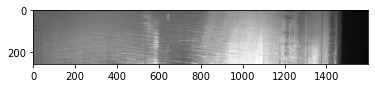

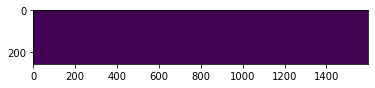

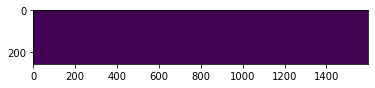

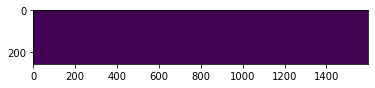

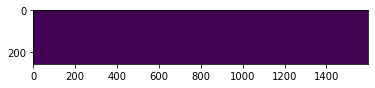

  1%|          | 67/5506 [00:37<48:44,  1.86it/s]

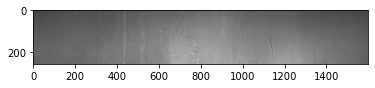

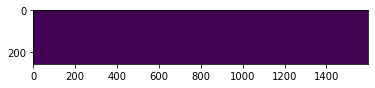

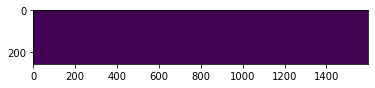

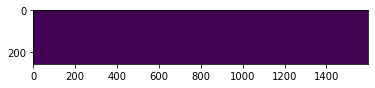

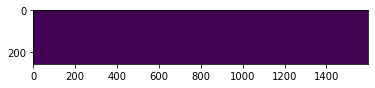

  1%|          | 68/5506 [00:37<48:19,  1.88it/s]

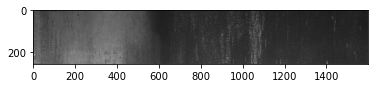

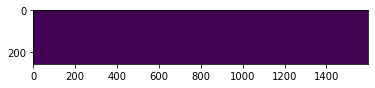

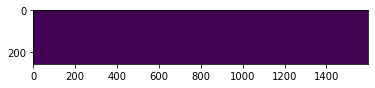

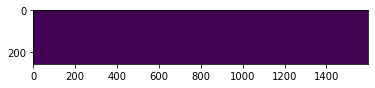

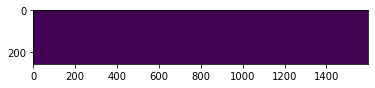

  1%|▏         | 69/5506 [00:38<50:07,  1.81it/s]

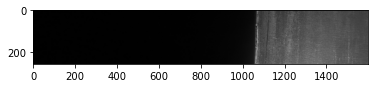

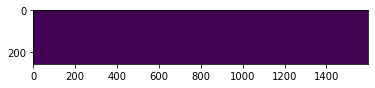

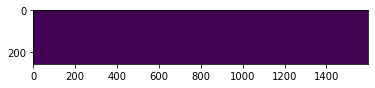

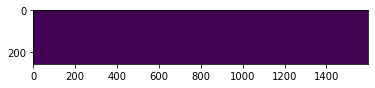

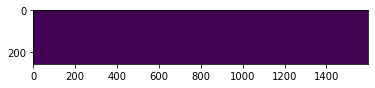

  1%|▏         | 70/5506 [00:39<49:06,  1.84it/s]

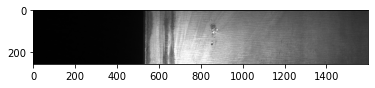

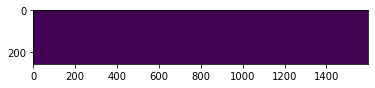

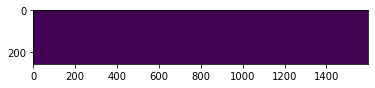

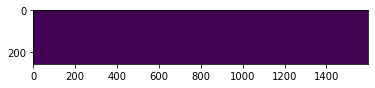

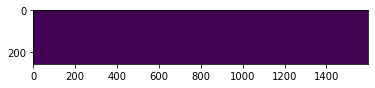

  1%|▏         | 71/5506 [00:39<48:37,  1.86it/s]

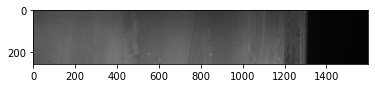

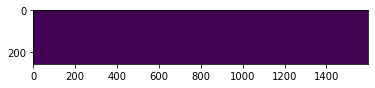

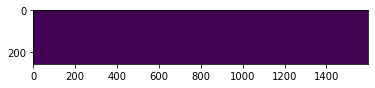

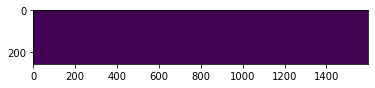

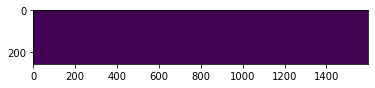

  1%|▏         | 72/5506 [00:40<50:34,  1.79it/s]

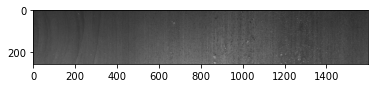

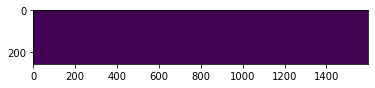

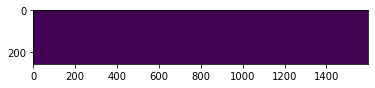

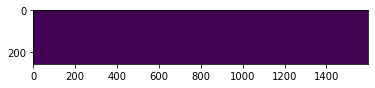

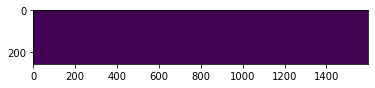

  1%|▏         | 73/5506 [00:40<49:37,  1.82it/s]

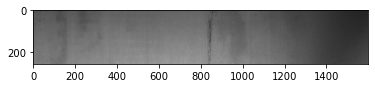

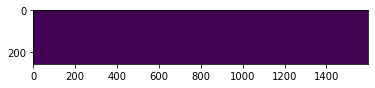

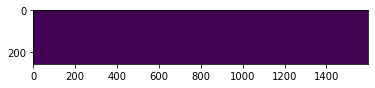

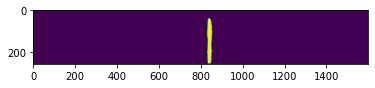

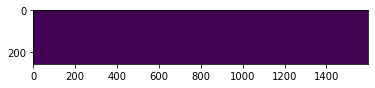

  1%|▏         | 74/5506 [00:41<48:52,  1.85it/s]

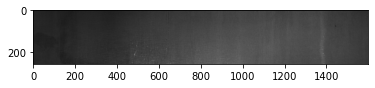

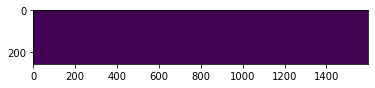

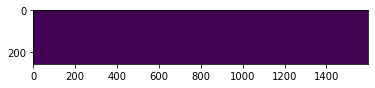

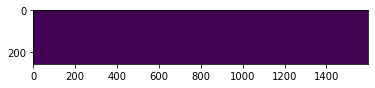

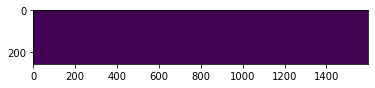

  1%|▏         | 75/5506 [00:41<48:42,  1.86it/s]

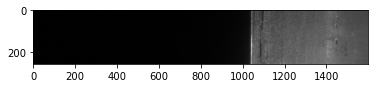

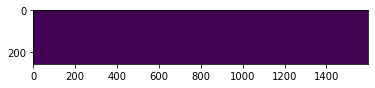

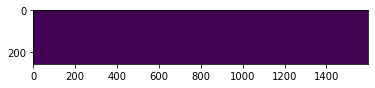

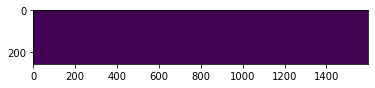

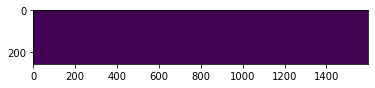

  1%|▏         | 76/5506 [00:42<50:48,  1.78it/s]

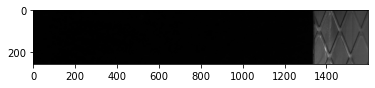

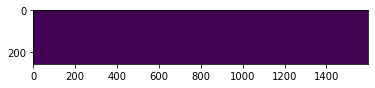

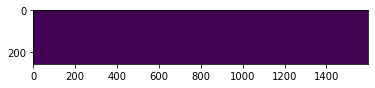

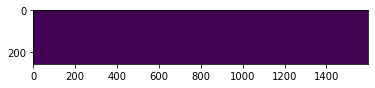

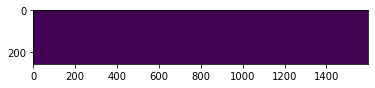

  1%|▏         | 77/5506 [00:42<50:01,  1.81it/s]

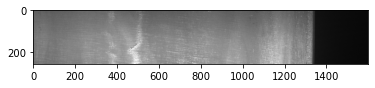

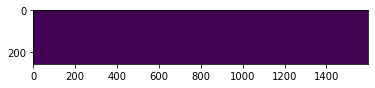

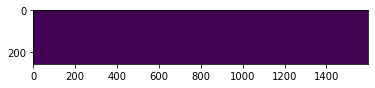

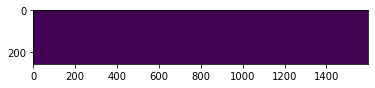

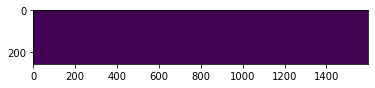

  1%|▏         | 78/5506 [00:43<49:51,  1.81it/s]

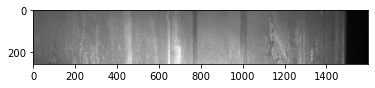

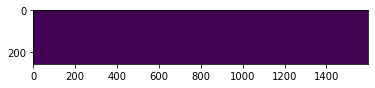

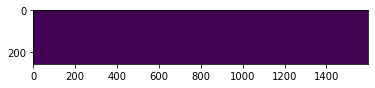

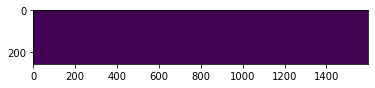

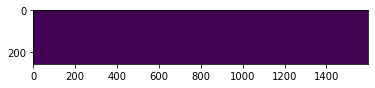

  1%|▏         | 79/5506 [00:44<48:57,  1.85it/s]

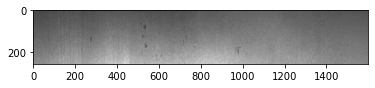

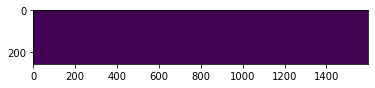

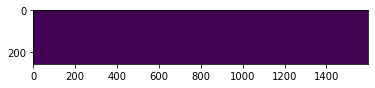

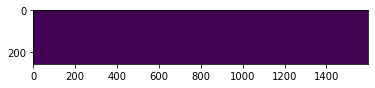

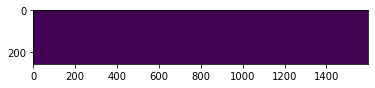

  1%|▏         | 80/5506 [00:44<50:50,  1.78it/s]

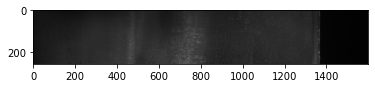

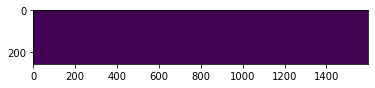

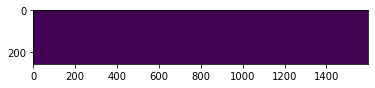

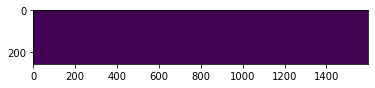

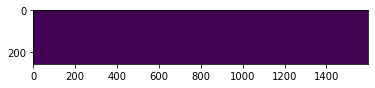

  1%|▏         | 81/5506 [00:45<49:36,  1.82it/s]

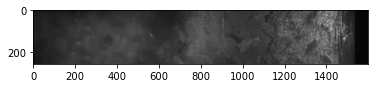

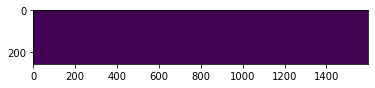

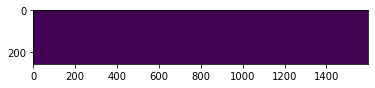

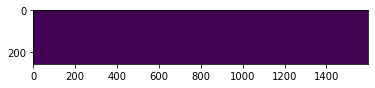

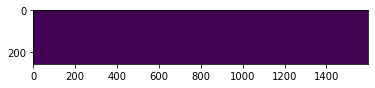

  1%|▏         | 82/5506 [00:45<49:34,  1.82it/s]

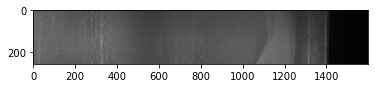

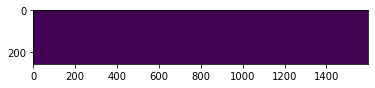

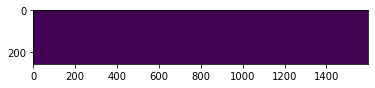

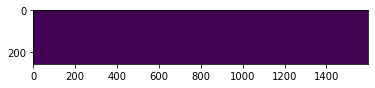

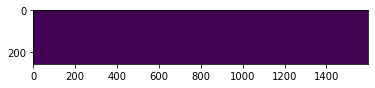

  2%|▏         | 83/5506 [00:46<51:40,  1.75it/s]

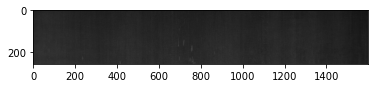

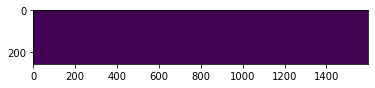

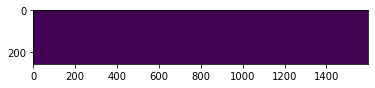

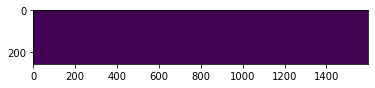

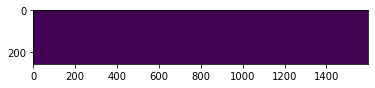

  2%|▏         | 84/5506 [00:46<50:45,  1.78it/s]

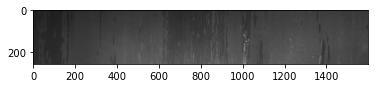

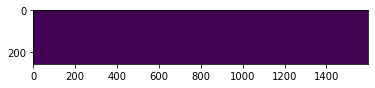

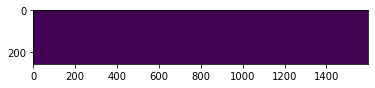

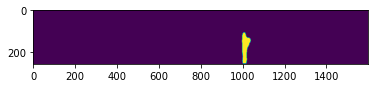

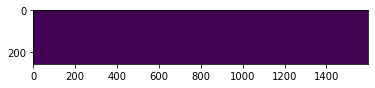

  2%|▏         | 85/5506 [00:47<50:26,  1.79it/s]

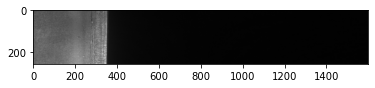

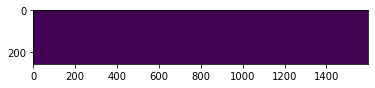

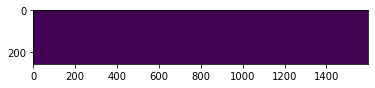

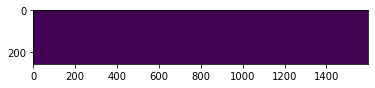

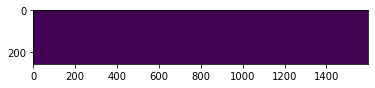

  2%|▏         | 86/5506 [00:47<49:25,  1.83it/s]

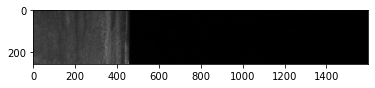

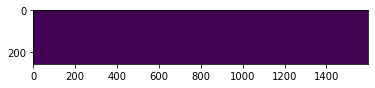

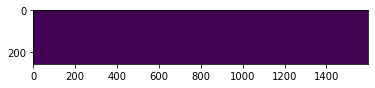

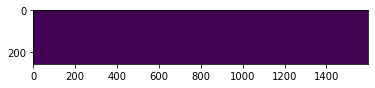

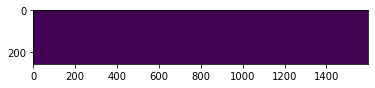

  2%|▏         | 87/5506 [00:48<51:06,  1.77it/s]

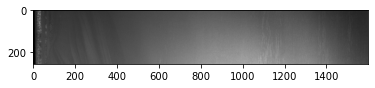

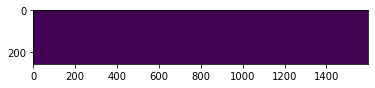

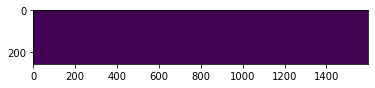

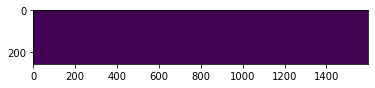

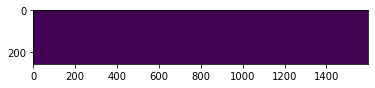

  2%|▏         | 88/5506 [00:49<50:11,  1.80it/s]

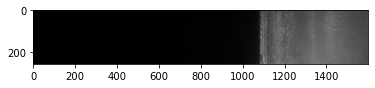

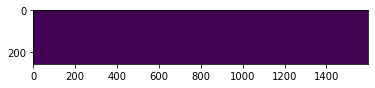

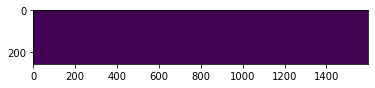

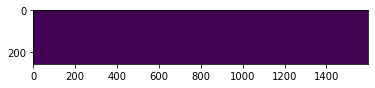

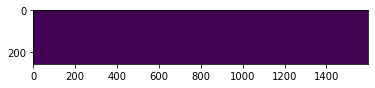

  2%|▏         | 89/5506 [00:49<49:29,  1.82it/s]

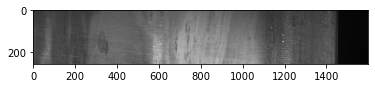

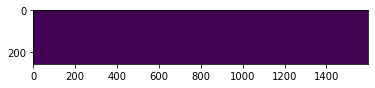

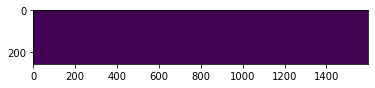

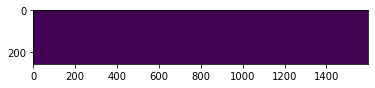

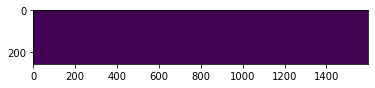

  2%|▏         | 90/5506 [00:50<51:02,  1.77it/s]

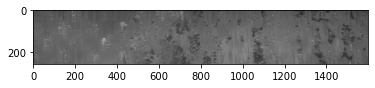

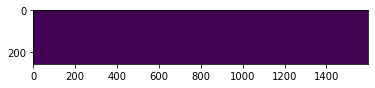

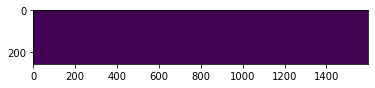

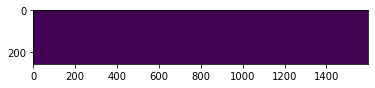

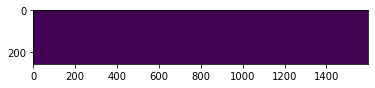

  2%|▏         | 91/5506 [00:50<49:50,  1.81it/s]

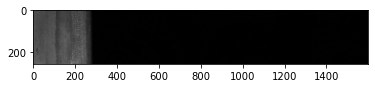

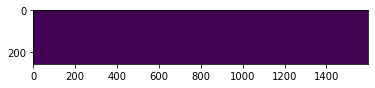

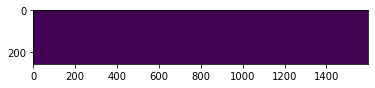

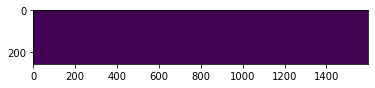

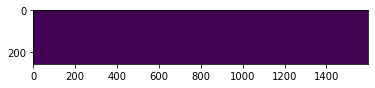

  2%|▏         | 92/5506 [00:51<49:08,  1.84it/s]

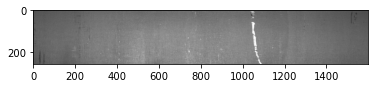

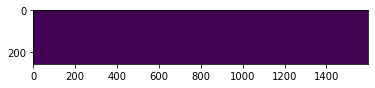

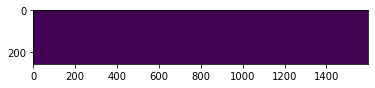

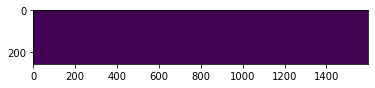

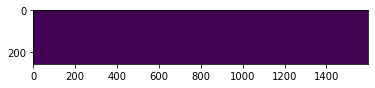

  2%|▏         | 93/5506 [00:51<48:34,  1.86it/s]

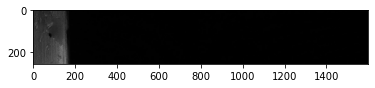

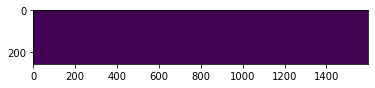

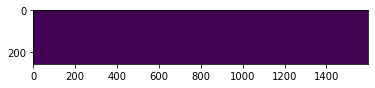

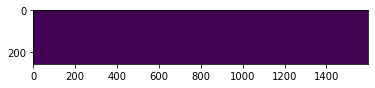

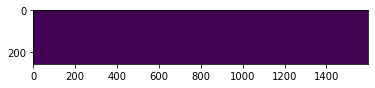

  2%|▏         | 94/5506 [00:52<50:47,  1.78it/s]

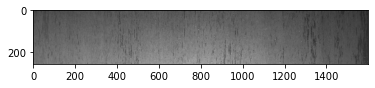

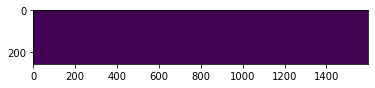

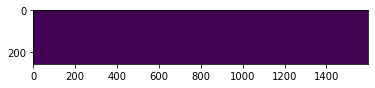

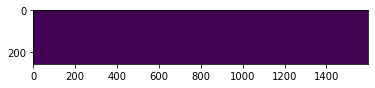

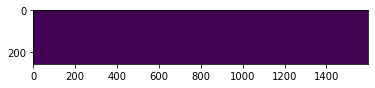

  2%|▏         | 95/5506 [00:52<50:02,  1.80it/s]

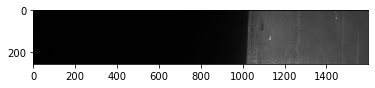

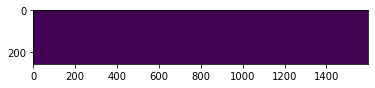

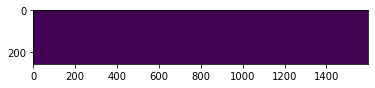

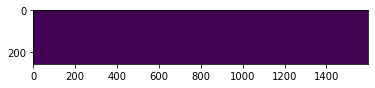

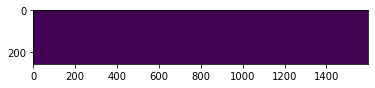

  2%|▏         | 96/5506 [00:53<49:13,  1.83it/s]

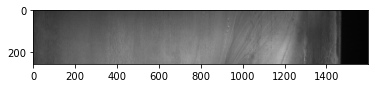

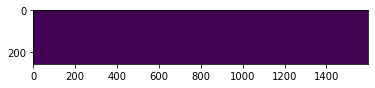

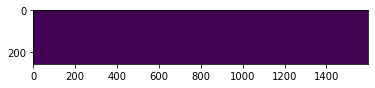

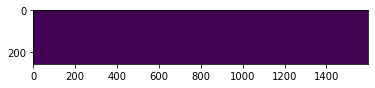

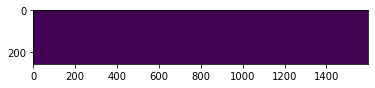

  2%|▏         | 97/5506 [00:53<48:33,  1.86it/s]

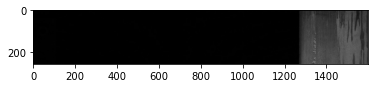

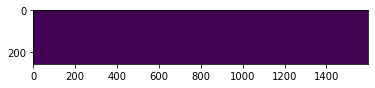

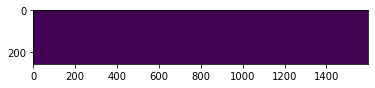

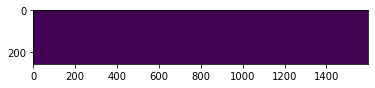

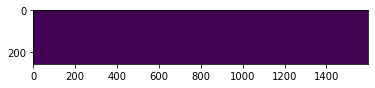

  2%|▏         | 98/5506 [00:54<50:55,  1.77it/s]

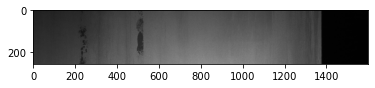

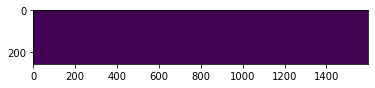

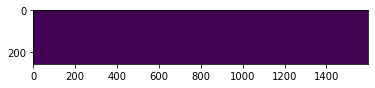

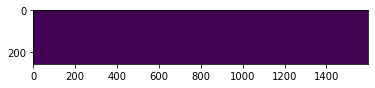

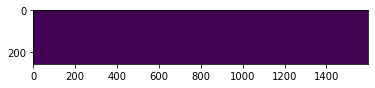

  2%|▏         | 99/5506 [00:55<49:54,  1.81it/s]

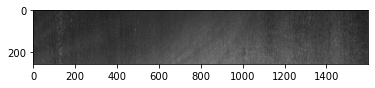

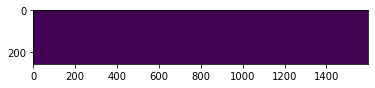

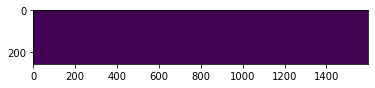

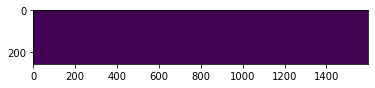

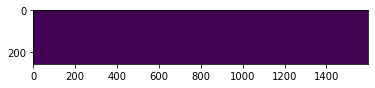

  2%|▏         | 100/5506 [00:55<49:27,  1.82it/s]

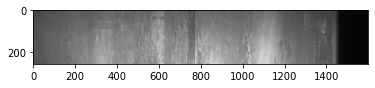

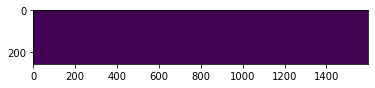

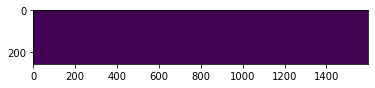

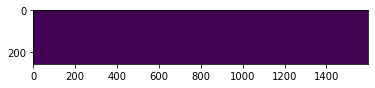

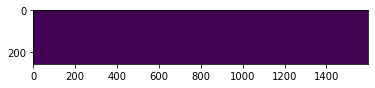

  2%|▏         | 101/5506 [00:56<51:06,  1.76it/s]

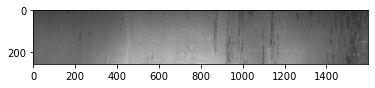

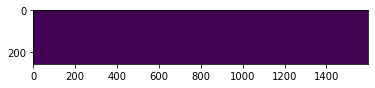

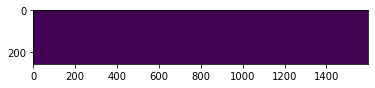

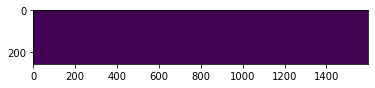

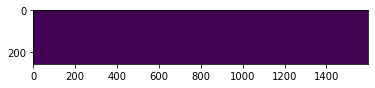

  2%|▏         | 102/5506 [00:56<50:07,  1.80it/s]

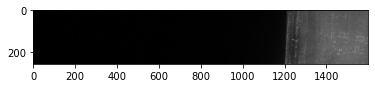

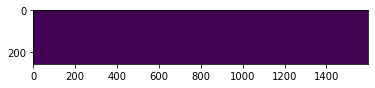

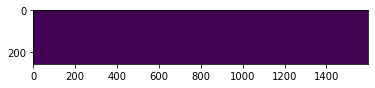

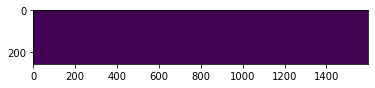

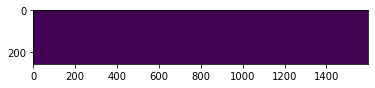

  2%|▏         | 103/5506 [00:57<48:58,  1.84it/s]

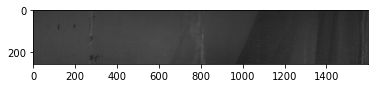

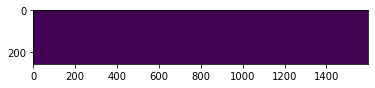

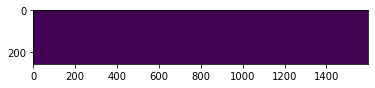

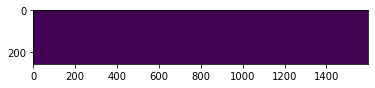

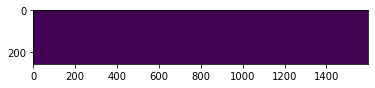

  2%|▏         | 104/5506 [00:57<48:16,  1.86it/s]

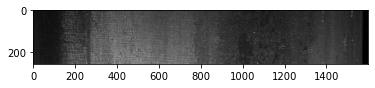

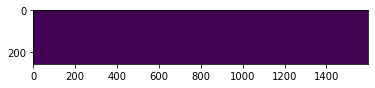

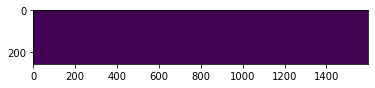

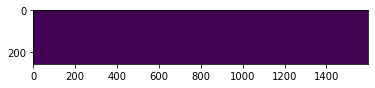

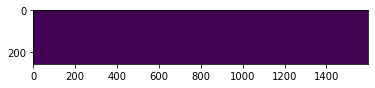

  2%|▏         | 105/5506 [00:58<50:35,  1.78it/s]

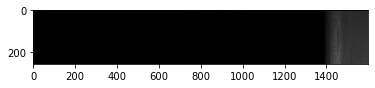

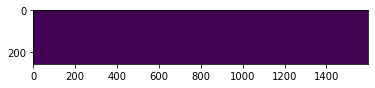

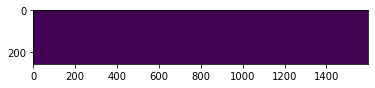

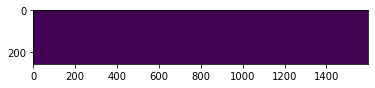

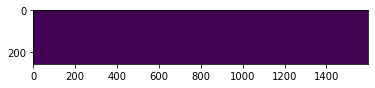

  2%|▏         | 106/5506 [00:59<49:49,  1.81it/s]

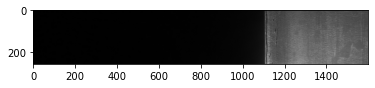

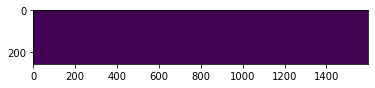

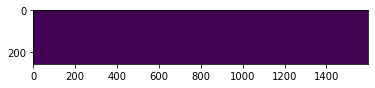

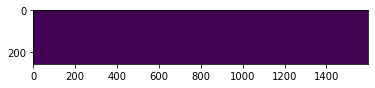

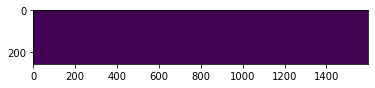

  2%|▏         | 107/5506 [00:59<49:22,  1.82it/s]

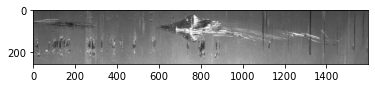

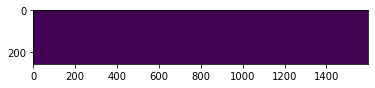

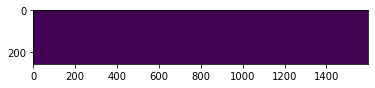

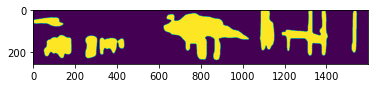

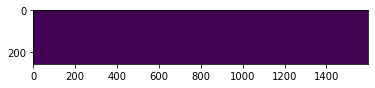

  2%|▏         | 108/5506 [01:00<51:04,  1.76it/s]

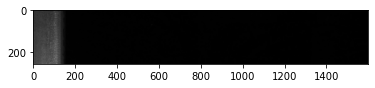

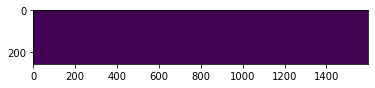

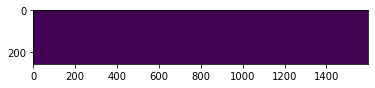

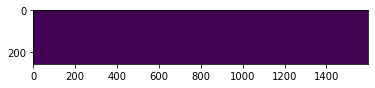

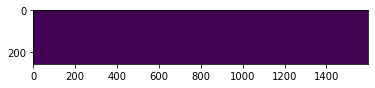

  2%|▏         | 109/5506 [01:00<49:41,  1.81it/s]

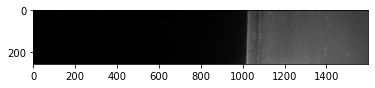

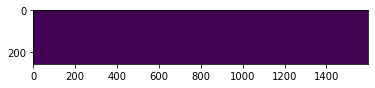

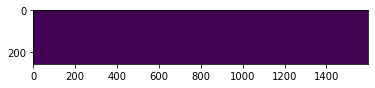

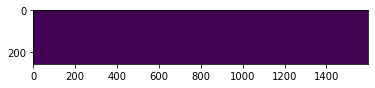

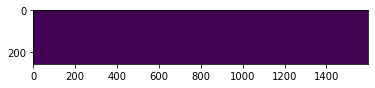

  2%|▏         | 110/5506 [01:01<48:51,  1.84it/s]

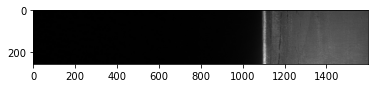

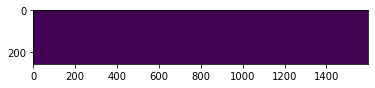

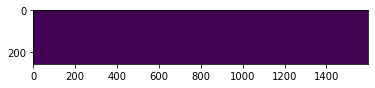

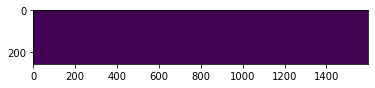

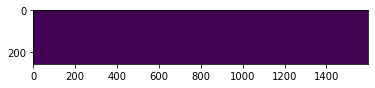

  2%|▏         | 111/5506 [01:01<48:03,  1.87it/s]

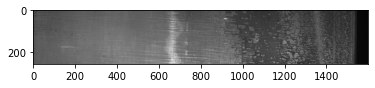

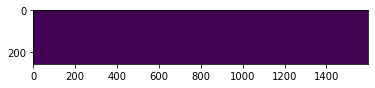

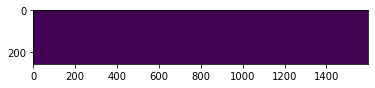

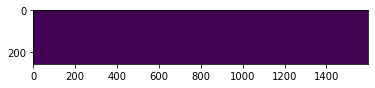

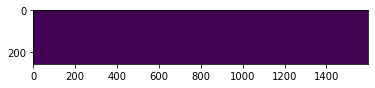

  2%|▏         | 112/5506 [01:02<50:25,  1.78it/s]

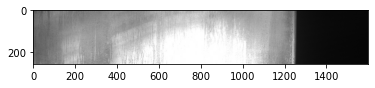

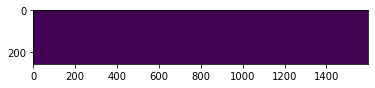

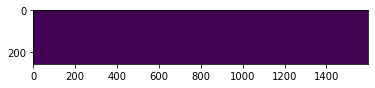

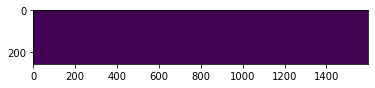

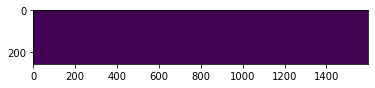

  2%|▏         | 113/5506 [01:02<50:03,  1.80it/s]

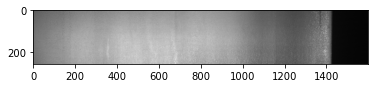

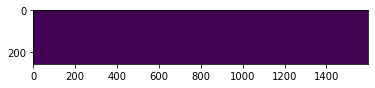

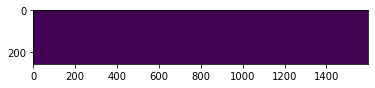

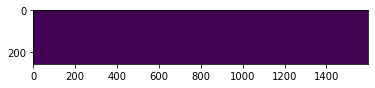

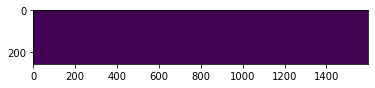

  2%|▏         | 114/5506 [01:03<48:56,  1.84it/s]

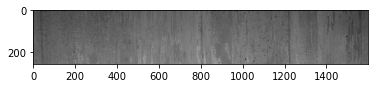

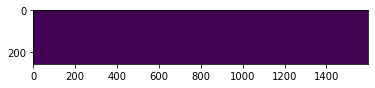

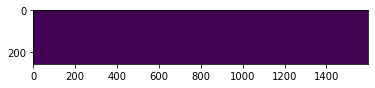

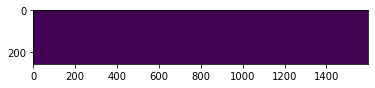

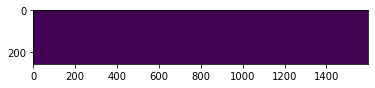

  2%|▏         | 115/5506 [01:03<48:14,  1.86it/s]

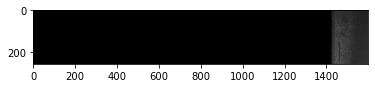

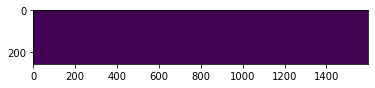

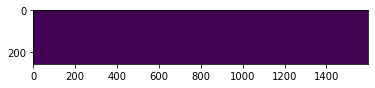

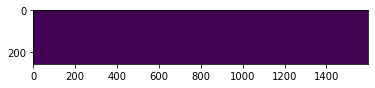

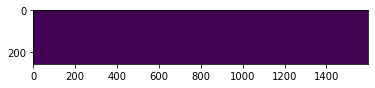

  2%|▏         | 116/5506 [01:04<49:42,  1.81it/s]

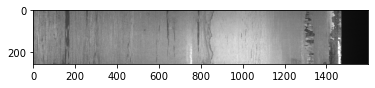

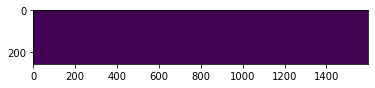

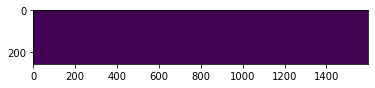

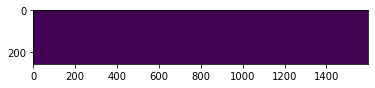

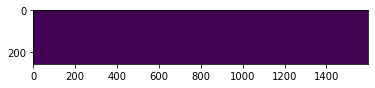

  2%|▏         | 117/5506 [01:05<49:21,  1.82it/s]

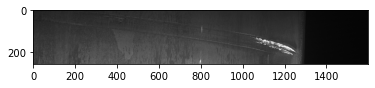

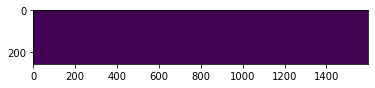

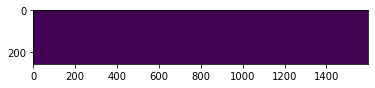

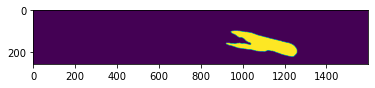

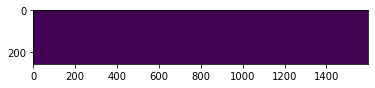

  2%|▏         | 118/5506 [01:05<49:12,  1.83it/s]

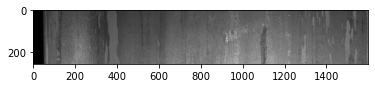

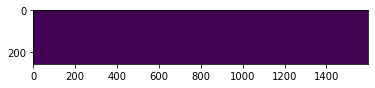

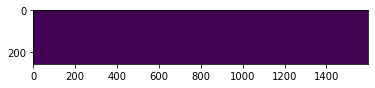

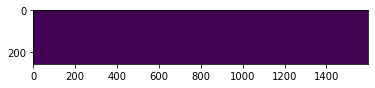

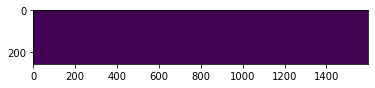

  2%|▏         | 119/5506 [01:06<51:16,  1.75it/s]

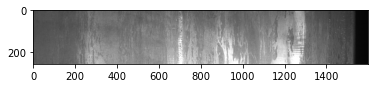

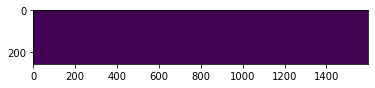

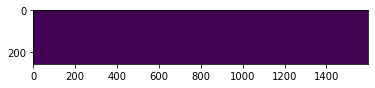

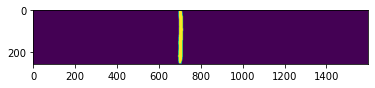

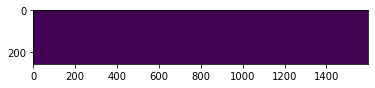

  2%|▏         | 120/5506 [01:06<49:57,  1.80it/s]

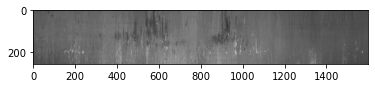

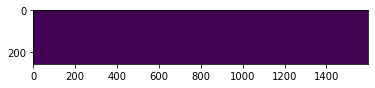

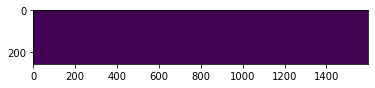

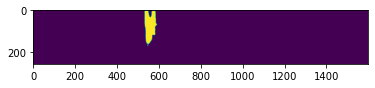

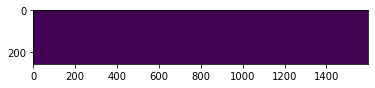

  2%|▏         | 121/5506 [01:07<49:04,  1.83it/s]

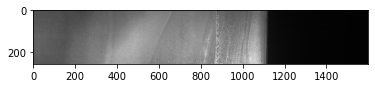

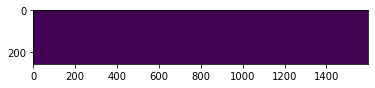

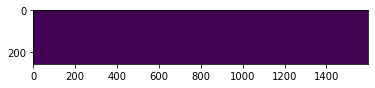

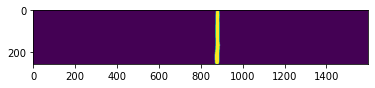

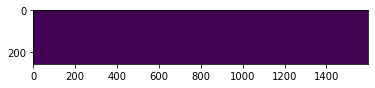

  2%|▏         | 122/5506 [01:07<48:10,  1.86it/s]

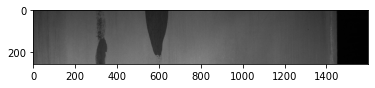

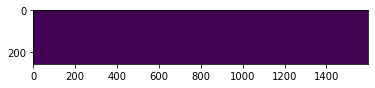

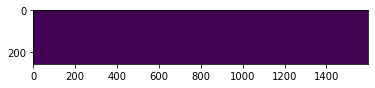

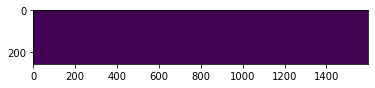

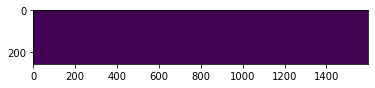

  2%|▏         | 123/5506 [01:08<50:02,  1.79it/s]

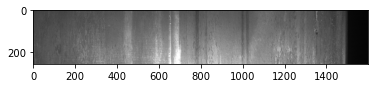

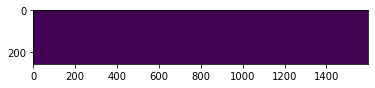

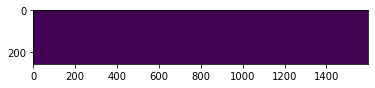

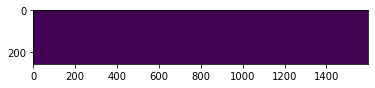

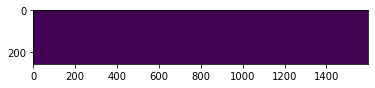

  2%|▏         | 124/5506 [01:08<49:00,  1.83it/s]

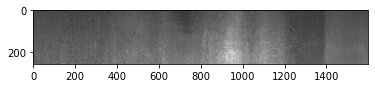

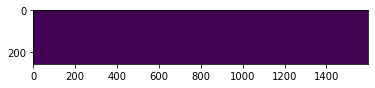

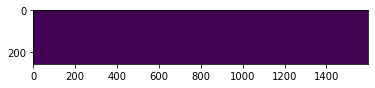

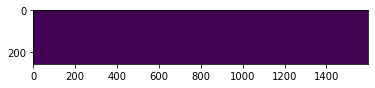

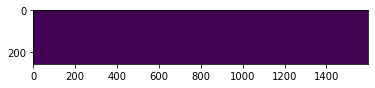

  2%|▏         | 125/5506 [01:09<48:22,  1.85it/s]

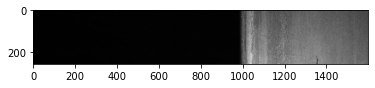

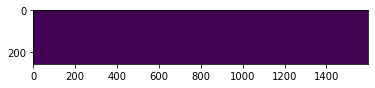

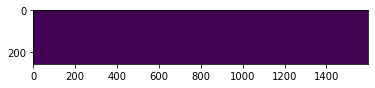

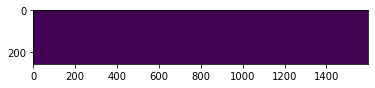

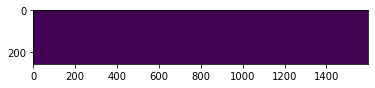

  2%|▏         | 126/5506 [01:10<50:36,  1.77it/s]

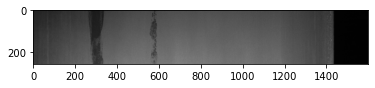

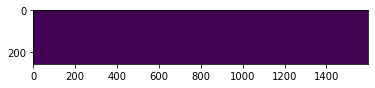

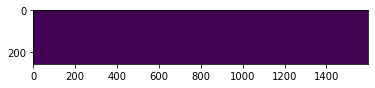

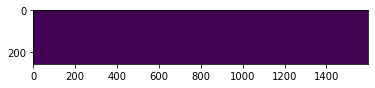

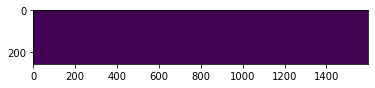

  2%|▏         | 127/5506 [01:10<49:37,  1.81it/s]

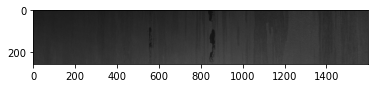

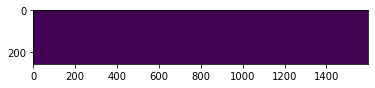

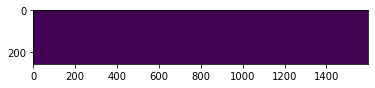

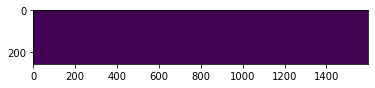

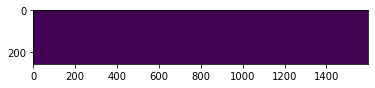

  2%|▏         | 128/5506 [01:11<48:59,  1.83it/s]

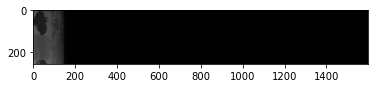

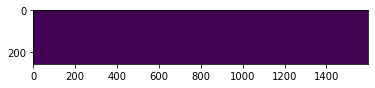

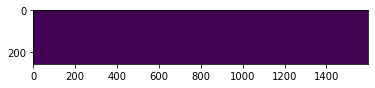

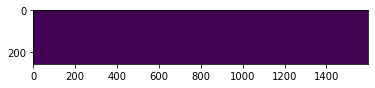

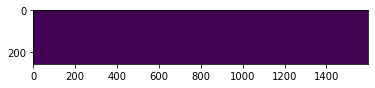

  2%|▏         | 129/5506 [01:11<48:44,  1.84it/s]

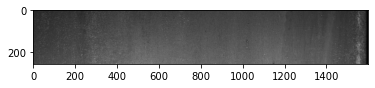

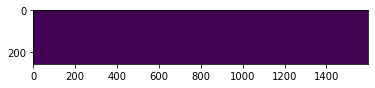

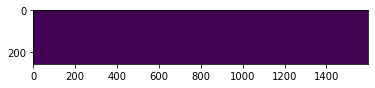

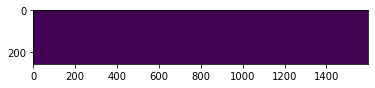

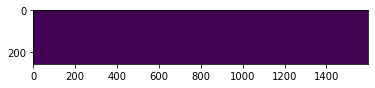

  2%|▏         | 130/5506 [01:12<51:32,  1.74it/s]

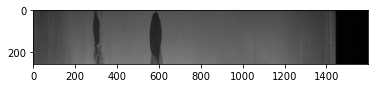

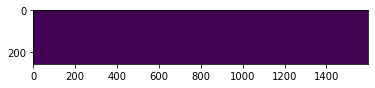

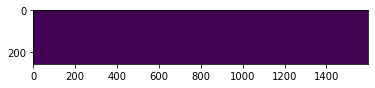

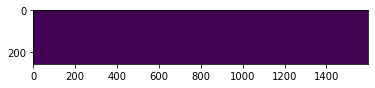

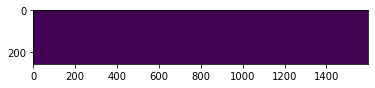

  2%|▏         | 131/5506 [01:12<51:22,  1.74it/s]

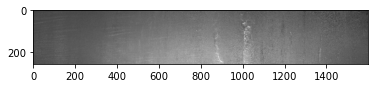

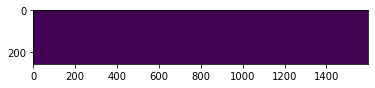

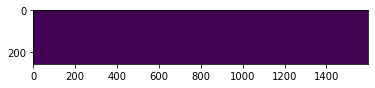

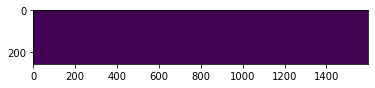

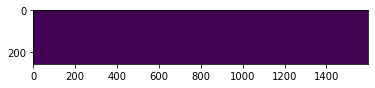

  2%|▏         | 132/5506 [01:13<50:36,  1.77it/s]

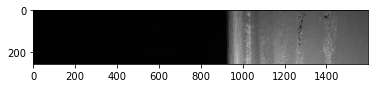

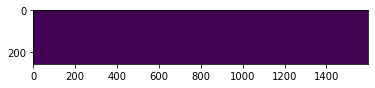

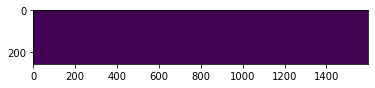

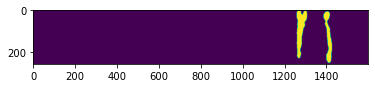

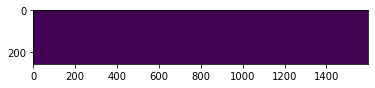

  2%|▏         | 133/5506 [01:13<49:46,  1.80it/s]

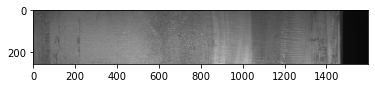

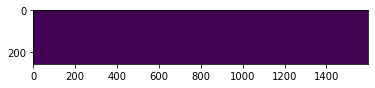

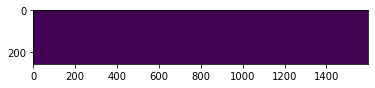

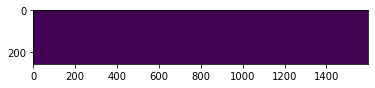

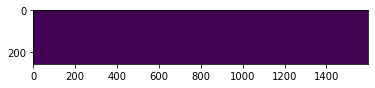

  2%|▏         | 134/5506 [01:14<52:02,  1.72it/s]

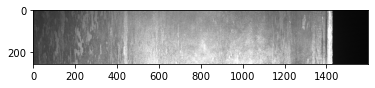

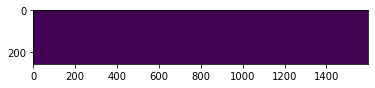

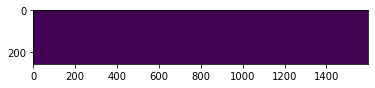

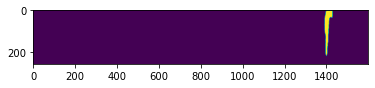

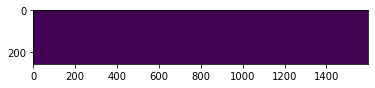

  2%|▏         | 135/5506 [01:15<50:15,  1.78it/s]

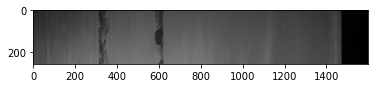

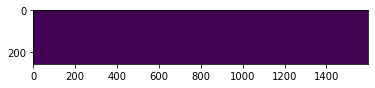

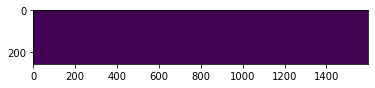

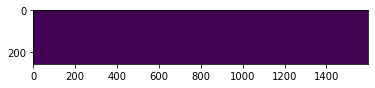

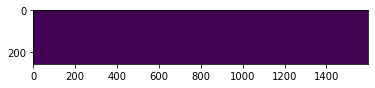

  2%|▏         | 136/5506 [01:15<49:53,  1.79it/s]

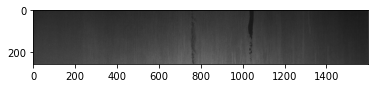

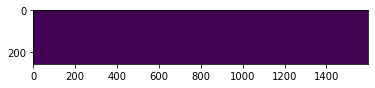

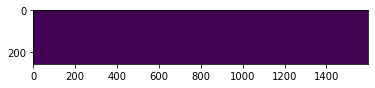

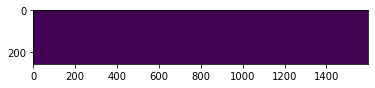

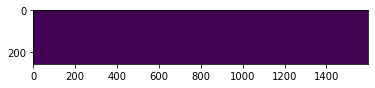

  2%|▏         | 137/5506 [01:16<51:32,  1.74it/s]

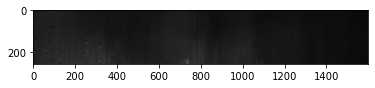

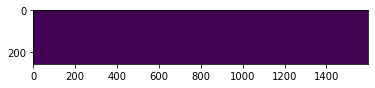

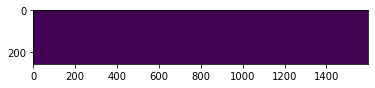

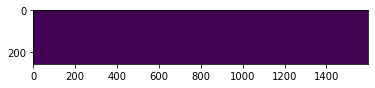

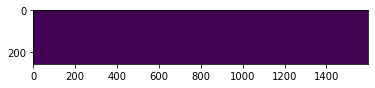

  3%|▎         | 138/5506 [01:16<50:10,  1.78it/s]

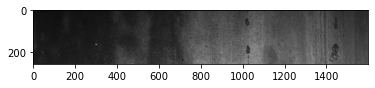

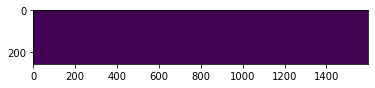

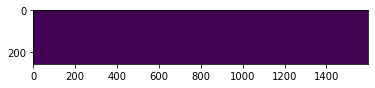

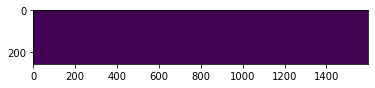

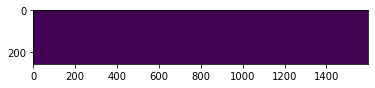

  3%|▎         | 139/5506 [01:17<49:28,  1.81it/s]

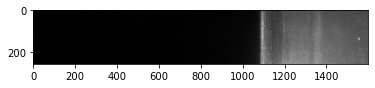

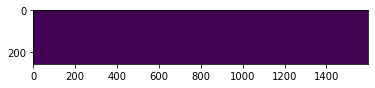

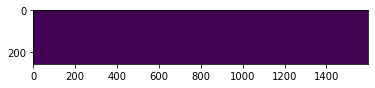

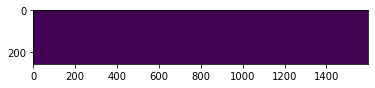

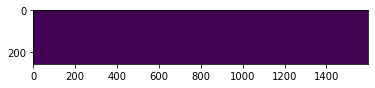

  3%|▎         | 140/5506 [01:17<48:54,  1.83it/s]

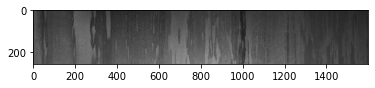

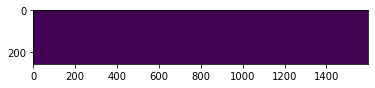

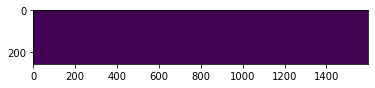

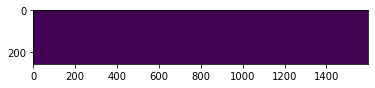

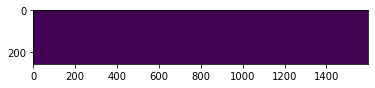

  3%|▎         | 141/5506 [01:18<50:25,  1.77it/s]

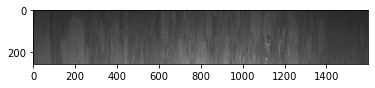

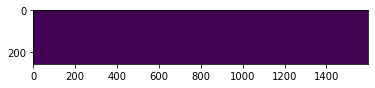

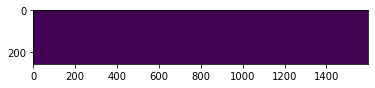

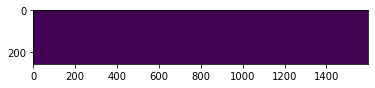

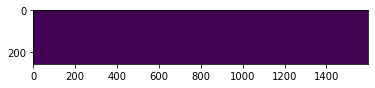

  3%|▎         | 142/5506 [01:19<49:56,  1.79it/s]

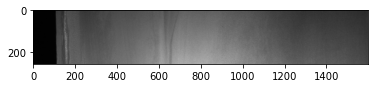

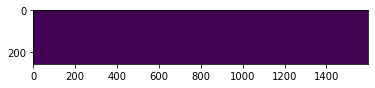

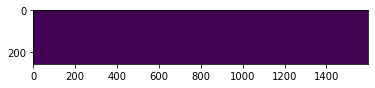

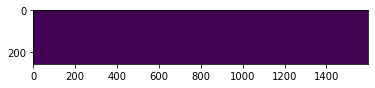

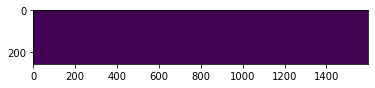

  3%|▎         | 143/5506 [01:19<48:54,  1.83it/s]

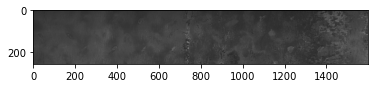

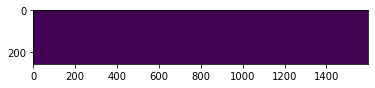

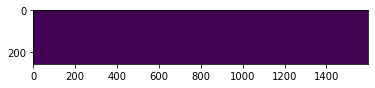

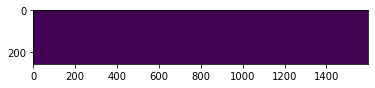

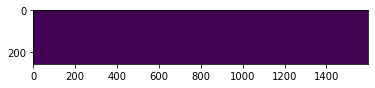

  3%|▎         | 144/5506 [01:20<50:45,  1.76it/s]

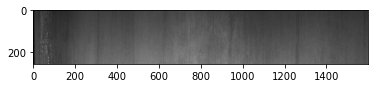

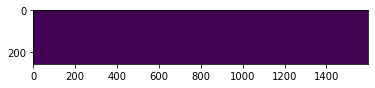

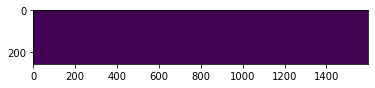

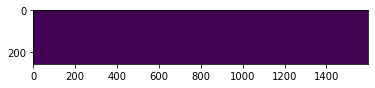

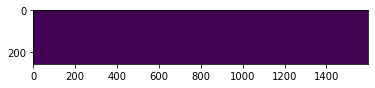

  3%|▎         | 145/5506 [01:20<49:53,  1.79it/s]

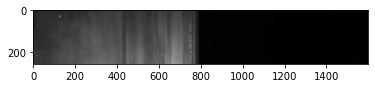

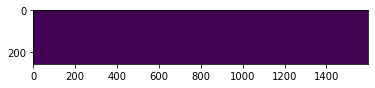

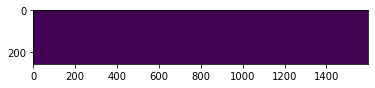

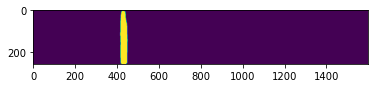

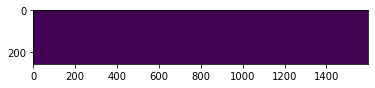

  3%|▎         | 146/5506 [01:21<49:09,  1.82it/s]

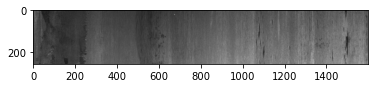

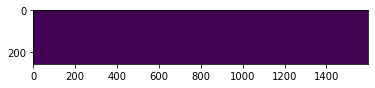

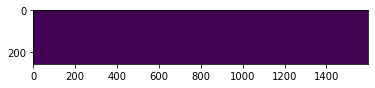

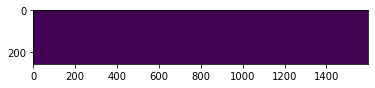

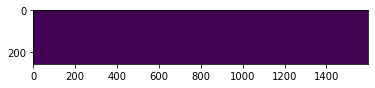

  3%|▎         | 147/5506 [01:21<48:12,  1.85it/s]

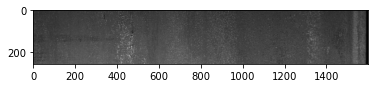

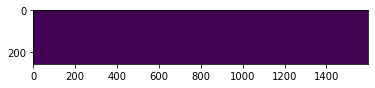

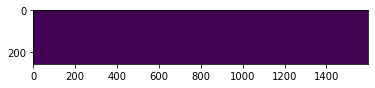

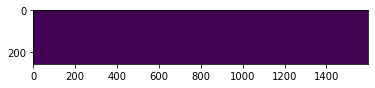

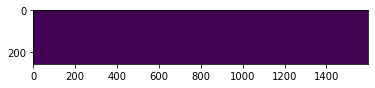

  3%|▎         | 148/5506 [01:22<49:59,  1.79it/s]

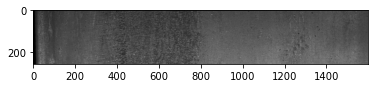

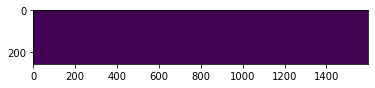

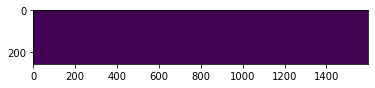

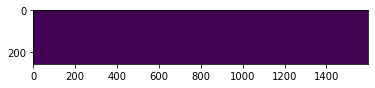

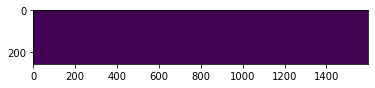

  3%|▎         | 149/5506 [01:22<49:35,  1.80it/s]

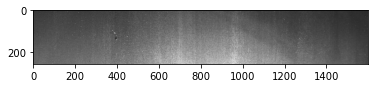

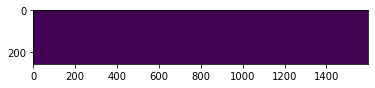

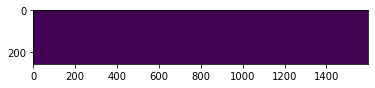

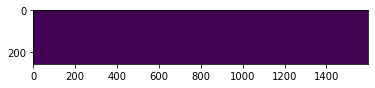

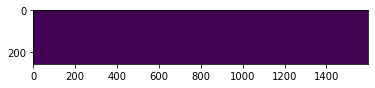

  3%|▎         | 150/5506 [01:23<48:19,  1.85it/s]

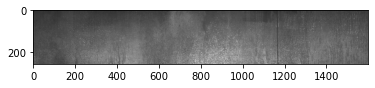

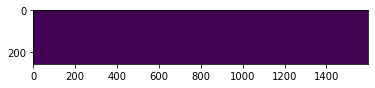

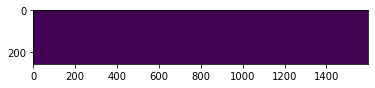

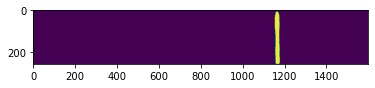

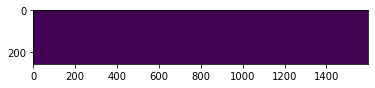

  3%|▎         | 151/5506 [01:23<47:48,  1.87it/s]

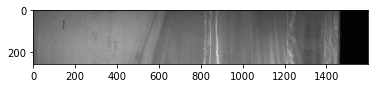

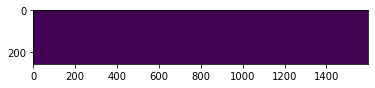

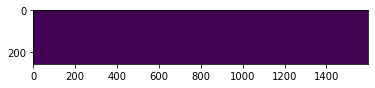

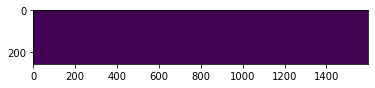

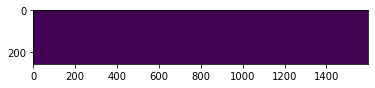

  3%|▎         | 152/5506 [01:24<49:51,  1.79it/s]

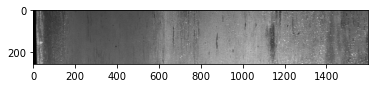

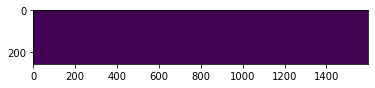

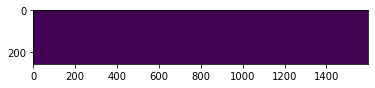

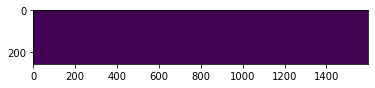

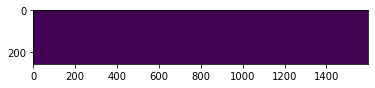

  3%|▎         | 153/5506 [01:25<49:39,  1.80it/s]

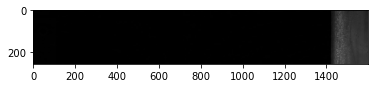

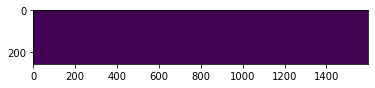

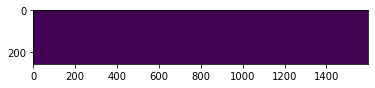

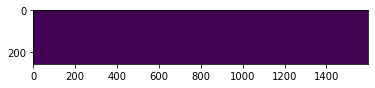

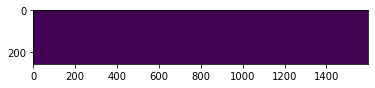

  3%|▎         | 154/5506 [01:25<48:31,  1.84it/s]

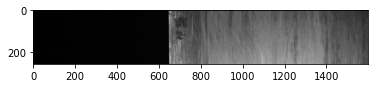

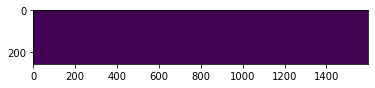

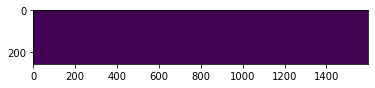

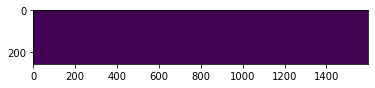

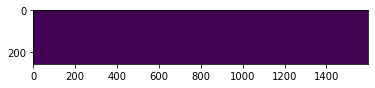

  3%|▎         | 155/5506 [01:26<49:59,  1.78it/s]

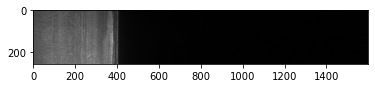

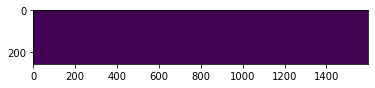

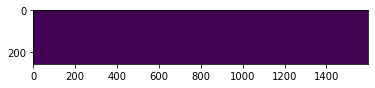

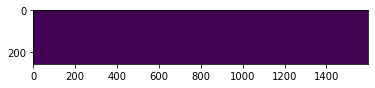

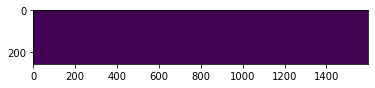

  3%|▎         | 156/5506 [01:26<48:42,  1.83it/s]

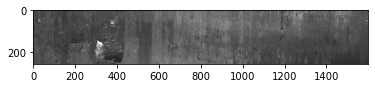

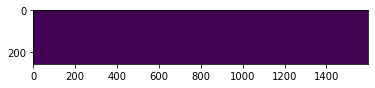

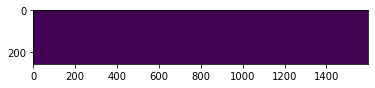

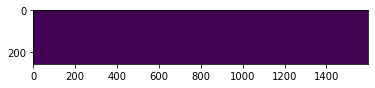

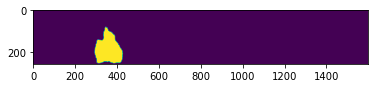

  3%|▎         | 157/5506 [01:27<48:10,  1.85it/s]

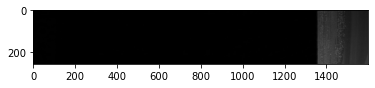

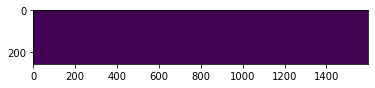

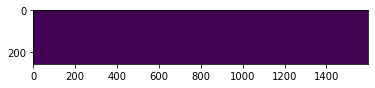

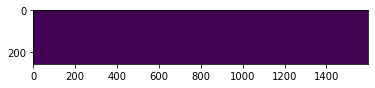

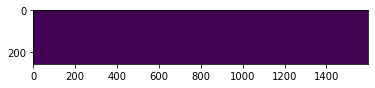

  3%|▎         | 158/5506 [01:27<47:21,  1.88it/s]

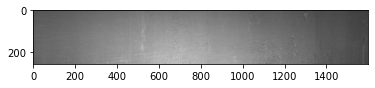

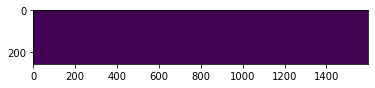

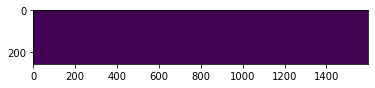

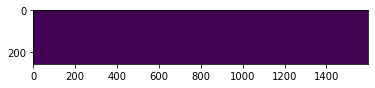

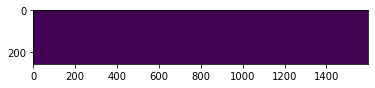

  3%|▎         | 159/5506 [01:28<49:11,  1.81it/s]

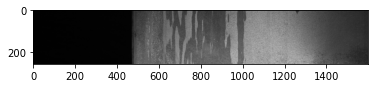

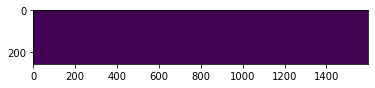

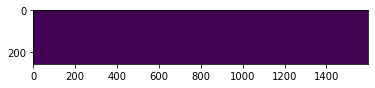

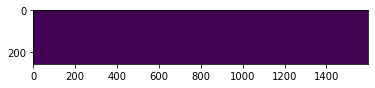

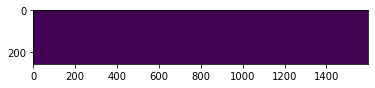

  3%|▎         | 160/5506 [01:28<48:45,  1.83it/s]

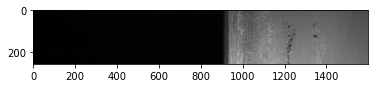

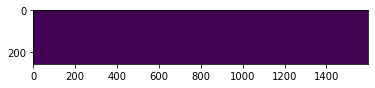

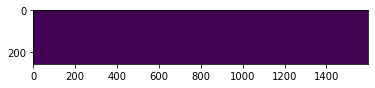

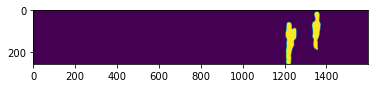

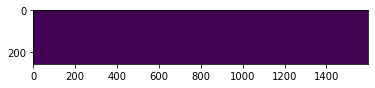

  3%|▎         | 161/5506 [01:29<48:02,  1.85it/s]

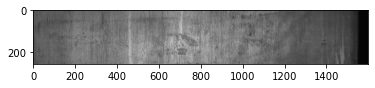

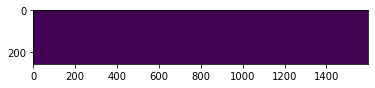

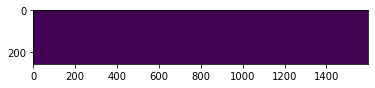

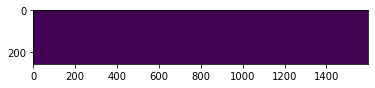

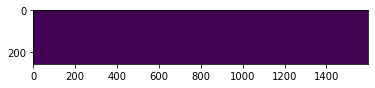

  3%|▎         | 162/5506 [01:30<50:20,  1.77it/s]

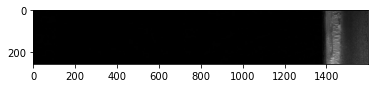

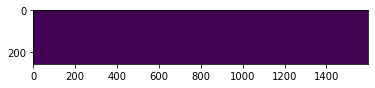

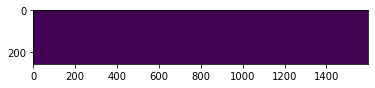

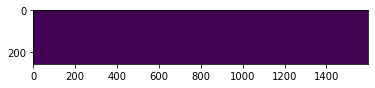

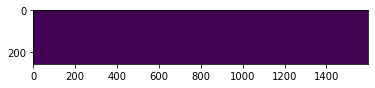

  3%|▎         | 163/5506 [01:30<49:23,  1.80it/s]

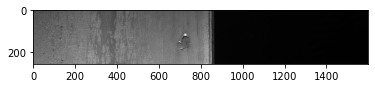

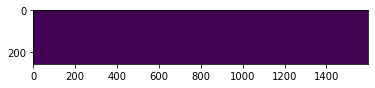

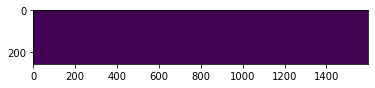

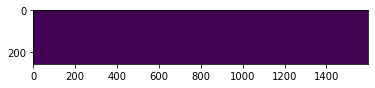

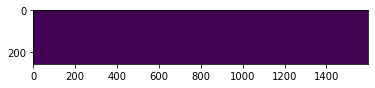

  3%|▎         | 164/5506 [01:31<48:36,  1.83it/s]

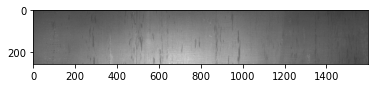

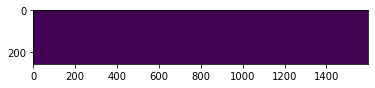

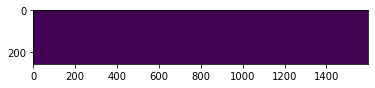

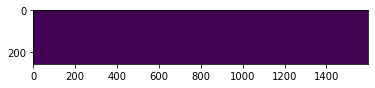

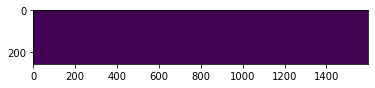

  3%|▎         | 165/5506 [01:31<48:40,  1.83it/s]

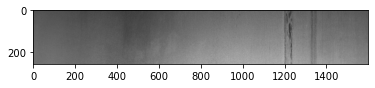

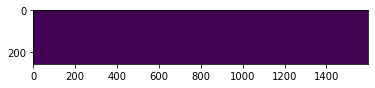

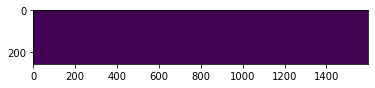

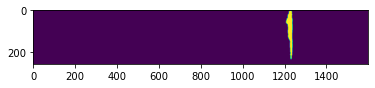

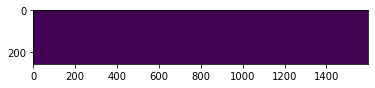

  3%|▎         | 166/5506 [01:32<50:33,  1.76it/s]

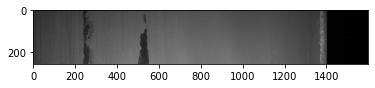

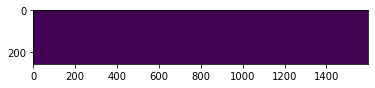

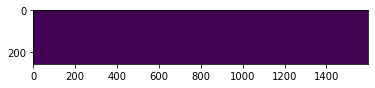

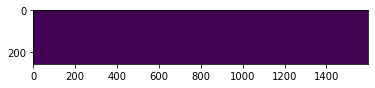

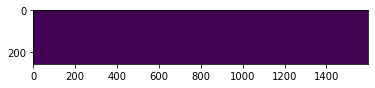

  3%|▎         | 167/5506 [01:32<49:13,  1.81it/s]

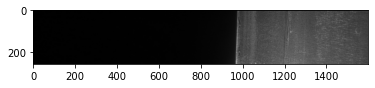

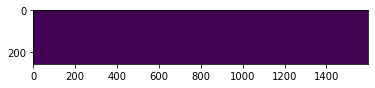

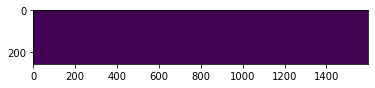

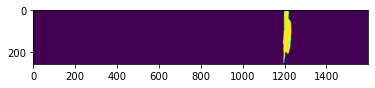

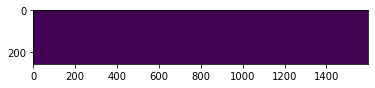

  3%|▎         | 168/5506 [01:33<48:30,  1.83it/s]

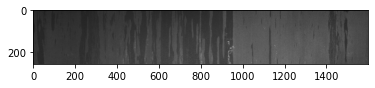

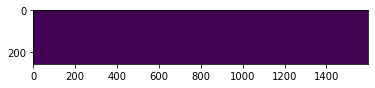

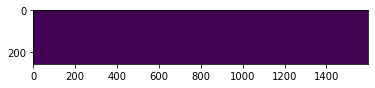

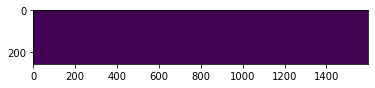

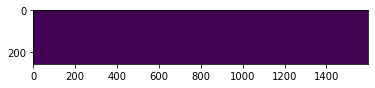

  3%|▎         | 169/5506 [01:33<48:19,  1.84it/s]

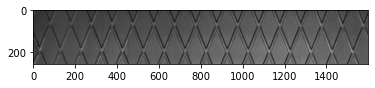

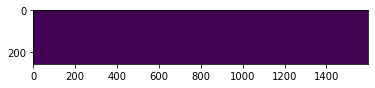

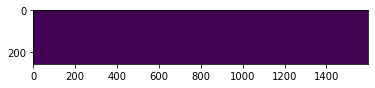

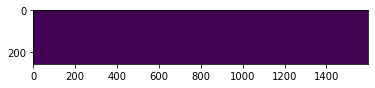

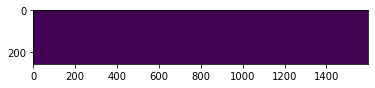

  3%|▎         | 170/5506 [01:34<50:21,  1.77it/s]

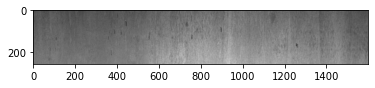

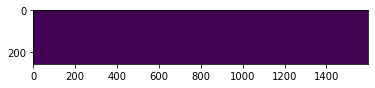

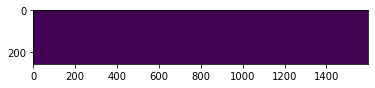

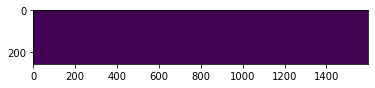

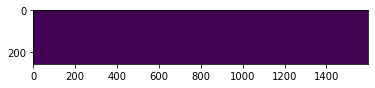

  3%|▎         | 171/5506 [01:35<49:44,  1.79it/s]

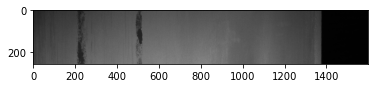

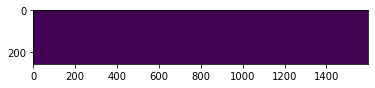

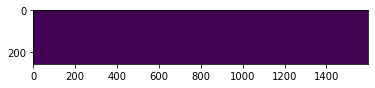

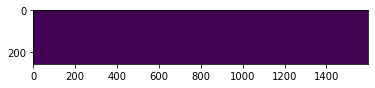

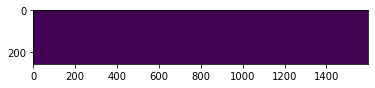

  3%|▎         | 172/5506 [01:35<48:35,  1.83it/s]

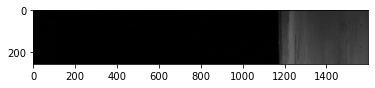

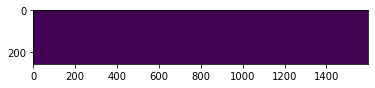

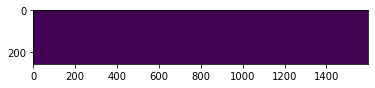

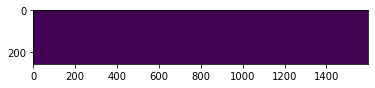

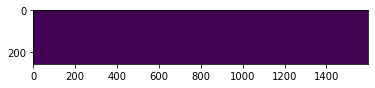

  3%|▎         | 173/5506 [01:36<50:14,  1.77it/s]

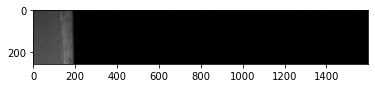

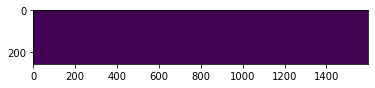

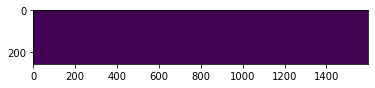

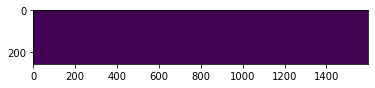

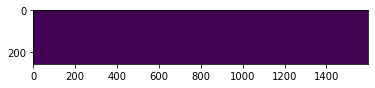

  3%|▎         | 174/5506 [01:36<49:25,  1.80it/s]

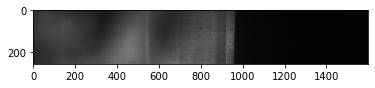

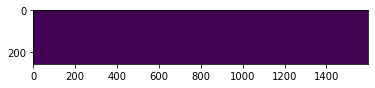

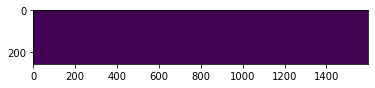

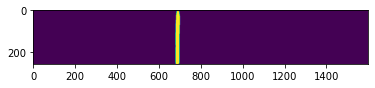

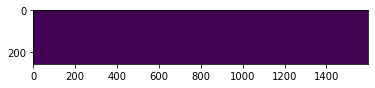

  3%|▎         | 175/5506 [01:37<48:19,  1.84it/s]

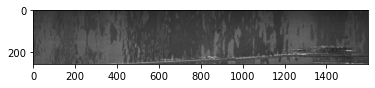

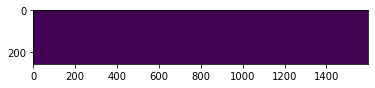

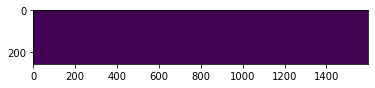

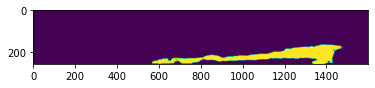

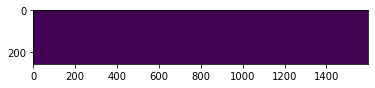

  3%|▎         | 176/5506 [01:37<47:33,  1.87it/s]

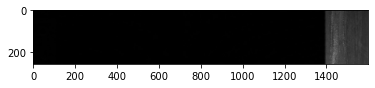

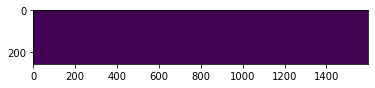

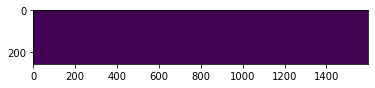

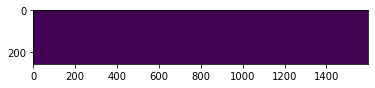

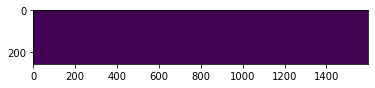

  3%|▎         | 177/5506 [01:38<49:01,  1.81it/s]

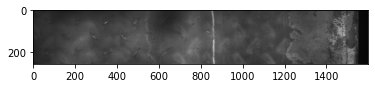

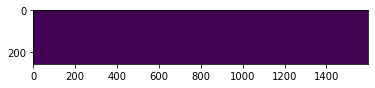

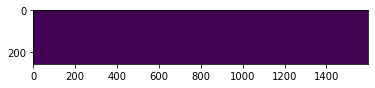

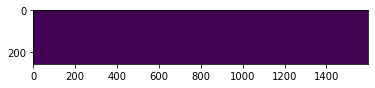

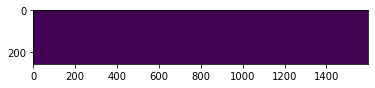

  3%|▎         | 178/5506 [01:38<47:59,  1.85it/s]

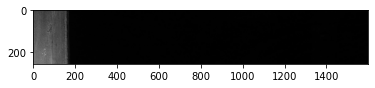

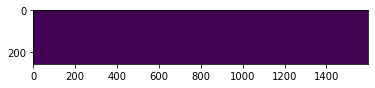

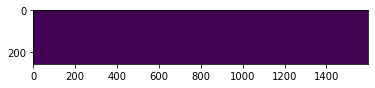

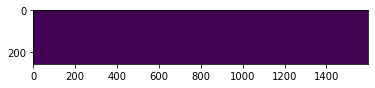

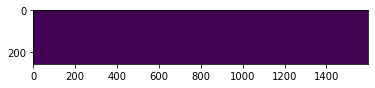

  3%|▎         | 179/5506 [01:39<47:07,  1.88it/s]

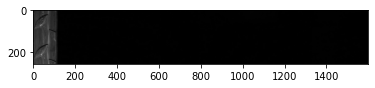

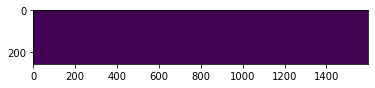

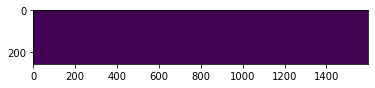

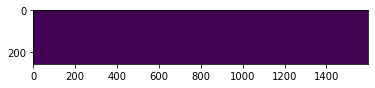

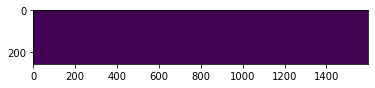

  3%|▎         | 180/5506 [01:39<49:26,  1.80it/s]

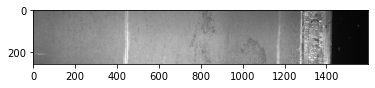

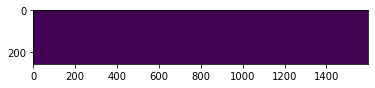

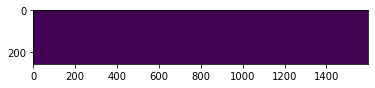

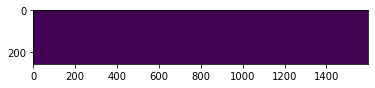

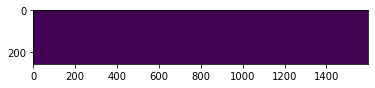

  3%|▎         | 181/5506 [01:40<48:14,  1.84it/s]

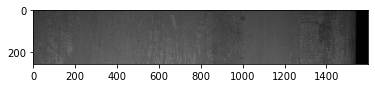

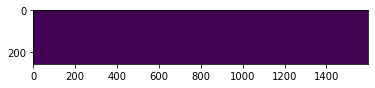

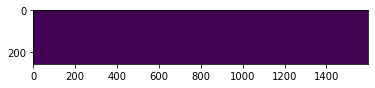

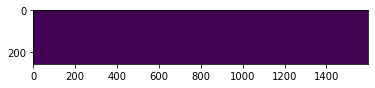

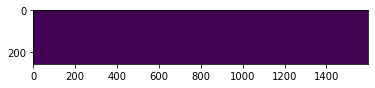

  3%|▎         | 182/5506 [01:40<48:37,  1.82it/s]

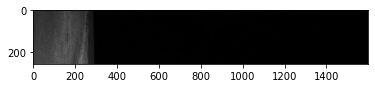

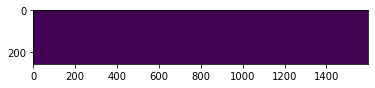

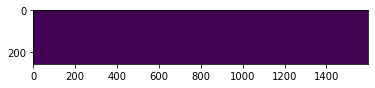

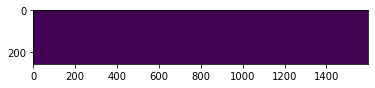

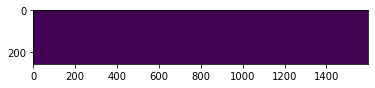

  3%|▎         | 183/5506 [01:41<47:41,  1.86it/s]

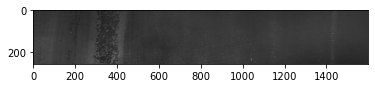

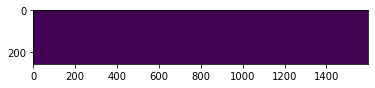

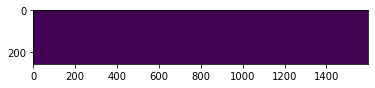

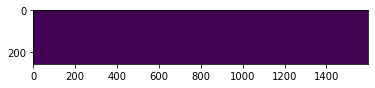

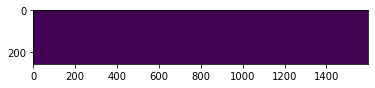

  3%|▎         | 184/5506 [01:42<49:36,  1.79it/s]

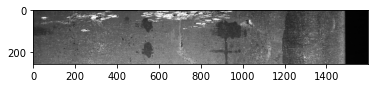

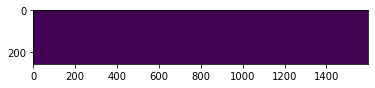

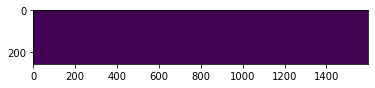

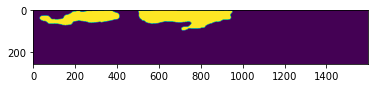

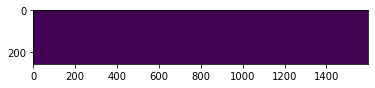

  3%|▎         | 185/5506 [01:42<48:48,  1.82it/s]

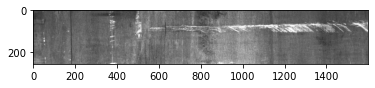

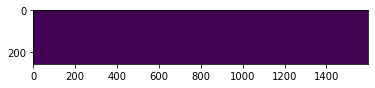

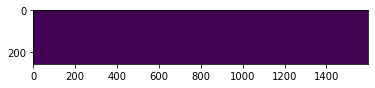

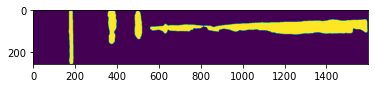

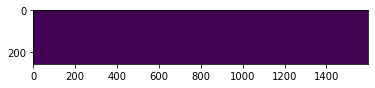

  3%|▎         | 186/5506 [01:43<48:39,  1.82it/s]

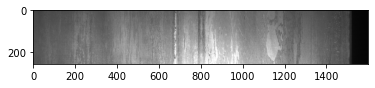

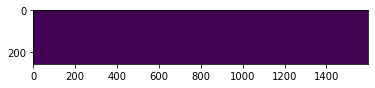

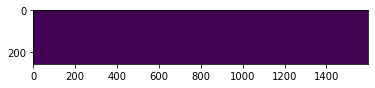

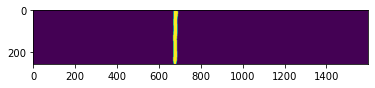

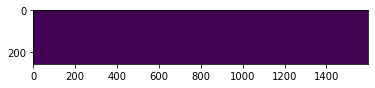

  3%|▎         | 187/5506 [01:43<48:00,  1.85it/s]

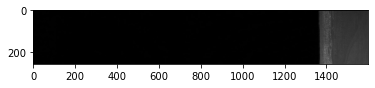

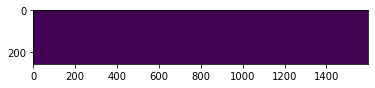

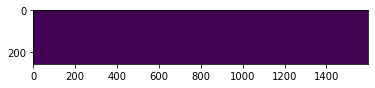

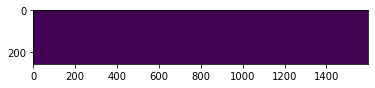

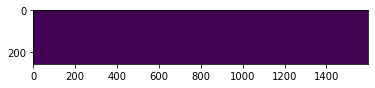

  3%|▎         | 188/5506 [01:44<49:35,  1.79it/s]

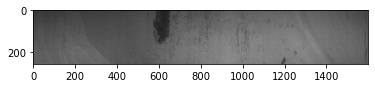

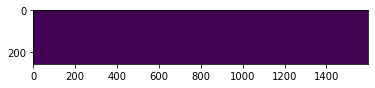

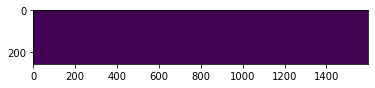

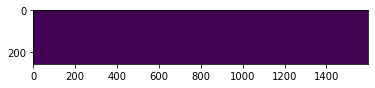

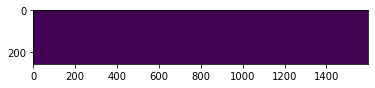

  3%|▎         | 189/5506 [01:44<48:36,  1.82it/s]

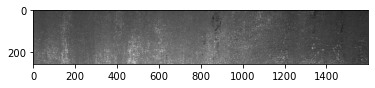

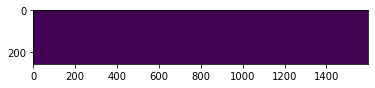

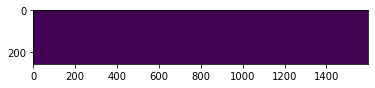

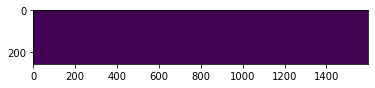

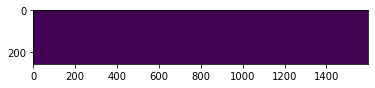

  3%|▎         | 190/5506 [01:45<48:15,  1.84it/s]

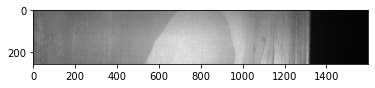

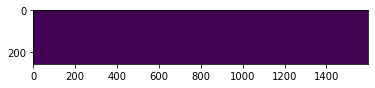

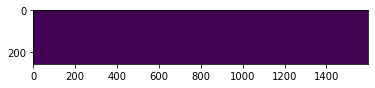

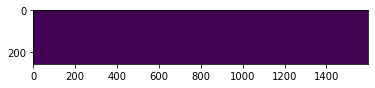

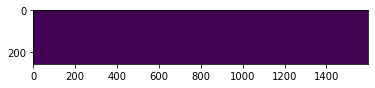

  3%|▎         | 191/5506 [01:45<50:04,  1.77it/s]

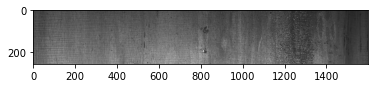

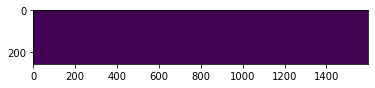

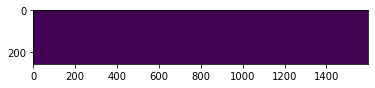

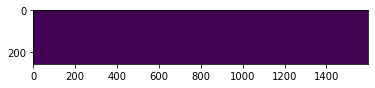

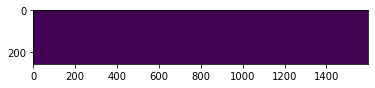

  3%|▎         | 192/5506 [01:46<49:16,  1.80it/s]

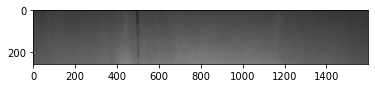

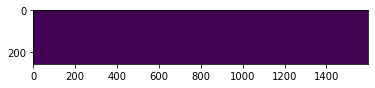

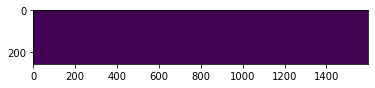

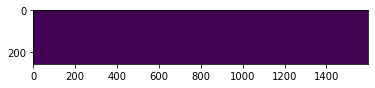

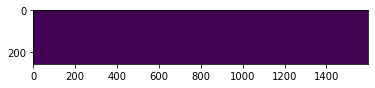

  4%|▎         | 193/5506 [01:47<49:20,  1.79it/s]

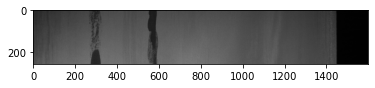

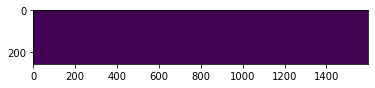

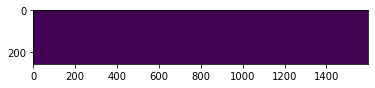

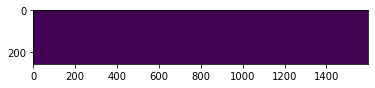

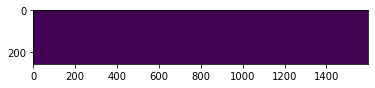

  4%|▎         | 194/5506 [01:47<48:19,  1.83it/s]

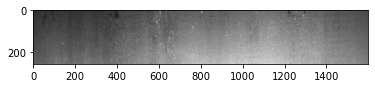

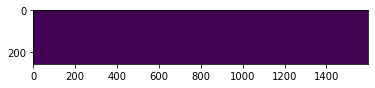

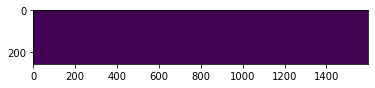

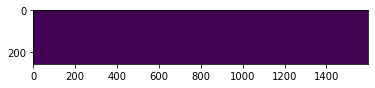

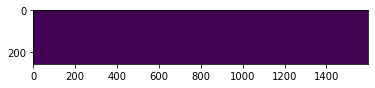

  4%|▎         | 195/5506 [01:48<49:44,  1.78it/s]

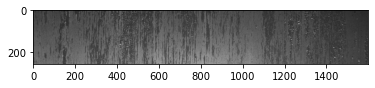

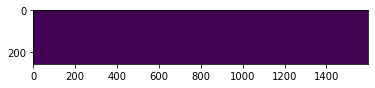

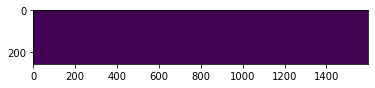

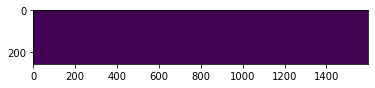

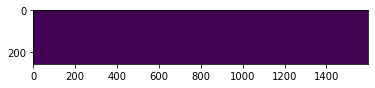

  4%|▎         | 196/5506 [01:48<48:44,  1.82it/s]

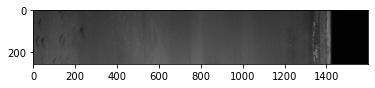

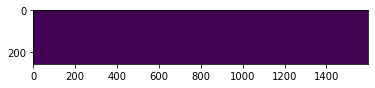

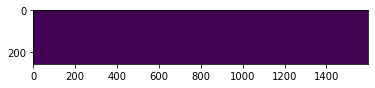

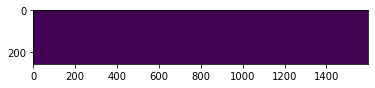

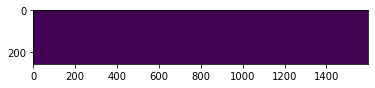

  4%|▎         | 197/5506 [01:49<48:03,  1.84it/s]

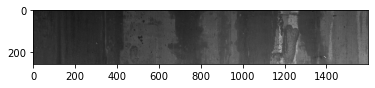

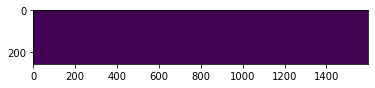

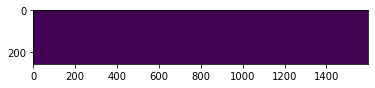

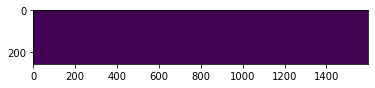

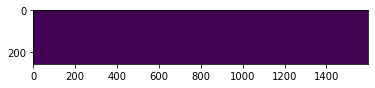

  4%|▎         | 198/5506 [01:49<49:45,  1.78it/s]

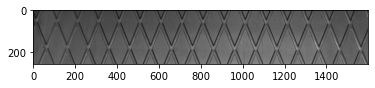

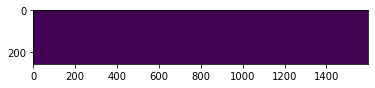

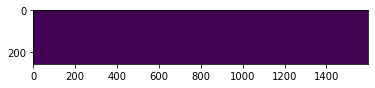

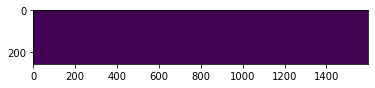

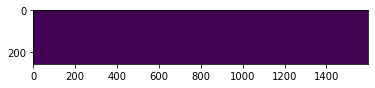

  4%|▎         | 199/5506 [01:50<48:35,  1.82it/s]

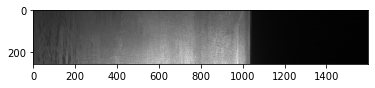

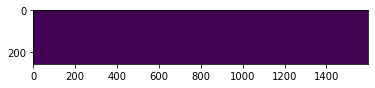

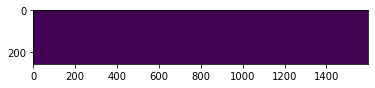

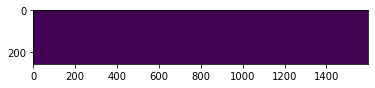

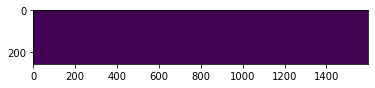

  4%|▎         | 200/5506 [01:50<48:05,  1.84it/s]

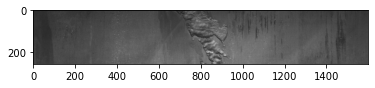

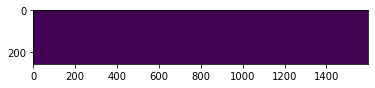

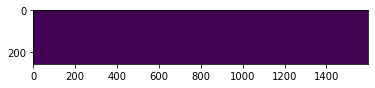

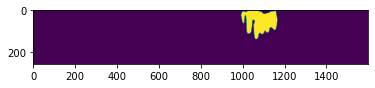

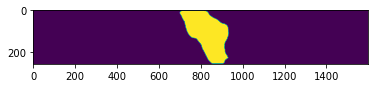

  4%|▎         | 201/5506 [01:51<47:29,  1.86it/s]

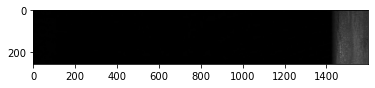

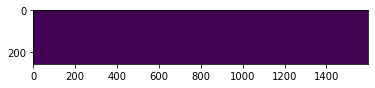

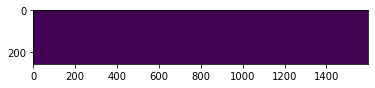

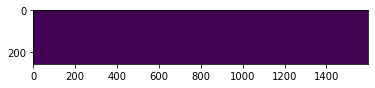

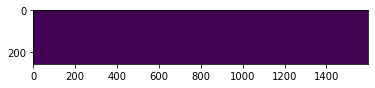

  4%|▎         | 202/5506 [01:52<48:57,  1.81it/s]

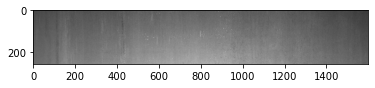

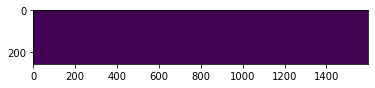

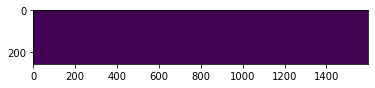

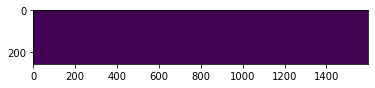

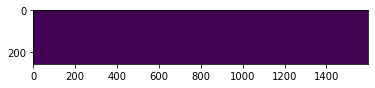

  4%|▎         | 203/5506 [01:52<48:16,  1.83it/s]

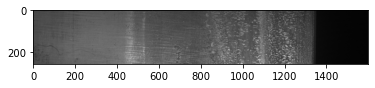

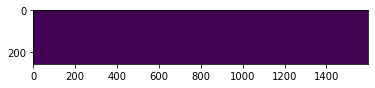

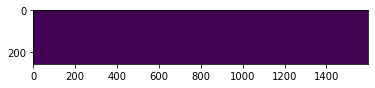

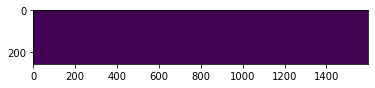

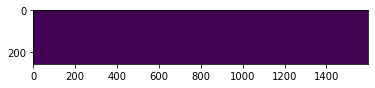

  4%|▎         | 204/5506 [01:53<47:50,  1.85it/s]

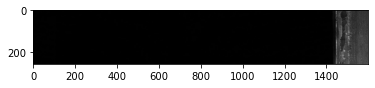

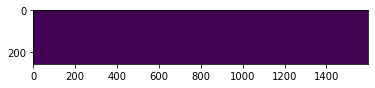

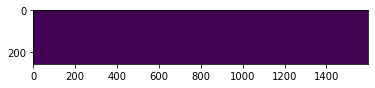

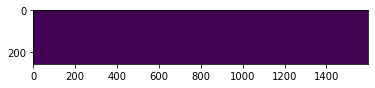

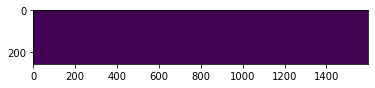

  4%|▎         | 205/5506 [01:53<47:25,  1.86it/s]

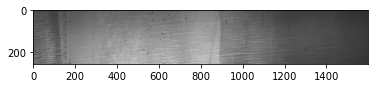

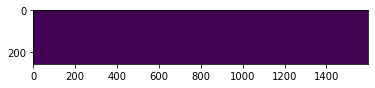

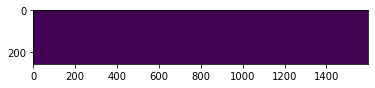

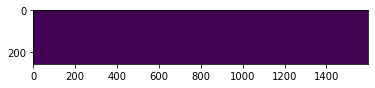

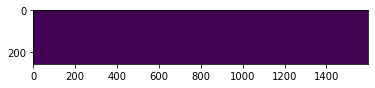

  4%|▎         | 206/5506 [01:54<49:14,  1.79it/s]

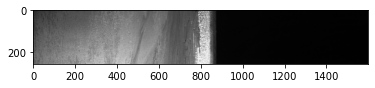

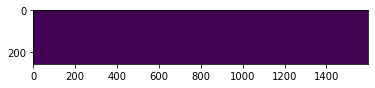

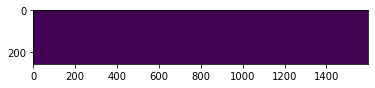

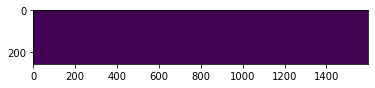

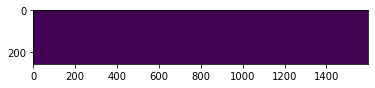

  4%|▍         | 207/5506 [01:54<48:22,  1.83it/s]

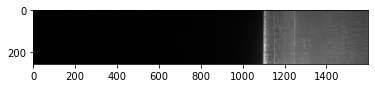

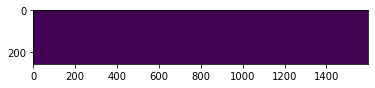

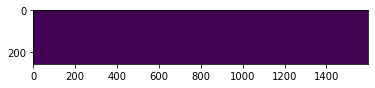

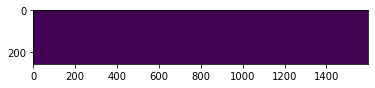

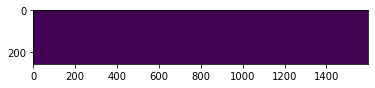

  4%|▍         | 208/5506 [01:55<47:53,  1.84it/s]

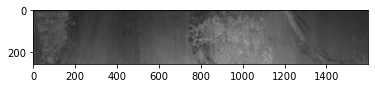

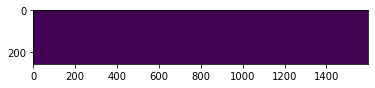

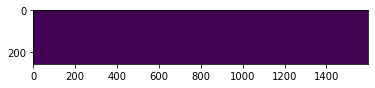

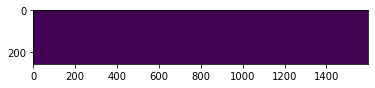

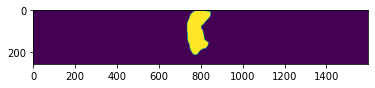

  4%|▍         | 209/5506 [01:55<49:52,  1.77it/s]

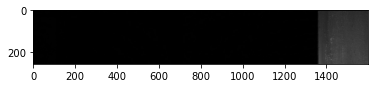

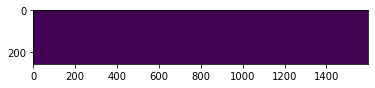

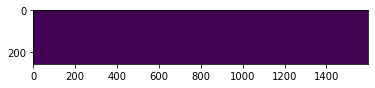

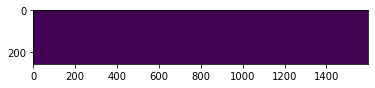

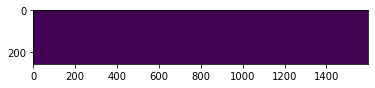

  4%|▍         | 210/5506 [01:56<48:42,  1.81it/s]

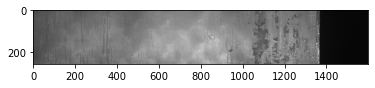

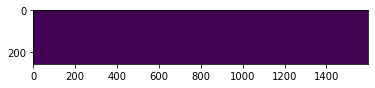

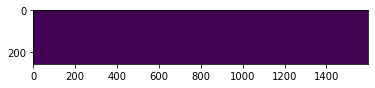

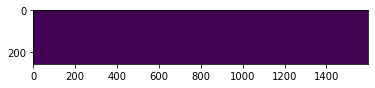

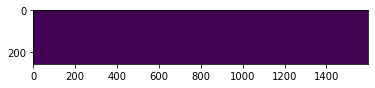

  4%|▍         | 211/5506 [01:56<47:51,  1.84it/s]

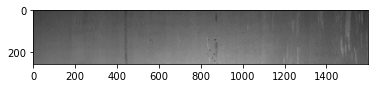

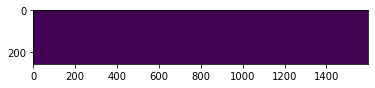

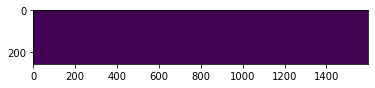

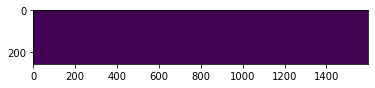

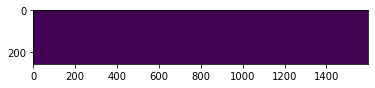

  4%|▍         | 212/5506 [01:57<47:33,  1.86it/s]

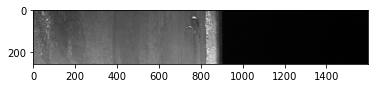

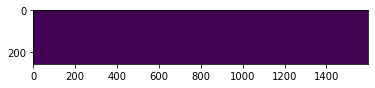

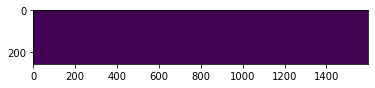

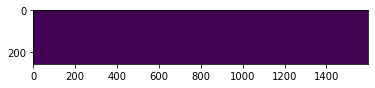

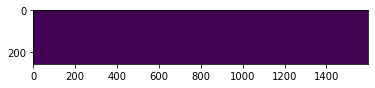

  4%|▍         | 213/5506 [01:58<49:23,  1.79it/s]

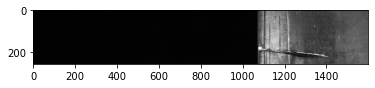

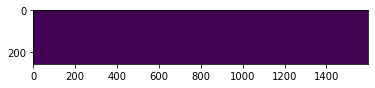

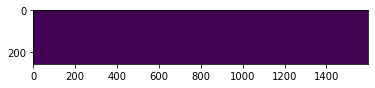

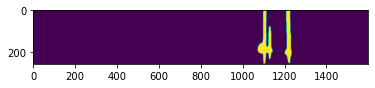

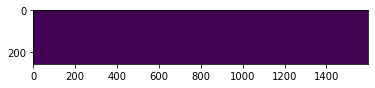

  4%|▍         | 214/5506 [01:58<48:28,  1.82it/s]

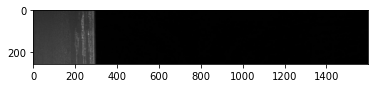

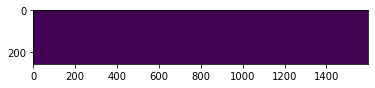

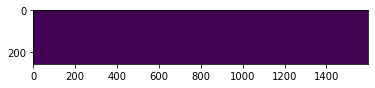

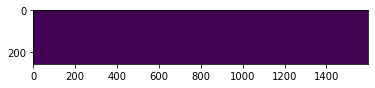

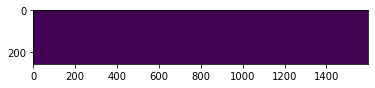

  4%|▍         | 215/5506 [01:59<48:36,  1.81it/s]

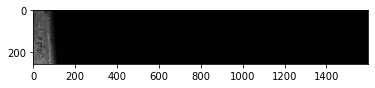

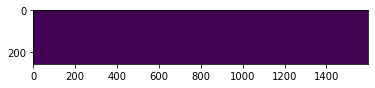

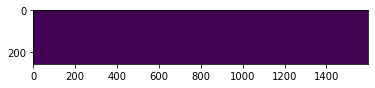

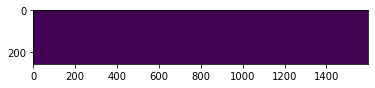

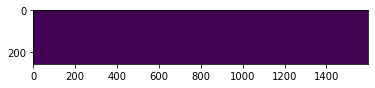

  4%|▍         | 216/5506 [01:59<49:55,  1.77it/s]

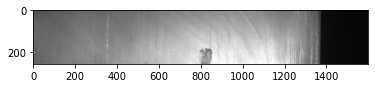

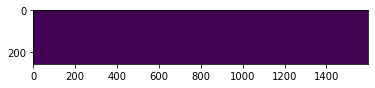

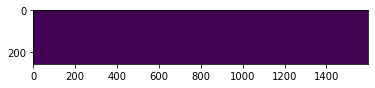

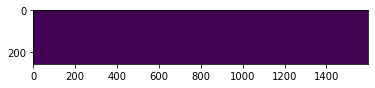

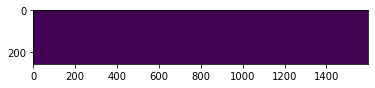

  4%|▍         | 217/5506 [02:00<49:01,  1.80it/s]

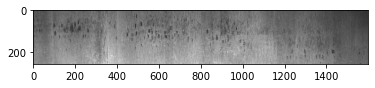

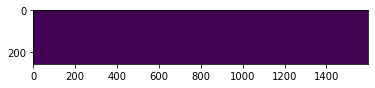

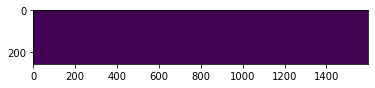

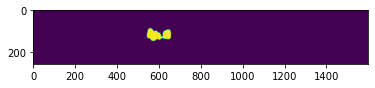

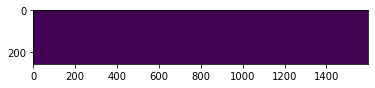

  4%|▍         | 218/5506 [02:00<48:38,  1.81it/s]

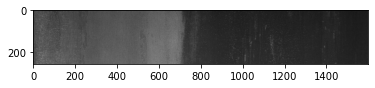

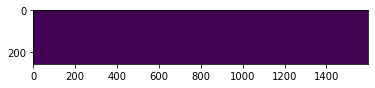

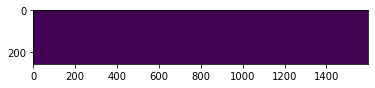

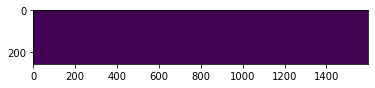

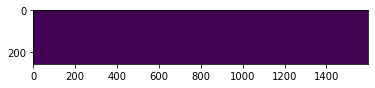

  4%|▍         | 219/5506 [02:01<47:36,  1.85it/s]

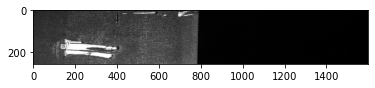

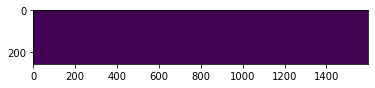

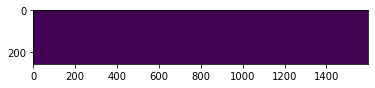

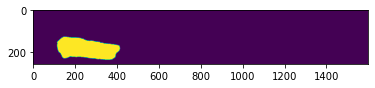

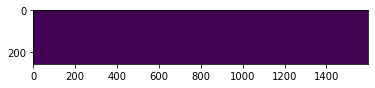

  4%|▍         | 220/5506 [02:01<49:18,  1.79it/s]

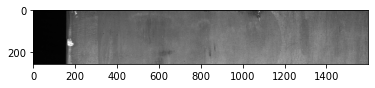

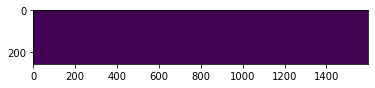

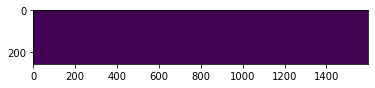

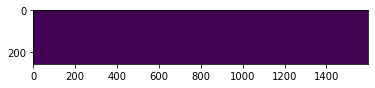

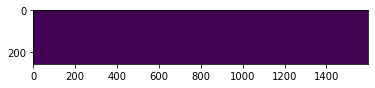

  4%|▍         | 221/5506 [02:02<48:33,  1.81it/s]

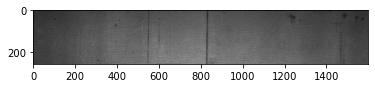

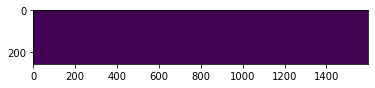

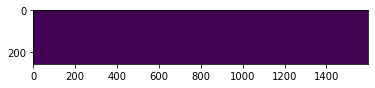

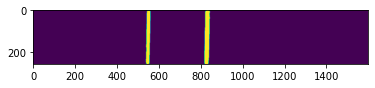

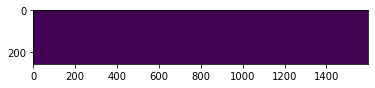

  4%|▍         | 222/5506 [02:02<47:33,  1.85it/s]

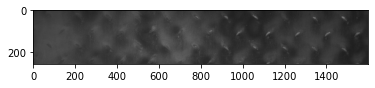

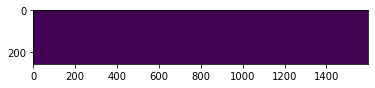

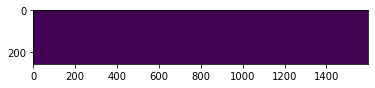

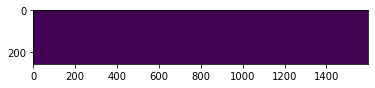

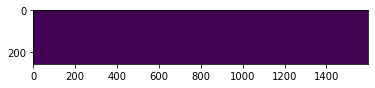

  4%|▍         | 223/5506 [02:03<47:01,  1.87it/s]

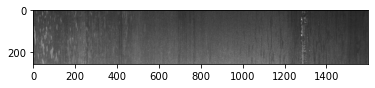

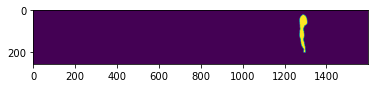

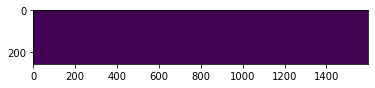

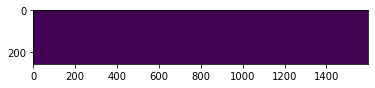

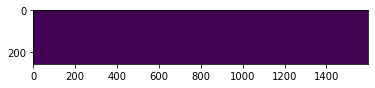

  4%|▍         | 224/5506 [02:04<48:37,  1.81it/s]

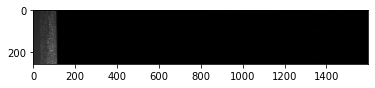

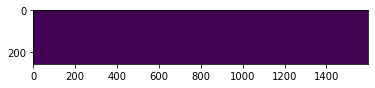

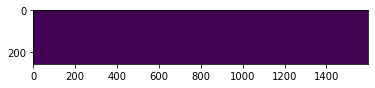

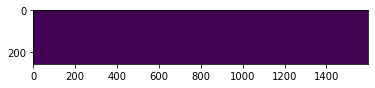

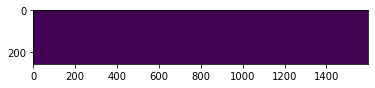

  4%|▍         | 225/5506 [02:04<47:33,  1.85it/s]

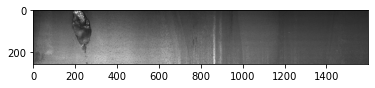

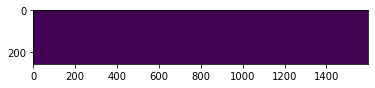

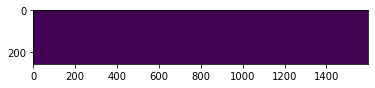

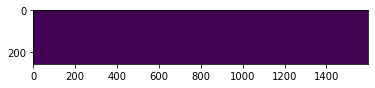

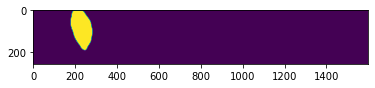

  4%|▍         | 226/5506 [02:05<46:58,  1.87it/s]

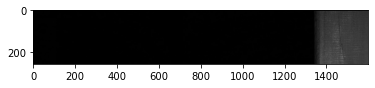

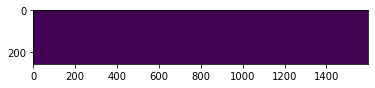

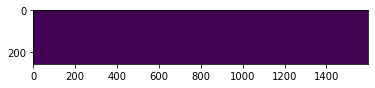

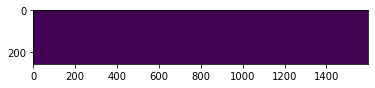

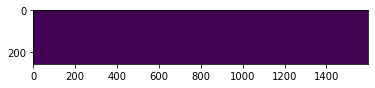

  4%|▍         | 227/5506 [02:05<48:25,  1.82it/s]

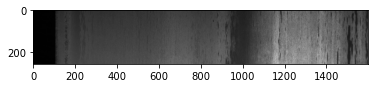

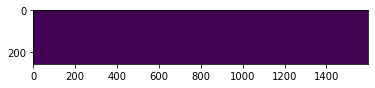

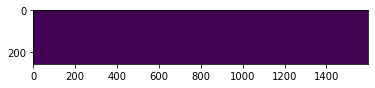

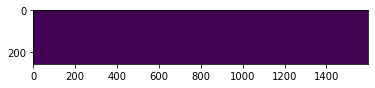

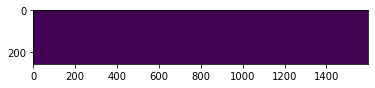

  4%|▍         | 228/5506 [02:06<47:15,  1.86it/s]

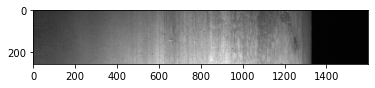

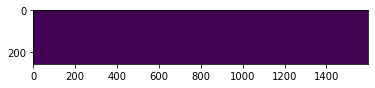

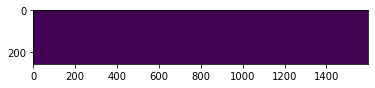

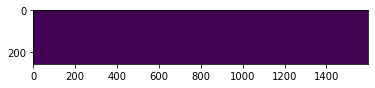

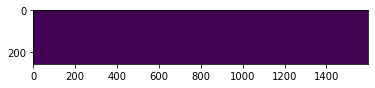

  4%|▍         | 229/5506 [02:06<46:43,  1.88it/s]

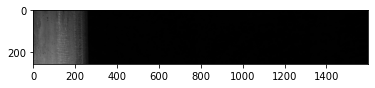

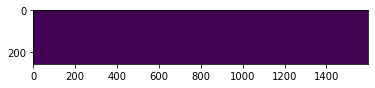

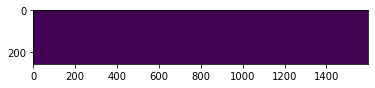

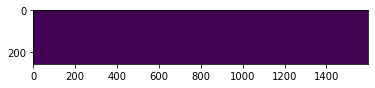

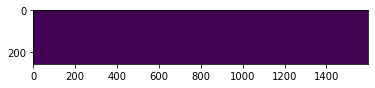

  4%|▍         | 230/5506 [02:07<46:26,  1.89it/s]

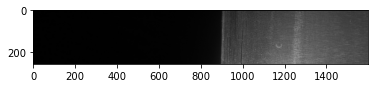

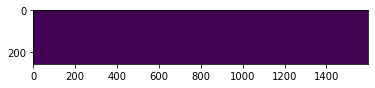

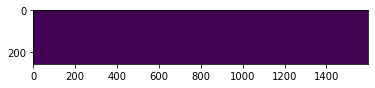

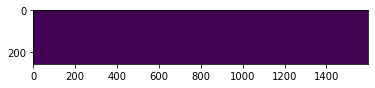

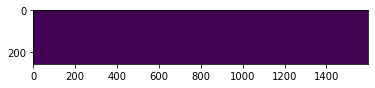

  4%|▍         | 231/5506 [02:07<48:32,  1.81it/s]

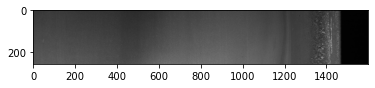

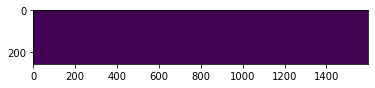

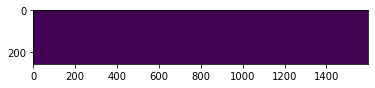

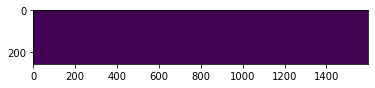

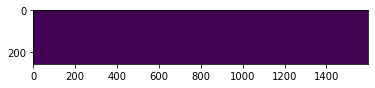

  4%|▍         | 232/5506 [02:08<47:46,  1.84it/s]

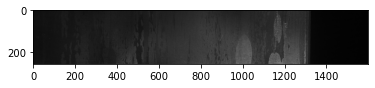

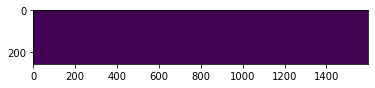

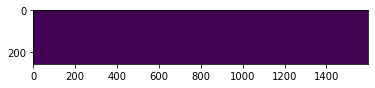

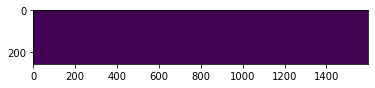

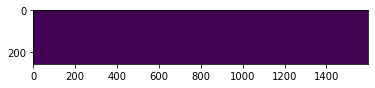

  4%|▍         | 233/5506 [02:08<47:16,  1.86it/s]

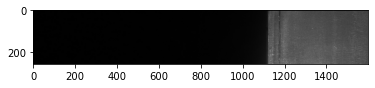

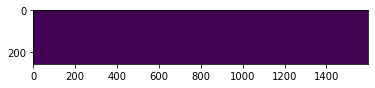

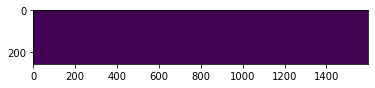

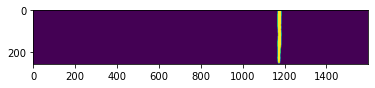

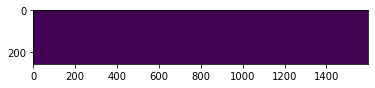

  4%|▍         | 234/5506 [02:09<49:12,  1.79it/s]

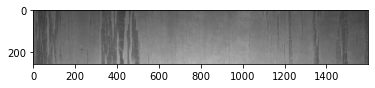

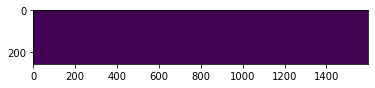

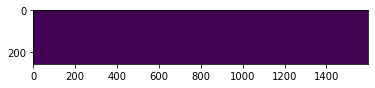

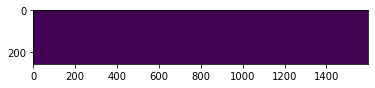

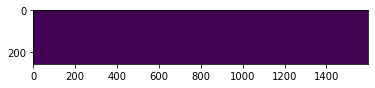

  4%|▍         | 235/5506 [02:10<48:05,  1.83it/s]

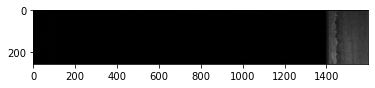

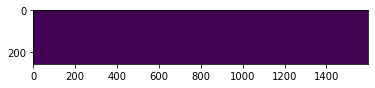

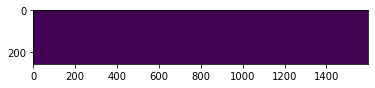

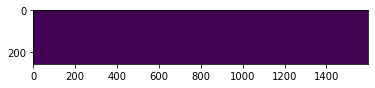

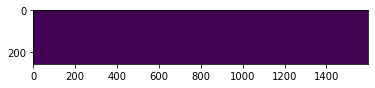

  4%|▍         | 236/5506 [02:10<47:03,  1.87it/s]

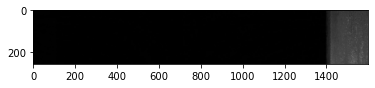

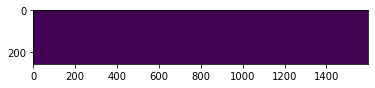

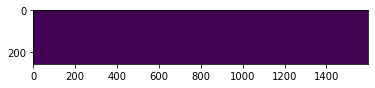

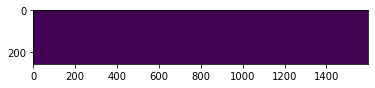

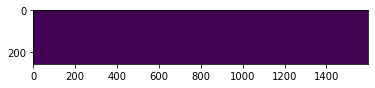

  4%|▍         | 237/5506 [02:11<46:20,  1.89it/s]

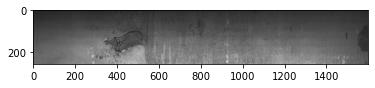

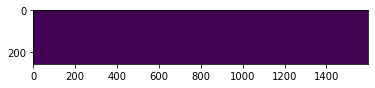

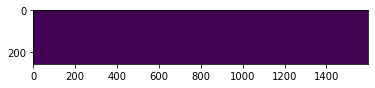

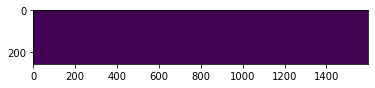

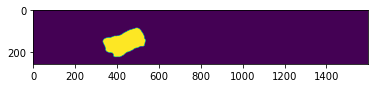

  4%|▍         | 238/5506 [02:11<48:03,  1.83it/s]

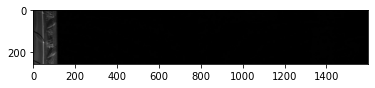

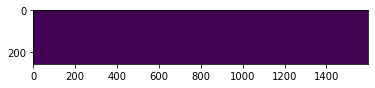

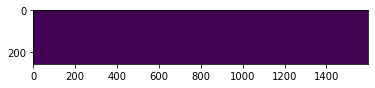

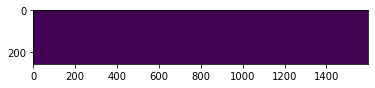

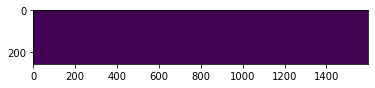

  4%|▍         | 239/5506 [02:12<47:34,  1.84it/s]

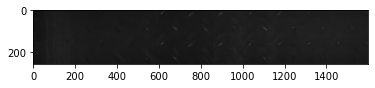

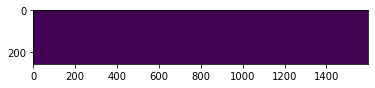

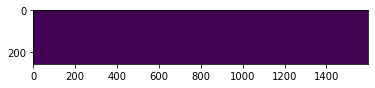

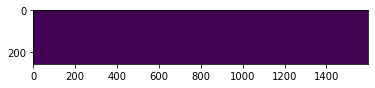

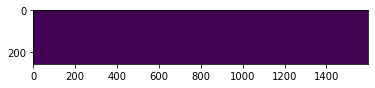

  4%|▍         | 240/5506 [02:12<47:00,  1.87it/s]

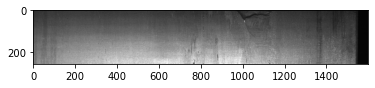

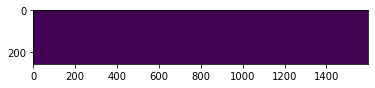

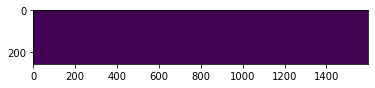

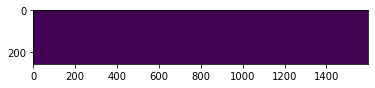

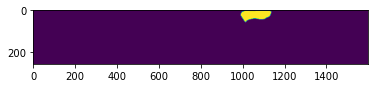

  4%|▍         | 241/5506 [02:13<46:33,  1.88it/s]

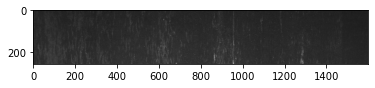

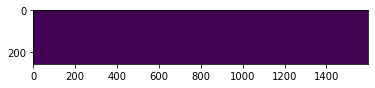

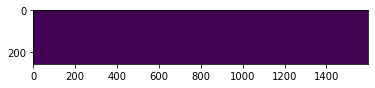

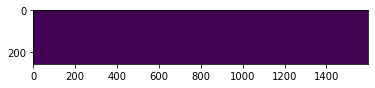

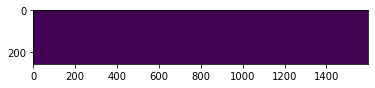

  4%|▍         | 242/5506 [02:13<49:11,  1.78it/s]

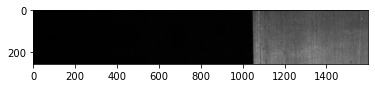

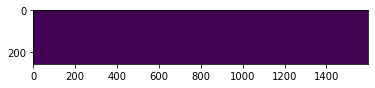

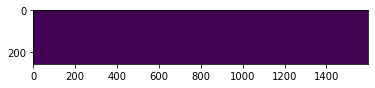

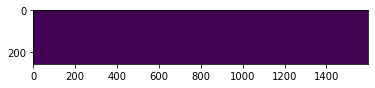

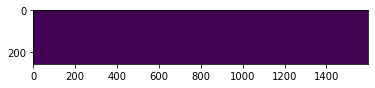

  4%|▍         | 243/5506 [02:14<48:08,  1.82it/s]

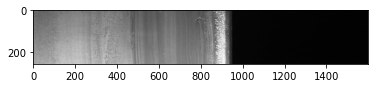

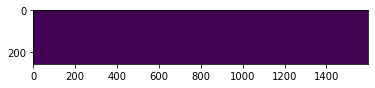

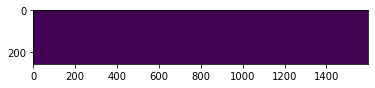

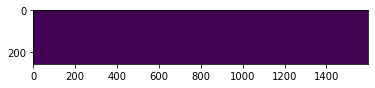

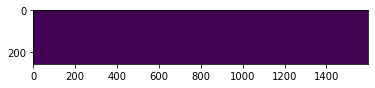

  4%|▍         | 244/5506 [02:14<47:49,  1.83it/s]

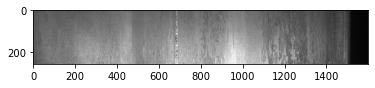

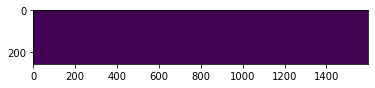

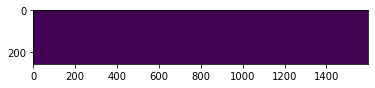

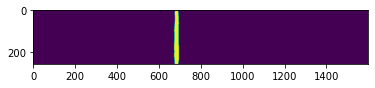

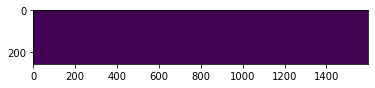

  4%|▍         | 245/5506 [02:15<49:22,  1.78it/s]

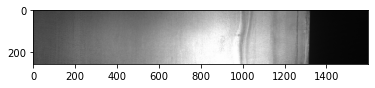

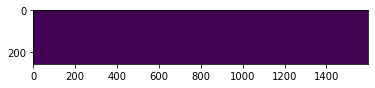

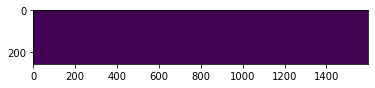

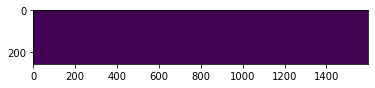

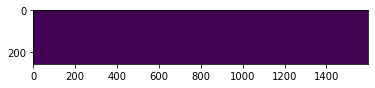

  4%|▍         | 246/5506 [02:16<47:58,  1.83it/s]

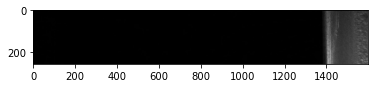

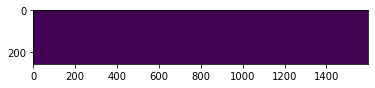

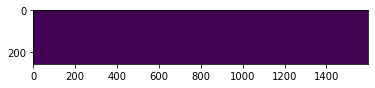

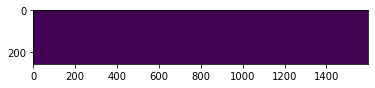

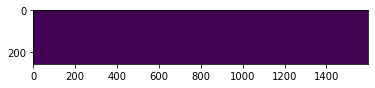

  4%|▍         | 247/5506 [02:16<47:05,  1.86it/s]

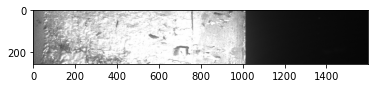

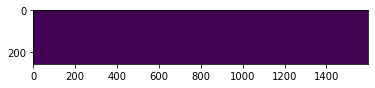

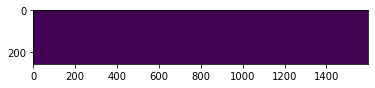

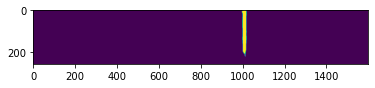

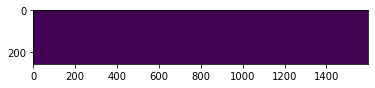

  5%|▍         | 248/5506 [02:17<46:37,  1.88it/s]

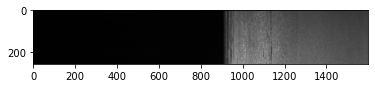

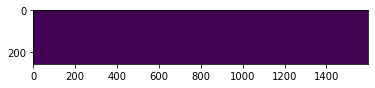

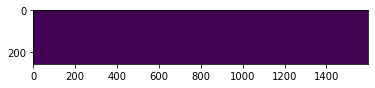

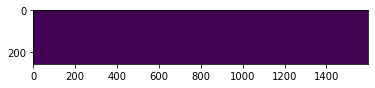

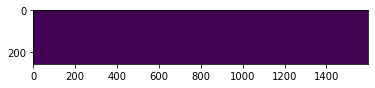

  5%|▍         | 249/5506 [02:17<48:40,  1.80it/s]

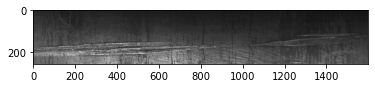

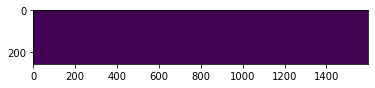

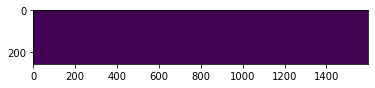

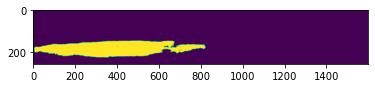

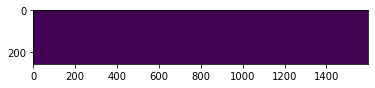

  5%|▍         | 250/5506 [02:18<47:47,  1.83it/s]

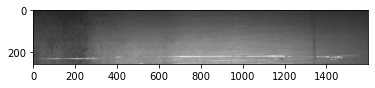

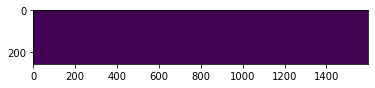

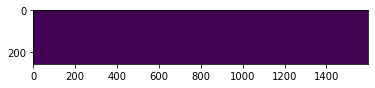

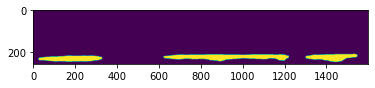

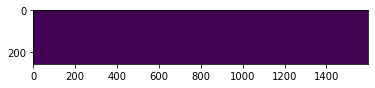

  5%|▍         | 251/5506 [02:18<47:38,  1.84it/s]

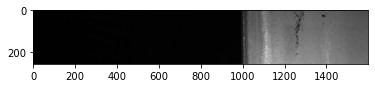

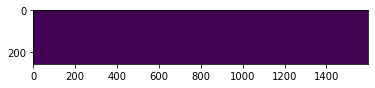

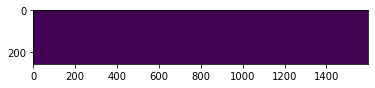

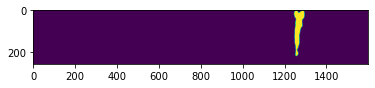

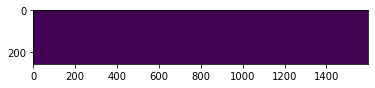

  5%|▍         | 252/5506 [02:19<48:53,  1.79it/s]

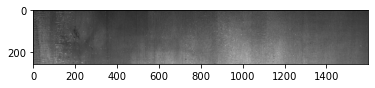

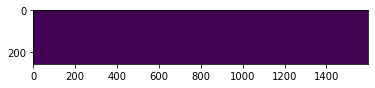

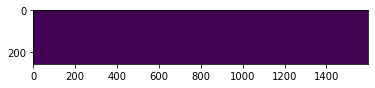

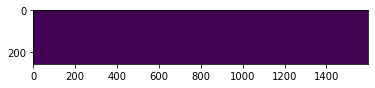

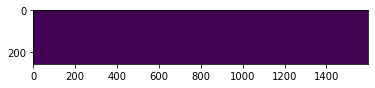

  5%|▍         | 253/5506 [02:19<47:38,  1.84it/s]

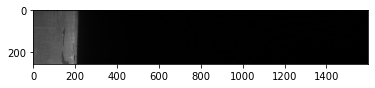

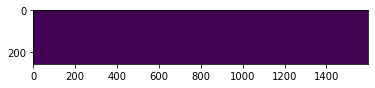

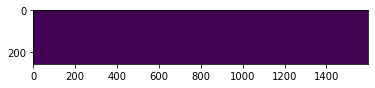

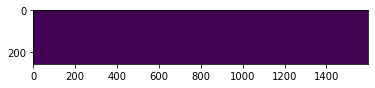

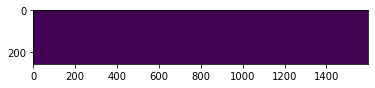

  5%|▍         | 254/5506 [02:20<47:29,  1.84it/s]

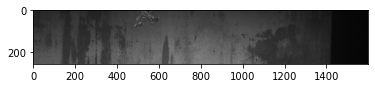

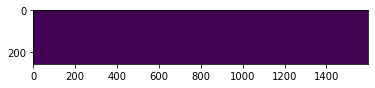

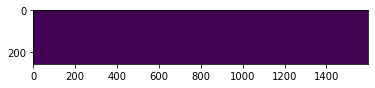

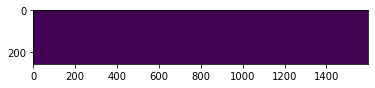

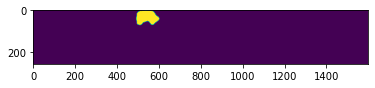

  5%|▍         | 255/5506 [02:20<47:08,  1.86it/s]

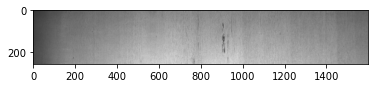

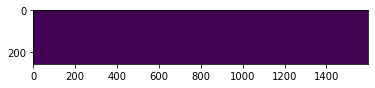

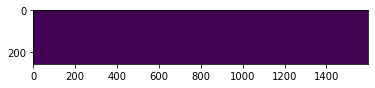

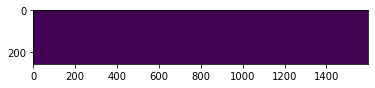

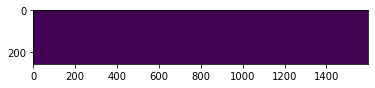

  5%|▍         | 256/5506 [02:21<49:29,  1.77it/s]

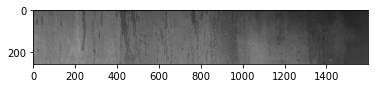

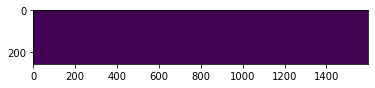

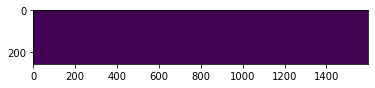

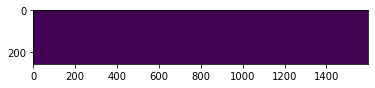

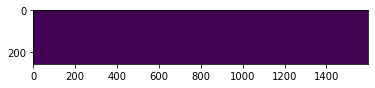

  5%|▍         | 257/5506 [02:22<48:24,  1.81it/s]

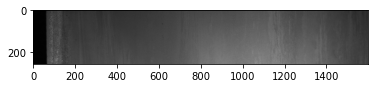

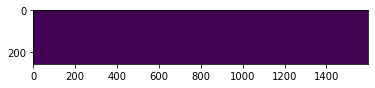

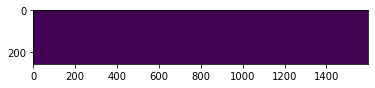

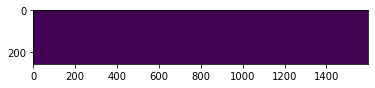

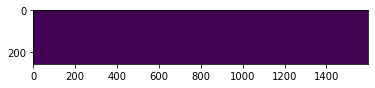

  5%|▍         | 258/5506 [02:22<47:31,  1.84it/s]

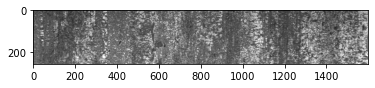

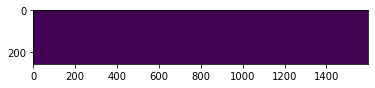

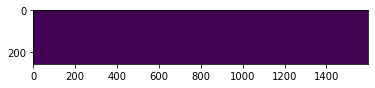

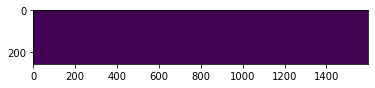

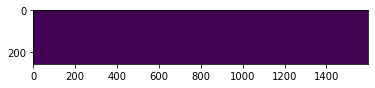

  5%|▍         | 259/5506 [02:23<46:49,  1.87it/s]

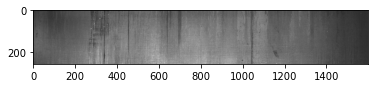

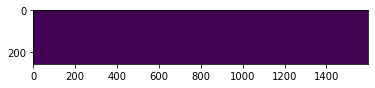

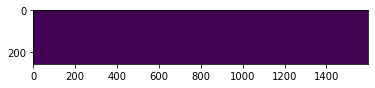

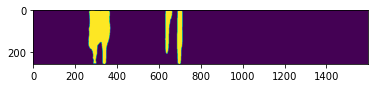

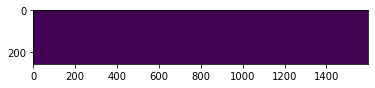

  5%|▍         | 260/5506 [02:23<48:59,  1.78it/s]

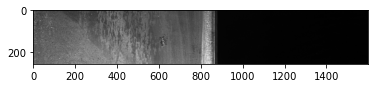

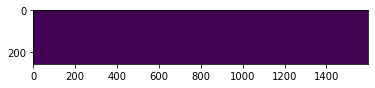

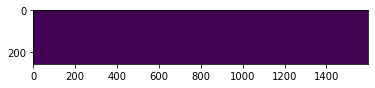

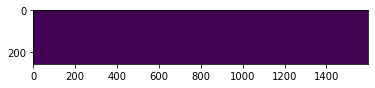

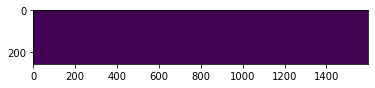

  5%|▍         | 261/5506 [02:24<47:42,  1.83it/s]

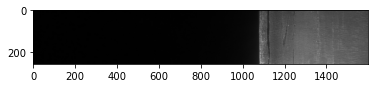

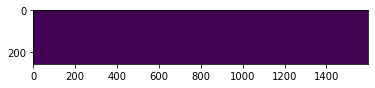

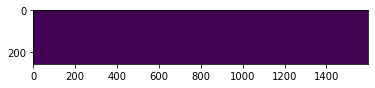

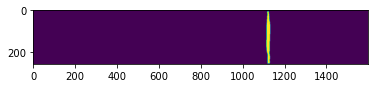

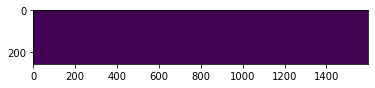

  5%|▍         | 262/5506 [02:24<47:06,  1.86it/s]

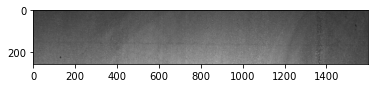

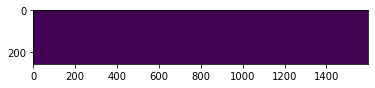

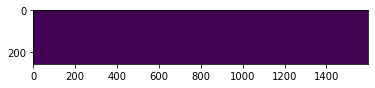

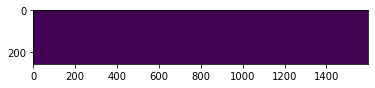

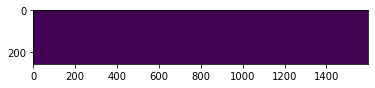

  5%|▍         | 263/5506 [02:25<48:57,  1.78it/s]

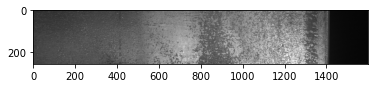

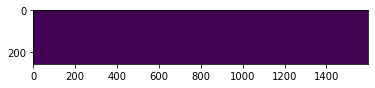

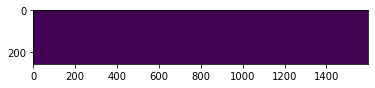

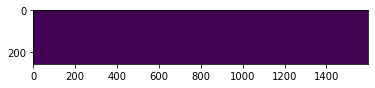

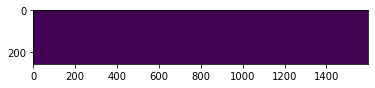

  5%|▍         | 264/5506 [02:25<48:08,  1.81it/s]

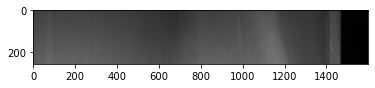

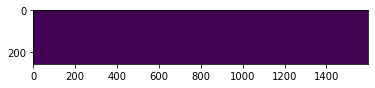

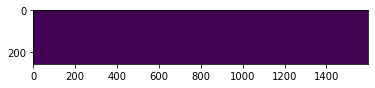

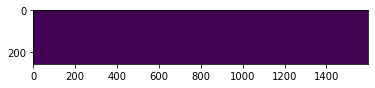

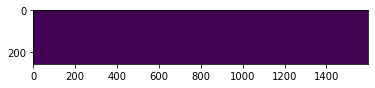

  5%|▍         | 265/5506 [02:26<47:20,  1.84it/s]

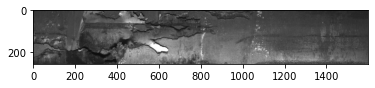

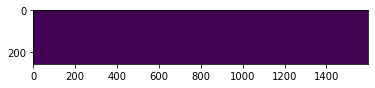

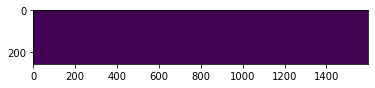

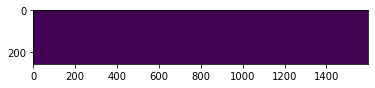

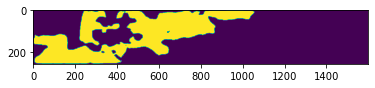

  5%|▍         | 266/5506 [02:26<47:00,  1.86it/s]

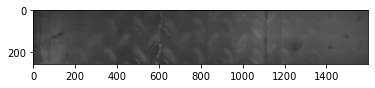

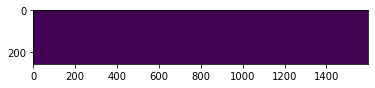

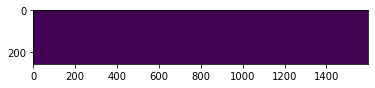

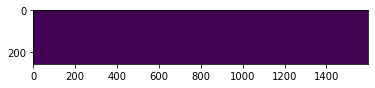

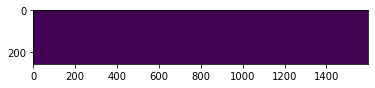

  5%|▍         | 267/5506 [02:27<49:05,  1.78it/s]

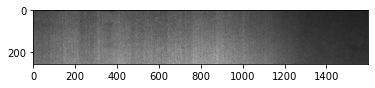

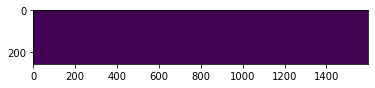

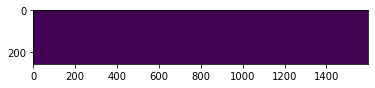

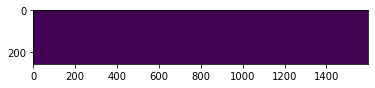

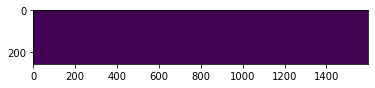

  5%|▍         | 268/5506 [02:28<48:14,  1.81it/s]

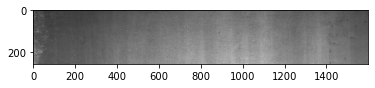

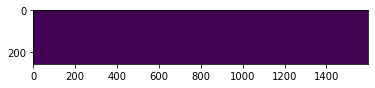

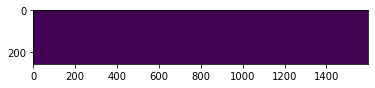

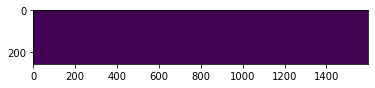

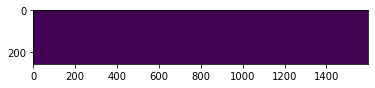

  5%|▍         | 269/5506 [02:28<47:28,  1.84it/s]

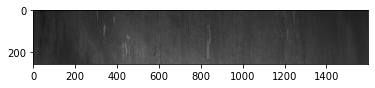

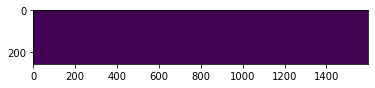

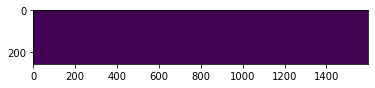

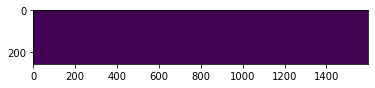

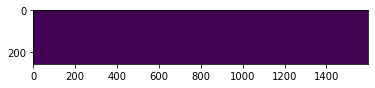

  5%|▍         | 270/5506 [02:29<49:05,  1.78it/s]

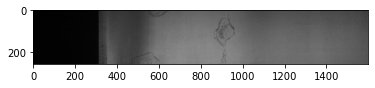

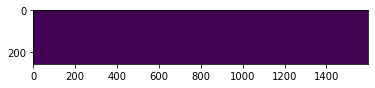

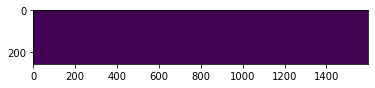

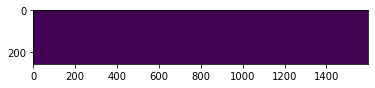

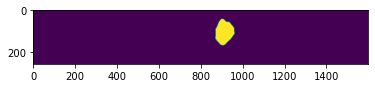

  5%|▍         | 271/5506 [02:29<48:20,  1.80it/s]

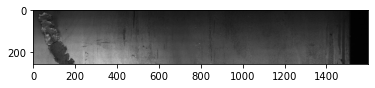

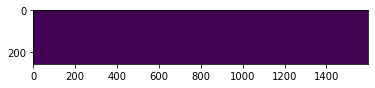

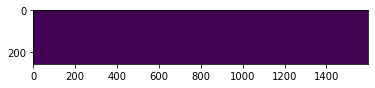

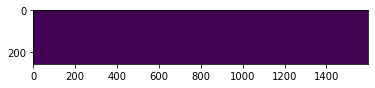

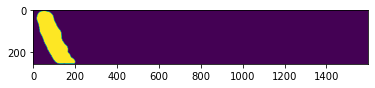

  5%|▍         | 272/5506 [02:30<48:08,  1.81it/s]

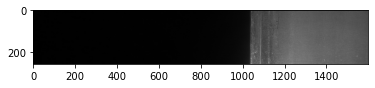

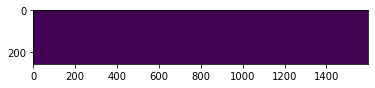

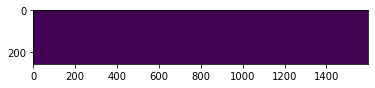

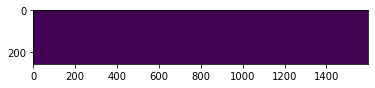

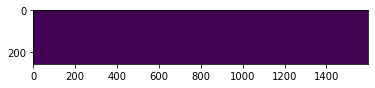

  5%|▍         | 273/5506 [02:30<47:26,  1.84it/s]

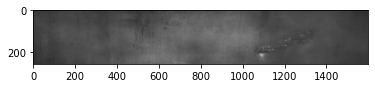

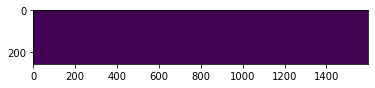

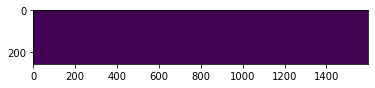

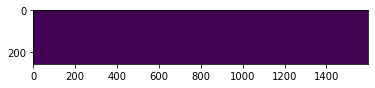

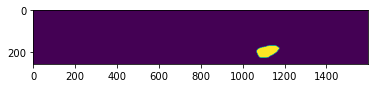

  5%|▍         | 274/5506 [02:31<49:12,  1.77it/s]

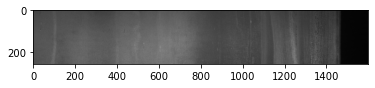

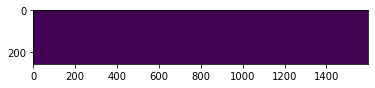

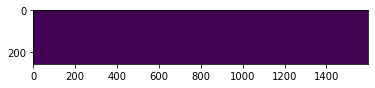

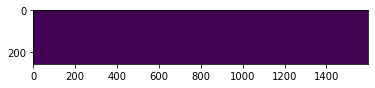

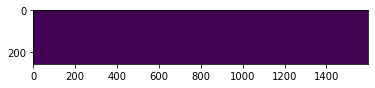

  5%|▍         | 275/5506 [02:31<48:01,  1.82it/s]

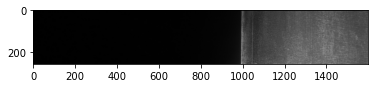

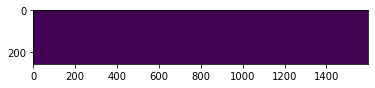

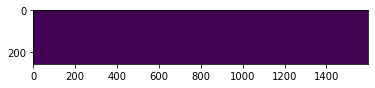

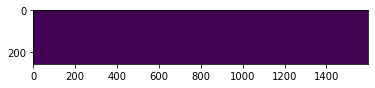

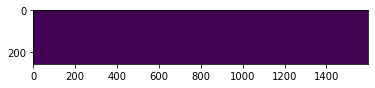

  5%|▌         | 276/5506 [02:32<46:49,  1.86it/s]

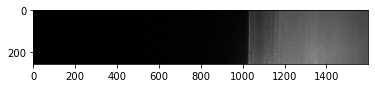

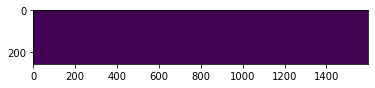

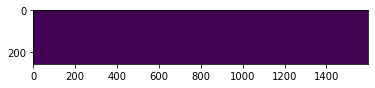

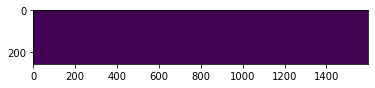

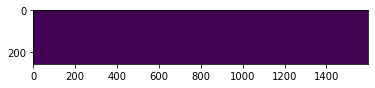

  5%|▌         | 277/5506 [02:32<46:07,  1.89it/s]

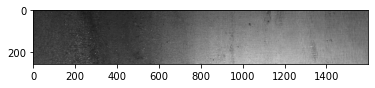

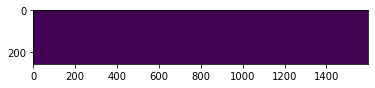

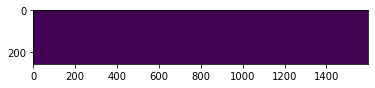

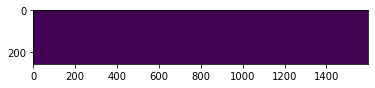

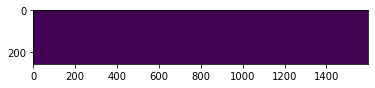

  5%|▌         | 278/5506 [02:33<47:59,  1.82it/s]

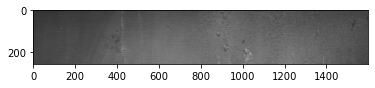

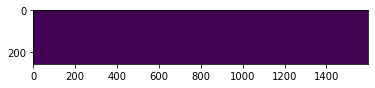

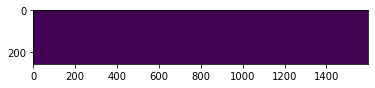

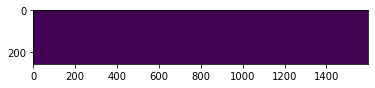

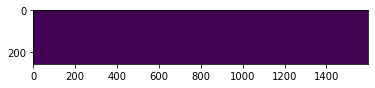

  5%|▌         | 279/5506 [02:34<47:14,  1.84it/s]

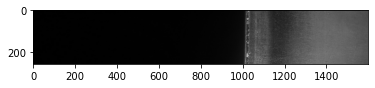

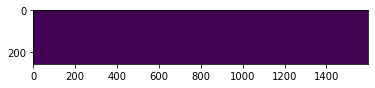

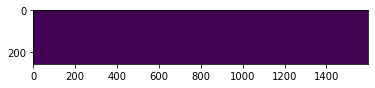

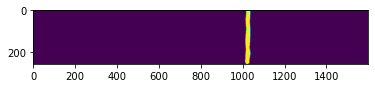

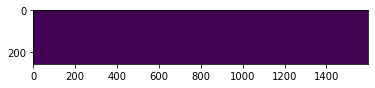

  5%|▌         | 280/5506 [02:34<46:16,  1.88it/s]

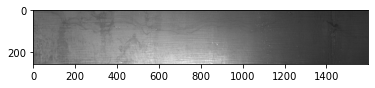

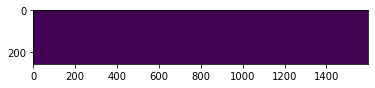

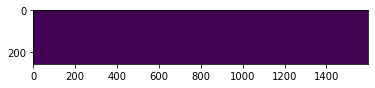

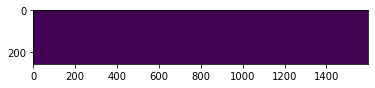

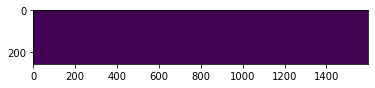

  5%|▌         | 281/5506 [02:35<48:12,  1.81it/s]

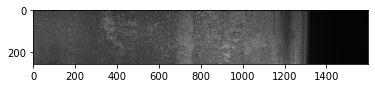

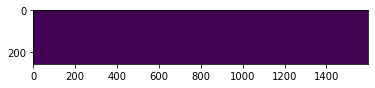

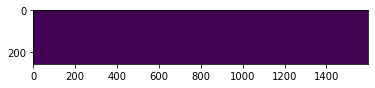

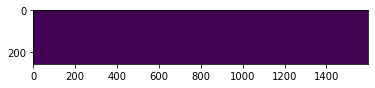

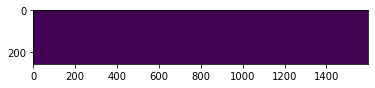

  5%|▌         | 282/5506 [02:35<47:47,  1.82it/s]

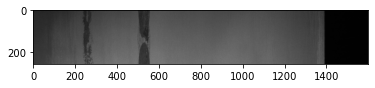

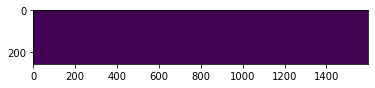

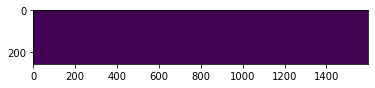

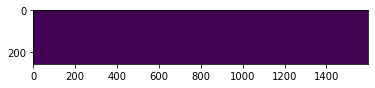

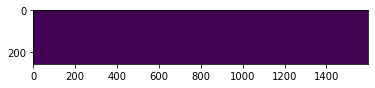

  5%|▌         | 283/5506 [02:36<46:53,  1.86it/s]

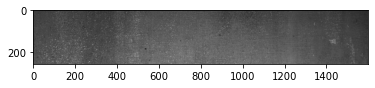

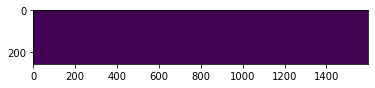

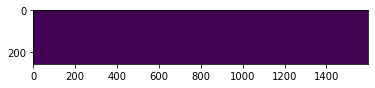

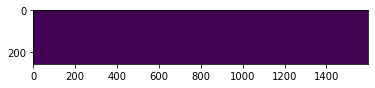

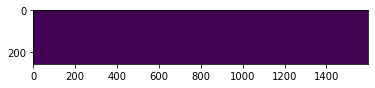

  5%|▌         | 284/5506 [02:36<46:12,  1.88it/s]

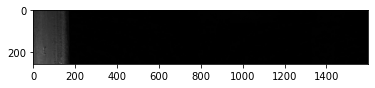

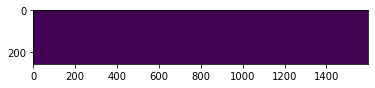

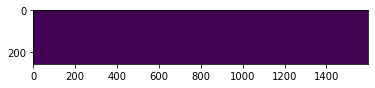

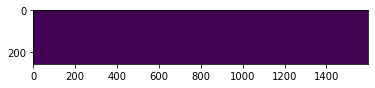

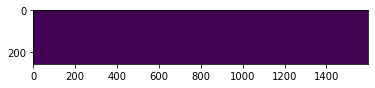

  5%|▌         | 285/5506 [02:37<49:08,  1.77it/s]

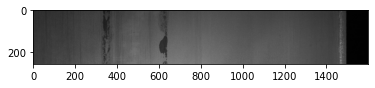

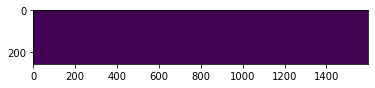

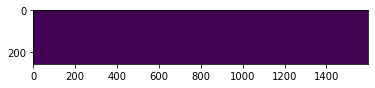

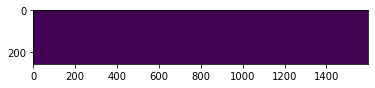

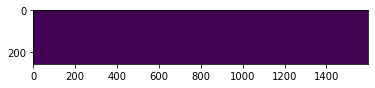

  5%|▌         | 286/5506 [02:37<48:19,  1.80it/s]

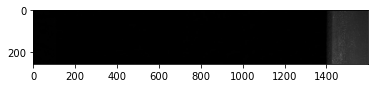

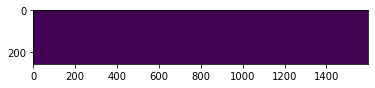

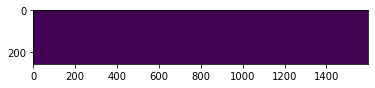

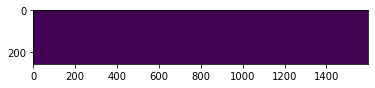

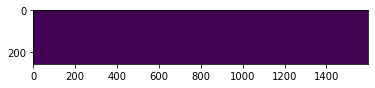

  5%|▌         | 287/5506 [02:38<47:20,  1.84it/s]

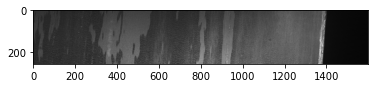

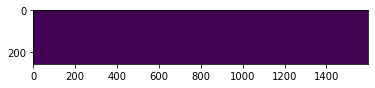

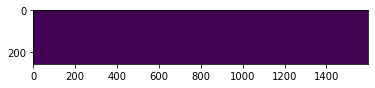

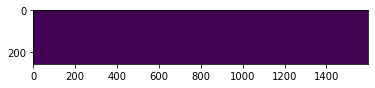

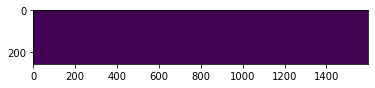

  5%|▌         | 288/5506 [02:39<48:50,  1.78it/s]

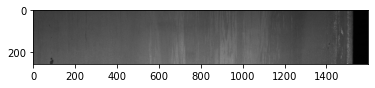

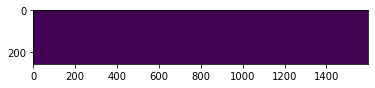

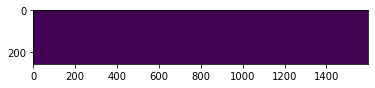

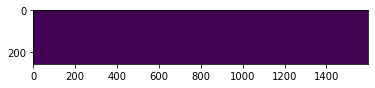

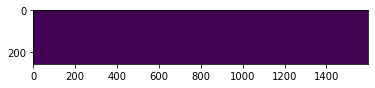

  5%|▌         | 289/5506 [02:39<47:56,  1.81it/s]

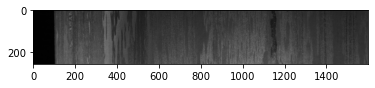

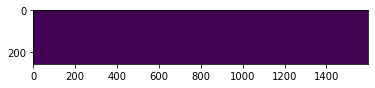

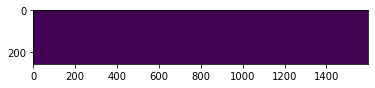

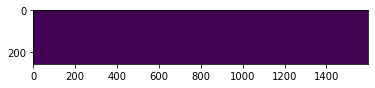

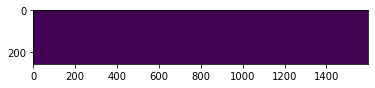

  5%|▌         | 290/5506 [02:40<47:23,  1.83it/s]

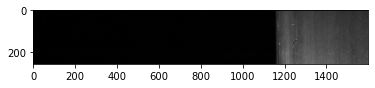

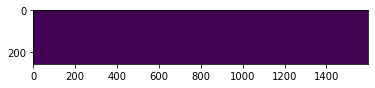

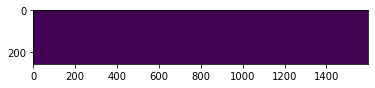

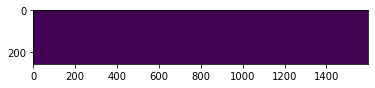

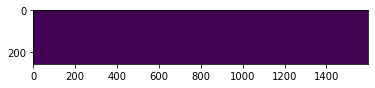

  5%|▌         | 291/5506 [02:40<46:55,  1.85it/s]

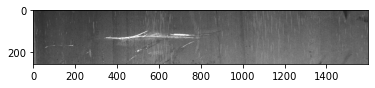

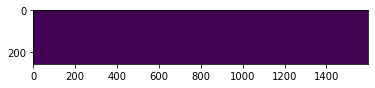

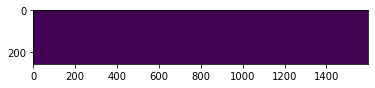

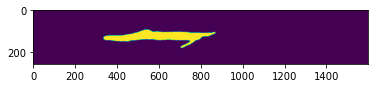

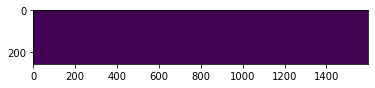

  5%|▌         | 292/5506 [02:41<48:45,  1.78it/s]

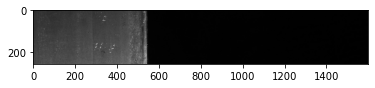

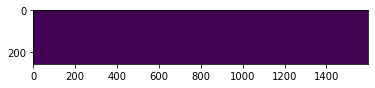

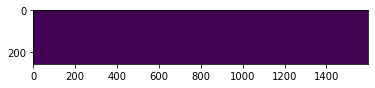

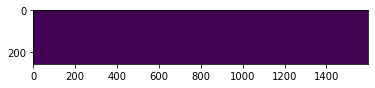

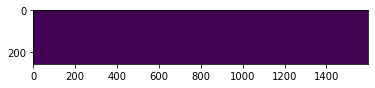

  5%|▌         | 293/5506 [02:41<47:39,  1.82it/s]

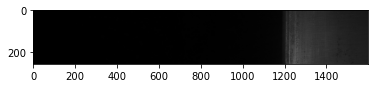

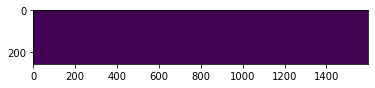

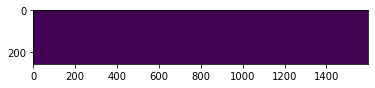

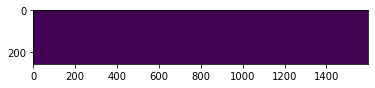

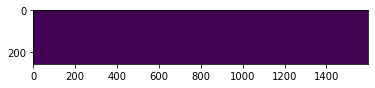

  5%|▌         | 294/5506 [02:42<47:19,  1.84it/s]

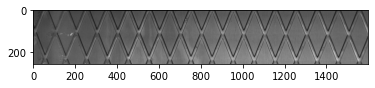

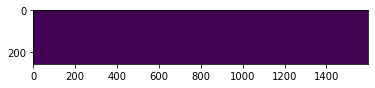

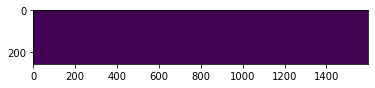

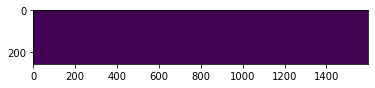

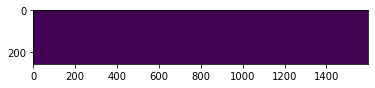

  5%|▌         | 295/5506 [02:42<47:17,  1.84it/s]

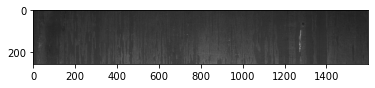

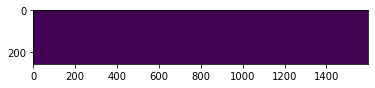

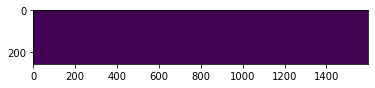

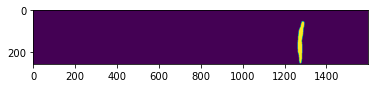

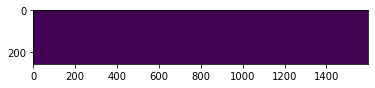

  5%|▌         | 296/5506 [02:43<49:25,  1.76it/s]

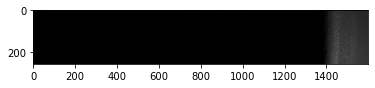

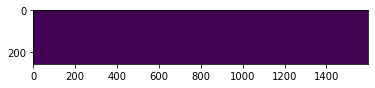

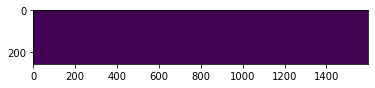

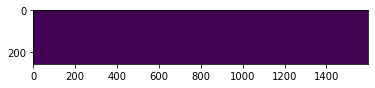

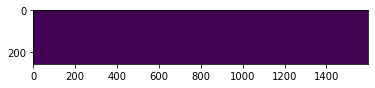

  5%|▌         | 297/5506 [02:44<48:54,  1.78it/s]

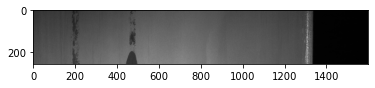

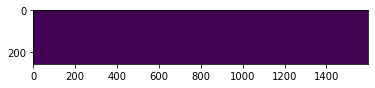

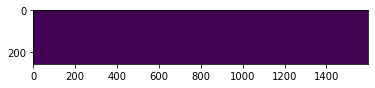

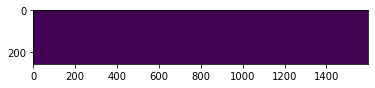

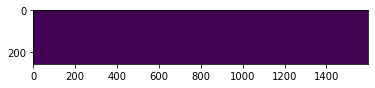

  5%|▌         | 298/5506 [02:44<48:29,  1.79it/s]

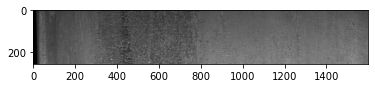

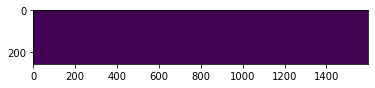

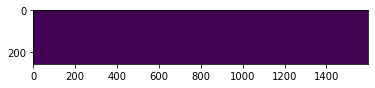

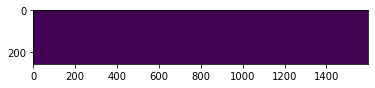

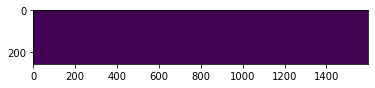

  5%|▌         | 299/5506 [02:45<50:11,  1.73it/s]

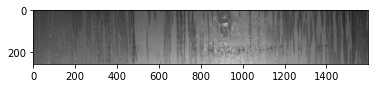

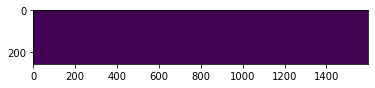

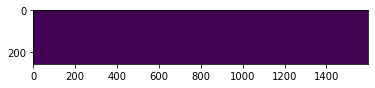

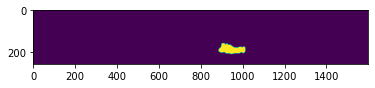

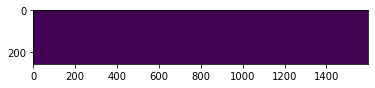

  5%|▌         | 300/5506 [02:45<48:43,  1.78it/s]

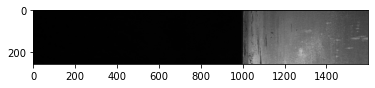

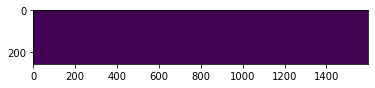

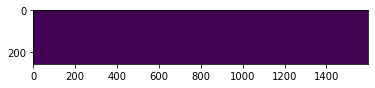

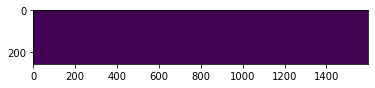

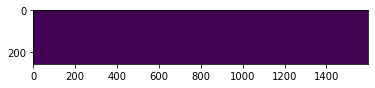

  5%|▌         | 301/5506 [02:46<47:25,  1.83it/s]

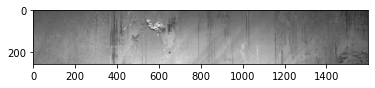

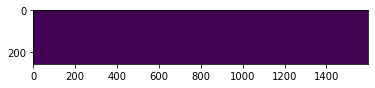

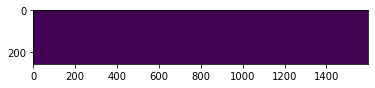

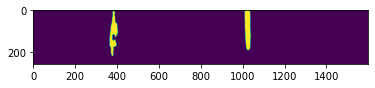

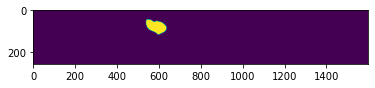

  5%|▌         | 302/5506 [02:46<46:49,  1.85it/s]

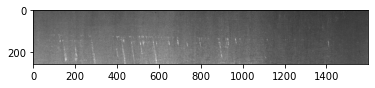

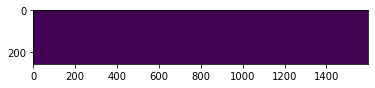

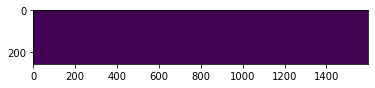

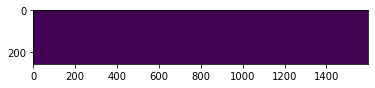

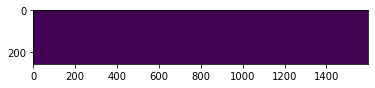

  6%|▌         | 303/5506 [02:47<48:34,  1.79it/s]

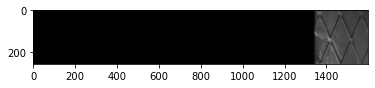

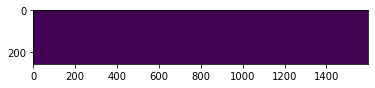

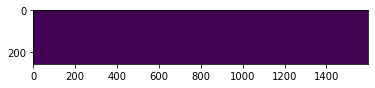

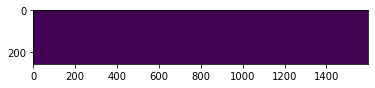

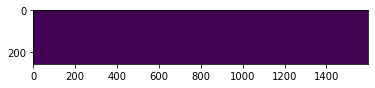

  6%|▌         | 304/5506 [02:47<47:52,  1.81it/s]

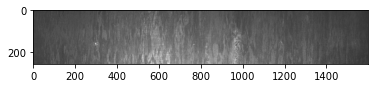

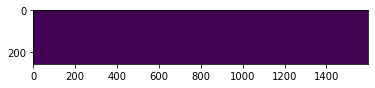

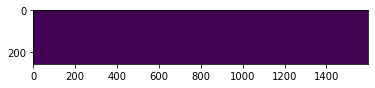

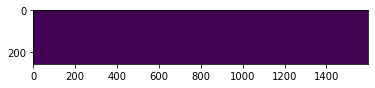

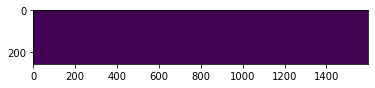

  6%|▌         | 305/5506 [02:48<47:24,  1.83it/s]

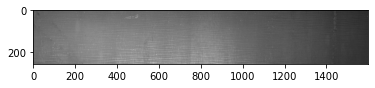

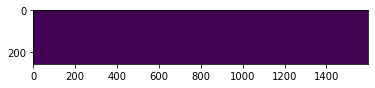

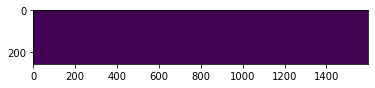

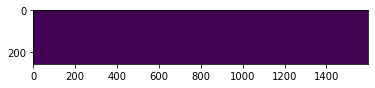

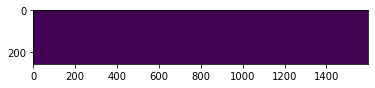

  6%|▌         | 306/5506 [02:49<48:53,  1.77it/s]

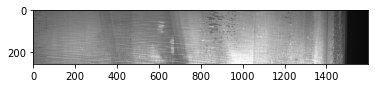

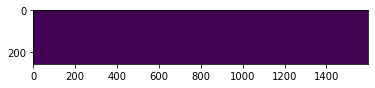

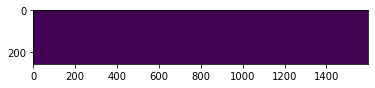

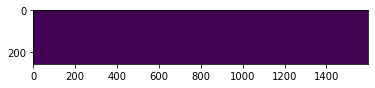

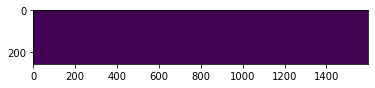

  6%|▌         | 307/5506 [02:49<47:34,  1.82it/s]

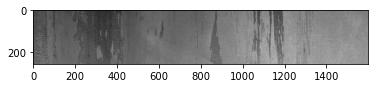

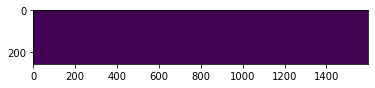

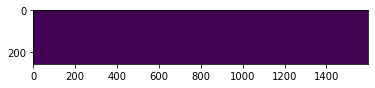

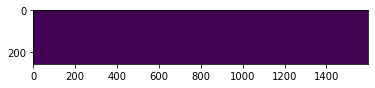

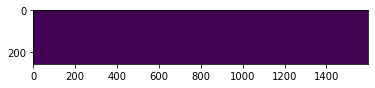

  6%|▌         | 308/5506 [02:50<47:00,  1.84it/s]

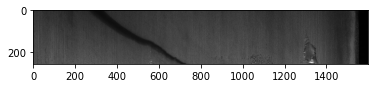

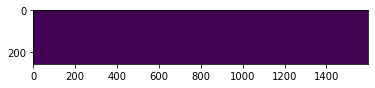

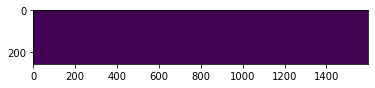

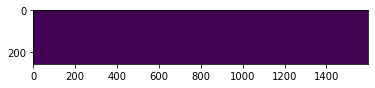

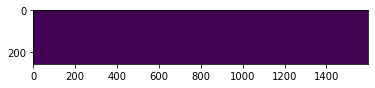

  6%|▌         | 309/5506 [02:50<46:27,  1.86it/s]

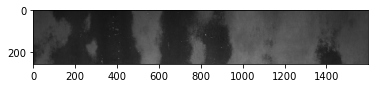

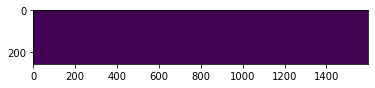

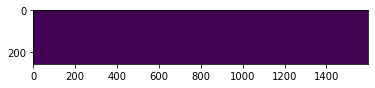

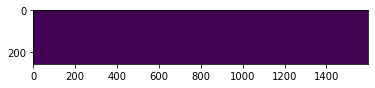

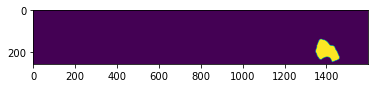

  6%|▌         | 310/5506 [02:51<48:45,  1.78it/s]

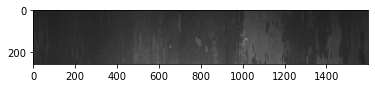

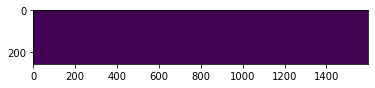

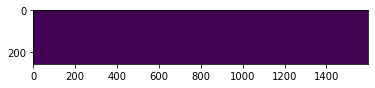

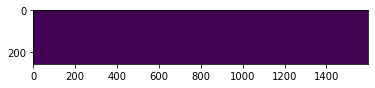

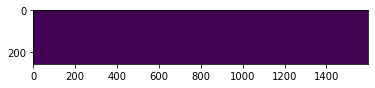

  6%|▌         | 311/5506 [02:51<48:58,  1.77it/s]

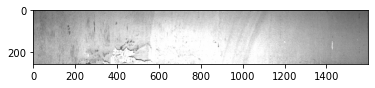

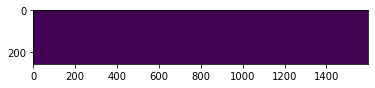

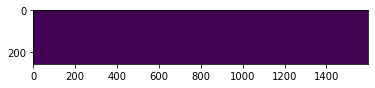

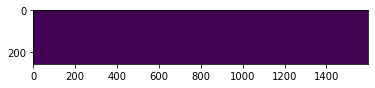

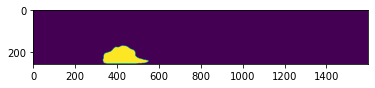

  6%|▌         | 312/5506 [02:52<48:27,  1.79it/s]

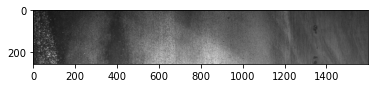

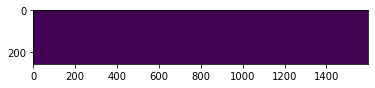

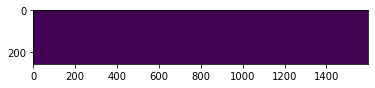

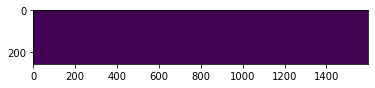

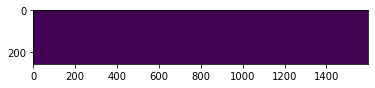

  6%|▌         | 313/5506 [02:52<47:37,  1.82it/s]

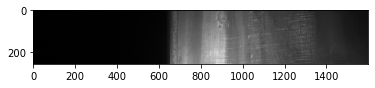

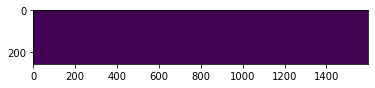

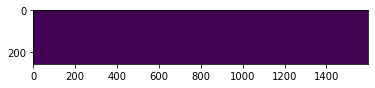

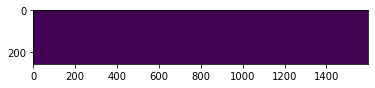

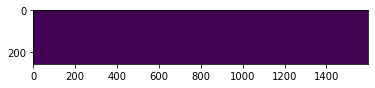

  6%|▌         | 314/5506 [02:53<49:50,  1.74it/s]

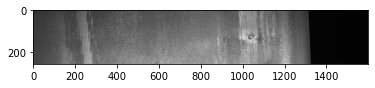

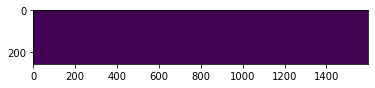

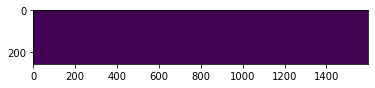

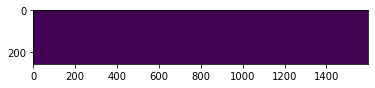

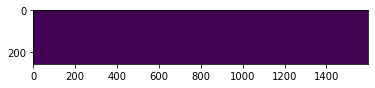

  6%|▌         | 315/5506 [02:54<48:21,  1.79it/s]

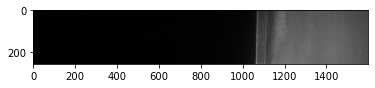

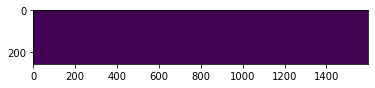

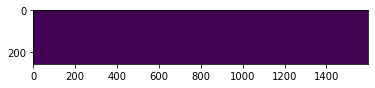

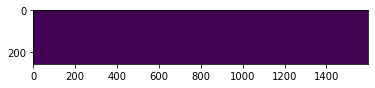

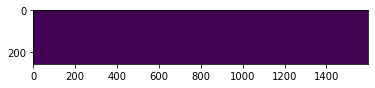

  6%|▌         | 316/5506 [02:54<47:05,  1.84it/s]

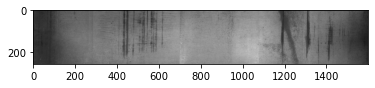

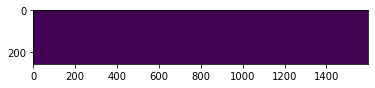

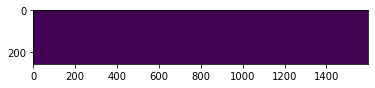

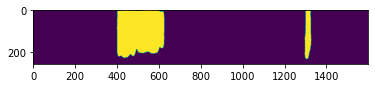

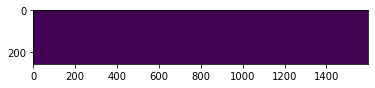

  6%|▌         | 317/5506 [02:55<49:16,  1.76it/s]

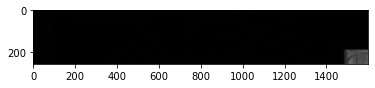

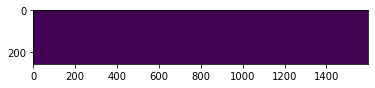

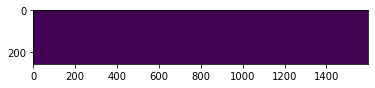

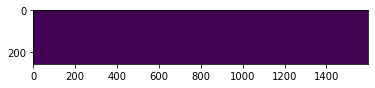

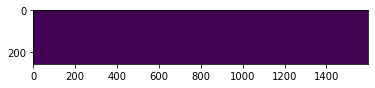

  6%|▌         | 318/5506 [02:55<48:14,  1.79it/s]

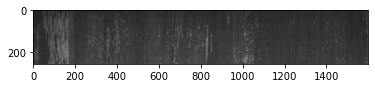

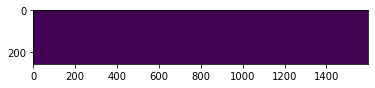

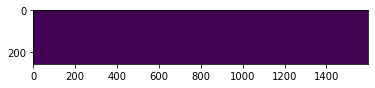

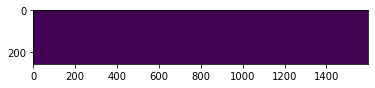

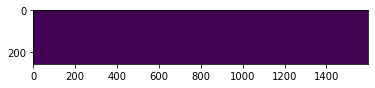

  6%|▌         | 319/5506 [02:56<47:12,  1.83it/s]

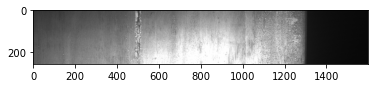

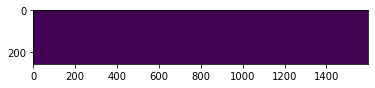

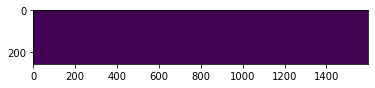

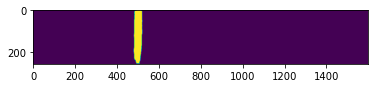

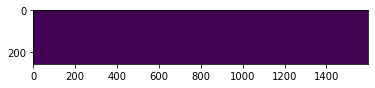

  6%|▌         | 320/5506 [02:56<46:28,  1.86it/s]

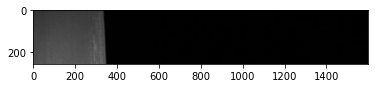

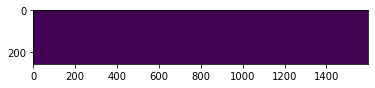

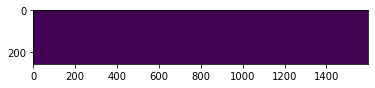

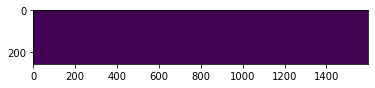

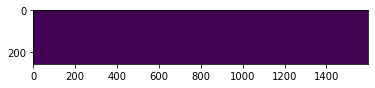

  6%|▌         | 321/5506 [02:57<48:09,  1.79it/s]

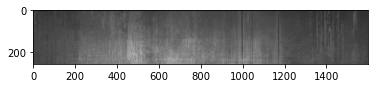

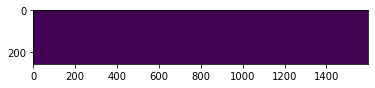

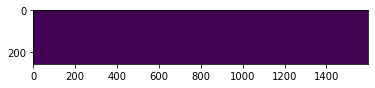

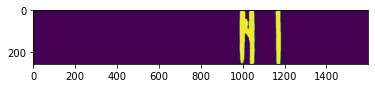

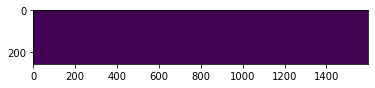

  6%|▌         | 322/5506 [02:57<48:01,  1.80it/s]

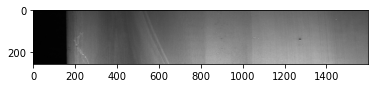

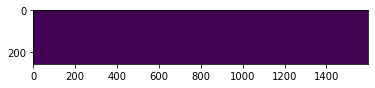

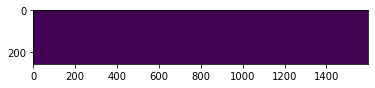

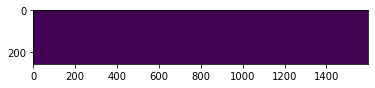

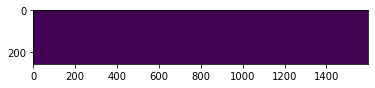

  6%|▌         | 323/5506 [02:58<47:34,  1.82it/s]

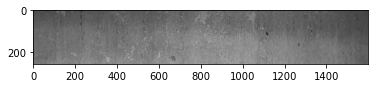

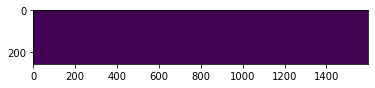

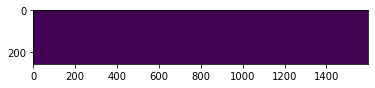

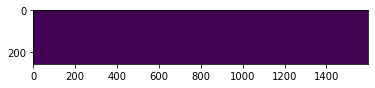

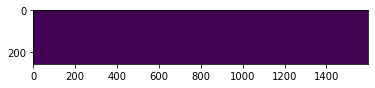

  6%|▌         | 324/5506 [02:59<49:08,  1.76it/s]

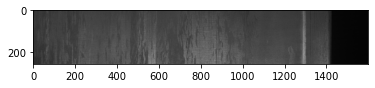

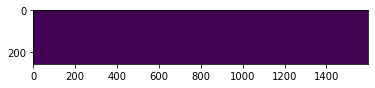

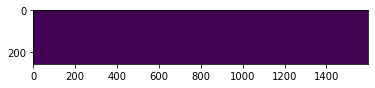

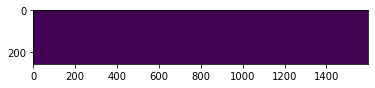

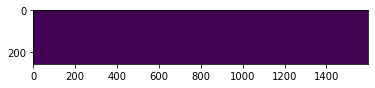

  6%|▌         | 325/5506 [02:59<47:54,  1.80it/s]

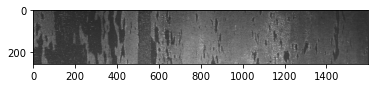

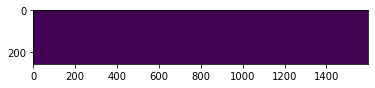

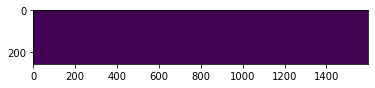

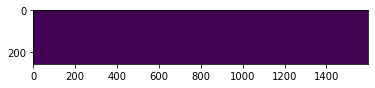

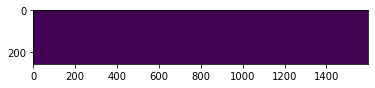

  6%|▌         | 326/5506 [03:00<47:18,  1.83it/s]

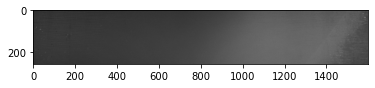

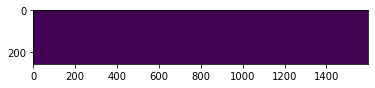

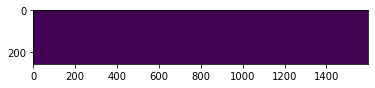

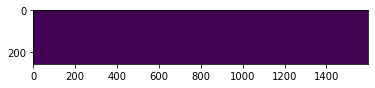

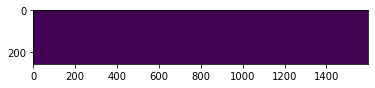

  6%|▌         | 327/5506 [03:00<47:00,  1.84it/s]

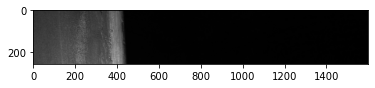

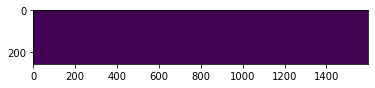

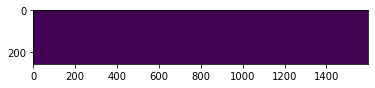

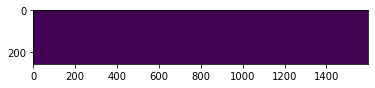

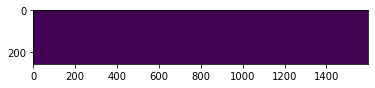

  6%|▌         | 328/5506 [03:01<48:26,  1.78it/s]

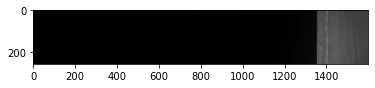

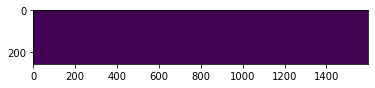

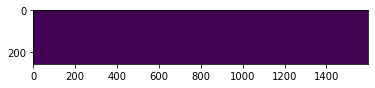

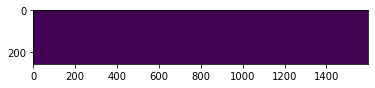

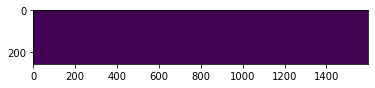

  6%|▌         | 329/5506 [03:01<47:17,  1.82it/s]

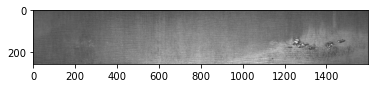

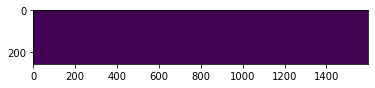

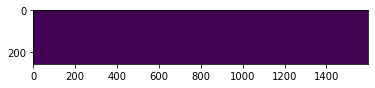

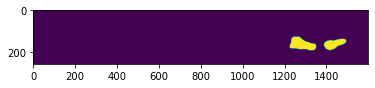

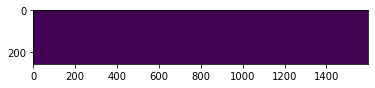

  6%|▌         | 330/5506 [03:02<46:46,  1.84it/s]

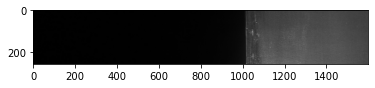

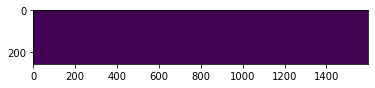

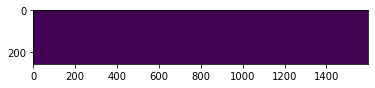

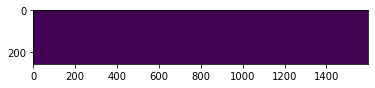

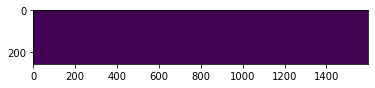

  6%|▌         | 331/5506 [03:02<46:02,  1.87it/s]

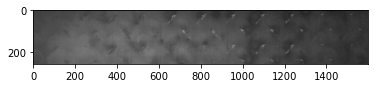

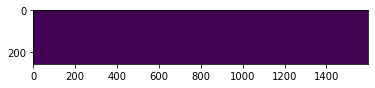

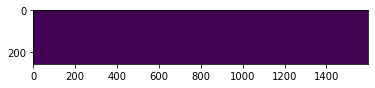

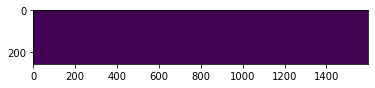

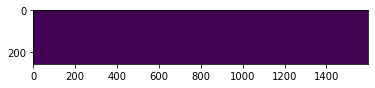

  6%|▌         | 332/5506 [03:03<48:07,  1.79it/s]

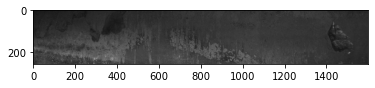

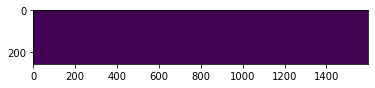

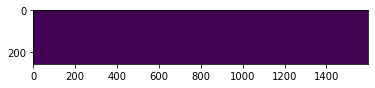

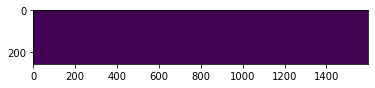

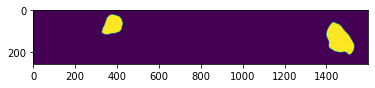

  6%|▌         | 333/5506 [03:03<47:20,  1.82it/s]

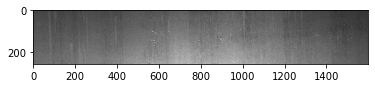

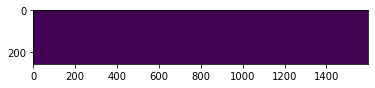

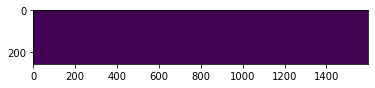

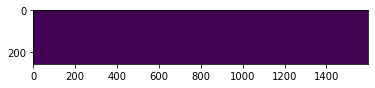

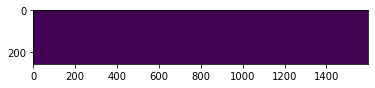

  6%|▌         | 334/5506 [03:04<46:46,  1.84it/s]

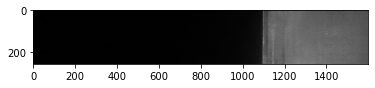

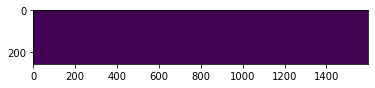

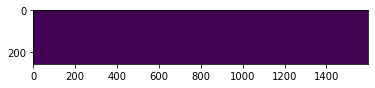

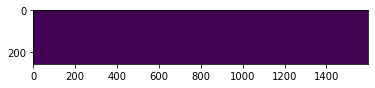

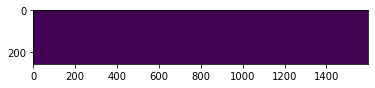

  6%|▌         | 335/5506 [03:05<48:45,  1.77it/s]

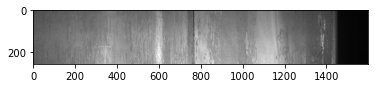

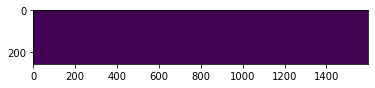

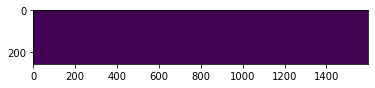

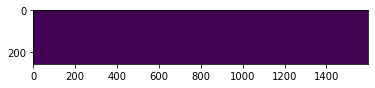

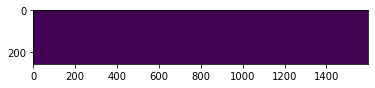

  6%|▌         | 336/5506 [03:05<47:59,  1.80it/s]

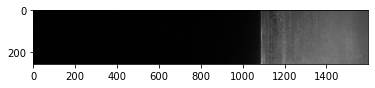

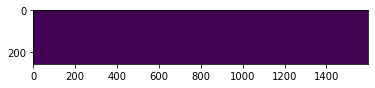

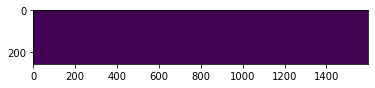

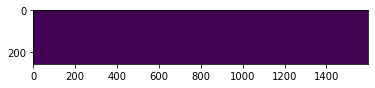

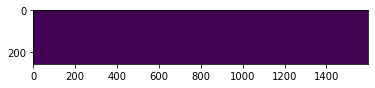

  6%|▌         | 337/5506 [03:06<47:26,  1.82it/s]

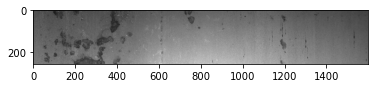

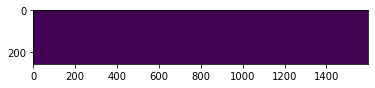

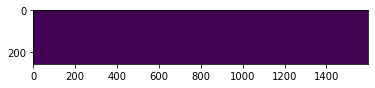

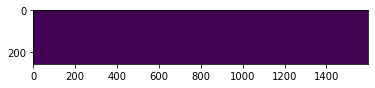

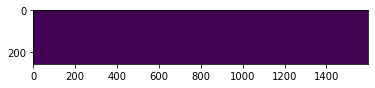

  6%|▌         | 338/5506 [03:06<47:16,  1.82it/s]

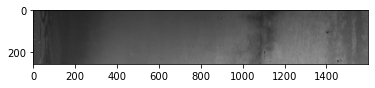

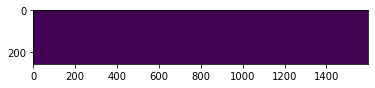

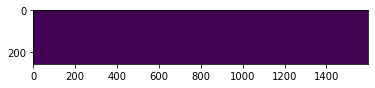

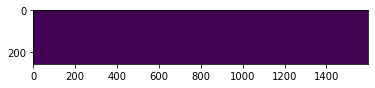

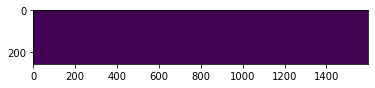

  6%|▌         | 339/5506 [03:07<49:28,  1.74it/s]

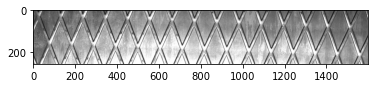

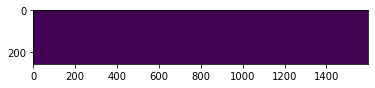

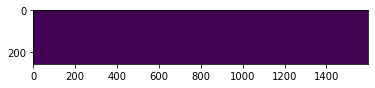

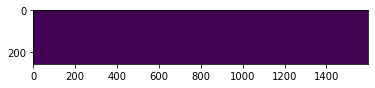

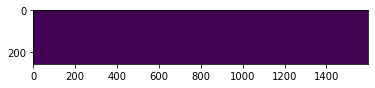

  6%|▌         | 340/5506 [03:07<48:35,  1.77it/s]

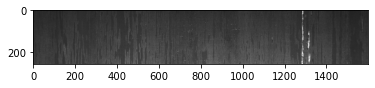

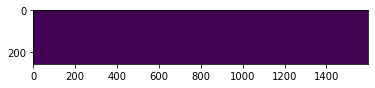

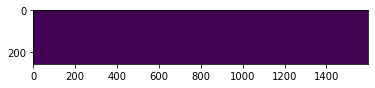

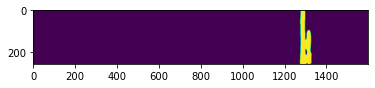

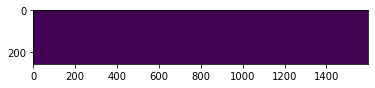

  6%|▌         | 341/5506 [03:08<47:49,  1.80it/s]

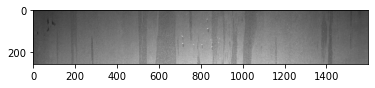

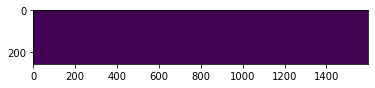

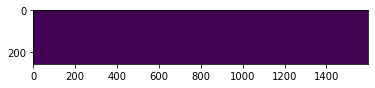

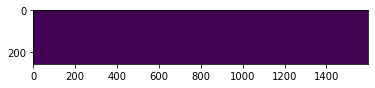

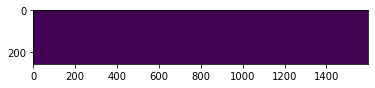

  6%|▌         | 342/5506 [03:09<49:25,  1.74it/s]

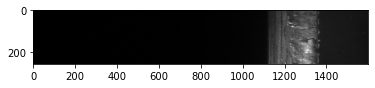

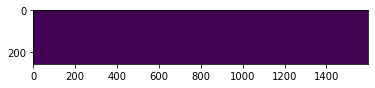

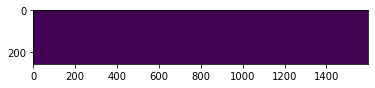

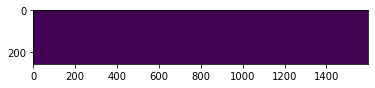

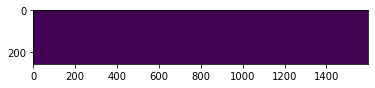

  6%|▌         | 343/5506 [03:09<47:59,  1.79it/s]

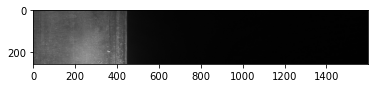

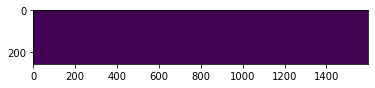

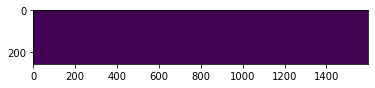

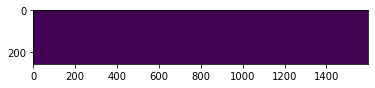

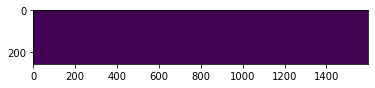

  6%|▌         | 344/5506 [03:10<46:43,  1.84it/s]

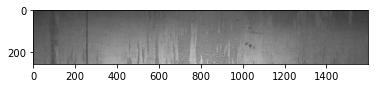

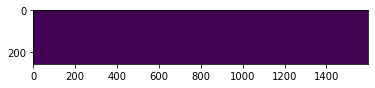

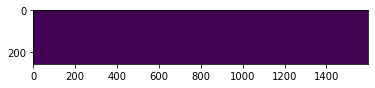

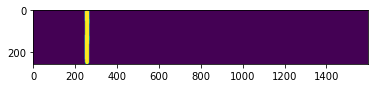

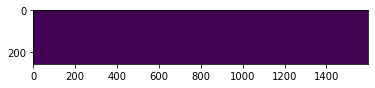

  6%|▋         | 345/5506 [03:10<45:55,  1.87it/s]

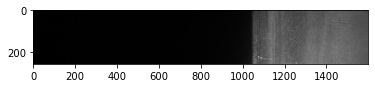

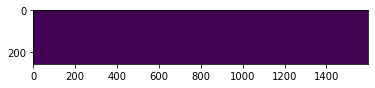

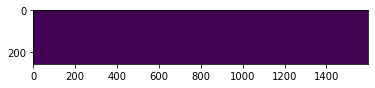

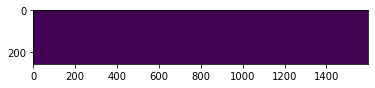

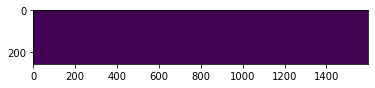

  6%|▋         | 346/5506 [03:11<48:18,  1.78it/s]

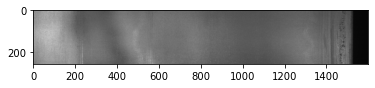

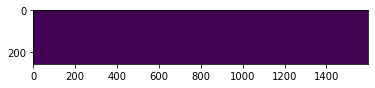

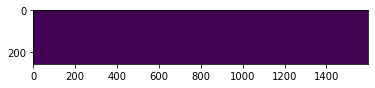

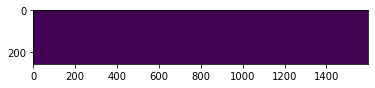

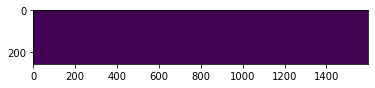

  6%|▋         | 347/5506 [03:11<47:34,  1.81it/s]

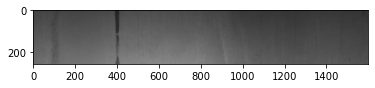

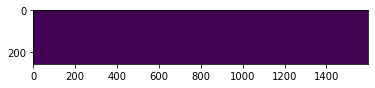

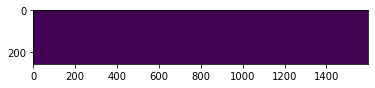

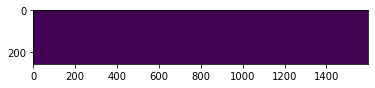

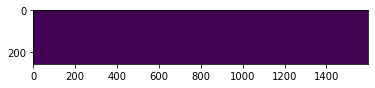

  6%|▋         | 348/5506 [03:12<47:12,  1.82it/s]

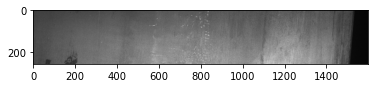

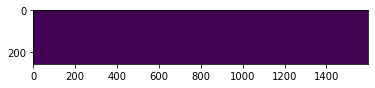

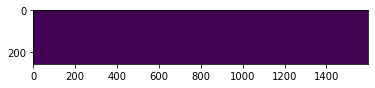

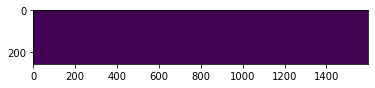

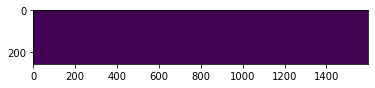

  6%|▋         | 349/5506 [03:12<47:08,  1.82it/s]

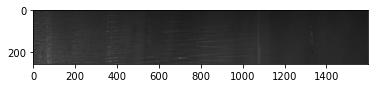

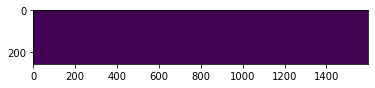

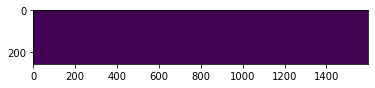

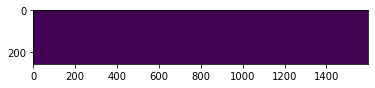

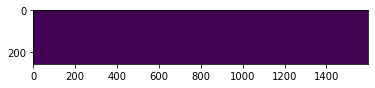

  6%|▋         | 350/5506 [03:13<48:52,  1.76it/s]

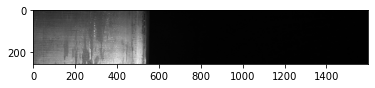

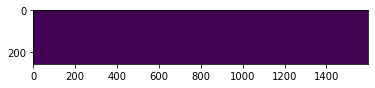

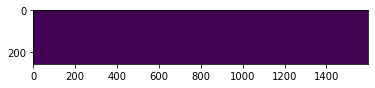

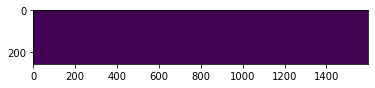

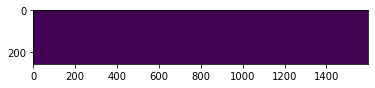

  6%|▋         | 351/5506 [03:14<48:22,  1.78it/s]

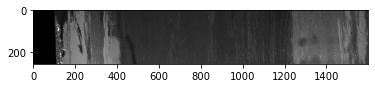

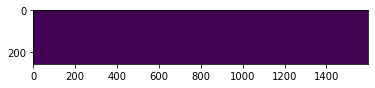

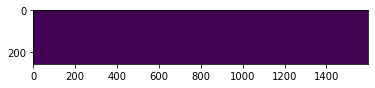

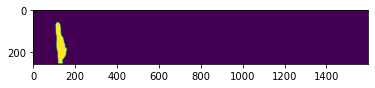

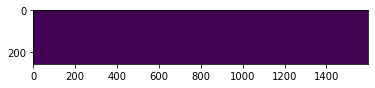

  6%|▋         | 352/5506 [03:14<47:47,  1.80it/s]

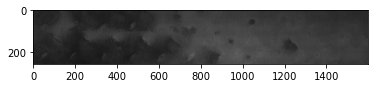

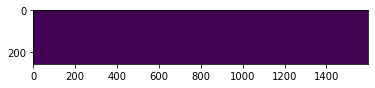

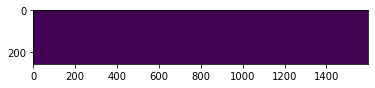

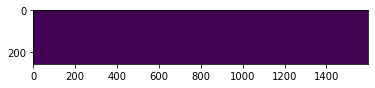

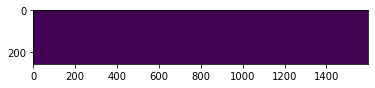

  6%|▋         | 353/5506 [03:15<49:02,  1.75it/s]

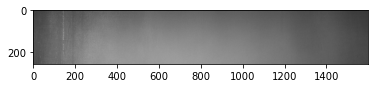

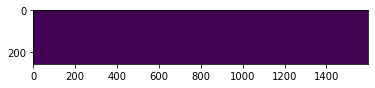

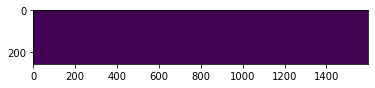

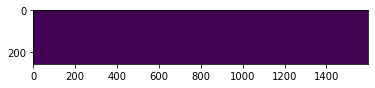

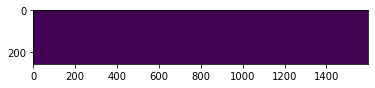

  6%|▋         | 354/5506 [03:15<48:42,  1.76it/s]

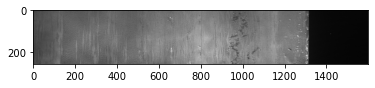

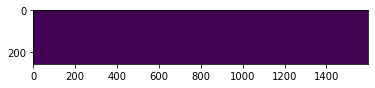

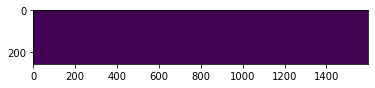

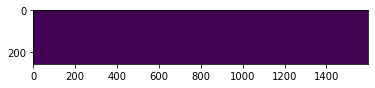

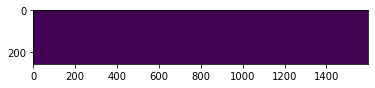

  6%|▋         | 355/5506 [03:16<47:34,  1.80it/s]

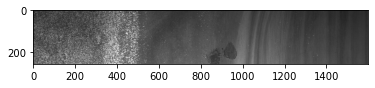

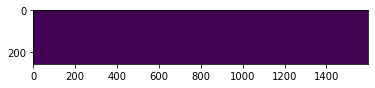

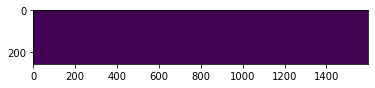

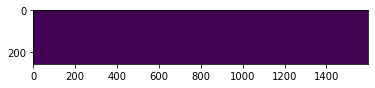

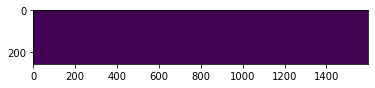

  6%|▋         | 356/5506 [03:16<46:52,  1.83it/s]

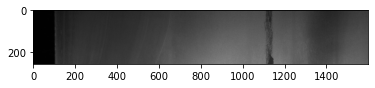

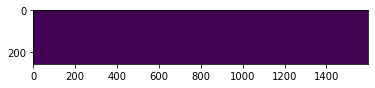

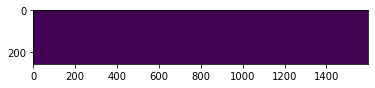

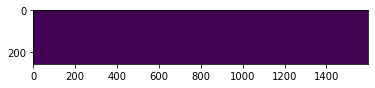

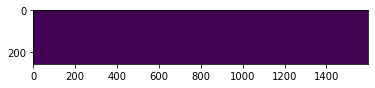

  6%|▋         | 357/5506 [03:17<48:32,  1.77it/s]

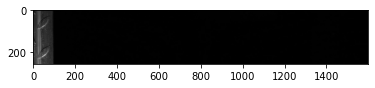

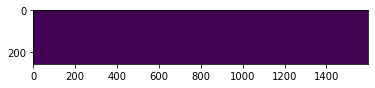

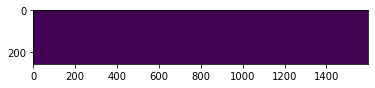

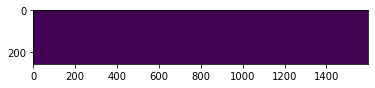

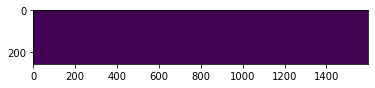

  7%|▋         | 358/5506 [03:17<47:31,  1.81it/s]

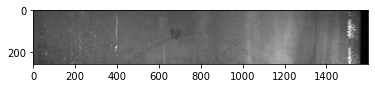

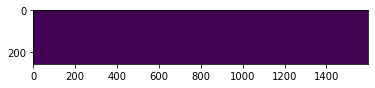

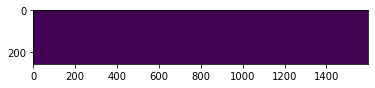

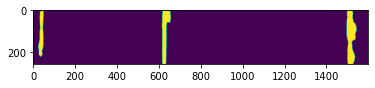

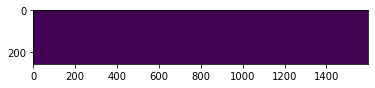

  7%|▋         | 359/5506 [03:18<47:10,  1.82it/s]

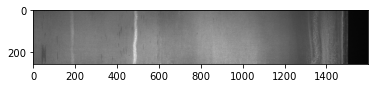

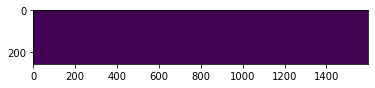

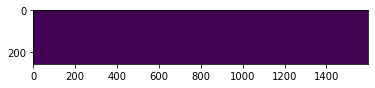

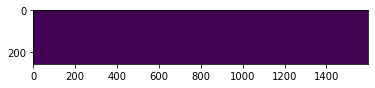

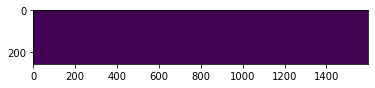

  7%|▋         | 360/5506 [03:19<48:35,  1.76it/s]

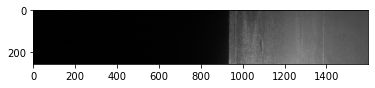

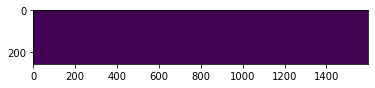

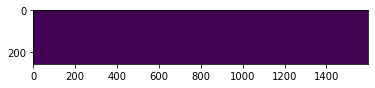

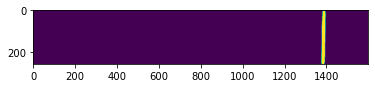

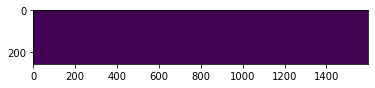

  7%|▋         | 361/5506 [03:19<47:25,  1.81it/s]

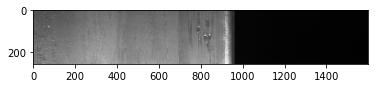

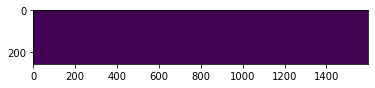

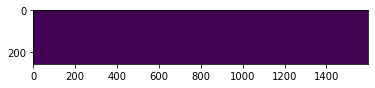

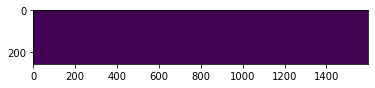

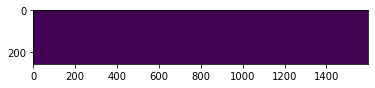

  7%|▋         | 362/5506 [03:20<46:23,  1.85it/s]

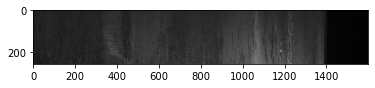

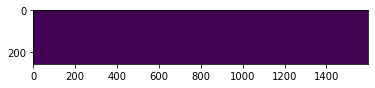

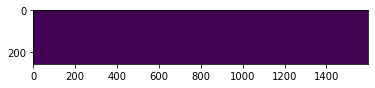

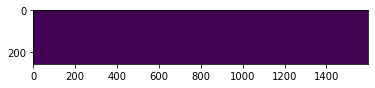

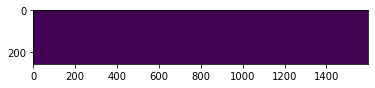

  7%|▋         | 363/5506 [03:20<45:43,  1.87it/s]

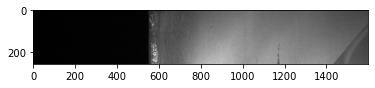

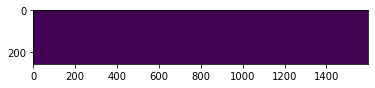

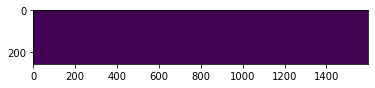

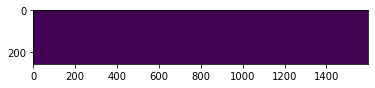

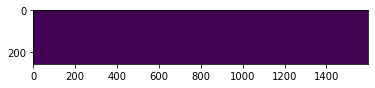

  7%|▋         | 364/5506 [03:21<47:23,  1.81it/s]

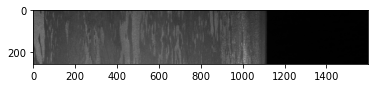

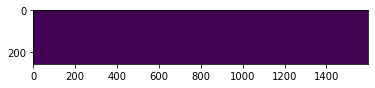

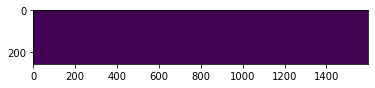

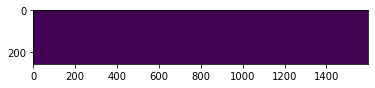

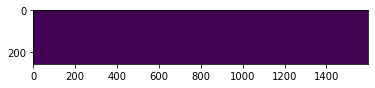

  7%|▋         | 365/5506 [03:21<47:00,  1.82it/s]

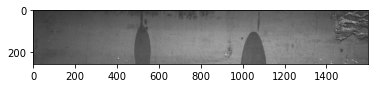

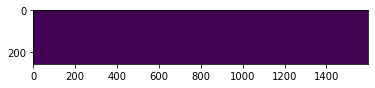

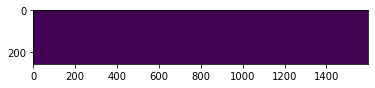

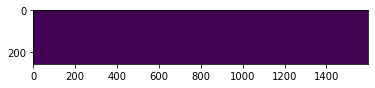

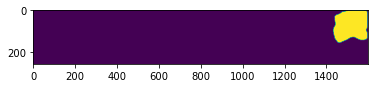

  7%|▋         | 366/5506 [03:22<46:14,  1.85it/s]

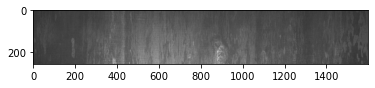

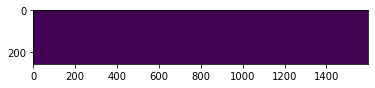

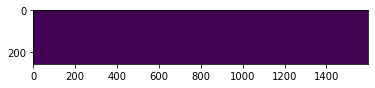

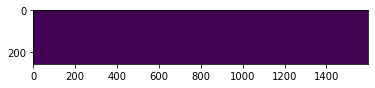

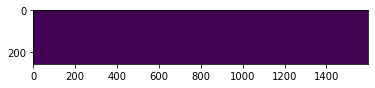

  7%|▋         | 367/5506 [03:22<45:47,  1.87it/s]

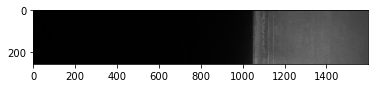

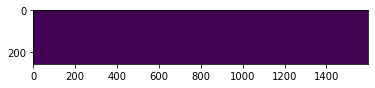

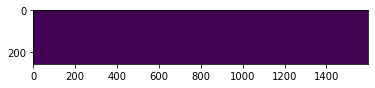

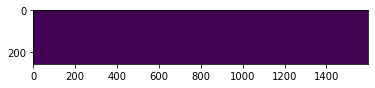

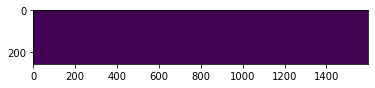

  7%|▋         | 368/5506 [03:23<47:19,  1.81it/s]

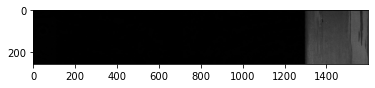

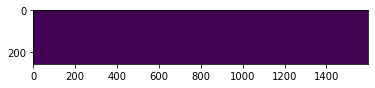

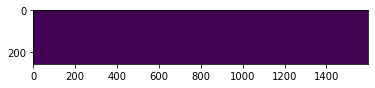

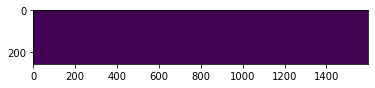

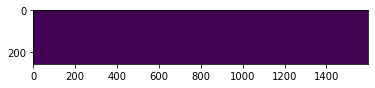

  7%|▋         | 369/5506 [03:23<46:14,  1.85it/s]

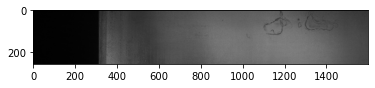

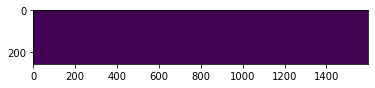

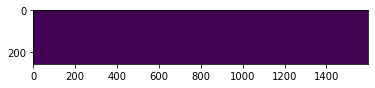

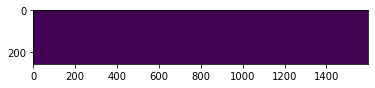

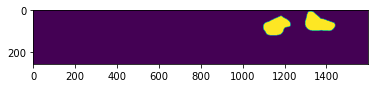

  7%|▋         | 370/5506 [03:24<45:22,  1.89it/s]

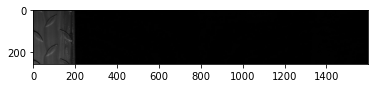

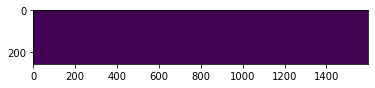

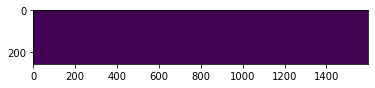

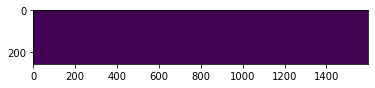

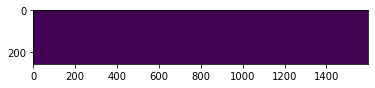

  7%|▋         | 371/5506 [03:25<47:45,  1.79it/s]

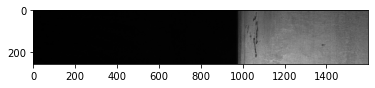

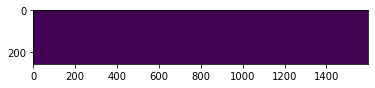

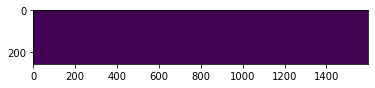

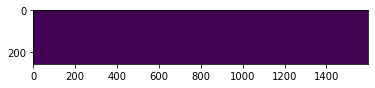

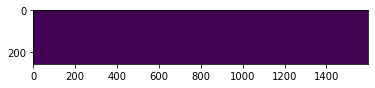

  7%|▋         | 372/5506 [03:25<46:32,  1.84it/s]

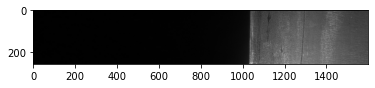

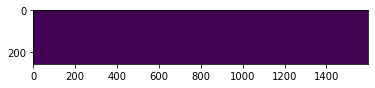

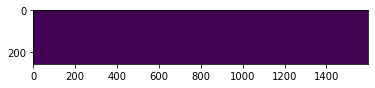

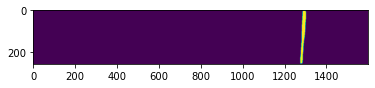

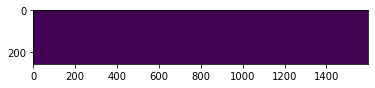

  7%|▋         | 373/5506 [03:26<46:41,  1.83it/s]

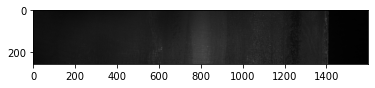

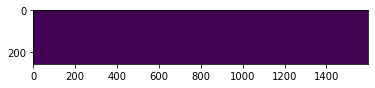

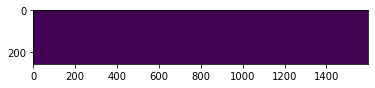

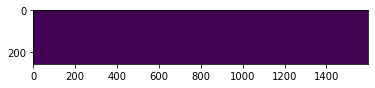

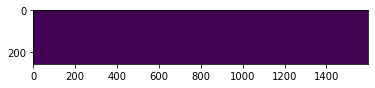

  7%|▋         | 374/5506 [03:26<46:23,  1.84it/s]

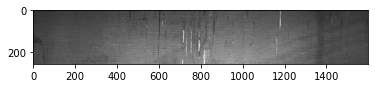

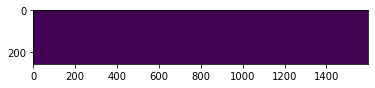

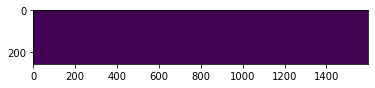

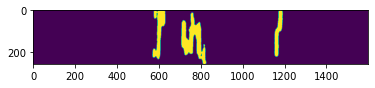

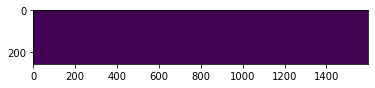

  7%|▋         | 375/5506 [03:27<48:16,  1.77it/s]

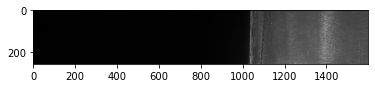

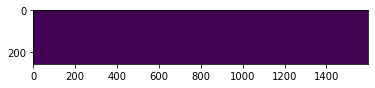

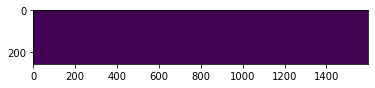

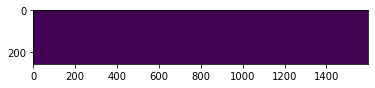

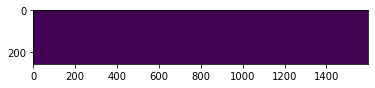

  7%|▋         | 376/5506 [03:27<47:27,  1.80it/s]

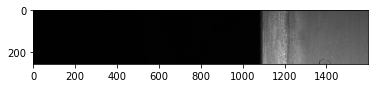

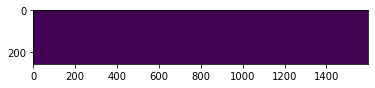

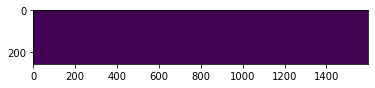

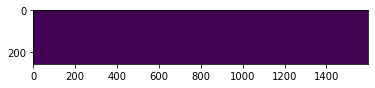

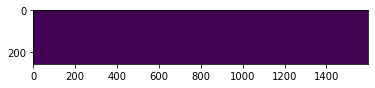

  7%|▋         | 377/5506 [03:28<47:00,  1.82it/s]

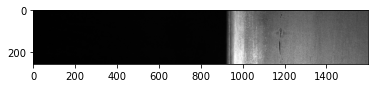

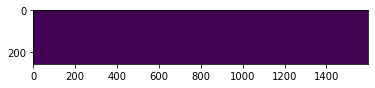

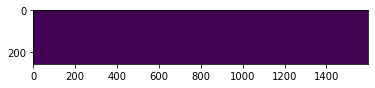

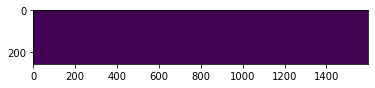

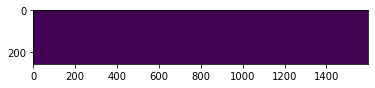

  7%|▋         | 378/5506 [03:28<48:12,  1.77it/s]

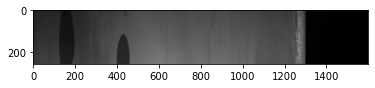

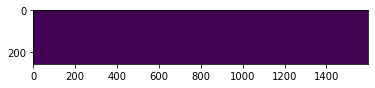

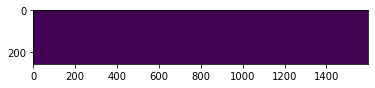

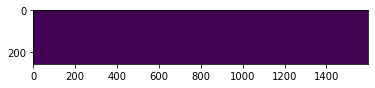

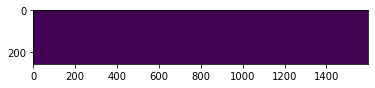

  7%|▋         | 379/5506 [03:29<46:51,  1.82it/s]

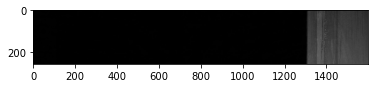

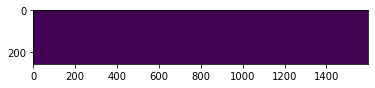

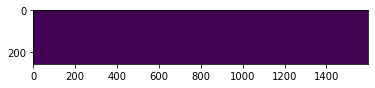

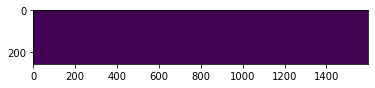

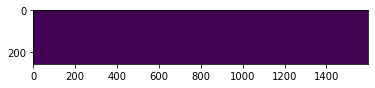

  7%|▋         | 380/5506 [03:29<46:11,  1.85it/s]

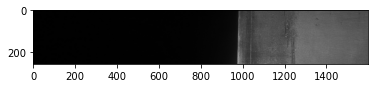

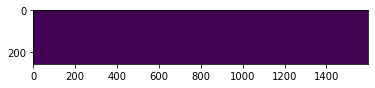

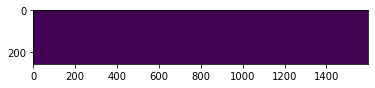

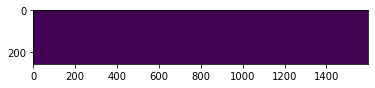

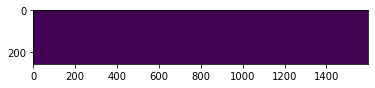

  7%|▋         | 381/5506 [03:30<45:51,  1.86it/s]

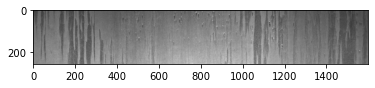

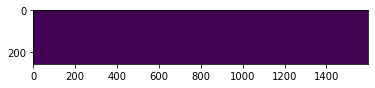

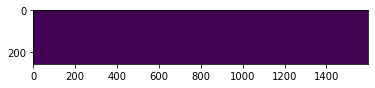

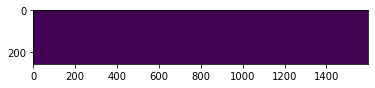

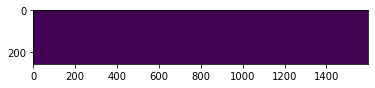

  7%|▋         | 382/5506 [03:31<48:06,  1.77it/s]

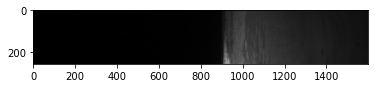

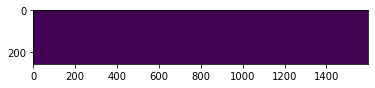

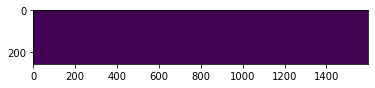

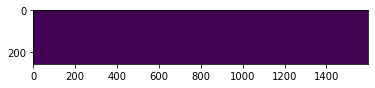

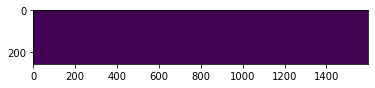

  7%|▋         | 383/5506 [03:31<47:12,  1.81it/s]

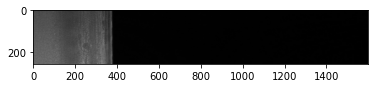

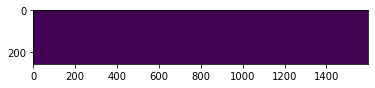

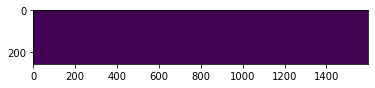

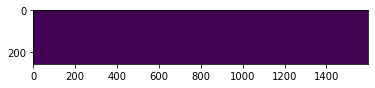

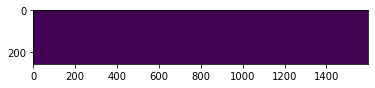

  7%|▋         | 384/5506 [03:32<46:39,  1.83it/s]

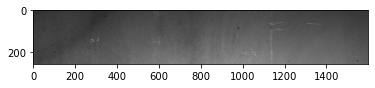

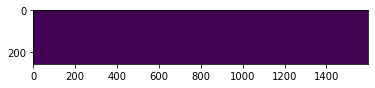

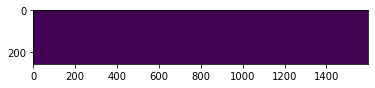

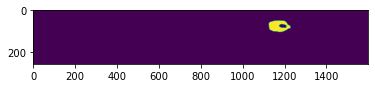

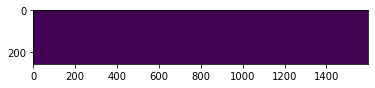

  7%|▋         | 385/5506 [03:32<46:10,  1.85it/s]

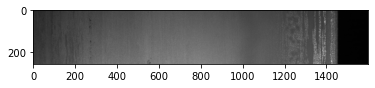

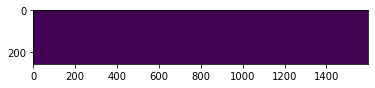

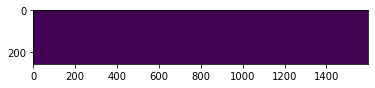

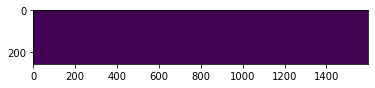

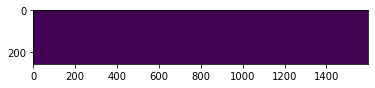

  7%|▋         | 386/5506 [03:33<47:52,  1.78it/s]

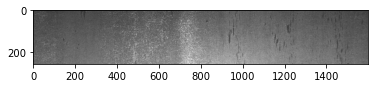

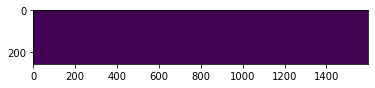

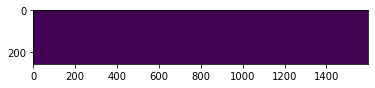

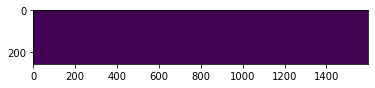

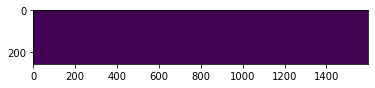

  7%|▋         | 387/5506 [03:33<47:07,  1.81it/s]

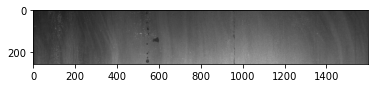

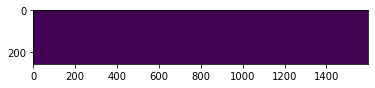

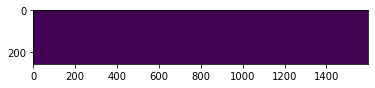

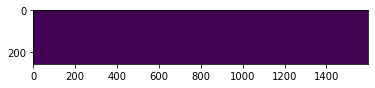

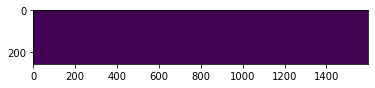

  7%|▋         | 388/5506 [03:34<46:45,  1.82it/s]

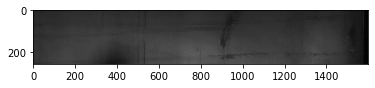

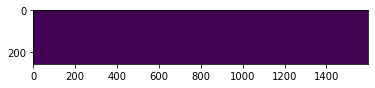

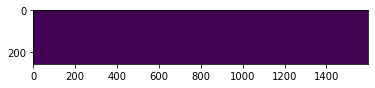

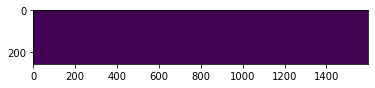

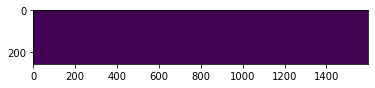

  7%|▋         | 389/5506 [03:34<48:31,  1.76it/s]

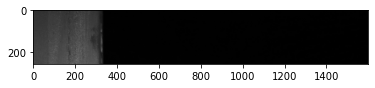

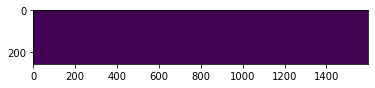

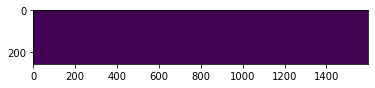

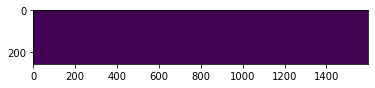

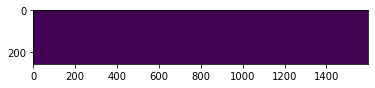

  7%|▋         | 390/5506 [03:35<47:50,  1.78it/s]

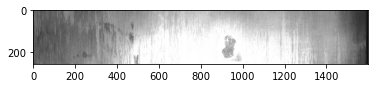

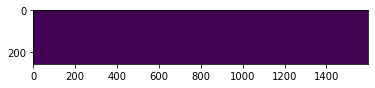

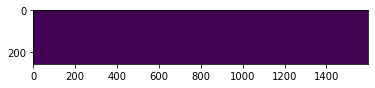

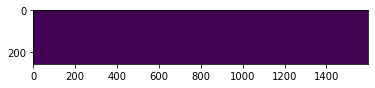

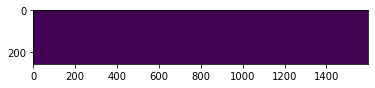

  7%|▋         | 391/5506 [03:36<46:47,  1.82it/s]

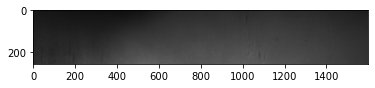

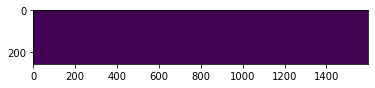

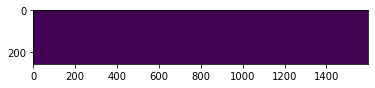

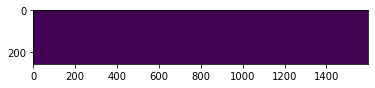

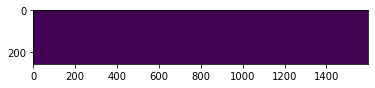

  7%|▋         | 392/5506 [03:36<46:08,  1.85it/s]

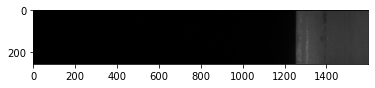

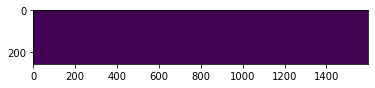

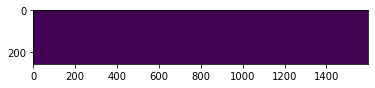

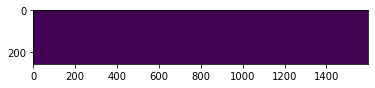

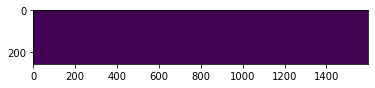

  7%|▋         | 393/5506 [03:37<47:41,  1.79it/s]

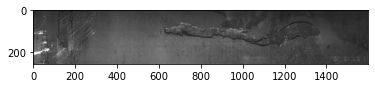

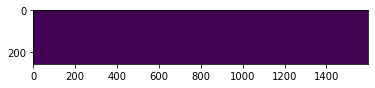

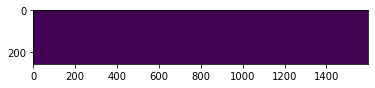

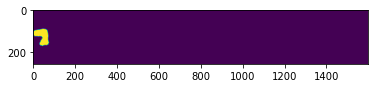

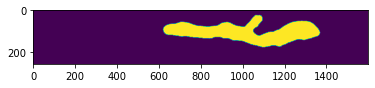

  7%|▋         | 394/5506 [03:37<46:37,  1.83it/s]

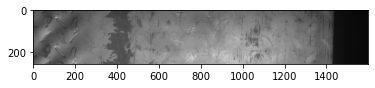

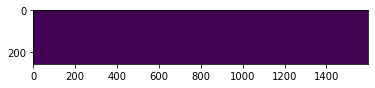

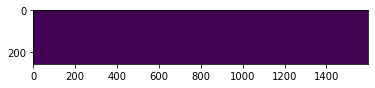

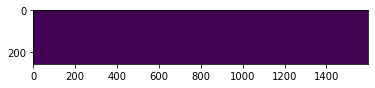

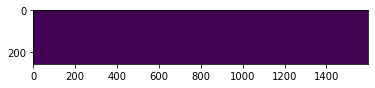

  7%|▋         | 395/5506 [03:38<45:49,  1.86it/s]

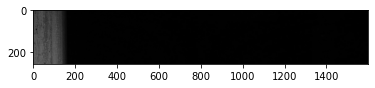

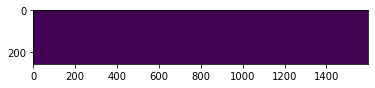

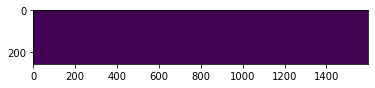

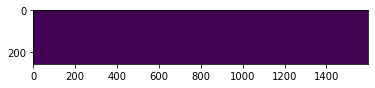

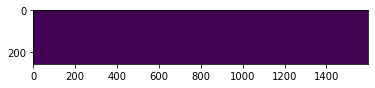

  7%|▋         | 396/5506 [03:38<47:40,  1.79it/s]

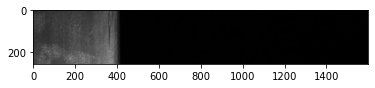

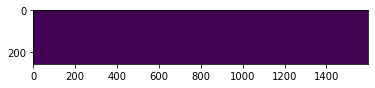

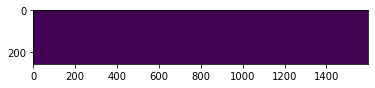

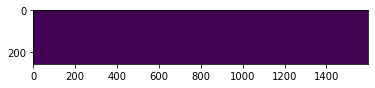

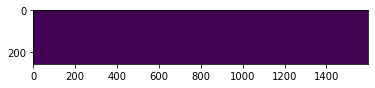

  7%|▋         | 397/5506 [03:39<46:45,  1.82it/s]

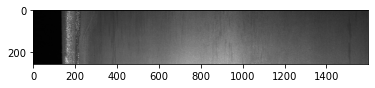

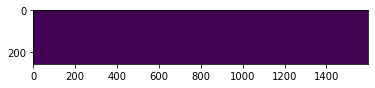

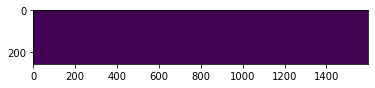

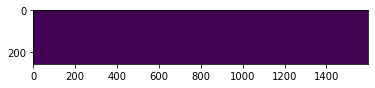

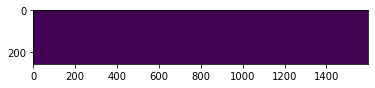

  7%|▋         | 398/5506 [03:39<46:32,  1.83it/s]

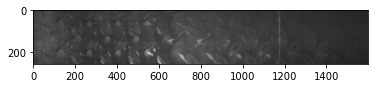

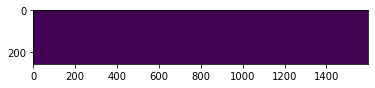

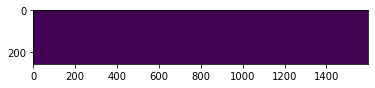

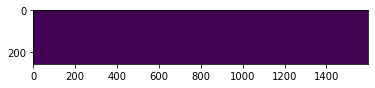

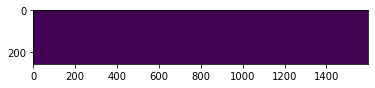

  7%|▋         | 399/5506 [03:40<46:33,  1.83it/s]

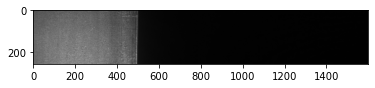

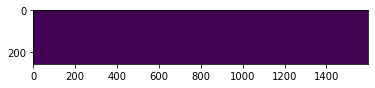

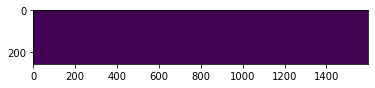

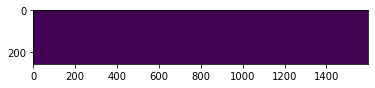

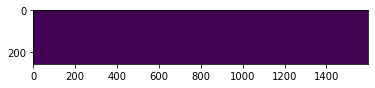

  7%|▋         | 400/5506 [03:41<48:18,  1.76it/s]

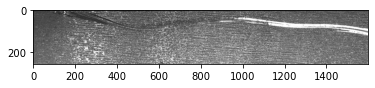

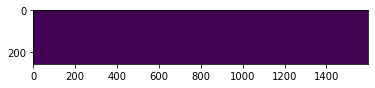

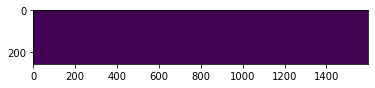

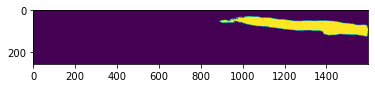

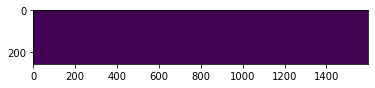

  7%|▋         | 401/5506 [03:41<47:13,  1.80it/s]

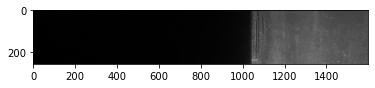

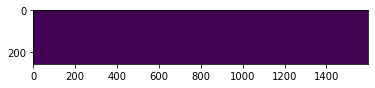

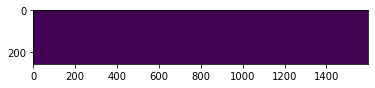

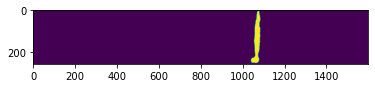

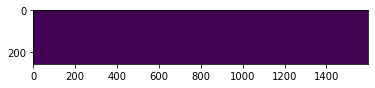

  7%|▋         | 402/5506 [03:42<46:30,  1.83it/s]

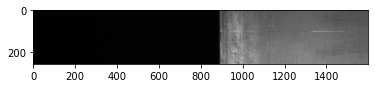

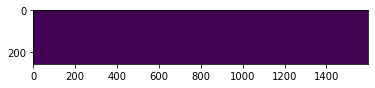

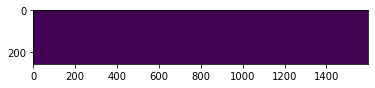

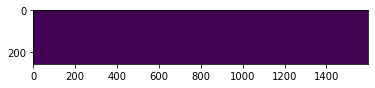

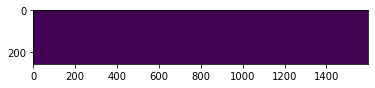

  7%|▋         | 403/5506 [03:42<46:05,  1.85it/s]

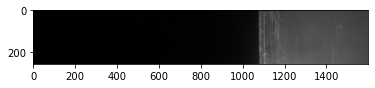

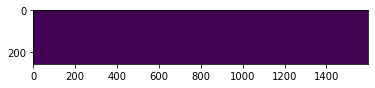

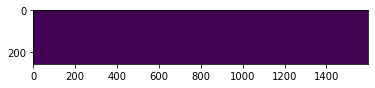

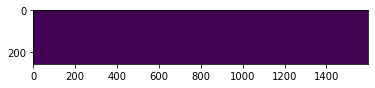

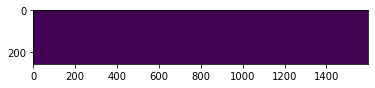

  7%|▋         | 404/5506 [03:43<47:51,  1.78it/s]

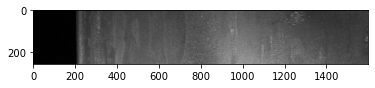

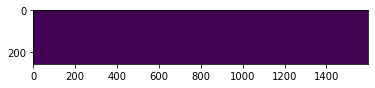

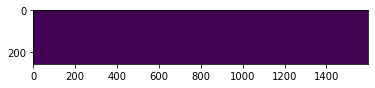

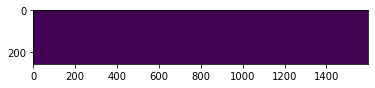

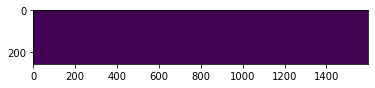

  7%|▋         | 405/5506 [03:43<46:39,  1.82it/s]

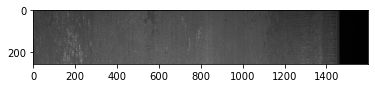

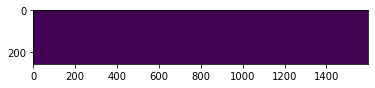

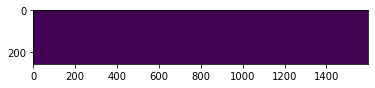

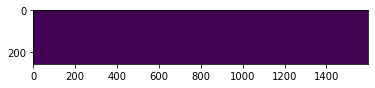

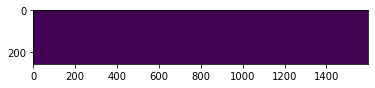

  7%|▋         | 406/5506 [03:44<45:52,  1.85it/s]

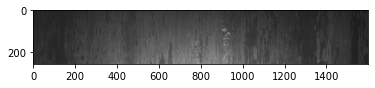

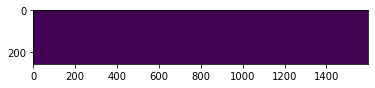

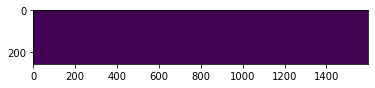

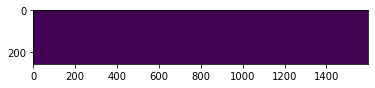

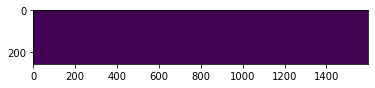

  7%|▋         | 407/5506 [03:44<47:52,  1.77it/s]

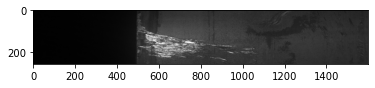

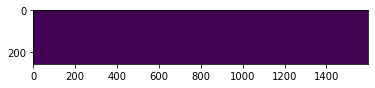

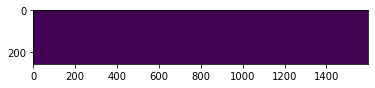

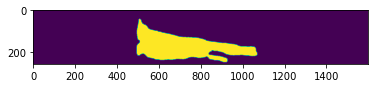

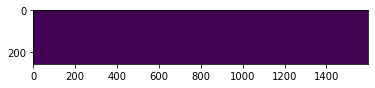

  7%|▋         | 408/5506 [03:45<46:43,  1.82it/s]

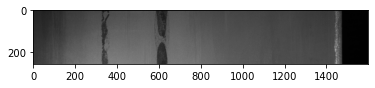

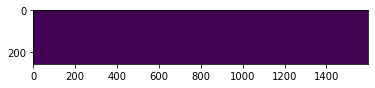

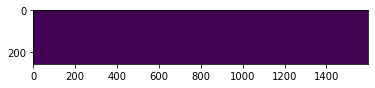

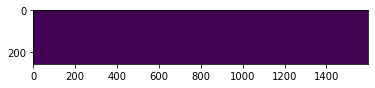

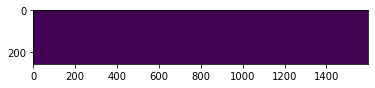

  7%|▋         | 409/5506 [03:45<46:20,  1.83it/s]

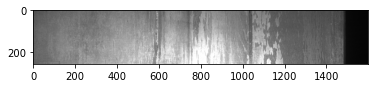

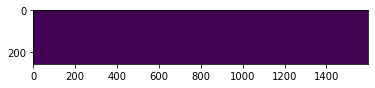

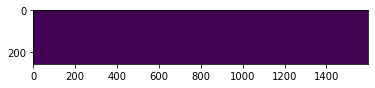

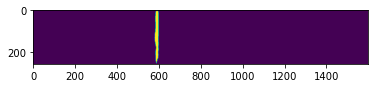

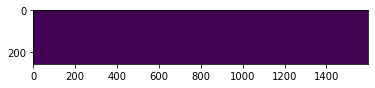

  7%|▋         | 410/5506 [03:46<46:01,  1.85it/s]

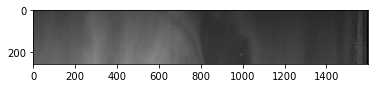

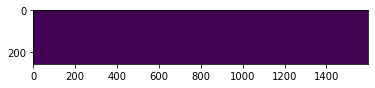

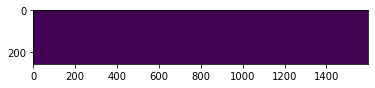

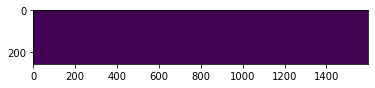

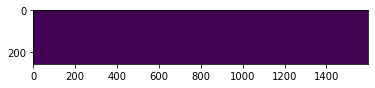

  7%|▋         | 411/5506 [03:47<48:31,  1.75it/s]

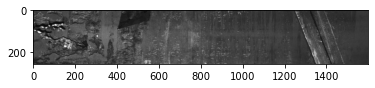

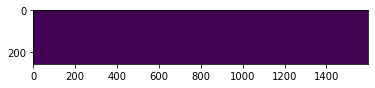

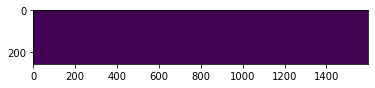

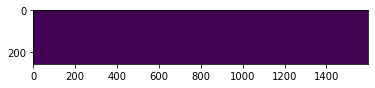

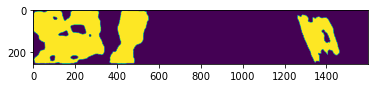

  7%|▋         | 412/5506 [03:47<47:49,  1.78it/s]

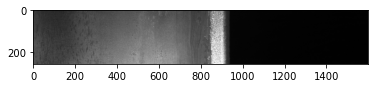

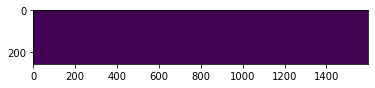

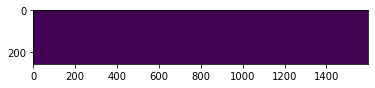

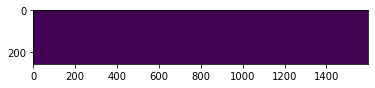

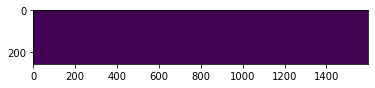

  8%|▊         | 413/5506 [03:48<46:40,  1.82it/s]

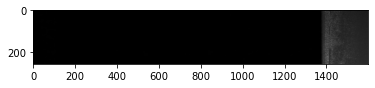

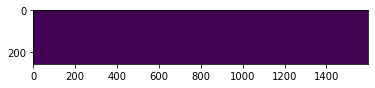

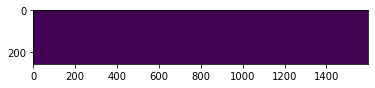

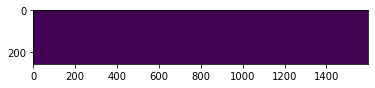

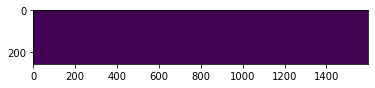

  8%|▊         | 414/5506 [03:48<48:11,  1.76it/s]

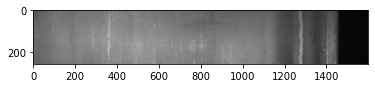

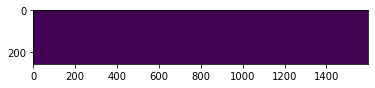

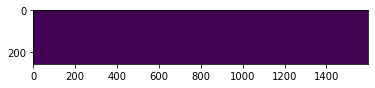

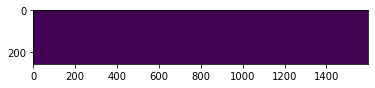

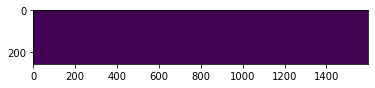

  8%|▊         | 415/5506 [03:49<46:58,  1.81it/s]

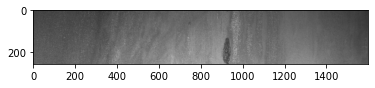

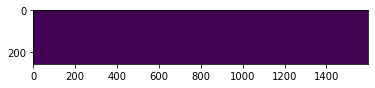

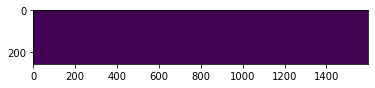

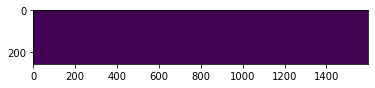

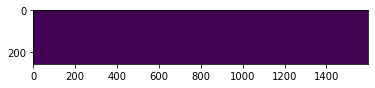

  8%|▊         | 416/5506 [03:49<46:11,  1.84it/s]

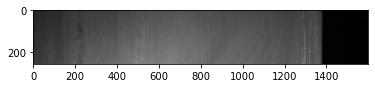

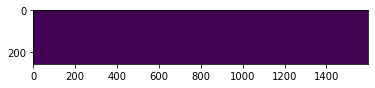

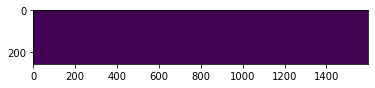

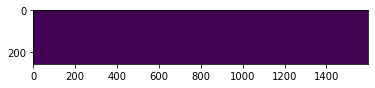

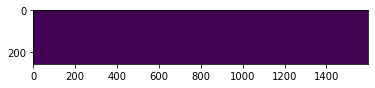

  8%|▊         | 417/5506 [03:50<45:32,  1.86it/s]

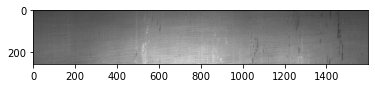

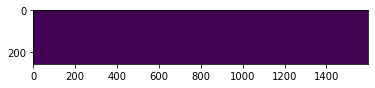

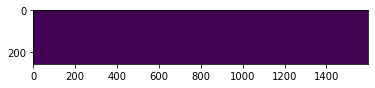

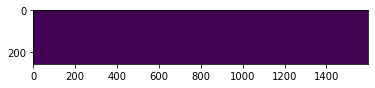

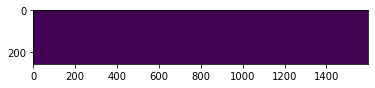

  8%|▊         | 418/5506 [03:50<47:18,  1.79it/s]

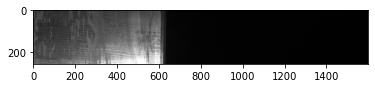

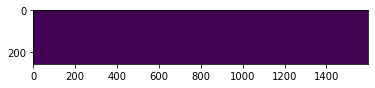

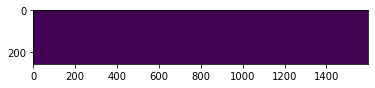

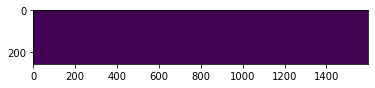

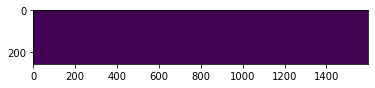

  8%|▊         | 419/5506 [03:51<46:35,  1.82it/s]

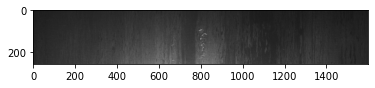

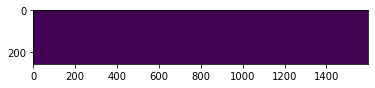

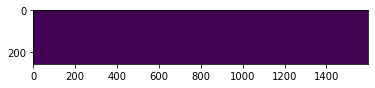

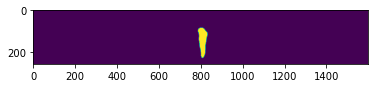

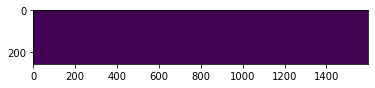

  8%|▊         | 420/5506 [03:51<46:02,  1.84it/s]

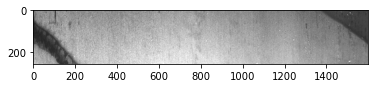

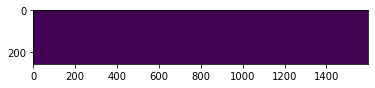

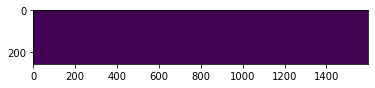

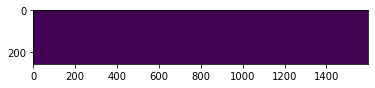

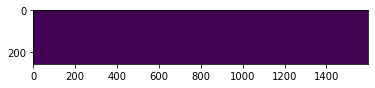

  8%|▊         | 421/5506 [03:52<45:34,  1.86it/s]

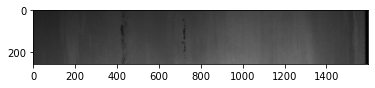

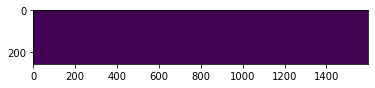

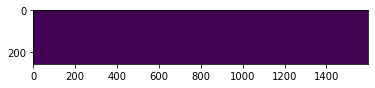

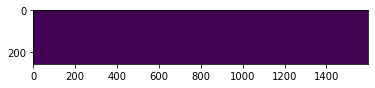

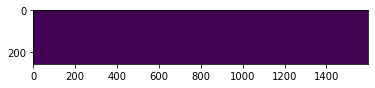

  8%|▊         | 422/5506 [03:53<47:22,  1.79it/s]

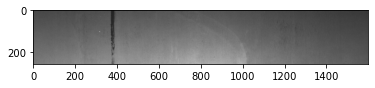

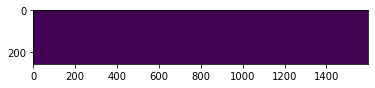

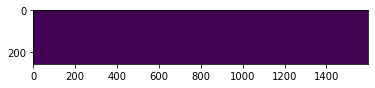

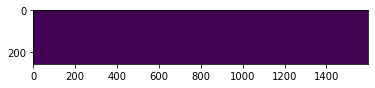

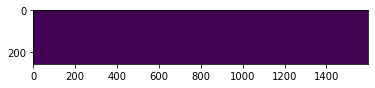

  8%|▊         | 423/5506 [03:53<46:16,  1.83it/s]

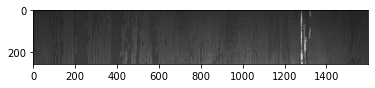

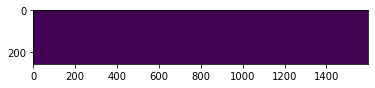

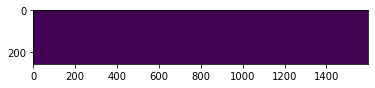

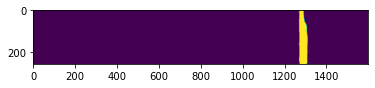

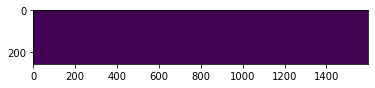

  8%|▊         | 424/5506 [03:54<45:30,  1.86it/s]

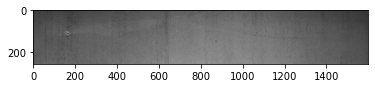

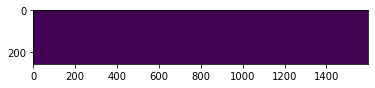

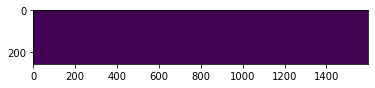

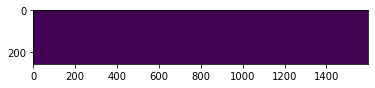

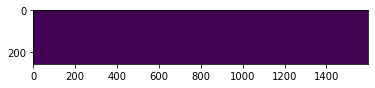

  8%|▊         | 425/5506 [03:54<47:24,  1.79it/s]

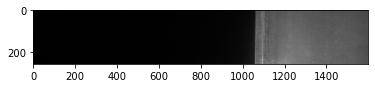

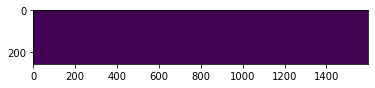

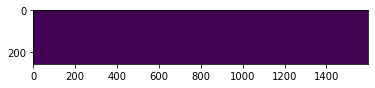

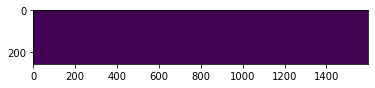

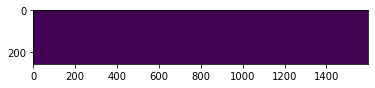

  8%|▊         | 426/5506 [03:55<46:21,  1.83it/s]

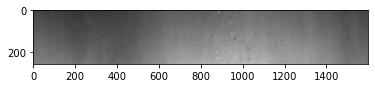

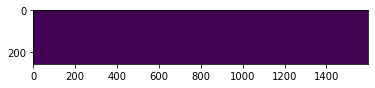

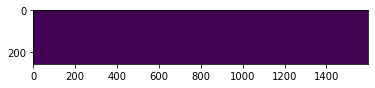

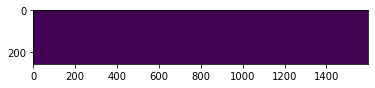

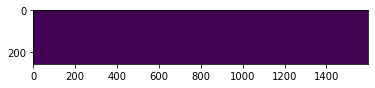

  8%|▊         | 427/5506 [03:55<45:50,  1.85it/s]

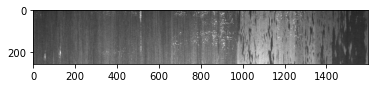

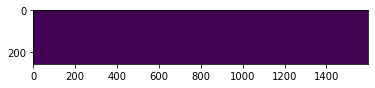

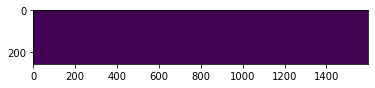

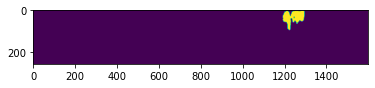

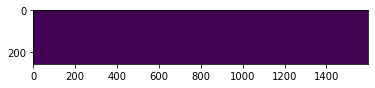

  8%|▊         | 428/5506 [03:56<45:54,  1.84it/s]

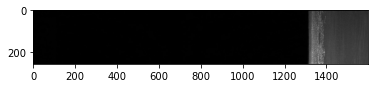

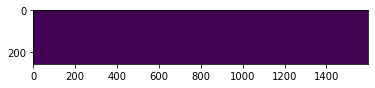

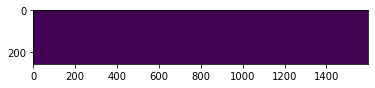

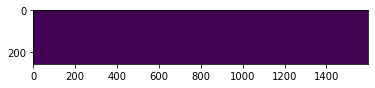

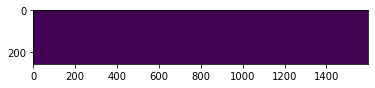

  8%|▊         | 429/5506 [03:56<47:46,  1.77it/s]

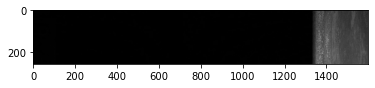

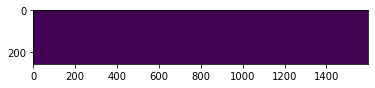

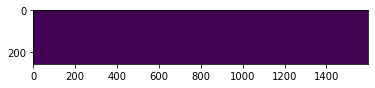

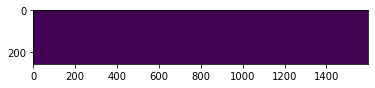

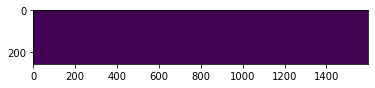

  8%|▊         | 430/5506 [03:57<46:33,  1.82it/s]

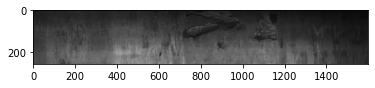

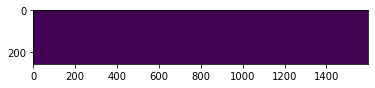

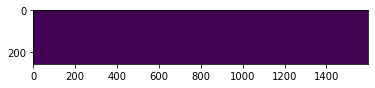

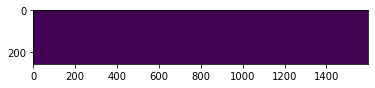

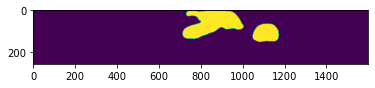

  8%|▊         | 431/5506 [03:58<45:55,  1.84it/s]

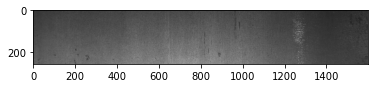

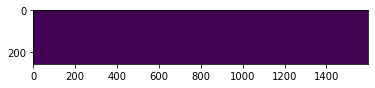

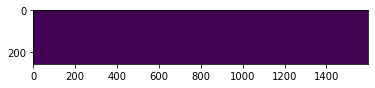

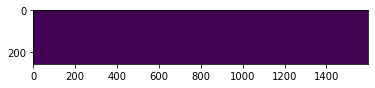

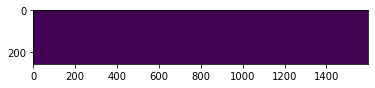

  8%|▊         | 432/5506 [03:58<47:37,  1.78it/s]

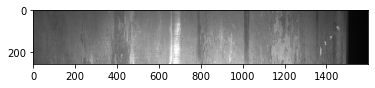

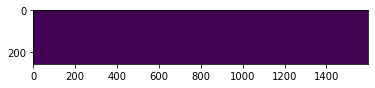

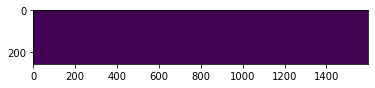

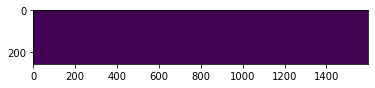

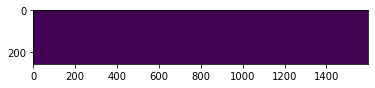

  8%|▊         | 433/5506 [03:59<47:02,  1.80it/s]

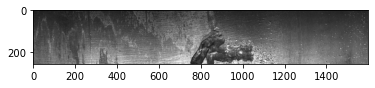

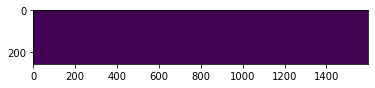

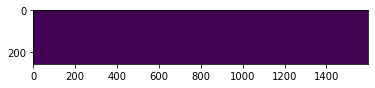

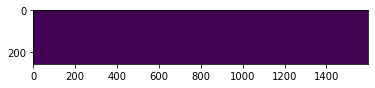

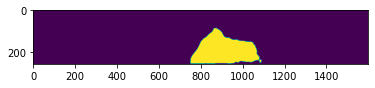

  8%|▊         | 434/5506 [03:59<46:16,  1.83it/s]

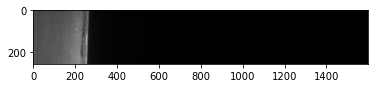

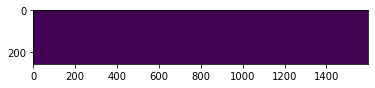

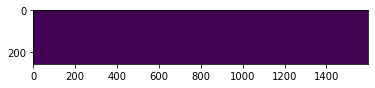

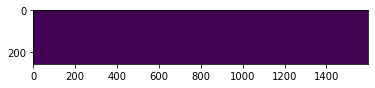

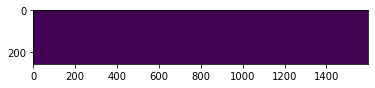

  8%|▊         | 435/5506 [04:00<45:31,  1.86it/s]

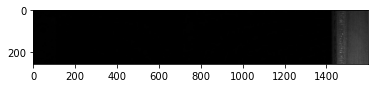

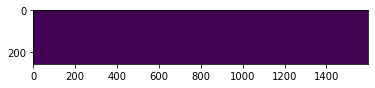

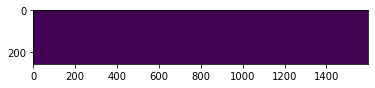

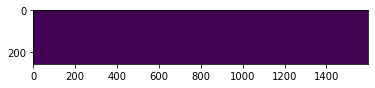

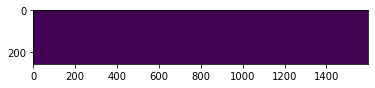

  8%|▊         | 436/5506 [04:00<47:02,  1.80it/s]

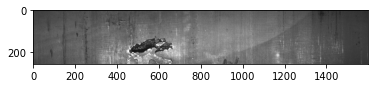

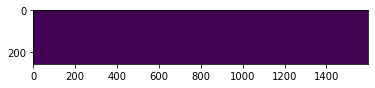

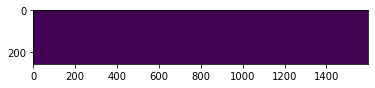

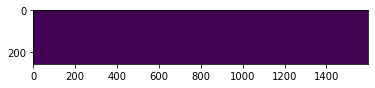

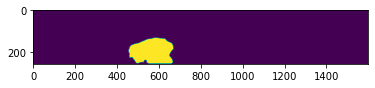

  8%|▊         | 437/5506 [04:01<46:21,  1.82it/s]

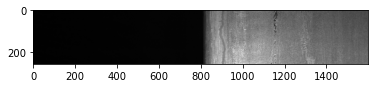

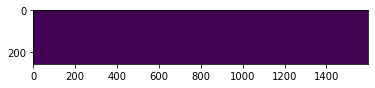

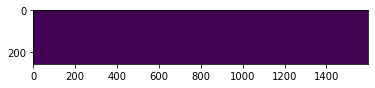

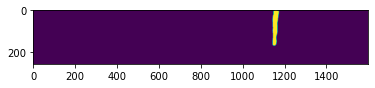

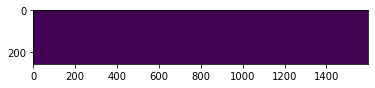

  8%|▊         | 438/5506 [04:01<45:47,  1.84it/s]

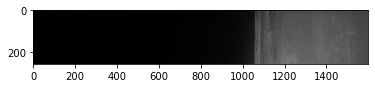

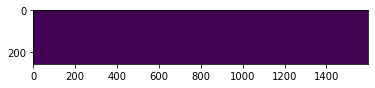

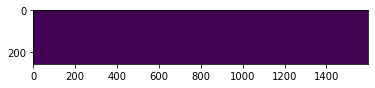

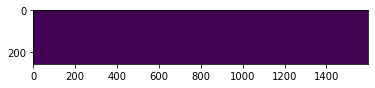

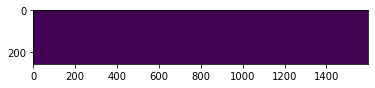

  8%|▊         | 439/5506 [04:02<45:21,  1.86it/s]

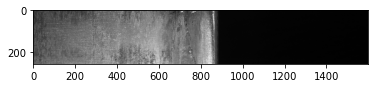

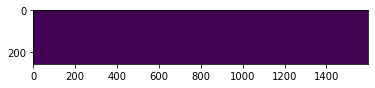

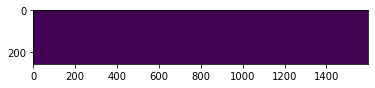

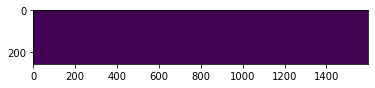

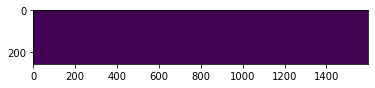

  8%|▊         | 440/5506 [04:03<48:00,  1.76it/s]

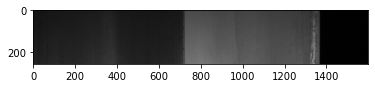

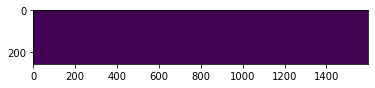

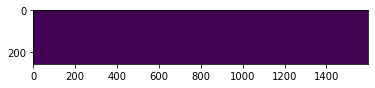

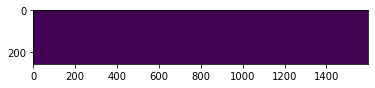

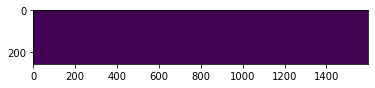

  8%|▊         | 441/5506 [04:03<46:54,  1.80it/s]

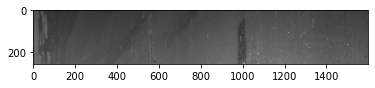

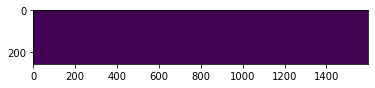

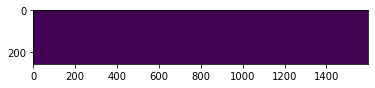

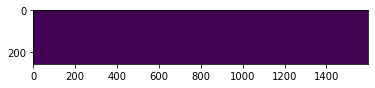

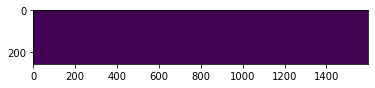

  8%|▊         | 442/5506 [04:04<46:27,  1.82it/s]

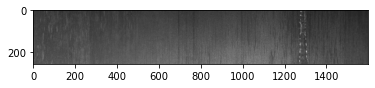

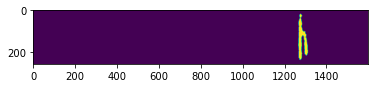

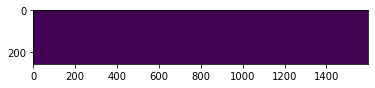

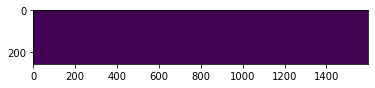

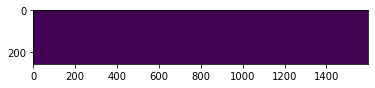

  8%|▊         | 443/5506 [04:04<48:03,  1.76it/s]

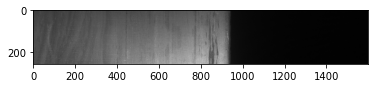

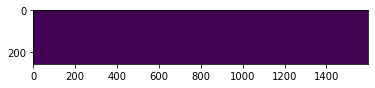

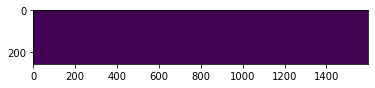

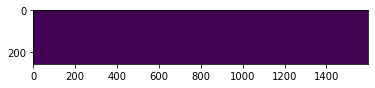

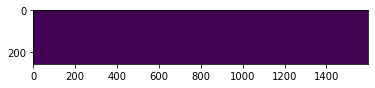

  8%|▊         | 444/5506 [04:05<46:34,  1.81it/s]

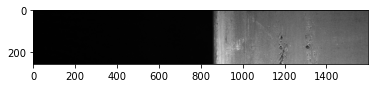

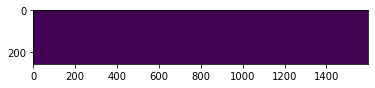

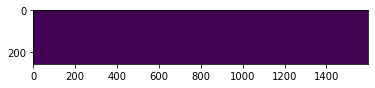

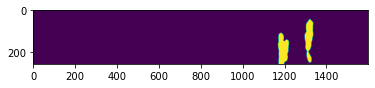

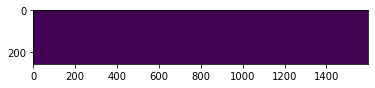

  8%|▊         | 445/5506 [04:05<45:49,  1.84it/s]

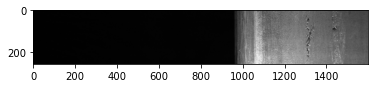

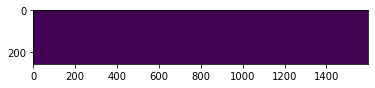

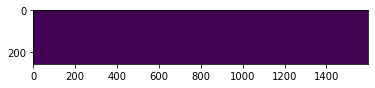

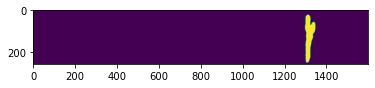

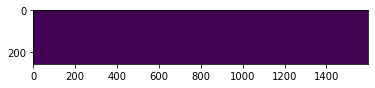

  8%|▊         | 446/5506 [04:06<45:20,  1.86it/s]

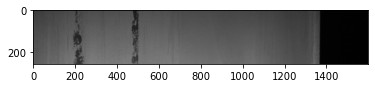

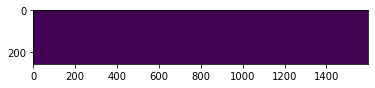

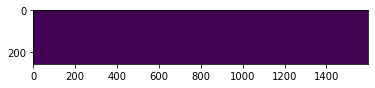

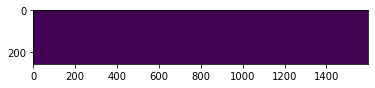

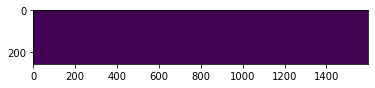

  8%|▊         | 447/5506 [04:06<46:49,  1.80it/s]

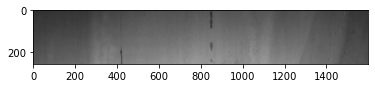

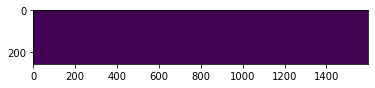

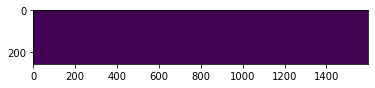

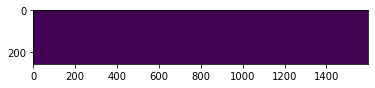

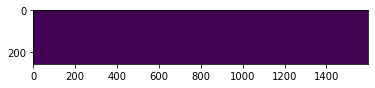

  8%|▊         | 448/5506 [04:07<46:13,  1.82it/s]

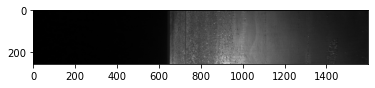

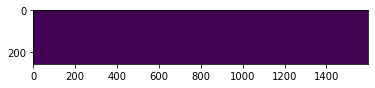

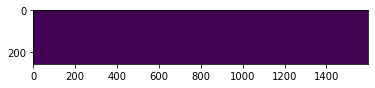

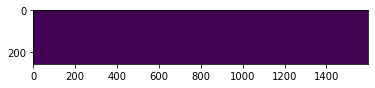

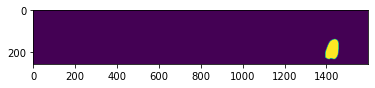

  8%|▊         | 449/5506 [04:07<46:20,  1.82it/s]

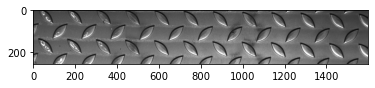

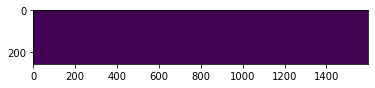

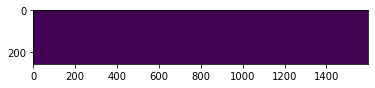

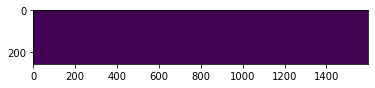

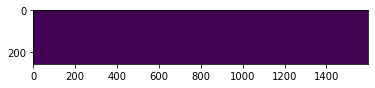

  8%|▊         | 450/5506 [04:08<48:05,  1.75it/s]

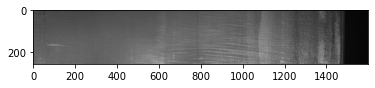

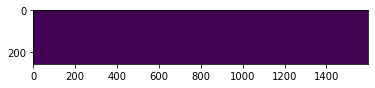

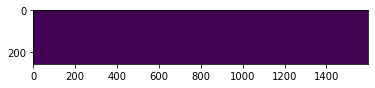

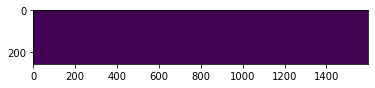

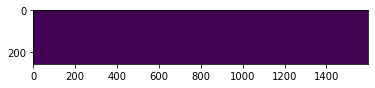

  8%|▊         | 451/5506 [04:09<47:06,  1.79it/s]

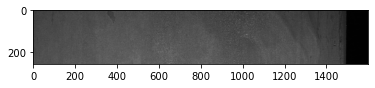

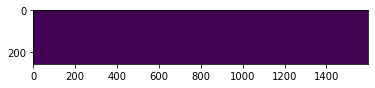

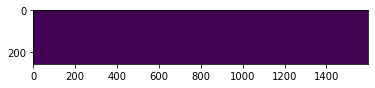

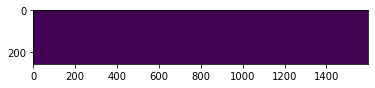

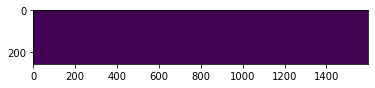

  8%|▊         | 452/5506 [04:09<46:30,  1.81it/s]

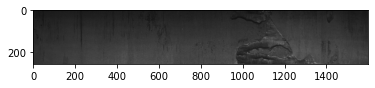

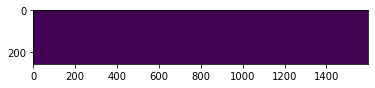

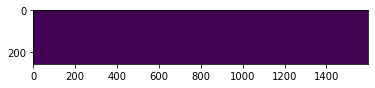

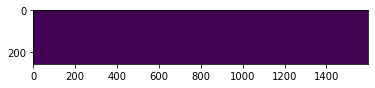

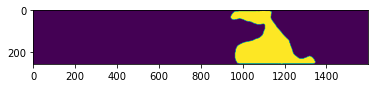

  8%|▊         | 453/5506 [04:10<45:59,  1.83it/s]

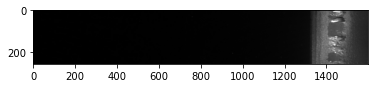

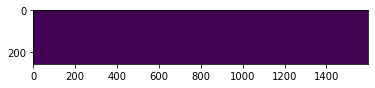

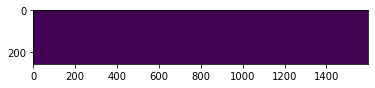

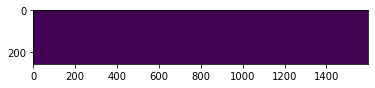

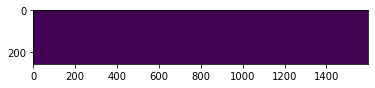

  8%|▊         | 454/5506 [04:10<47:34,  1.77it/s]

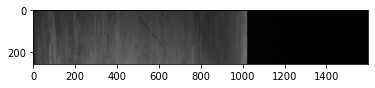

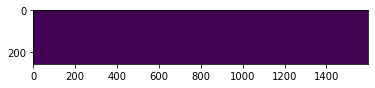

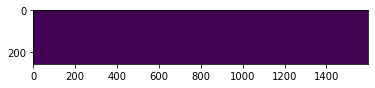

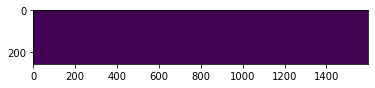

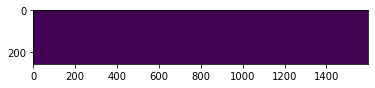

  8%|▊         | 455/5506 [04:11<46:34,  1.81it/s]

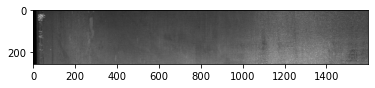

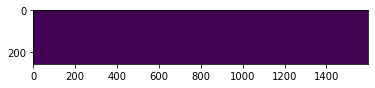

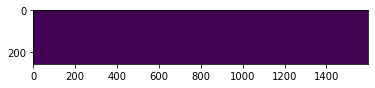

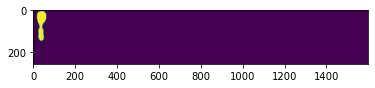

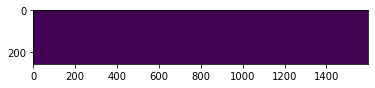

  8%|▊         | 456/5506 [04:11<46:02,  1.83it/s]

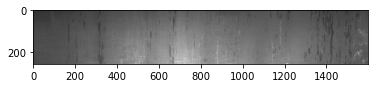

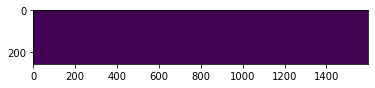

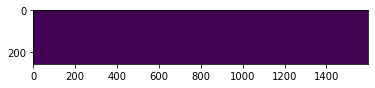

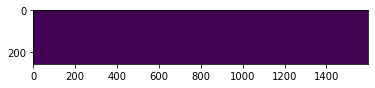

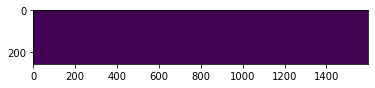

  8%|▊         | 457/5506 [04:12<46:11,  1.82it/s]

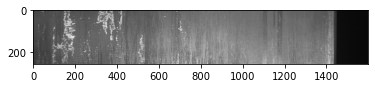

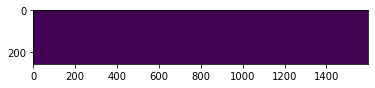

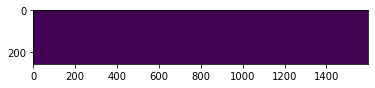

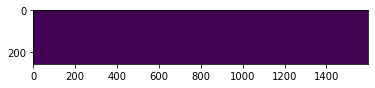

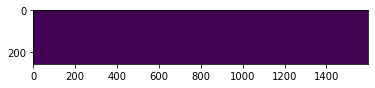

  8%|▊         | 458/5506 [04:13<47:51,  1.76it/s]

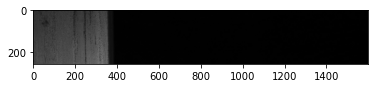

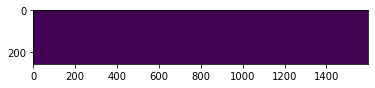

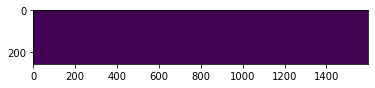

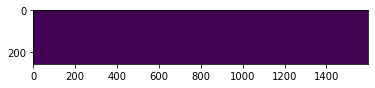

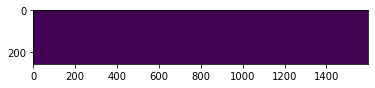

  8%|▊         | 459/5506 [04:13<46:31,  1.81it/s]

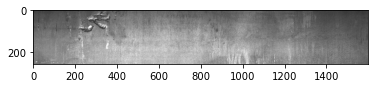

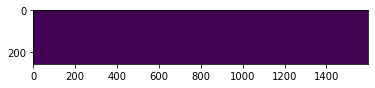

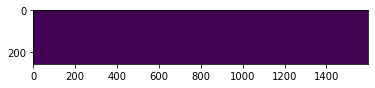

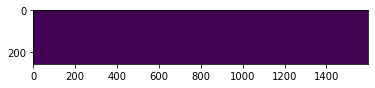

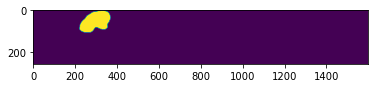

  8%|▊         | 460/5506 [04:14<45:50,  1.83it/s]

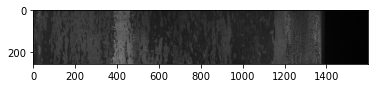

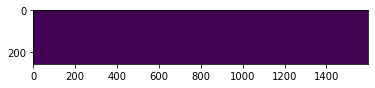

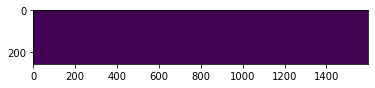

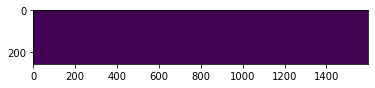

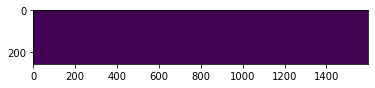

  8%|▊         | 461/5506 [04:14<47:22,  1.78it/s]

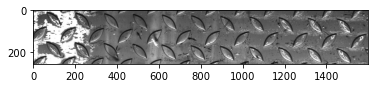

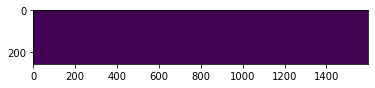

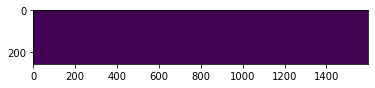

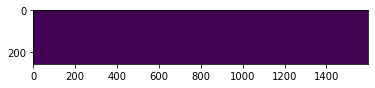

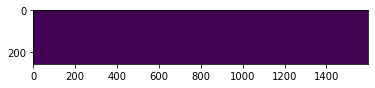

  8%|▊         | 462/5506 [04:15<46:14,  1.82it/s]

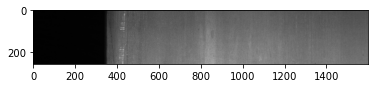

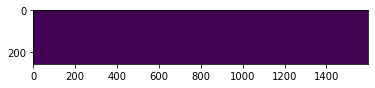

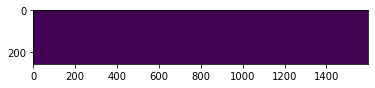

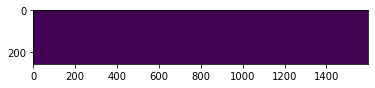

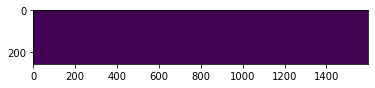

  8%|▊         | 463/5506 [04:15<45:45,  1.84it/s]

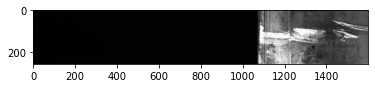

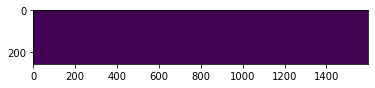

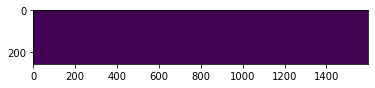

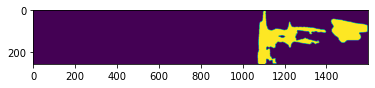

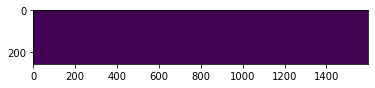

  8%|▊         | 464/5506 [04:16<45:20,  1.85it/s]

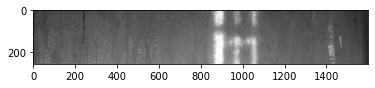

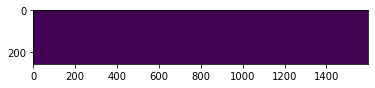

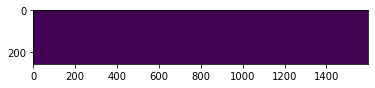

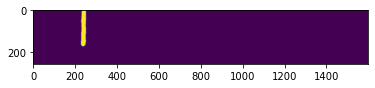

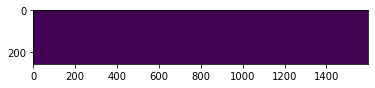

  8%|▊         | 465/5506 [04:16<47:06,  1.78it/s]

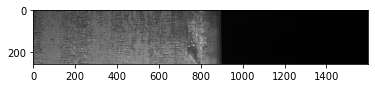

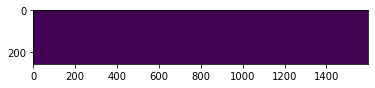

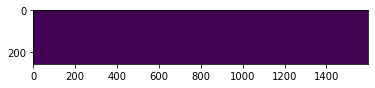

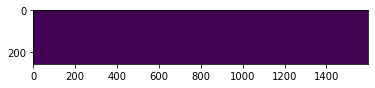

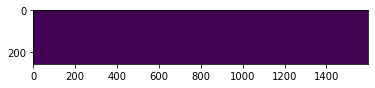

  8%|▊         | 466/5506 [04:17<46:01,  1.83it/s]

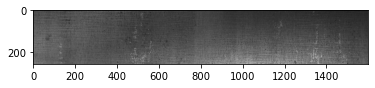

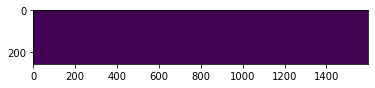

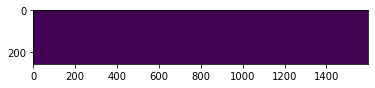

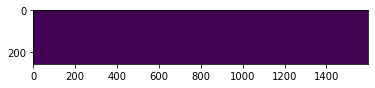

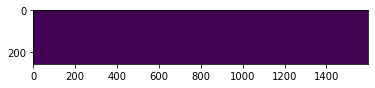

  8%|▊         | 467/5506 [04:17<45:46,  1.83it/s]

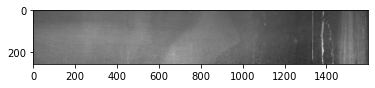

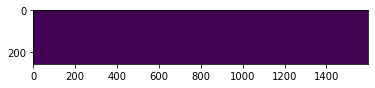

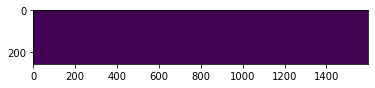

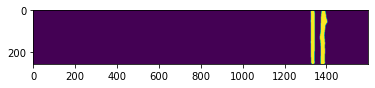

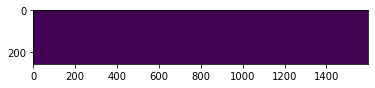

  8%|▊         | 468/5506 [04:18<47:32,  1.77it/s]

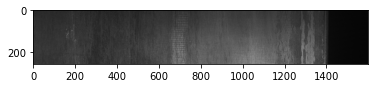

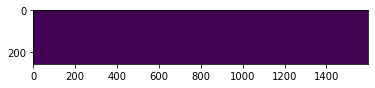

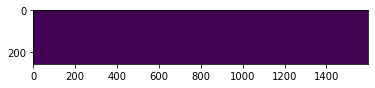

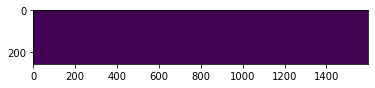

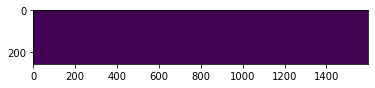

  9%|▊         | 469/5506 [04:19<46:27,  1.81it/s]

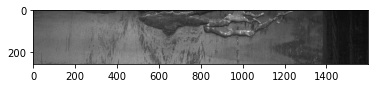

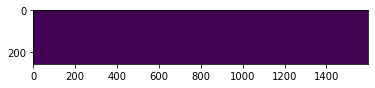

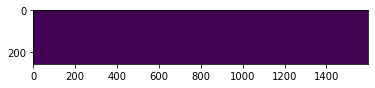

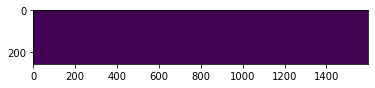

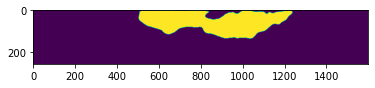

  9%|▊         | 470/5506 [04:19<45:57,  1.83it/s]

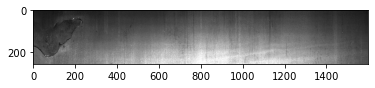

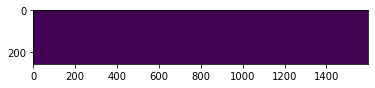

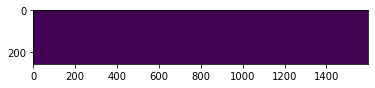

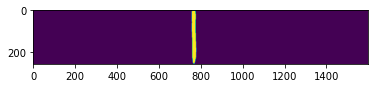

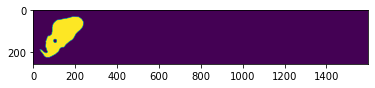

  9%|▊         | 471/5506 [04:20<45:44,  1.83it/s]

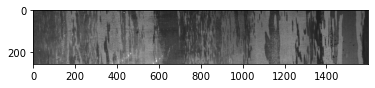

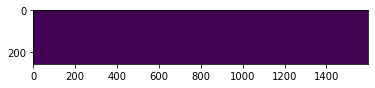

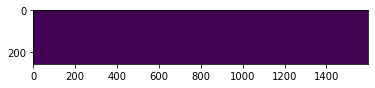

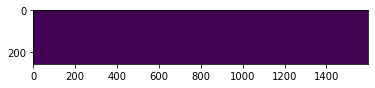

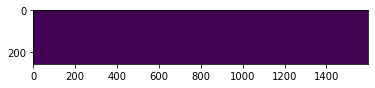

  9%|▊         | 472/5506 [04:20<47:29,  1.77it/s]

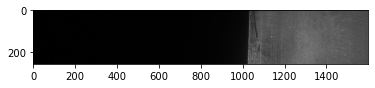

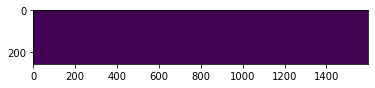

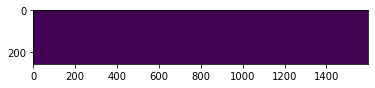

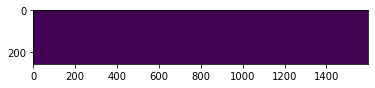

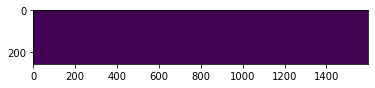

  9%|▊         | 473/5506 [04:21<46:28,  1.81it/s]

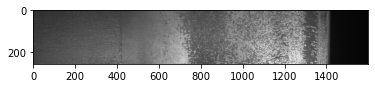

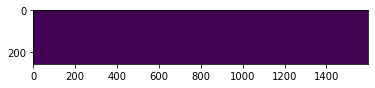

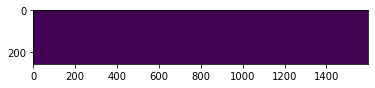

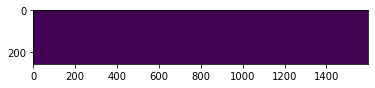

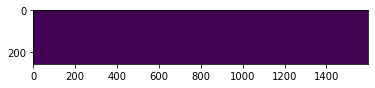

  9%|▊         | 474/5506 [04:21<46:06,  1.82it/s]

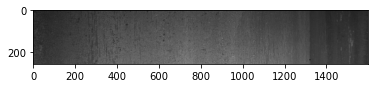

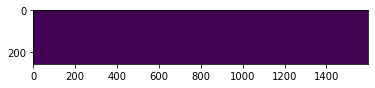

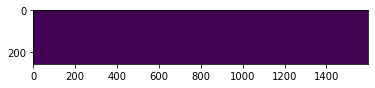

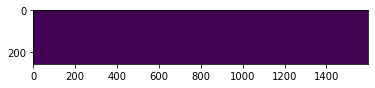

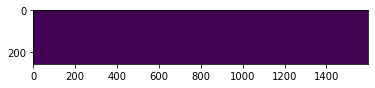

  9%|▊         | 475/5506 [04:22<45:40,  1.84it/s]

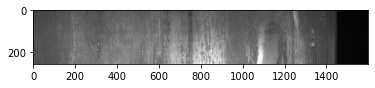

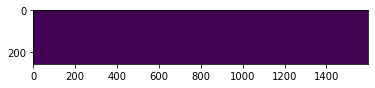

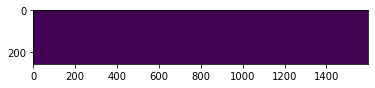

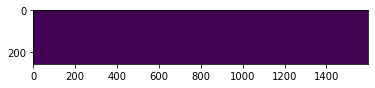

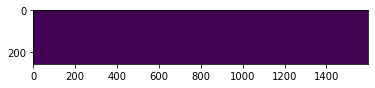

  9%|▊         | 476/5506 [04:22<47:11,  1.78it/s]

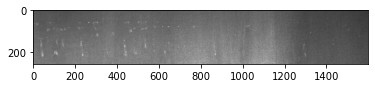

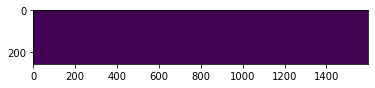

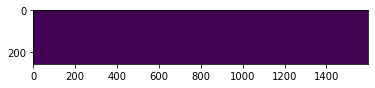

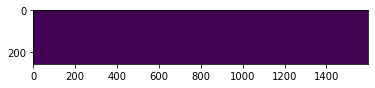

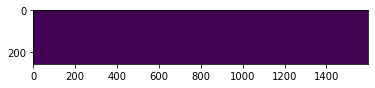

  9%|▊         | 477/5506 [04:23<46:11,  1.81it/s]

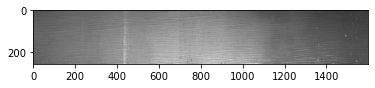

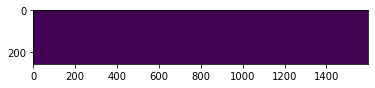

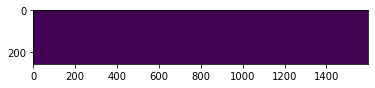

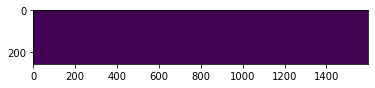

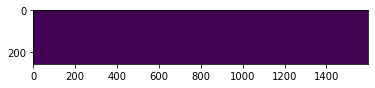

  9%|▊         | 478/5506 [04:24<45:43,  1.83it/s]

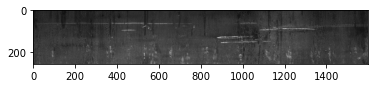

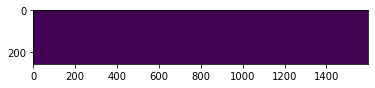

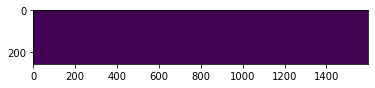

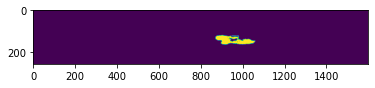

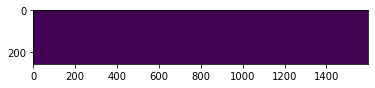

  9%|▊         | 479/5506 [04:24<47:35,  1.76it/s]

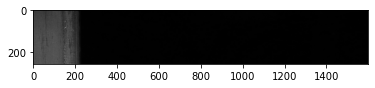

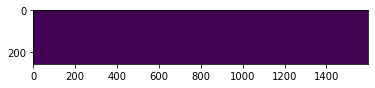

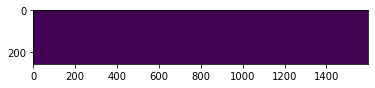

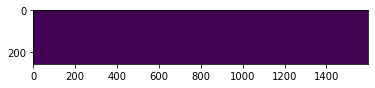

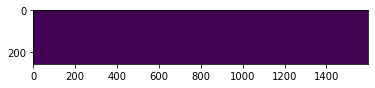

  9%|▊         | 480/5506 [04:25<46:02,  1.82it/s]

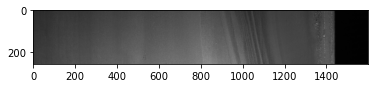

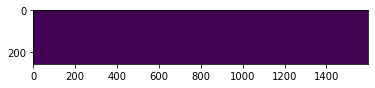

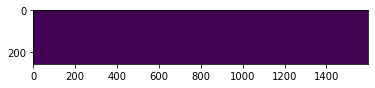

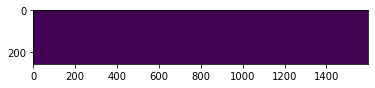

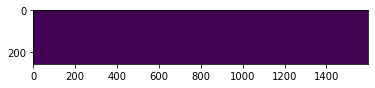

  9%|▊         | 481/5506 [04:25<45:24,  1.84it/s]

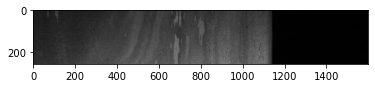

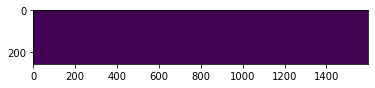

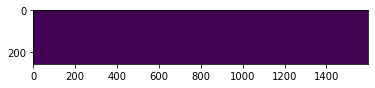

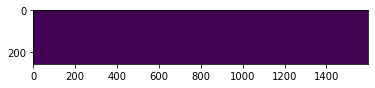

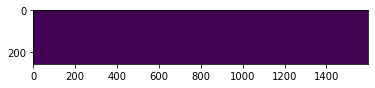

  9%|▉         | 482/5506 [04:26<45:18,  1.85it/s]

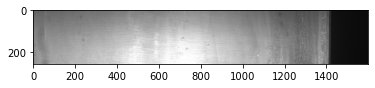

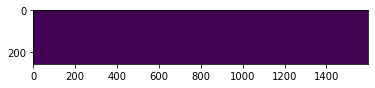

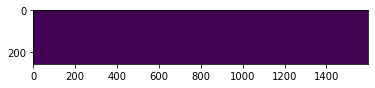

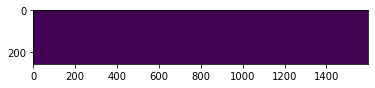

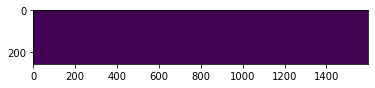

  9%|▉         | 483/5506 [04:26<47:03,  1.78it/s]

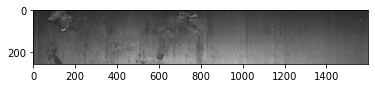

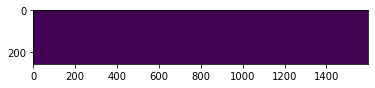

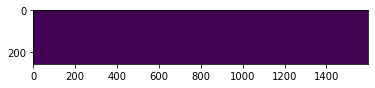

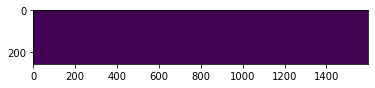

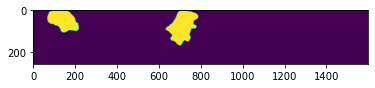

  9%|▉         | 484/5506 [04:27<46:09,  1.81it/s]

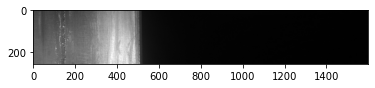

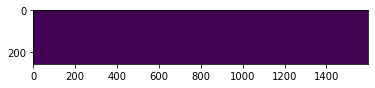

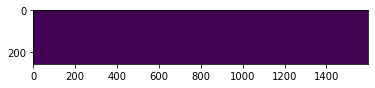

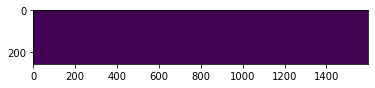

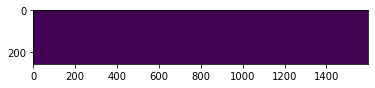

  9%|▉         | 485/5506 [04:27<45:48,  1.83it/s]

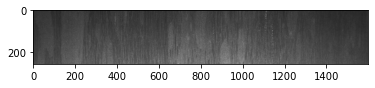

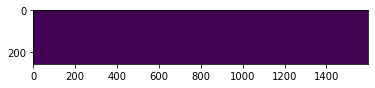

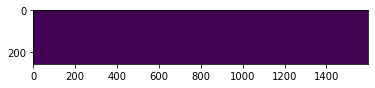

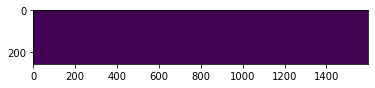

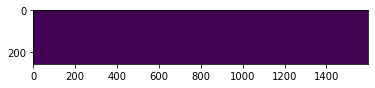

  9%|▉         | 486/5506 [04:28<47:03,  1.78it/s]

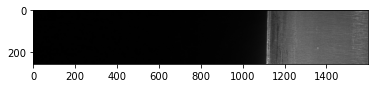

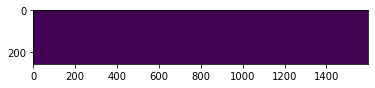

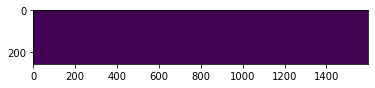

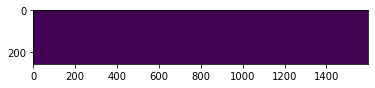

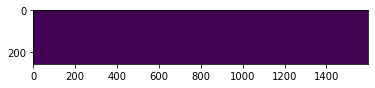

  9%|▉         | 487/5506 [04:28<46:00,  1.82it/s]

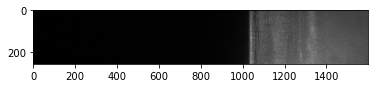

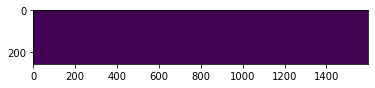

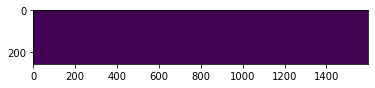

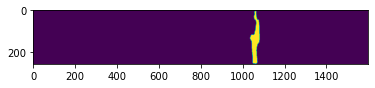

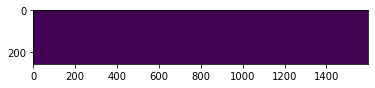

  9%|▉         | 488/5506 [04:29<45:08,  1.85it/s]

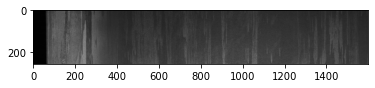

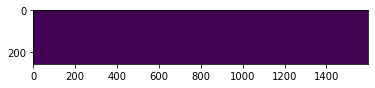

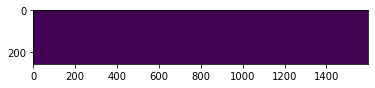

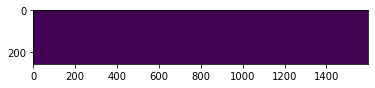

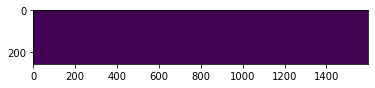

  9%|▉         | 489/5506 [04:30<45:02,  1.86it/s]

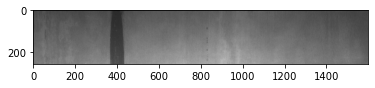

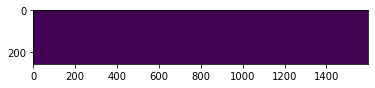

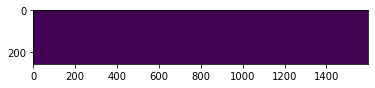

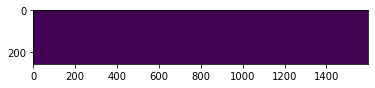

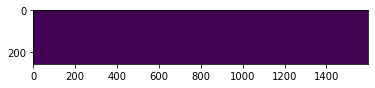

  9%|▉         | 490/5506 [04:30<47:10,  1.77it/s]

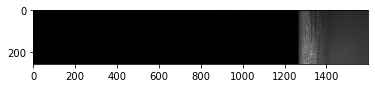

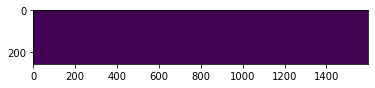

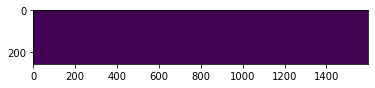

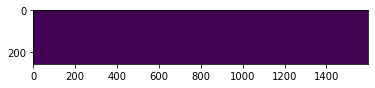

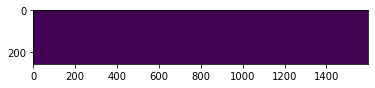

  9%|▉         | 491/5506 [04:31<46:13,  1.81it/s]

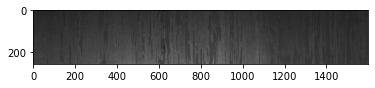

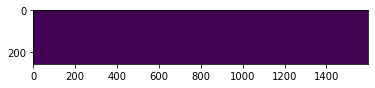

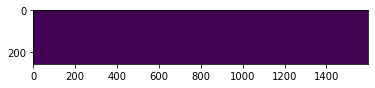

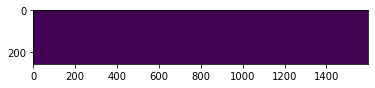

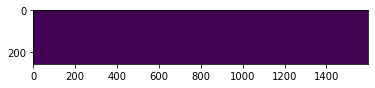

  9%|▉         | 492/5506 [04:31<45:38,  1.83it/s]

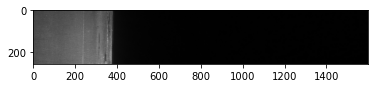

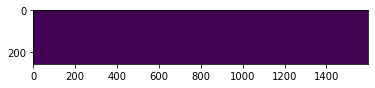

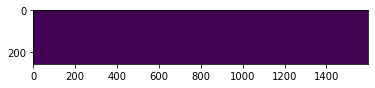

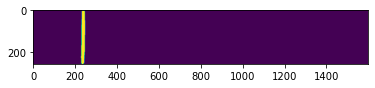

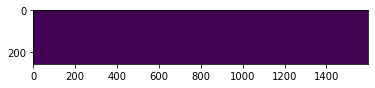

  9%|▉         | 493/5506 [04:32<45:21,  1.84it/s]

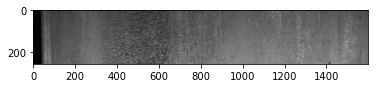

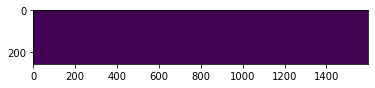

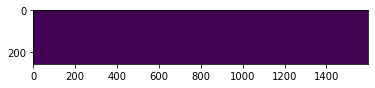

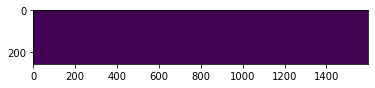

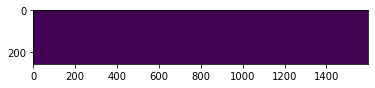

  9%|▉         | 494/5506 [04:32<47:32,  1.76it/s]

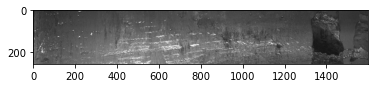

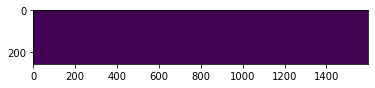

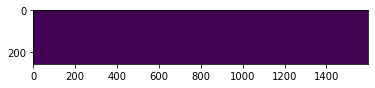

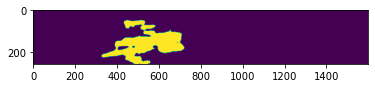

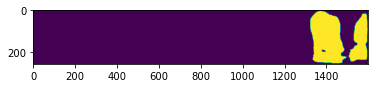

  9%|▉         | 495/5506 [04:33<47:35,  1.76it/s]

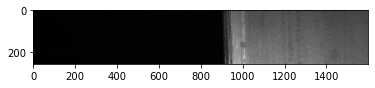

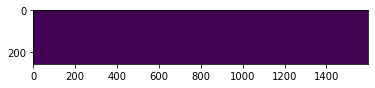

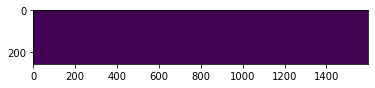

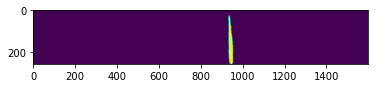

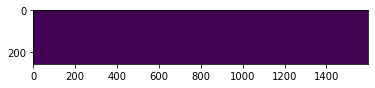

  9%|▉         | 496/5506 [04:34<47:01,  1.78it/s]

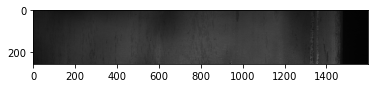

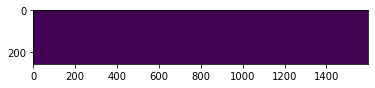

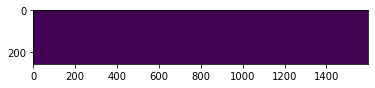

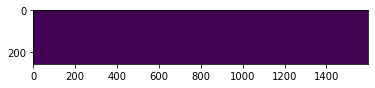

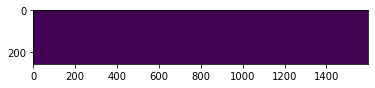

  9%|▉         | 497/5506 [04:34<48:28,  1.72it/s]

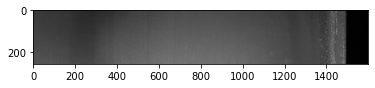

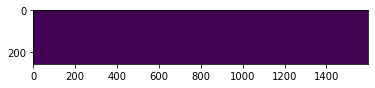

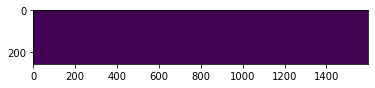

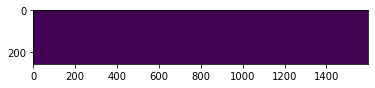

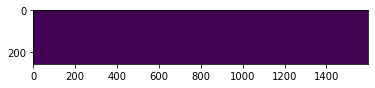

  9%|▉         | 498/5506 [04:35<47:28,  1.76it/s]

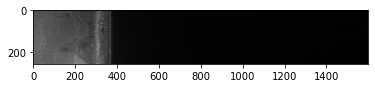

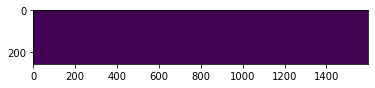

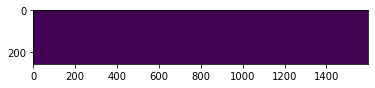

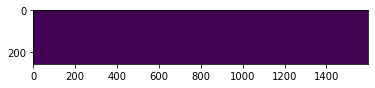

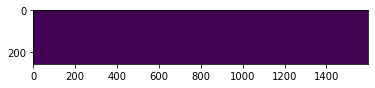

  9%|▉         | 499/5506 [04:35<46:38,  1.79it/s]

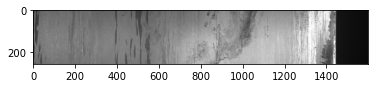

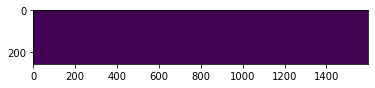

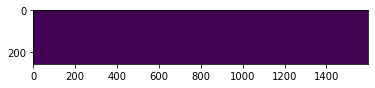

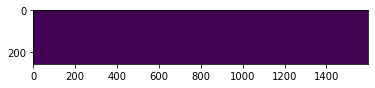

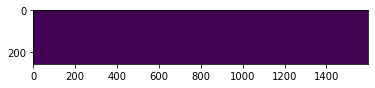

  9%|▉         | 500/5506 [04:36<46:58,  1.78it/s]

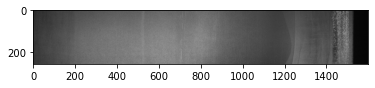

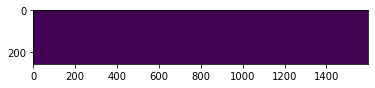

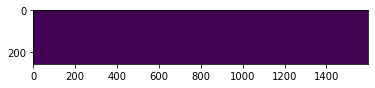

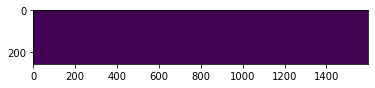

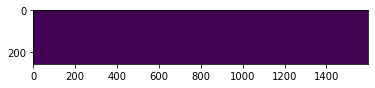

  9%|▉         | 501/5506 [04:36<48:55,  1.71it/s]

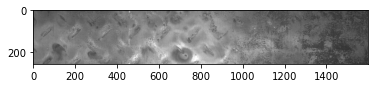

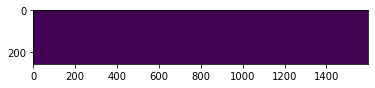

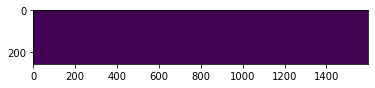

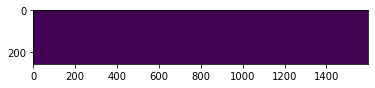

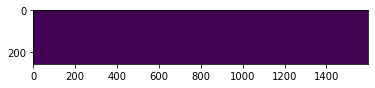

  9%|▉         | 502/5506 [04:37<48:08,  1.73it/s]

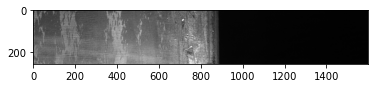

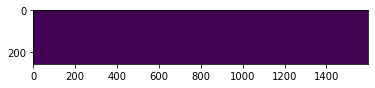

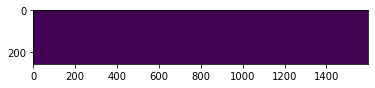

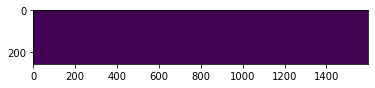

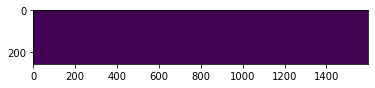

  9%|▉         | 503/5506 [04:38<47:24,  1.76it/s]

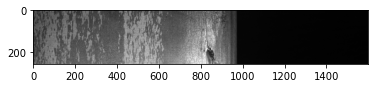

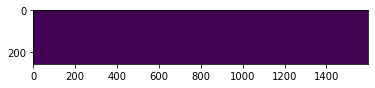

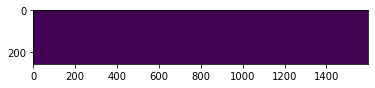

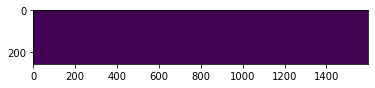

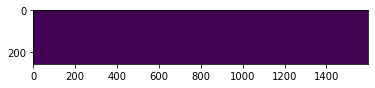

  9%|▉         | 504/5506 [04:38<48:41,  1.71it/s]

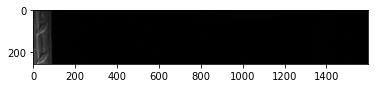

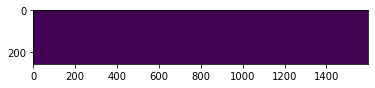

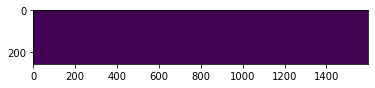

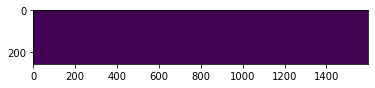

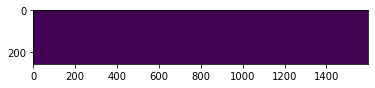

  9%|▉         | 505/5506 [04:39<47:14,  1.76it/s]

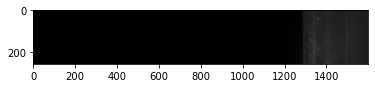

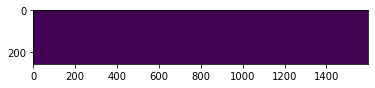

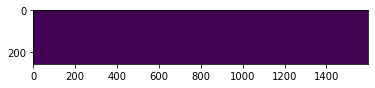

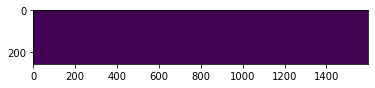

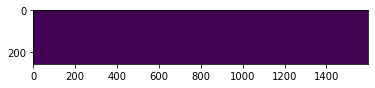

  9%|▉         | 506/5506 [04:39<46:08,  1.81it/s]

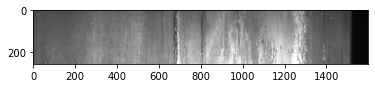

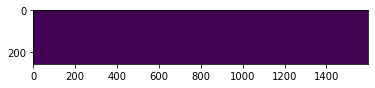

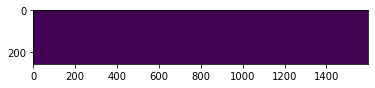

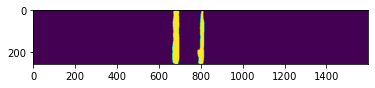

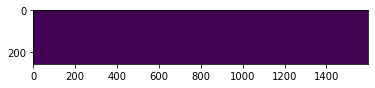

  9%|▉         | 507/5506 [04:40<45:46,  1.82it/s]

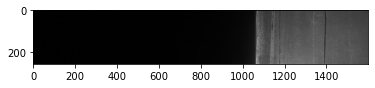

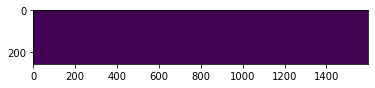

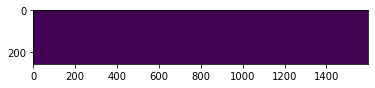

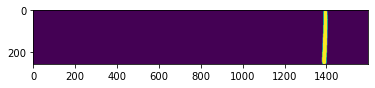

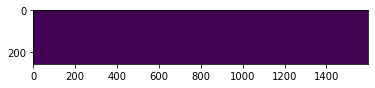

  9%|▉         | 508/5506 [04:40<47:48,  1.74it/s]

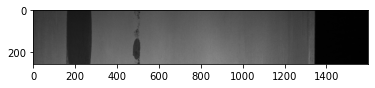

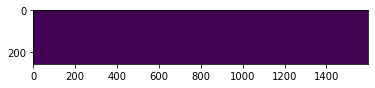

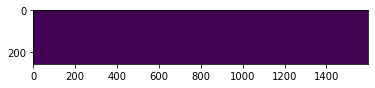

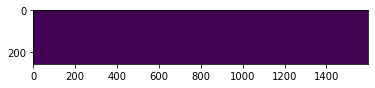

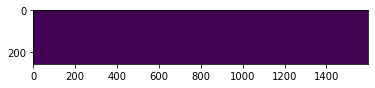

  9%|▉         | 509/5506 [04:41<46:48,  1.78it/s]

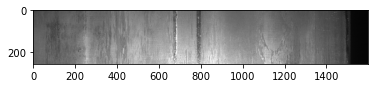

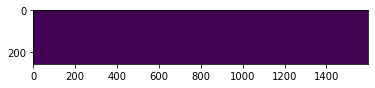

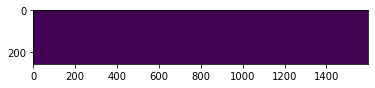

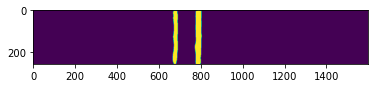

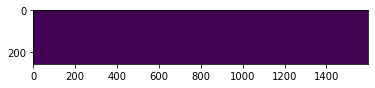

  9%|▉         | 510/5506 [04:41<46:13,  1.80it/s]

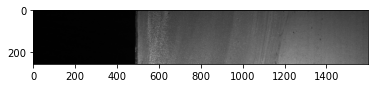

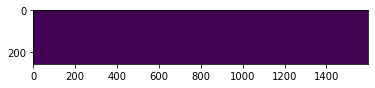

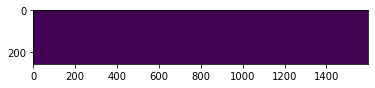

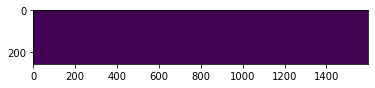

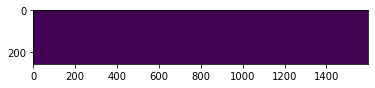

  9%|▉         | 511/5506 [04:42<45:50,  1.82it/s]

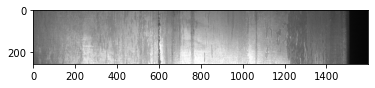

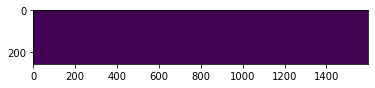

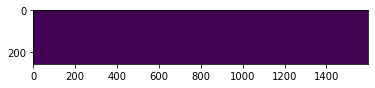

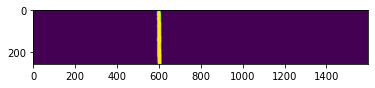

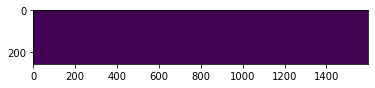

  9%|▉         | 512/5506 [04:43<48:10,  1.73it/s]

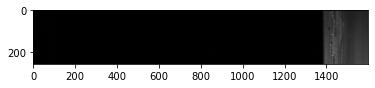

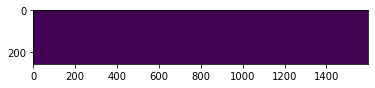

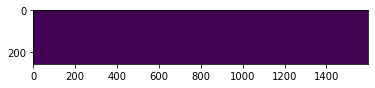

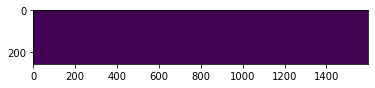

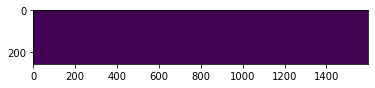

  9%|▉         | 513/5506 [04:43<47:12,  1.76it/s]

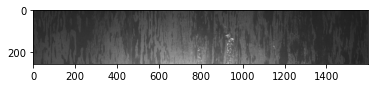

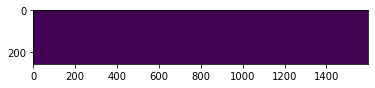

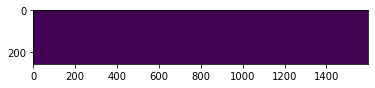

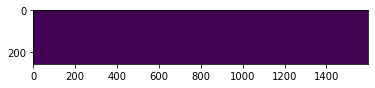

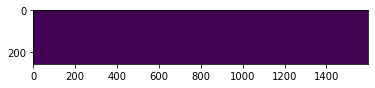

  9%|▉         | 514/5506 [04:44<46:37,  1.78it/s]

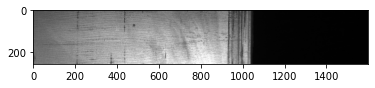

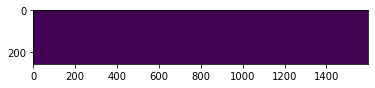

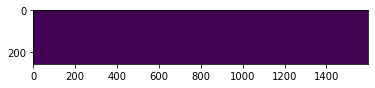

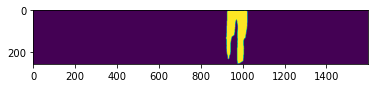

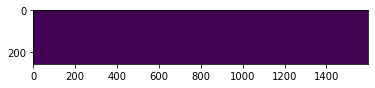

  9%|▉         | 515/5506 [04:44<48:06,  1.73it/s]

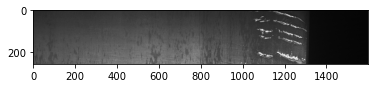

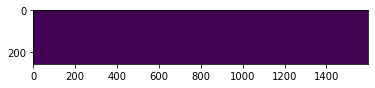

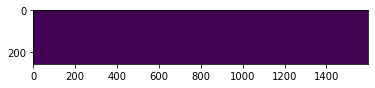

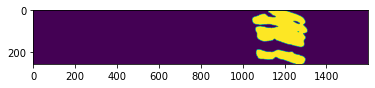

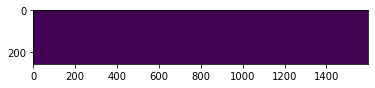

  9%|▉         | 516/5506 [04:45<47:04,  1.77it/s]

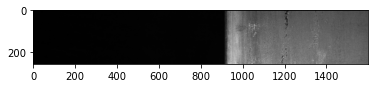

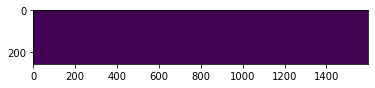

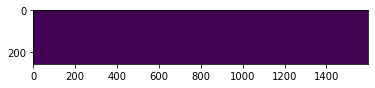

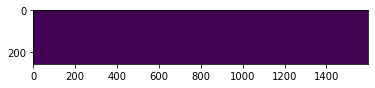

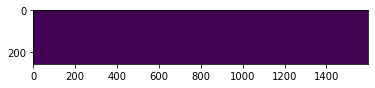

  9%|▉         | 517/5506 [04:45<46:16,  1.80it/s]

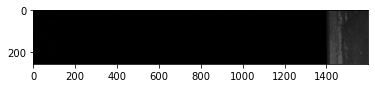

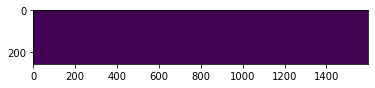

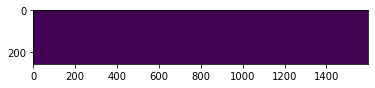

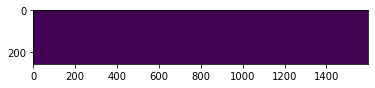

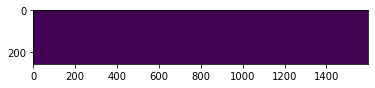

  9%|▉         | 518/5506 [04:46<45:44,  1.82it/s]

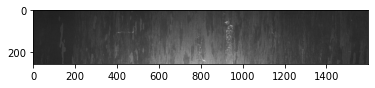

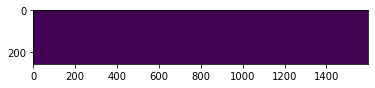

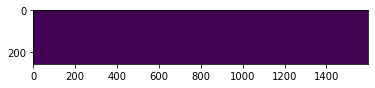

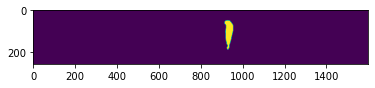

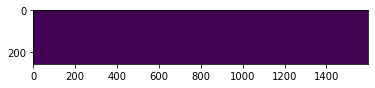

  9%|▉         | 519/5506 [04:47<47:28,  1.75it/s]

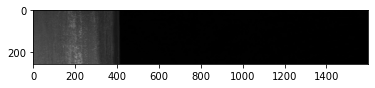

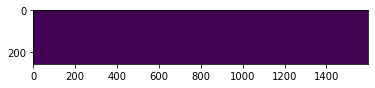

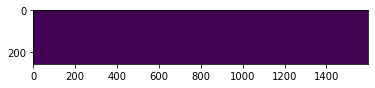

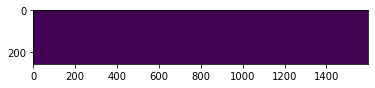

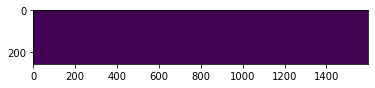

  9%|▉         | 520/5506 [04:47<46:23,  1.79it/s]

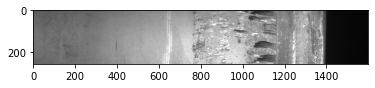

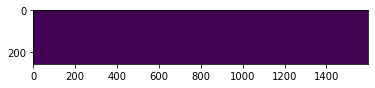

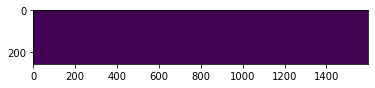

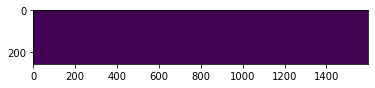

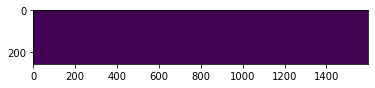

  9%|▉         | 521/5506 [04:48<46:12,  1.80it/s]

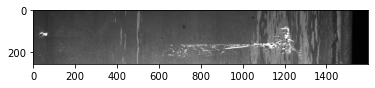

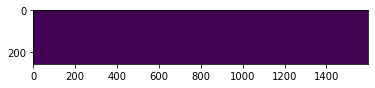

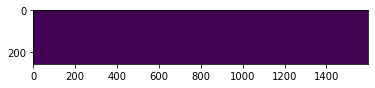

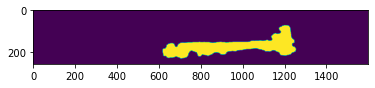

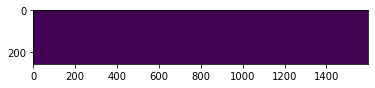

  9%|▉         | 522/5506 [04:48<48:22,  1.72it/s]

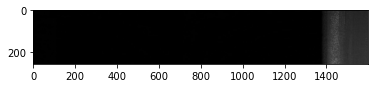

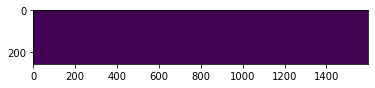

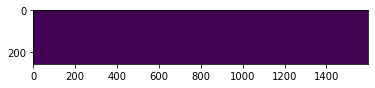

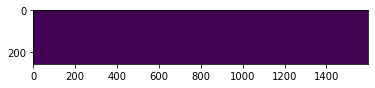

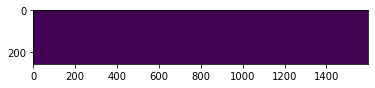

  9%|▉         | 523/5506 [04:49<47:14,  1.76it/s]

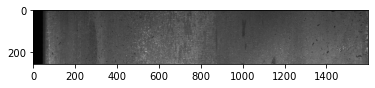

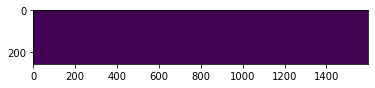

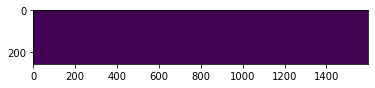

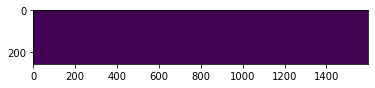

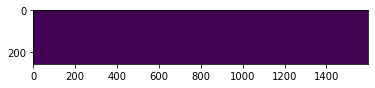

 10%|▉         | 524/5506 [04:49<46:58,  1.77it/s]

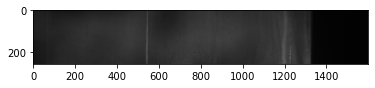

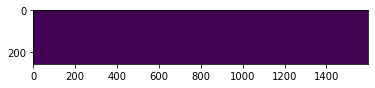

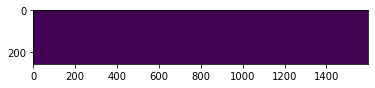

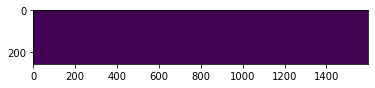

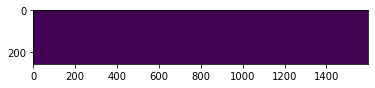

 10%|▉         | 525/5506 [04:50<46:16,  1.79it/s]

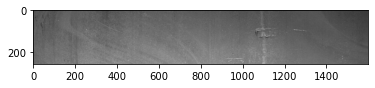

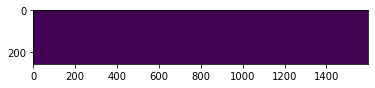

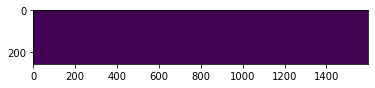

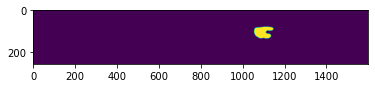

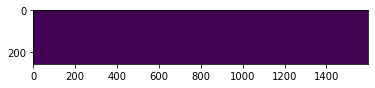

 10%|▉         | 526/5506 [04:51<47:47,  1.74it/s]

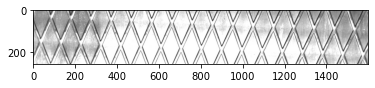

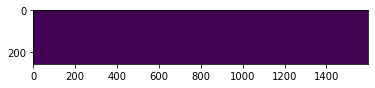

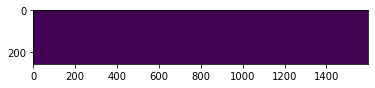

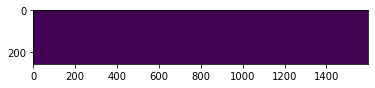

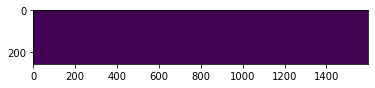

 10%|▉         | 527/5506 [04:51<47:25,  1.75it/s]

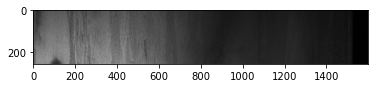

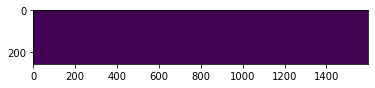

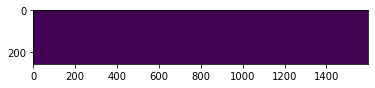

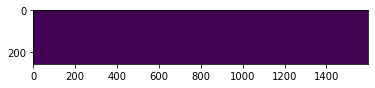

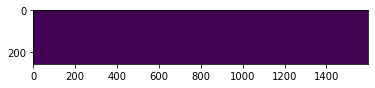

 10%|▉         | 528/5506 [04:52<46:49,  1.77it/s]

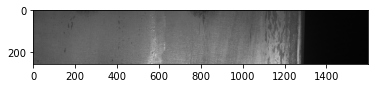

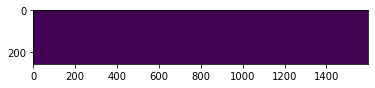

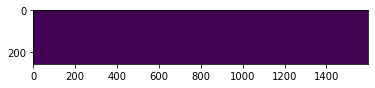

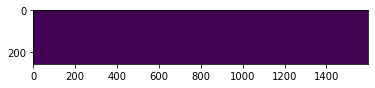

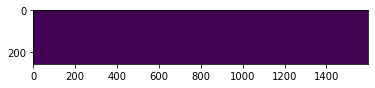

 10%|▉         | 529/5506 [04:52<46:00,  1.80it/s]

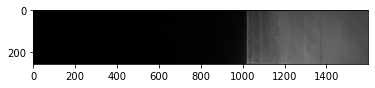

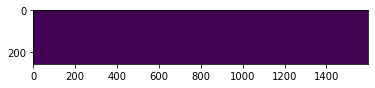

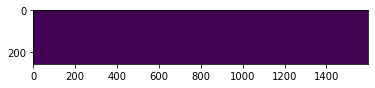

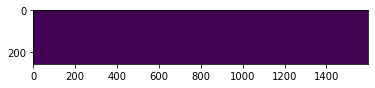

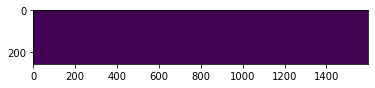

 10%|▉         | 530/5506 [04:53<48:11,  1.72it/s]

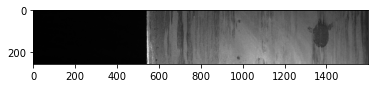

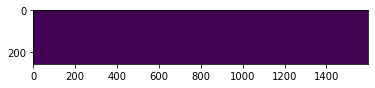

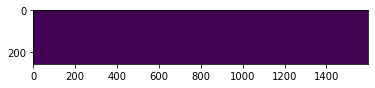

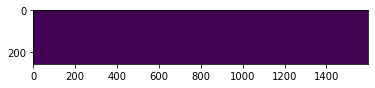

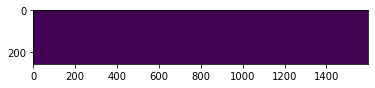

 10%|▉         | 531/5506 [04:53<47:14,  1.76it/s]

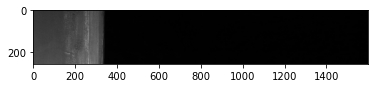

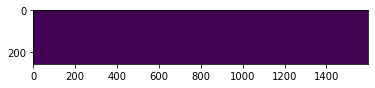

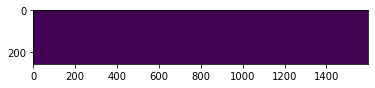

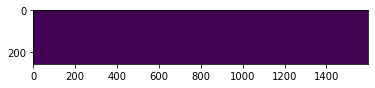

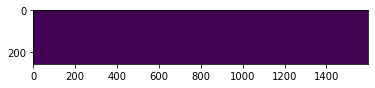

 10%|▉         | 532/5506 [04:54<46:17,  1.79it/s]

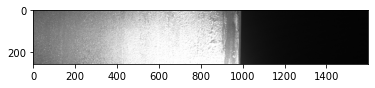

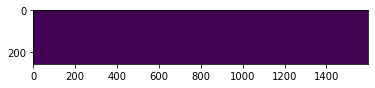

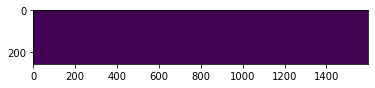

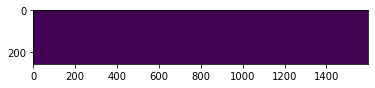

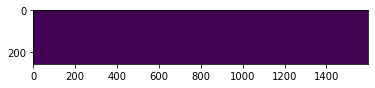

 10%|▉         | 533/5506 [04:55<47:57,  1.73it/s]

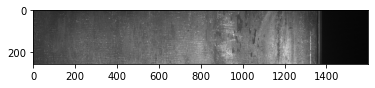

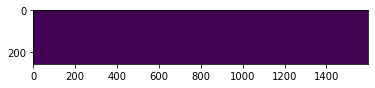

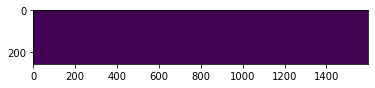

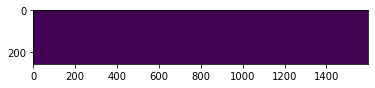

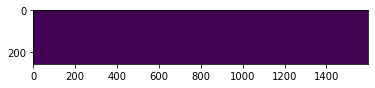

 10%|▉         | 534/5506 [04:55<47:17,  1.75it/s]

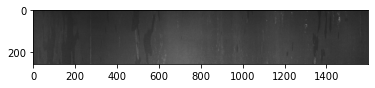

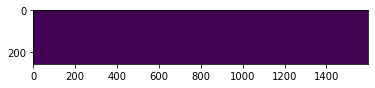

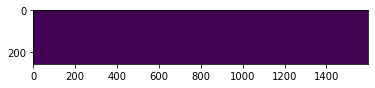

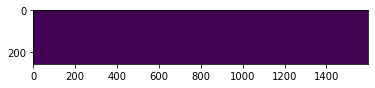

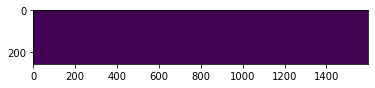

 10%|▉         | 535/5506 [04:56<46:43,  1.77it/s]

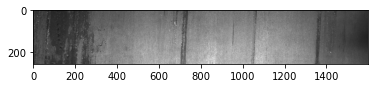

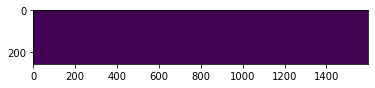

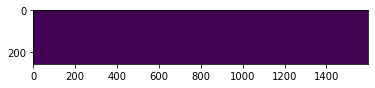

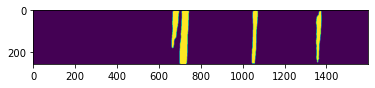

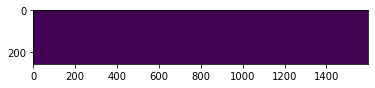

 10%|▉         | 536/5506 [04:56<46:04,  1.80it/s]

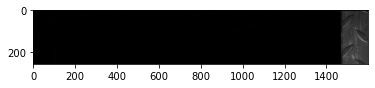

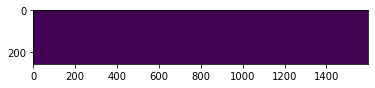

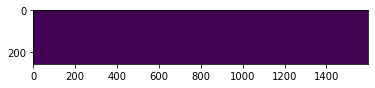

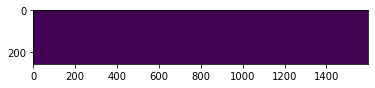

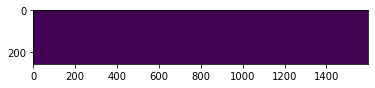

 10%|▉         | 537/5506 [04:57<47:29,  1.74it/s]

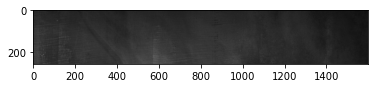

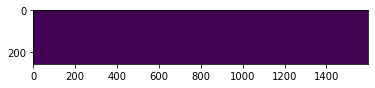

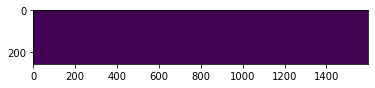

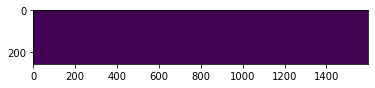

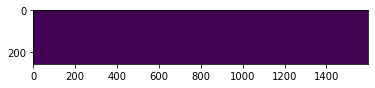

 10%|▉         | 538/5506 [04:57<47:17,  1.75it/s]

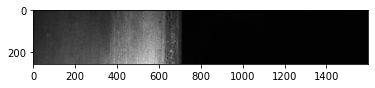

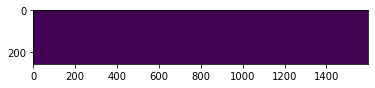

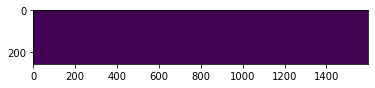

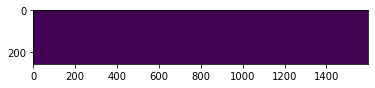

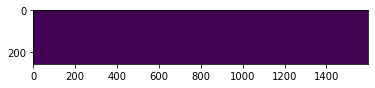

 10%|▉         | 539/5506 [04:58<46:17,  1.79it/s]

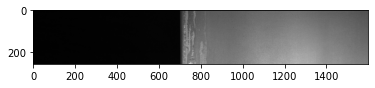

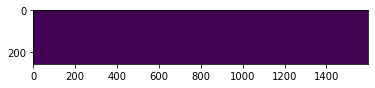

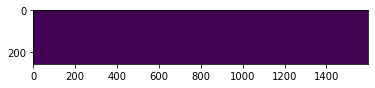

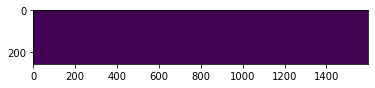

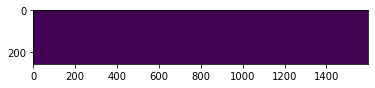

 10%|▉         | 540/5506 [04:58<47:57,  1.73it/s]

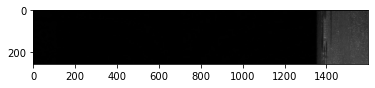

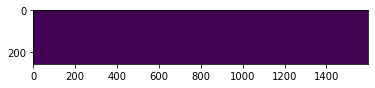

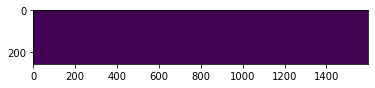

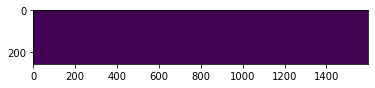

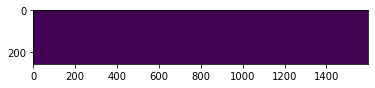

 10%|▉         | 541/5506 [04:59<46:56,  1.76it/s]

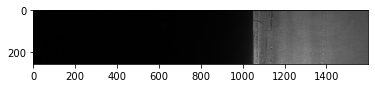

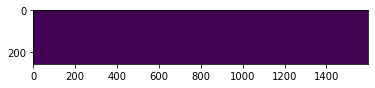

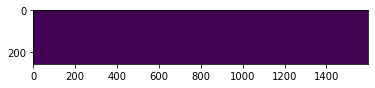

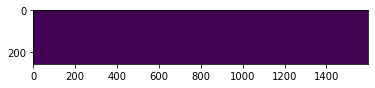

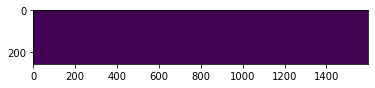

 10%|▉         | 542/5506 [05:00<46:27,  1.78it/s]

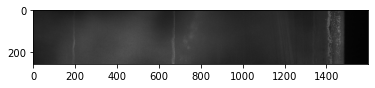

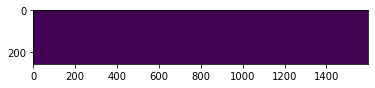

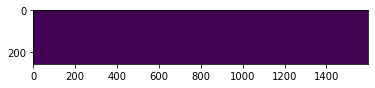

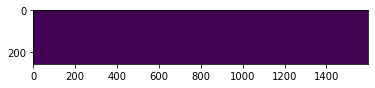

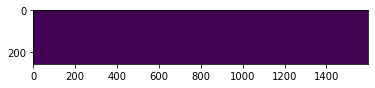

 10%|▉         | 543/5506 [05:00<46:21,  1.78it/s]

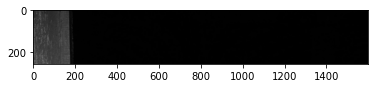

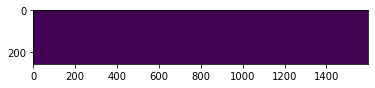

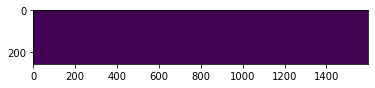

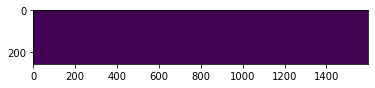

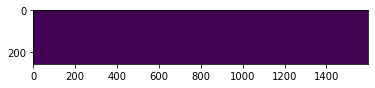

 10%|▉         | 544/5506 [05:01<47:46,  1.73it/s]

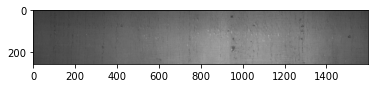

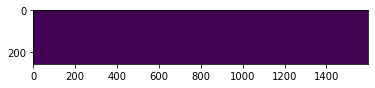

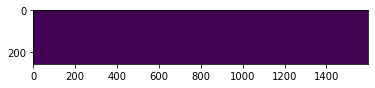

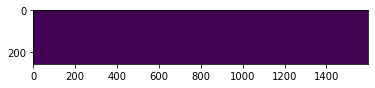

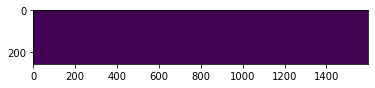

 10%|▉         | 545/5506 [05:01<46:27,  1.78it/s]

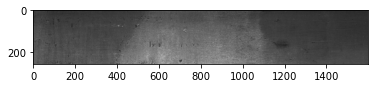

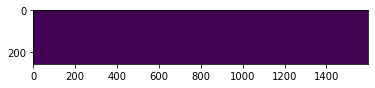

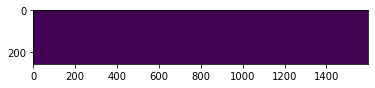

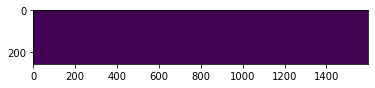

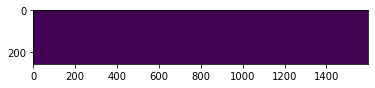

 10%|▉         | 546/5506 [05:02<46:06,  1.79it/s]

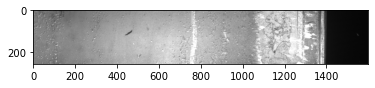

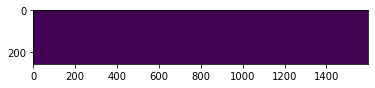

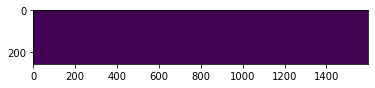

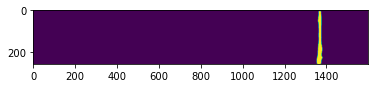

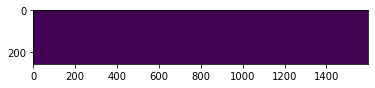

 10%|▉         | 547/5506 [05:02<45:44,  1.81it/s]

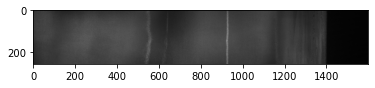

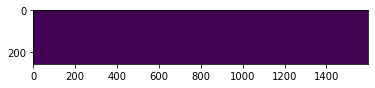

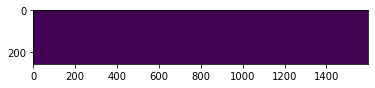

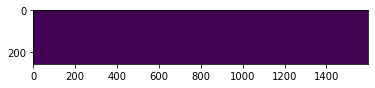

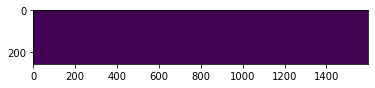

 10%|▉         | 548/5506 [05:03<47:45,  1.73it/s]

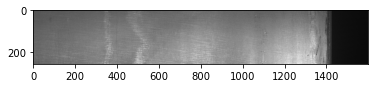

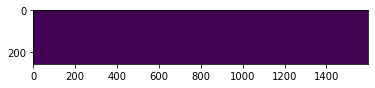

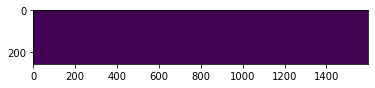

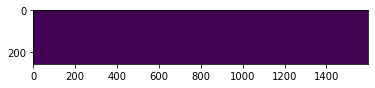

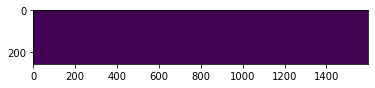

 10%|▉         | 549/5506 [05:04<46:58,  1.76it/s]

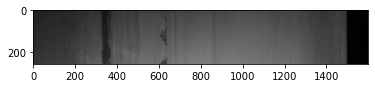

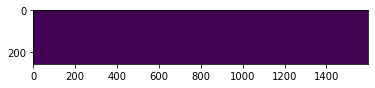

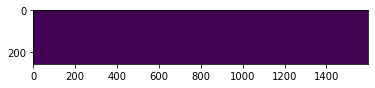

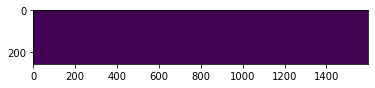

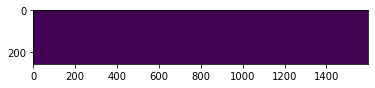

 10%|▉         | 550/5506 [05:04<46:45,  1.77it/s]

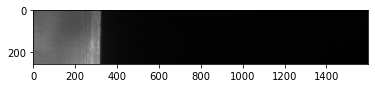

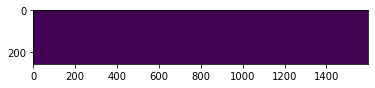

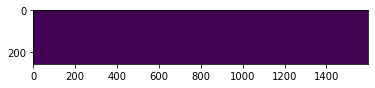

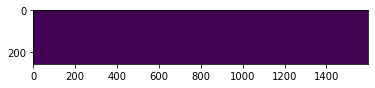

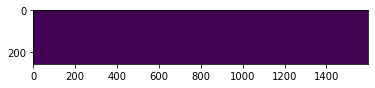

 10%|█         | 551/5506 [05:05<47:53,  1.72it/s]

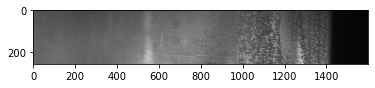

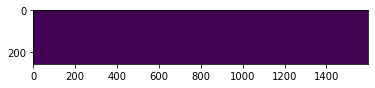

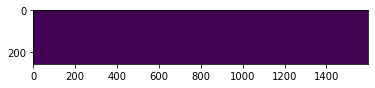

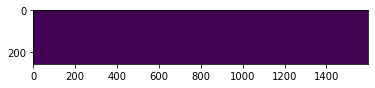

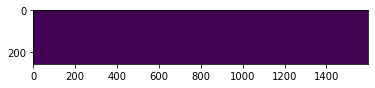

 10%|█         | 552/5506 [05:05<46:32,  1.77it/s]

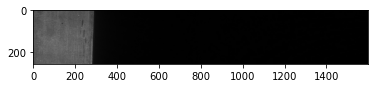

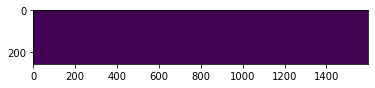

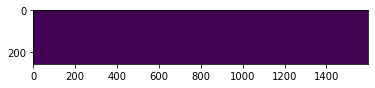

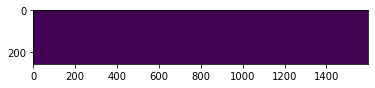

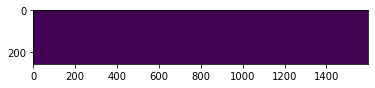

 10%|█         | 553/5506 [05:06<45:59,  1.79it/s]

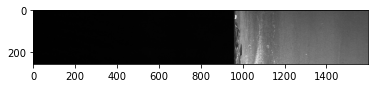

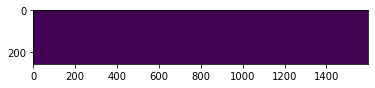

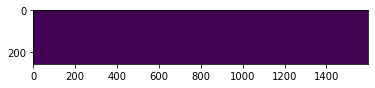

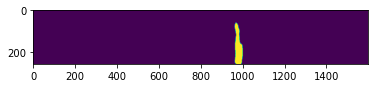

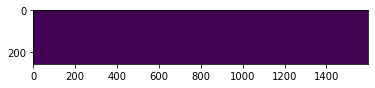

 10%|█         | 554/5506 [05:06<45:30,  1.81it/s]

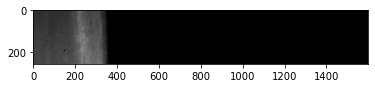

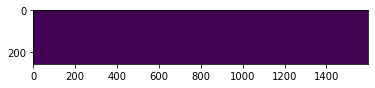

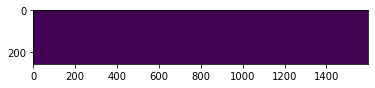

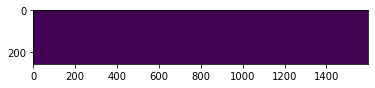

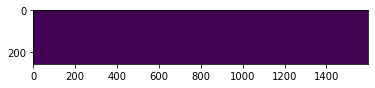

 10%|█         | 555/5506 [05:07<47:33,  1.74it/s]

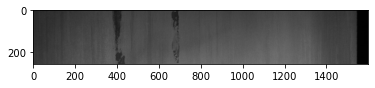

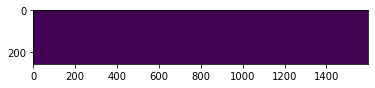

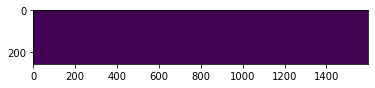

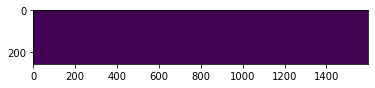

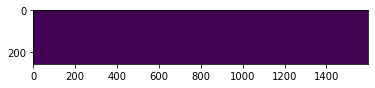

 10%|█         | 556/5506 [05:08<46:47,  1.76it/s]

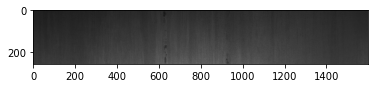

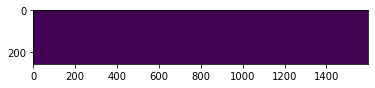

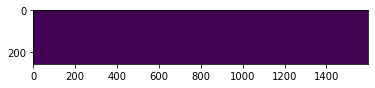

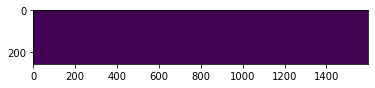

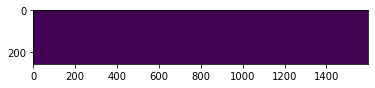

 10%|█         | 557/5506 [05:08<46:10,  1.79it/s]

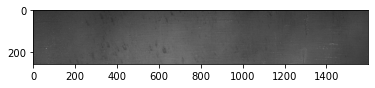

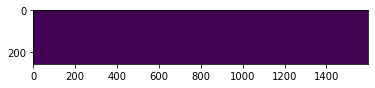

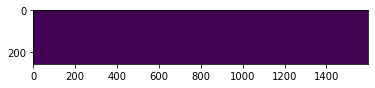

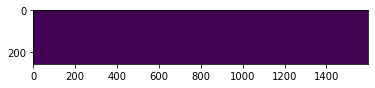

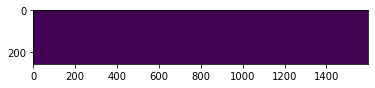

 10%|█         | 558/5506 [05:09<48:13,  1.71it/s]

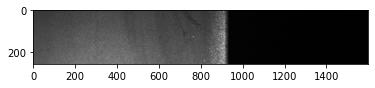

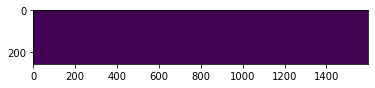

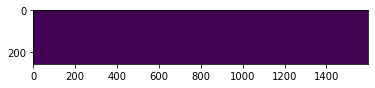

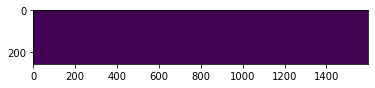

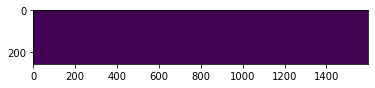

 10%|█         | 559/5506 [05:09<46:45,  1.76it/s]

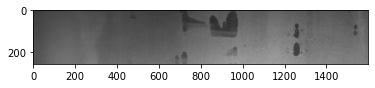

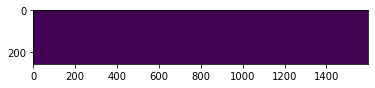

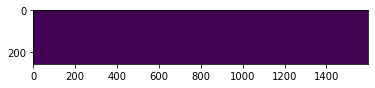

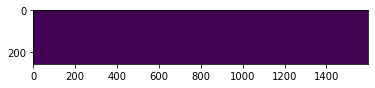

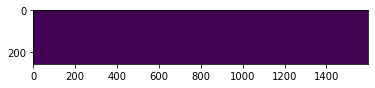

 10%|█         | 560/5506 [05:10<46:04,  1.79it/s]

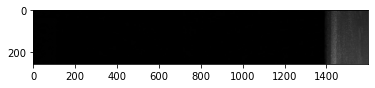

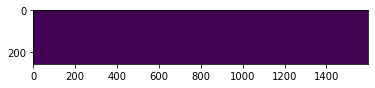

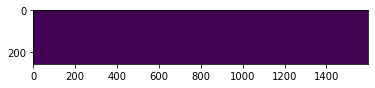

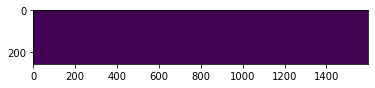

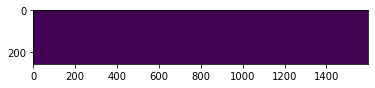

 10%|█         | 561/5506 [05:10<45:21,  1.82it/s]

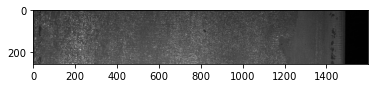

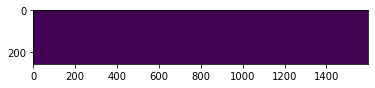

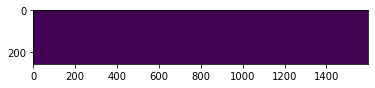

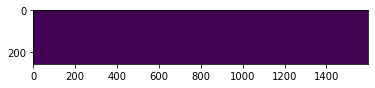

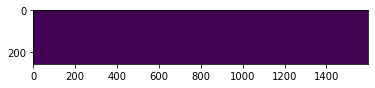

 10%|█         | 562/5506 [05:11<47:44,  1.73it/s]

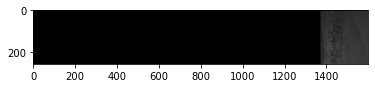

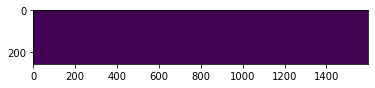

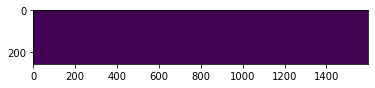

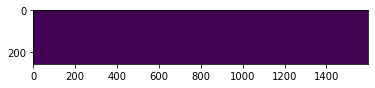

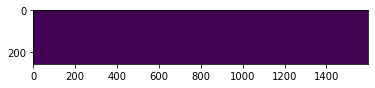

 10%|█         | 563/5506 [05:11<46:35,  1.77it/s]

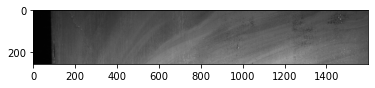

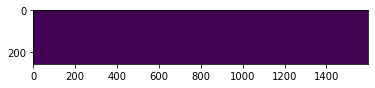

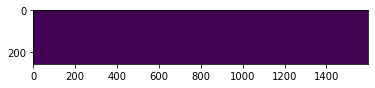

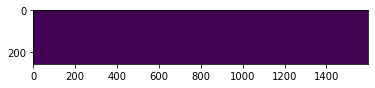

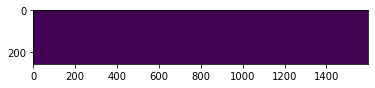

 10%|█         | 564/5506 [05:12<45:36,  1.81it/s]

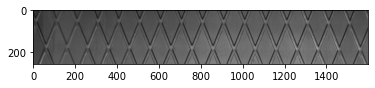

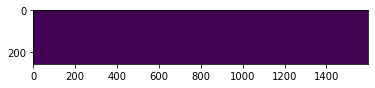

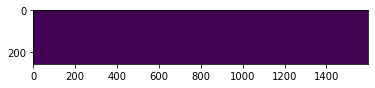

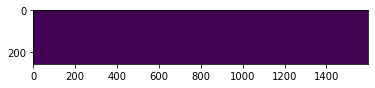

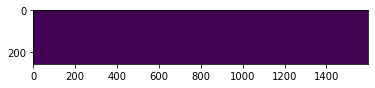

 10%|█         | 565/5506 [05:13<46:12,  1.78it/s]

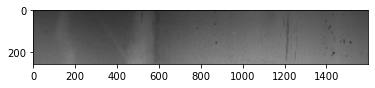

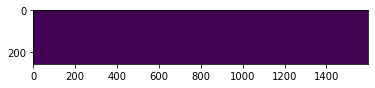

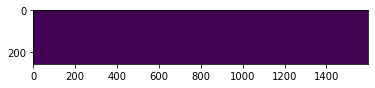

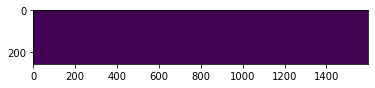

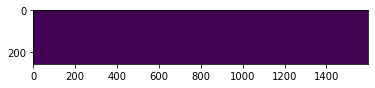

 10%|█         | 566/5506 [05:13<48:03,  1.71it/s]

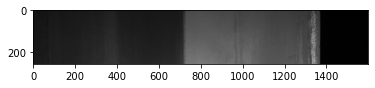

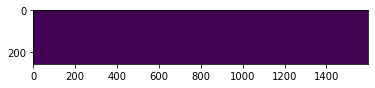

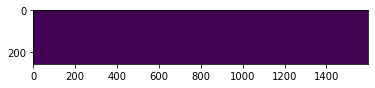

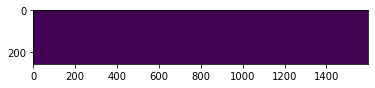

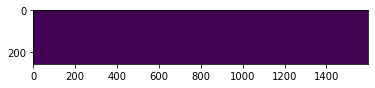

 10%|█         | 567/5506 [05:14<47:51,  1.72it/s]

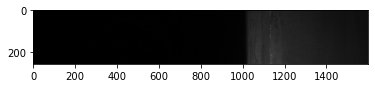

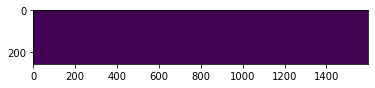

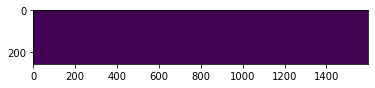

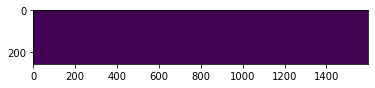

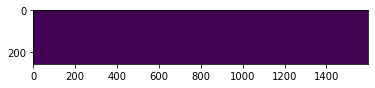

 10%|█         | 568/5506 [05:14<46:53,  1.76it/s]

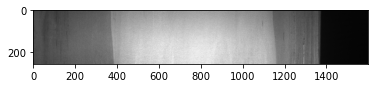

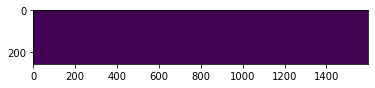

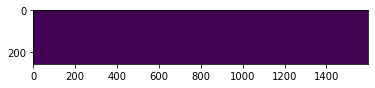

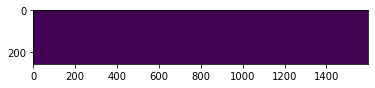

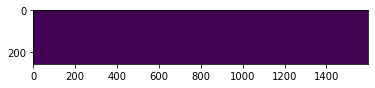

 10%|█         | 569/5506 [05:15<48:56,  1.68it/s]

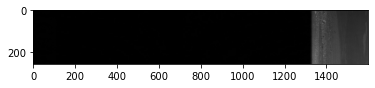

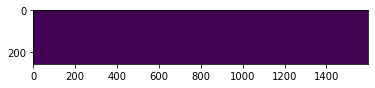

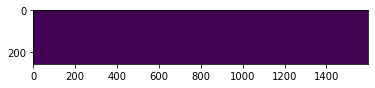

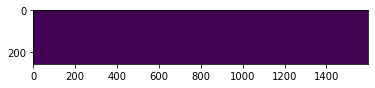

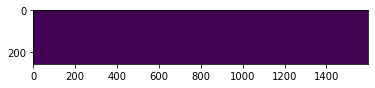

 10%|█         | 570/5506 [05:16<48:07,  1.71it/s]

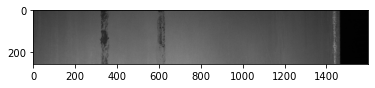

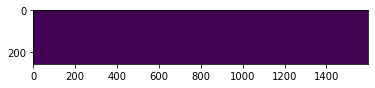

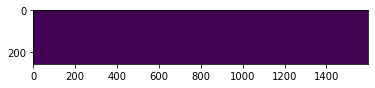

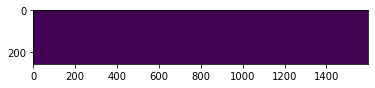

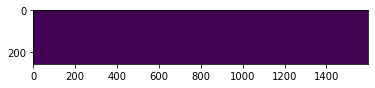

 10%|█         | 571/5506 [05:16<47:44,  1.72it/s]

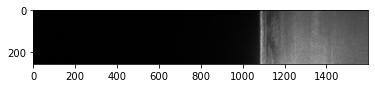

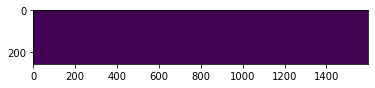

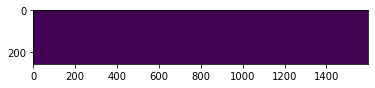

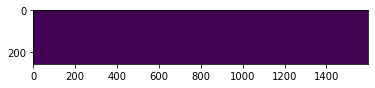

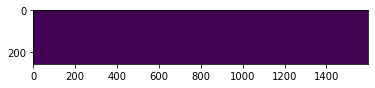

 10%|█         | 572/5506 [05:17<47:09,  1.74it/s]

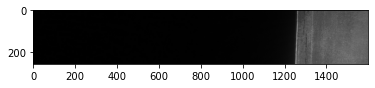

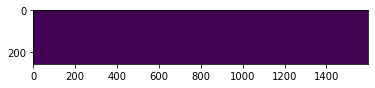

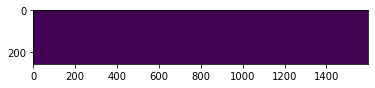

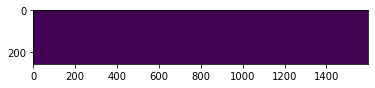

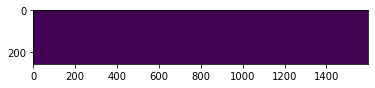

 10%|█         | 573/5506 [05:17<47:59,  1.71it/s]

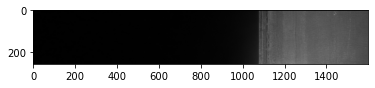

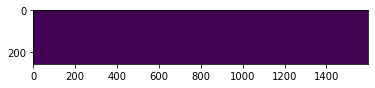

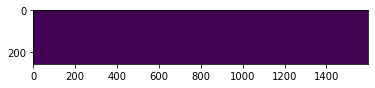

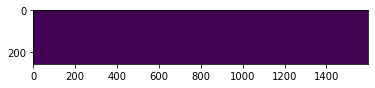

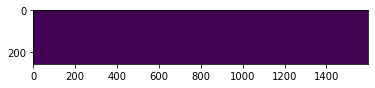

 10%|█         | 574/5506 [05:18<47:11,  1.74it/s]

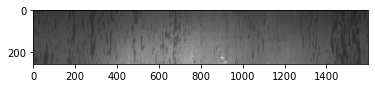

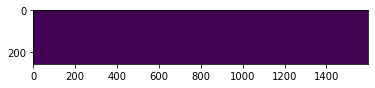

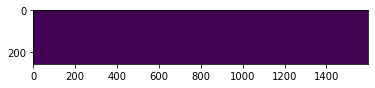

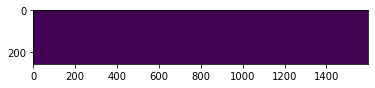

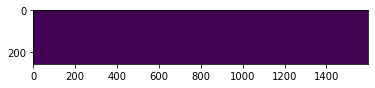

 10%|█         | 575/5506 [05:18<46:18,  1.77it/s]

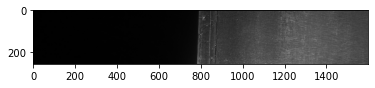

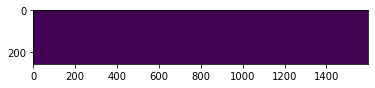

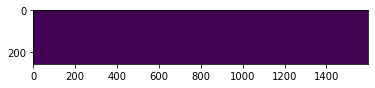

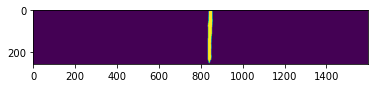

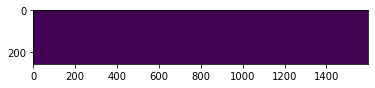

 10%|█         | 576/5506 [05:19<48:04,  1.71it/s]

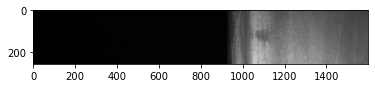

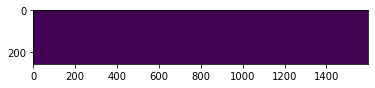

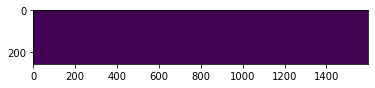

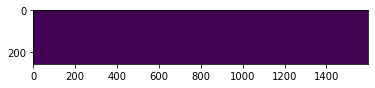

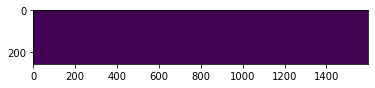

 10%|█         | 577/5506 [05:20<47:32,  1.73it/s]

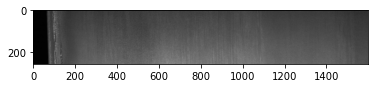

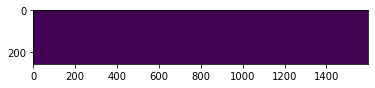

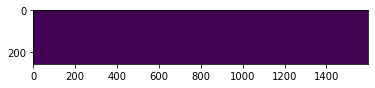

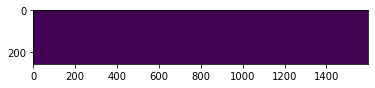

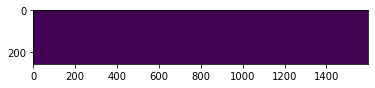

 10%|█         | 578/5506 [05:20<46:19,  1.77it/s]

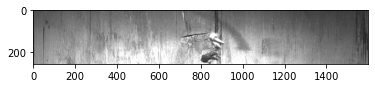

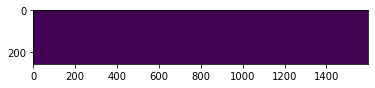

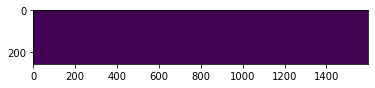

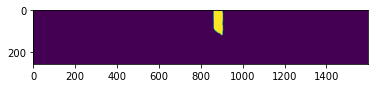

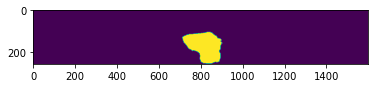

 11%|█         | 579/5506 [05:21<46:03,  1.78it/s]

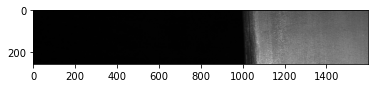

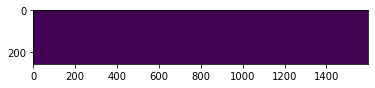

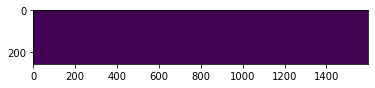

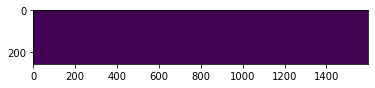

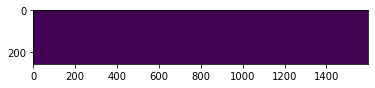

 11%|█         | 580/5506 [05:21<47:15,  1.74it/s]

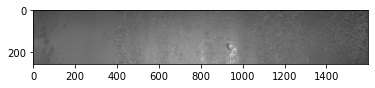

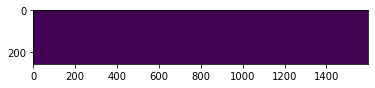

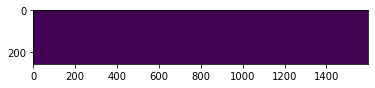

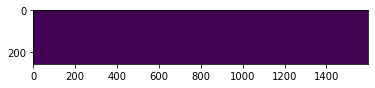

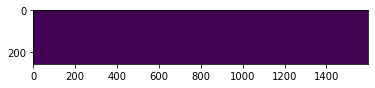

 11%|█         | 581/5506 [05:22<46:33,  1.76it/s]

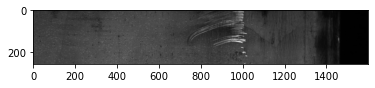

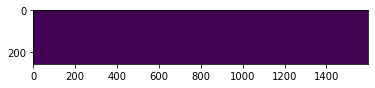

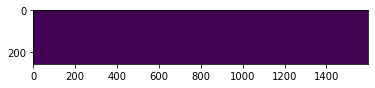

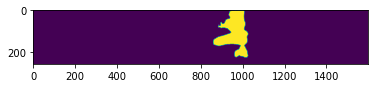

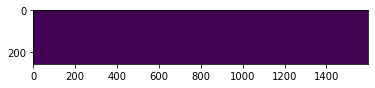

 11%|█         | 582/5506 [05:22<47:28,  1.73it/s]

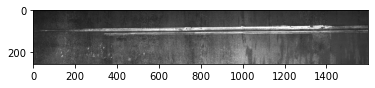

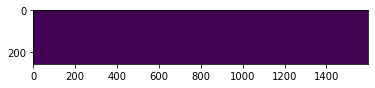

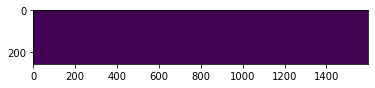

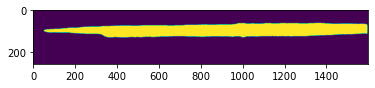

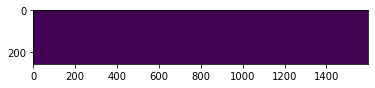

 11%|█         | 583/5506 [05:23<46:16,  1.77it/s]

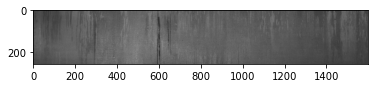

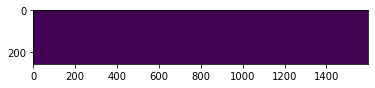

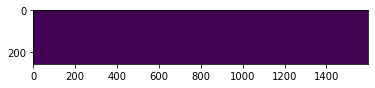

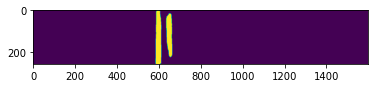

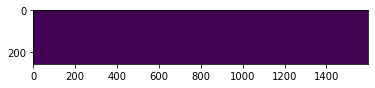

 11%|█         | 584/5506 [05:24<47:19,  1.73it/s]

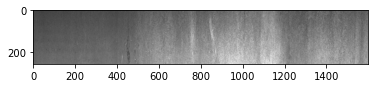

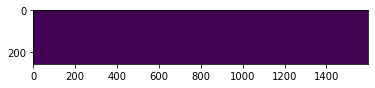

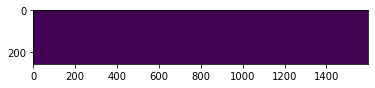

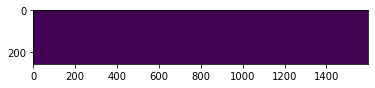

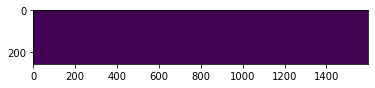

 11%|█         | 585/5506 [05:24<45:55,  1.79it/s]

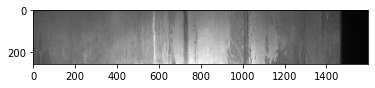

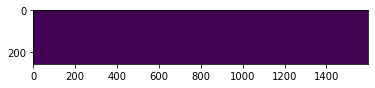

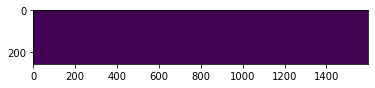

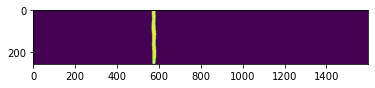

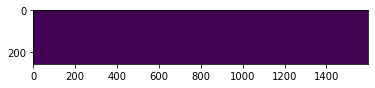

 11%|█         | 586/5506 [05:25<45:04,  1.82it/s]

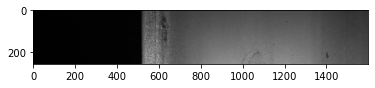

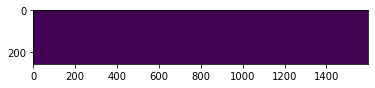

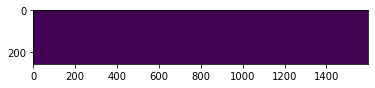

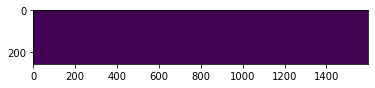

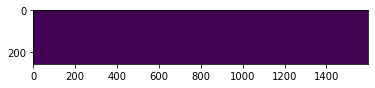

 11%|█         | 587/5506 [05:25<46:51,  1.75it/s]

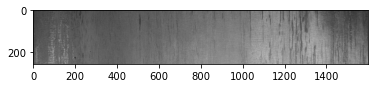

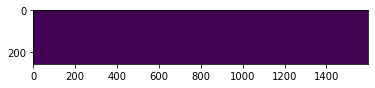

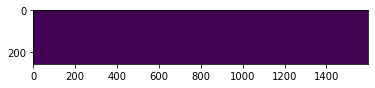

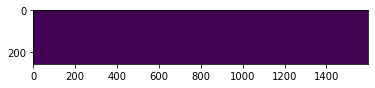

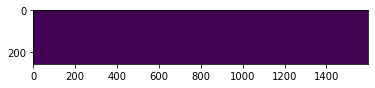

 11%|█         | 588/5506 [05:26<46:15,  1.77it/s]

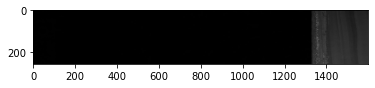

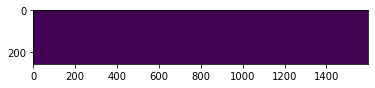

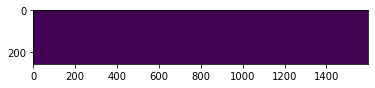

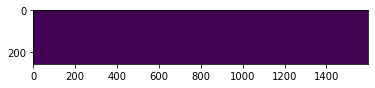

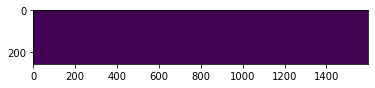

 11%|█         | 589/5506 [05:26<45:17,  1.81it/s]

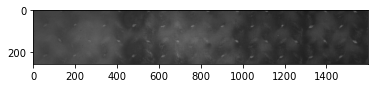

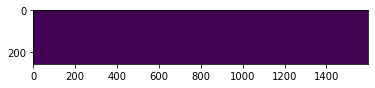

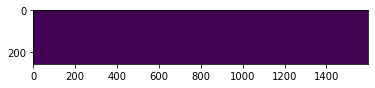

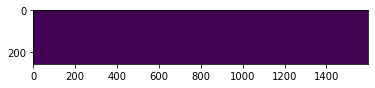

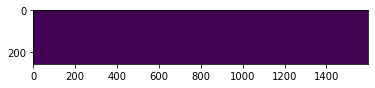

 11%|█         | 590/5506 [05:27<44:55,  1.82it/s]

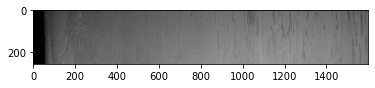

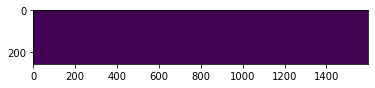

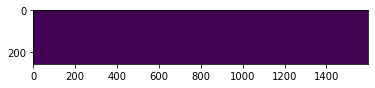

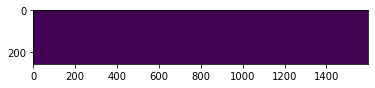

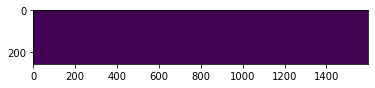

 11%|█         | 591/5506 [05:27<47:01,  1.74it/s]

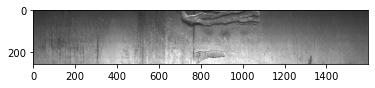

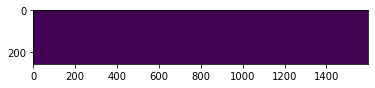

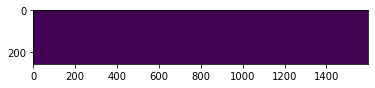

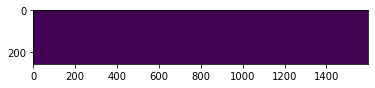

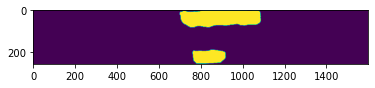

 11%|█         | 592/5506 [05:28<46:58,  1.74it/s]

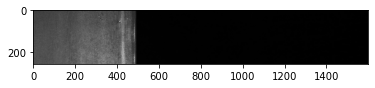

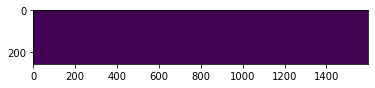

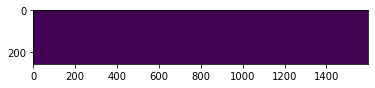

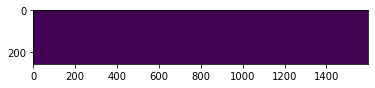

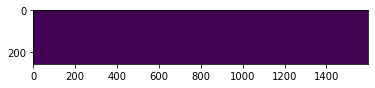

 11%|█         | 593/5506 [05:29<46:08,  1.77it/s]

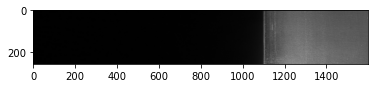

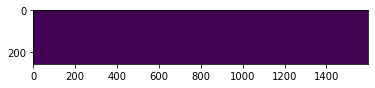

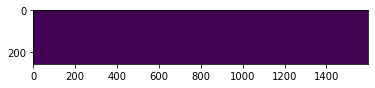

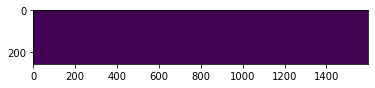

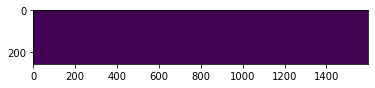

 11%|█         | 594/5506 [05:29<48:08,  1.70it/s]

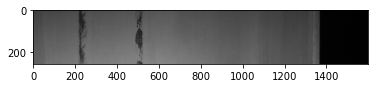

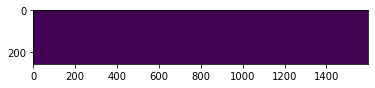

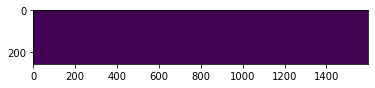

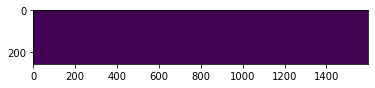

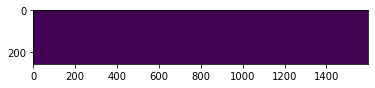

 11%|█         | 595/5506 [05:30<47:50,  1.71it/s]

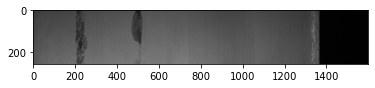

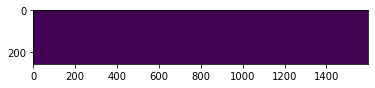

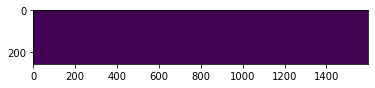

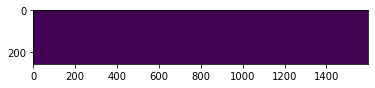

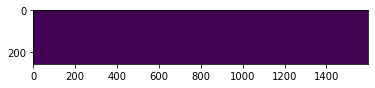

 11%|█         | 596/5506 [05:30<47:39,  1.72it/s]

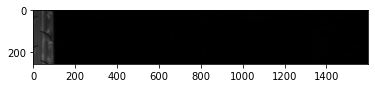

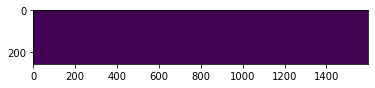

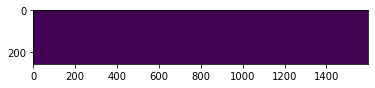

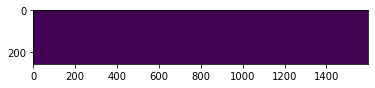

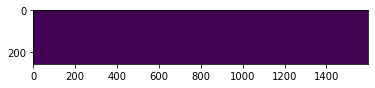

 11%|█         | 597/5506 [05:31<46:27,  1.76it/s]

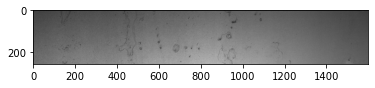

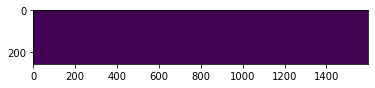

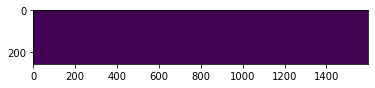

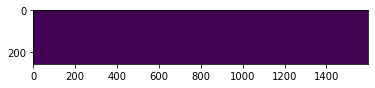

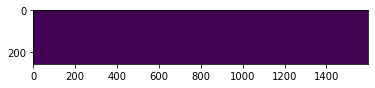

 11%|█         | 598/5506 [05:32<48:10,  1.70it/s]

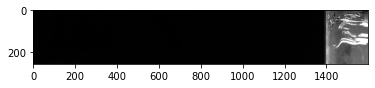

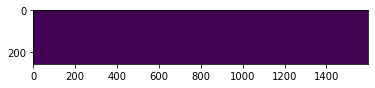

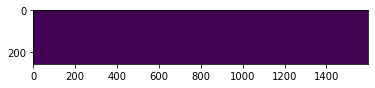

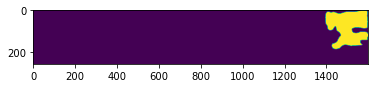

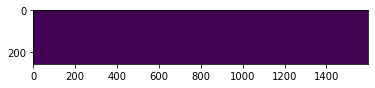

 11%|█         | 599/5506 [05:32<47:07,  1.74it/s]

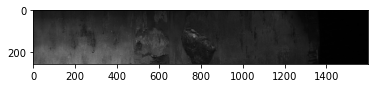

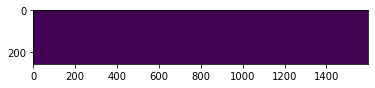

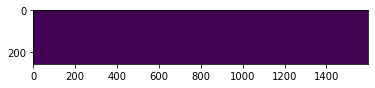

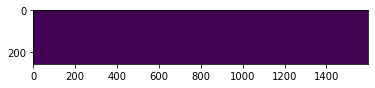

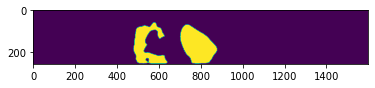

 11%|█         | 600/5506 [05:33<46:18,  1.77it/s]

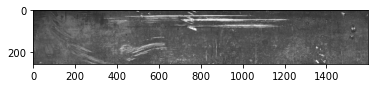

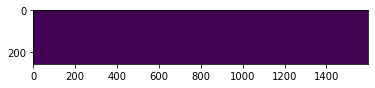

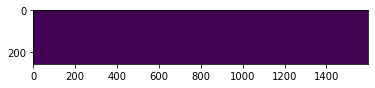

 11%|█         | 600/5506 [05:33<45:27,  1.80it/s]


KeyboardInterrupt: 

In [21]:
# start prediction
predictions = []
for i, batch in enumerate(tqdm(Dataset)):
    fnames, images = batch
    batch_preds = torch.sigmoid(model(images.to(device)))
    batch_preds = batch_preds.detach().cpu().numpy()
    for fname, preds in zip(fnames, batch_preds):
        input_image = cv2.imread(os.path.join(dataset_folder, fname))
        plt.imshow(input_image)
        plt.show()
        for cls, pred in enumerate(preds):
            pred, num = post_process(pred, best_threshold, min_size)
            plt.imshow(pred)
            plt.show()
            #rle = mask2rle(pred)
            #name = fname + f"_{cls+1}"
            #predictions.append([name, rle])

# save predictions to submission.csv
#df = pd.DataFrame(predictions, columns=['ImageId_ClassId', 'EncodedPixels'])
#df.to_csv("submission.csv", index=False)

(256, 1600, 3)


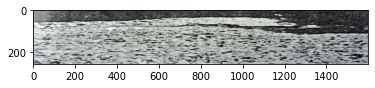

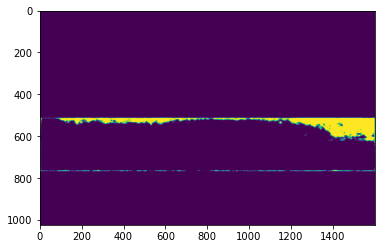

(256, 1600, 3)


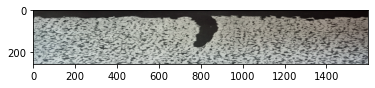

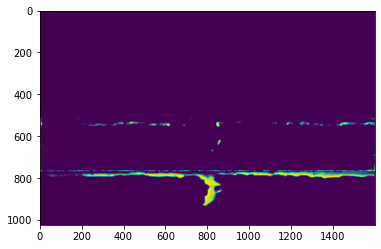

(256, 1600, 3)


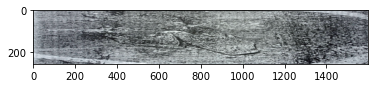

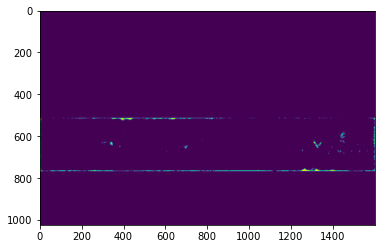

In [20]:
for k in range(7,10):
    img = cv2.imread(f"sample_images/{k}.jpg",k)
    img = cv2.resize(img,dsize=(1600,256),interpolation=cv2.INTER_AREA)
    print(img.shape)
    plt.imshow(img)
    plt.show()

    img = np.transpose(img, (2,0,1))
    img = np.expand_dims(img,0)
    img = torch.from_numpy(img)
    img = img.float()
    #print(img.shape)

    mask = torch.sigmoid(model(img.to(device)))
    mask = mask.squeeze().detach().cpu().numpy()
    mask = np.transpose(mask, (1,2,0))
    #print(mask.shape)
    plt.imshow(np.vstack((mask[:,:,0],mask[:,:,1],mask[:,:,2],mask[:,:,3])))
    #plt.imshow((mask[:,:,0]+mask[:,:,1]+mask[:,:,2]+mask[:,:,3]))
    plt.show()

(640, 480, 3)


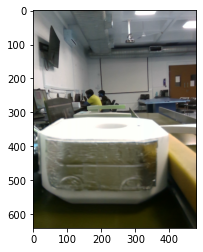

(256, 1600, 3)


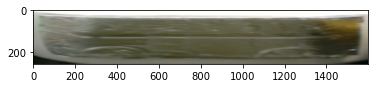

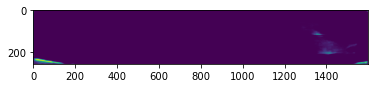

In [10]:
img = cv2.imread("sample_images/ok_color.png")
#img = img[:,:,::-1]
img = cv2.rotate(img, cv2.cv2.ROTATE_90_COUNTERCLOCKWISE)
print(img.shape)
plt.imshow(img)
plt.show()
img = img[360:550,30:370,:]
#plt.imshow(img)
#plt.show()

img = cv2.resize(img,dsize=(1600,256),interpolation=cv2.INTER_AREA)
print(img.shape)
plt.imshow(img)
plt.show()
img = np.transpose(img, (2,0,1))
img = np.expand_dims(img,0)
img = torch.from_numpy(img)
img = img.float()
#print(img.shape)

mask = torch.sigmoid(model(img.to(device)))
mask = mask.squeeze().detach().cpu().numpy()
mask = np.transpose(mask, (1,2,0))
#print(mask.shape)
#plt.imshow(np.vstack((mask[:,:,0],mask[:,:,1],mask[:,:,2],mask[:,:,3])))
plt.imshow((mask[:,:,0]+mask[:,:,1]+mask[:,:,2]+mask[:,:,3]))

plt.show()